# Objetivo del proceso a realizar				
## Objetivos del desafío 1			
- Efectuar una limpieza del dataset provisto. Particularmente, deberá diseñar estrategias para lidiar con los datos perdidos en ciertas variables.		
- Realizar un análisis descriptivo de las principales variables.		
- Crear nuevas columnas a partir de las características dadas que puedan tener valor predictivo.		

<a id="indice"></a> 
## Índice de la notebook

[1) Imports](#1)

[2) Análisis general del dataset](#2)

[3) Análisis de duplicados](#3)

[4) Análisis de columnas](#4)

[5) Análisis inicial de la distribución de los datos](#5)

[6) Análisis de consistencia y calidad de los datos](#6)

[7) Análisis EDA](#7)

[8) Análisis y operación sobre datos faltantes](#8)

[9) Limpieza y transformación de "rooms"](#9)

[10) Construcción de otras variables que podrían influir en el valor de inmueble](#10)

[11) Limpieza y transformación de número de piso](#11)

[12) Creamos el dataframe de trabajo para nuestro modelo de regression lineal](#12)

[13) Modelo de REGRESION LINEAL MULTIPLE](#13)


<a id="1"></a> 
### 1) Imports

[Ir a índice](#indice)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
%matplotlib inline

pd.set_option('display.float_format', lambda x: '%.3f' % x) # Evita la notacion cientifica
pd.set_option('display.max_columns', 500) # Ancho de cantidad de columnas
# pd.set_option('display.max_colwidth', None) #Ancho de lo que tiene dentro la columna

In [2]:
path = '~/Desktop/Data/properatti.csv'
dataset = pd.read_csv(path, sep = ",", index_col='Unnamed: 0')

In [3]:
df = dataset.copy()

<a id="2"></a> 
### 2) Analisis General del Data Set
[Ir a índice](#indice)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121220 entries, 0 to 121219
Data columns (total 25 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   operation                   121220 non-null  object 
 1   property_type               121220 non-null  object 
 2   place_name                  121197 non-null  object 
 3   place_with_parent_names     121220 non-null  object 
 4   country_name                121220 non-null  object 
 5   state_name                  121220 non-null  object 
 6   geonames_id                 102503 non-null  float64
 7   lat-lon                     69670 non-null   object 
 8   lat                         69670 non-null   float64
 9   lon                         69670 non-null   float64
 10  price                       100810 non-null  float64
 11  currency                    100809 non-null  object 
 12  price_aprox_local_currency  100810 non-null  float64
 13  price_aprox_us

Revisamos el porcentaje de nulos

In [5]:
df.isnull().sum()/df.shape[0]*100

operation                     0.000
property_type                 0.000
place_name                    0.019
place_with_parent_names       0.000
country_name                  0.000
state_name                    0.000
geonames_id                  15.441
lat-lon                      42.526
lat                          42.526
lon                          42.526
price                        16.837
currency                     16.838
price_aprox_local_currency   16.837
price_aprox_usd              16.837
surface_total_in_m2          32.443
surface_covered_in_m2        16.422
price_usd_per_m2             43.395
price_per_m2                 27.687
floor                        93.484
rooms                        60.906
expenses                     88.235
properati_url                 0.000
description                   0.002
title                         0.000
image_thumbnail               2.567
dtype: float64

Transformamos a category las variables currency state_name country_name place_with_parent_names place_name property_type operation.

Transformamos a string las variables title description properati_url


In [6]:
df.iloc[:,1:6]=df.iloc[:,1:6].astype('category')
df.iloc[:,22:25]=df.iloc[:,22:25].astype(str)
df['currency']=df.currency.astype('category')

In [7]:
df.dtypes

operation                       object
property_type                 category
place_name                    category
place_with_parent_names       category
country_name                  category
state_name                    category
geonames_id                    float64
lat-lon                         object
lat                            float64
lon                            float64
price                          float64
currency                      category
price_aprox_local_currency     float64
price_aprox_usd                float64
surface_total_in_m2            float64
surface_covered_in_m2          float64
price_usd_per_m2               float64
price_per_m2                   float64
floor                          float64
rooms                          float64
expenses                       float64
properati_url                   object
description                     object
title                           object
image_thumbnail                 object
dtype: object

<a id="3"></a> 
### 3) Analisis de duplicados
[Ir a índice](#indice)

Vamos a ver si tenemos inmuebles duplicados en nuetro dataset.

Definimos que tenemos un duplicado si coinciden las filas "price", "place_name", "title", "surface_total_in_m2"

In [8]:
df.duplicated(['price','place_name','title','surface_total_in_m2']).any()

True

Nos muestra que tenemos duplicados, vamos a estudiarlos

In [9]:
duplicados_mask=df.duplicated(['price','place_name','title','surface_total_in_m2'], keep=False)


df[duplicados_mask].sort_values(['price','place_name','title','surface_total_in_m2'])[:60]


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
47708,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vn_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/WOilGm5UnJ1yY0...
47715,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vw_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/RXmmPdghDy85Jc...
47717,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vy_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/RXmmPdghDy85Jc...
28938,sell,apartment,San Telmo,|Argentina|Capital Federal|San Telmo|,Argentina,Capital Federal,3428113.000,"-34.6234536,-58.3764477",-34.623,-58.376,22400.000,USD,395236.800,22400.000,13.000,0.000,1723.077,NaN,NaN,NaN,1800.000,http://www.properati.com.ar/17xm3_venta_depart...,"Departamento de 2 ambientes, con bajo mesada, ...",Departamento - San Telmo,https://thumbs4.properati.com/4/mvGoVviheZmfXv...
88036,sell,apartment,San Telmo,|Argentina|Capital Federal|San Telmo|,Argentina,Capital Federal,3428113.000,"-34.6234817427,-58.3764730084",-34.623,-58.376,22400.000,USD,395236.800,22400.000,13.000,NaN,1723.077,NaN,NaN,NaN,1800.000,http://www.properati.com.ar/1b6q5_venta_depart...,"Departamento de 2 ambientes, con bajo mesada, ...",Departamento - San Telmo,https://thumbs4.properati.com/0/MNoZTpXQpRO_rP...
48580,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-37.9541351,-57.5374449",-37.954,-57.537,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19ado_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/2/IVRHc8WDSxe45O...
48581,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-37.9541351,-57.5374449",-37.954,-57.537,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19adp_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/2/IVRHc8WDSxe45O...
48588,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-38.416097,-63.616672",-38.416,-63.617,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19ae1_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/3/eHvASCTC2qj_Ev...
94684,sell,store,Lanús,|Argentina|Bs.As. G.B.A. Zona Sur|Lanús|Lanús|,Argentina,Bs.As. G.B.A. Zona Sur,NaN,NaN,NaN,NaN,27000.000,USD,476401.500,27000.000,19.000,1.000,1421.053,27000.000,NaN,NaN,NaN,http://www.properati.com.ar/1bfyn_venta_local_...,Local Comercial de 3 x 6.50.-Gastos de escritu...,Local en Lanús Oeste,https://thumbs4.properati

Luego de observar el dataframe de duplicados, podemos comprobar que efectivamente lo son, asi que procedemos a dropearlos.

In [10]:
df = df.drop_duplicates(['price','place_name','title','surface_total_in_m2'])


Verificamos que todas las propiedades provistas estan para la venta, y ninguna en renta, con lo cual la columna 'operation' no nos aporta mucha informacion.

In [11]:
df.operation.unique()

array(['sell'], dtype=object)

Vamos a revisar los valores estadisticos de las variables numericas de nuestro Dataset

In [12]:
cols=['price','price_aprox_local_currency','price_aprox_usd','surface_total_in_m2','surface_covered_in_m2','price_usd_per_m2','price_per_m2']
df[cols].describe()

,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2
count,94699.000,94699.000,94699.000,74106.000,91858.000,64887.000,82363.000
mean,465578.488,4287216.602,242977.506,242.941,137.460,2141.952,6772.532
std,2307937.712,7044238.337,399231.394,1739.620,759.461,2744.342,28822.614
min,0.000,0.000,0.000,0.000,0.000,0.600,1.510
25%,110000.000,1588005.000,90000.000,51.000,46.000,1200.000,1534.942
50%,185000.000,2579925.850,146217.000,88.000,77.000,1795.455,2200.000
75%,420000.000,4764015.000,270000.000,214.000,157.000,2481.481,3333.333
max,650000000.000,821271104.300,46545445.000,200000.000,187000.000,206333.333,3999999.960


Aca podemos observar algunos valores extraños en el data set:

* El valor minimo de superficie total, es 0.

* El valor minimo de venta es 0.

* El valor maximo de superficie llega a 20 hectareas


<a id="4"></a> 
### 4) Analisis de columnas
[Ir a índice](#indice)

**Analisis Descriptivo de las principales variables:**

Podemos separar a nuestras variables en 3 grandes grupos por su tipo:

Variables georeferenciales:

* geonames_id                  
* lat-lon                       
* lat                           
* lon                           

Variables relacionadas con el precio del inmueble: 

* price_per_m2: Es nuestra variable objetivo, es la que vamos a querer predecir en la siguiente etapa del trabajo, nos representa el precio por metro cuadrado del inmueble.VARIABLE CONTINUA

* price_usd_per_m2: Esta variable nos indica el valor en dolares por metro cuadrado del inmueble publicado.VARIABLE CONTINUA

* price: Esta variable nos indica el precio del inmueble expresado en la moneda "currency".VARIABLE CONTINUA

* price_aprox_local_currency: Nos dice el precio aproximado del inmueble en la moneda que esta (currency).VARIABLE CONTINUA

* price_aprox_usd: Nos dice el precio del inmueble en USD.VARIABLE CONTINUA

* currency: Esta variable nos indica la moneda en la que se publico el inmueble, puede valer (usd,ars,uyu,pen).VARIABLE CATEGORICA

Variables relacionadas con el tamaño del inmueble:

* surface_total_in_m2: Esta variable nos indica los metros cuadrados totales de la propiedad publicada.VARIABLE CONTINUA

* surface_covered_in_m2: Esta variable nos indica los metros cuadrados cubiertos de la propiedad publicada.VARIABLE CONTINUA

Variables que nos dan informacion sobre el lugar donde se encuentra la propiedad

* property_type: Nos indica el tipo de propiedad publicada (ph, apartment, house, store).VARIABLE CATEGORICA

* place_name: Nos indica el barrio(si es dentro de CABA) o localidad, de donde esta la propiedad publicada.VARIABLE CATEGORICA

* state_name: Nos indica la provincia en donde se encuentra la propiedad publicada.VARIABLE CATEGORICA

* place_with_parent_names: Es una combinacion de place_name y state_name, en algunos casos, con algunos datos mas sobre la ubicacion, como el partido. place_with_parent_names = |country_name|state_name|place_name|.VARIABLE CATEGORICA

Variables relacionadas con caracteristicas del inmueble:

* floor: Numero de piso en donde esta ubicado el inmueble(en caso de corresponder).VARIABLE CUALITATIVA ORDINAL

* rooms: Esta variable nos indica la cantidad de ambientes que posee el inmueble.VARIABLE CATEGORICA

* expenses: Valor de las expensas del inmueble (en caso de corresponder).VARIABLE CONTINUA

* title: Un breve titulo sobre la propiedad que esta a la venta.

* description: Una breve descripcion sobre la propiedad en venta.

* operation: Nos dice el tipo de operacion que sea desea realizar con la propieda (solo se registran propiedades a la venta en el dataset).VARIABLE CATEGORICA

* properaty_url: Direccion web de la publicacion del inmueble.

* image_thumbnail: Direccion web de la imagen a la propiedad publicada.


<a id="5"></a> 
### 5) Análisis inicial de la distribución de los datos
[Ir a índice](#indice)

In [13]:
#Para evitar problemas con los strings, convertimos todo el df en minuscula y eliminamos los ".".
df = df.applymap(lambda x: x.lower() if type(x) is str else x)

df = df.replace('\.',"",regex=True)


Droppeamos valores ilogicos, por ejemplo que un valor de superficie total sea menor que el de superficie cubierta, que la superficie total valga 0, o que el precio de venta sea 0

In [14]:
sup_total_incorrecta = np.logical_or(df['surface_total_in_m2'] < df['surface_covered_in_m2'], df['surface_total_in_m2']==0)

df_sup_total_incorrecta=df[sup_total_incorrecta]
df_sup_total_incorrecta.shape

(1398, 25)

In [15]:
df.drop(index=df_sup_total_incorrecta.index, inplace=True)

In [16]:
df[sup_total_incorrecta]

<ipython-input-16-b1fafb12e45e>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[sup_total_incorrecta]


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail


In [17]:
precio_incorrecto = df[df.price == 0]
precio_incorrecto

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
9761,sell,house,córdoba,|argentina|córdoba|,argentina,córdoba,3860255.000,"45458426,-7567893099",4.546,-75.679,0.000,NaN,0.000,0.000,NaN,NaN,NaN,NaN,2.000,3.000,NaN,http://wwwproperaticomar/165i3_venta_casa_cord...,casa en venta de 2 dorm en armenia,se vende casa en el barrio el limonar,https://thumbs4properaticom/2/2hubkpzv0rywdaaj...


In [18]:
df.drop(index = precio_incorrecto.index ,inplace= True)

Dropeamos propiedades falsas

In [19]:
patron_falsas = re.compile(r'estas(\s)?propiedades(\s)?son(\s)?falsas')

encuentra_falsas = df.description.apply(lambda x: re.search(patron_falsas,str(x)))
falsas_mask=encuentra_falsas.notnull()
index_maldad=encuentra_falsas[falsas_mask].index

df = df.drop(index_maldad)

Dropeamos departamentos que tengan mas de 750 m2 (limite tomado a partir de publicaciones de zonaprop), y los que tengan menos de 18 m2(minimo permitido)

In [20]:
departamentos_fueradeumbral = \
df[np.logical_and(df.property_type=='apartment',np.logical_or(df.surface_total_in_m2>750, df.surface_total_in_m2<18))].index

In [21]:
df = df.drop(index =departamentos_fueradeumbral)

Dropeamos inmuebles que sean ventas de pozo, o para inversion, inmuebles que aun no fueron construidos, y por eso tienen un precio "promocionado"

In [22]:
patron_pozo = re.compile(r'pozo|inversion|financiacion|pre-venta|en(\s)?construccion|entrega|cuotas|emprendimiento|a(\s)?desarrollarse|proyecto')

encuentra_pozo = df.description.apply(lambda x: re.search(patron_pozo,str(x)))
                                      
pozo_mask=encuentra_pozo.notnull()

pozo = encuentra_pozo[pozo_mask].apply(lambda x: x.group())
print(df.shape)
df = df.drop(index = pozo.index)
print(df.shape)

patron_pozo = re.compile(r'pozo|inversion|financiacion|pre-venta|en(\s)?construccion|entrega|cuotas|emprendimiento|a(\s)?desarrollarse|proyecto')

encuentra_pozo = df.title.apply(lambda x: re.search(patron_pozo,str(x)))
                                      
pozo_mask=encuentra_pozo.notnull()

pozo = encuentra_pozo[pozo_mask].apply(lambda x: x.group())
print(df.shape)
df = df.drop(index = pozo.index)
print(df.shape)

(107839, 25)
(87535, 25)
(87535, 25)
(86869, 25)


In [23]:
df[df.place_name=='capital federal'].title[:5]

108    casa 180m² con 2 plantas en navarro, julián 29...
110    casa 744m² con 2 plantas en del valle iberluce...
115    casa 720m² con plantas en palma, diego 1800, a...
119    casa 200m² con cochera en barbosa, gerónimo 14...
121    casa 340m² con cochera en palma, diego 1300, a...
Name: title, dtype: object

In [24]:
place_names=list(df[df.state_name=='capitalfederal'].place_name.unique())

In [25]:
df["PLACE NAME"]=df.place_name

df_capitalfederal_mal_cargado = df[df.place_name=='capital federal']

for place in place_names:
    patron_placenames = re.compile(str(place))
    encuentra_names = df_capitalfederal_mal_cargado.description.apply(lambda x: re.search(patron_placenames,str(x)))
    encuentra_names_mask = encuentra_names.notnull()
    names = encuentra_names[encuentra_names_mask].apply(lambda x: x.group())
    df.loc[names.index,'PLACE NAME']=names
    
for place in place_names:
    patron_placenames = re.compile(str(place))
    encuentra_names = df_capitalfederal_mal_cargado.title.apply(lambda x: re.search(patron_placenames,str(x)))
    encuentra_names_mask = encuentra_names.notnull()
    names = encuentra_names[encuentra_names_mask].apply(lambda x: x.group())
    df.loc[names.index,'PLACE NAME']=names


Eliminamos los pocos registros que no tenian informacion sobre su ubicacion y estaban mal ingresados.

In [26]:
df_mal_ingresados = df[df["PLACE NAME"]=='capital federal']
df_mal_ingresados.shape[0]
df_mal_ingresados_index = df_mal_ingresados.index

In [27]:
df = df.drop(df_mal_ingresados_index)

Separamos las columnas que consideramos tengan alguna relacion con el precio_per_m2 o nos puedan brindar informacion util 

In [28]:
cols_utiles_sin_price=['property_type','PLACE NAME','place_with_parent_names','state_name','currency'\
            ,'price_aprox_local_currency','price_aprox_usd','surface_total_in_m2','surface_covered_in_m2'\
            ,'price_usd_per_m2','price_per_m2','floor','rooms','expenses','description']

In [29]:
groupby_property_type=df.groupby('property_type')[cols_utiles_sin_price].median()
groupby_property_type

,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
property_type,,,,,,,,,
apartment,2117340.000,120000.000,61.000,55.000,2146.552,2537.037,3.000,2.000,1800.000
house,4146457.500,235000.000,283.000,180.000,1038.462,1506.024,2.000,4.000,4800.000
ph,2117340.000,120000.000,98.000,75.000,1306.818,1703.203,2.000,3.000,500.000
store,3617122.500,205000.000,167.500,120.000,1555.556,1931.034,1.000,1.000,1111.000


Dado que 'price', depende del valor de currency, si esta en usd o en ars, vamos a calcularlos por separados, para no crear un bias.

In [30]:
groupby_property_type_price_usd=df[df.currency=='usd'].groupby('property_type')['price'].median()
groupby_property_type_price_ars=df[df.currency=='ars'].groupby('property_type')['price'].median()

groupby_property_type['price_usd']=groupby_property_type_price_usd
groupby_property_type['price_ars']=groupby_property_type_price_ars
groupby_property_type['cant de propiedades']=df.groupby('property_type')['operation'].count()

groupby_property_type

,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,price_usd,price_ars,cant de propiedades
property_type,,,,,,,,,,,,
apartment,2117340.000,120000.000,61.000,55.000,2146.552,2537.037,3.000,2.000,1800.000,129000.000,1360500.000,43916
house,4146457.500,235000.000,283.000,180.000,1038.462,1506.024,2.000,4.000,4800.000,250000.000,1400000.000,33732
ph,2117340.000,120000.000,98.000,75.000,1306.818,1703.203,2.000,3.000,500.000,123000.000,1020000.000,4934
store,3617122.500,205000.000,167.500,120.000,1555.556,1931.034,1.000,1.000,1111.000,230000.000,900000.000,3384


In [31]:
df_toplot=groupby_property_type.reset_index()

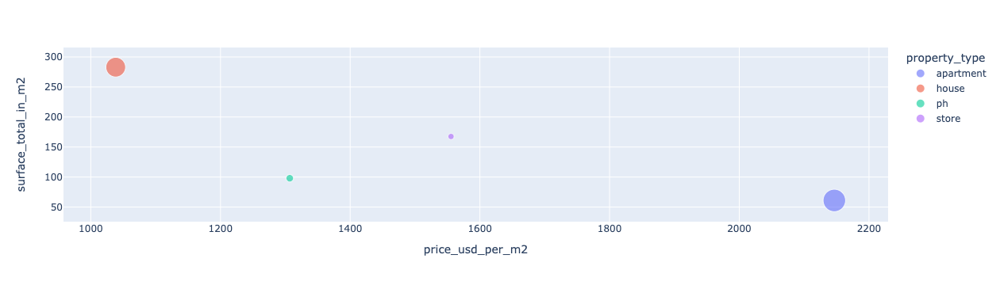

In [32]:
fig = px.scatter(data_frame = df_toplot, x = "price_usd_per_m2", y = "surface_total_in_m2",
                 size = "cant de propiedades", color = "property_type", opacity = 0.6)
fig.show()


Al agrupar las propiedades por su tipo, podemos realizar las siguientes observaciones:

*  Las casas son las propiedades que tienen el precio mas bajo en relacion a sus metros cuadrados.

*  Los departamentos son las propiedades que mayor valor por metro cuadrado tienen.

*  La mayoria de los inmuebles publicados son departamentos, seguidos por las casas.

In [33]:
groupby_provincia_price_usd=df[df.currency=='usd'].groupby('state_name')['price'].median()
groupby_provincia_price_ars=df[df.currency=='ars'].groupby('state_name')['price'].median()

groupby_provincia=df.groupby('state_name')[cols_utiles_sin_price].median()

groupby_provincia['price_usd']=groupby_provincia_price_usd
groupby_provincia['price_ars']=groupby_provincia_price_ars
groupby_provincia['cant de propiedades']=df.groupby('state_name')[cols_utiles_sin_price].count().property_type


groupby_provincia=groupby_provincia.sort_values('cant de propiedades',ascending=False)
groupby_provincia


,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,price_usd,price_ars,cant de propiedades
state_name,,,,,,,,,,,,
capital federal,2911342.500,165000.000,71.000,63.000,2407.550,2675.000,4.000,3.000,2116.000,166000.000,1708708.500,20904
bsas gba zona norte,4234680.000,240000.000,192.000,139.000,1583.333,1928.571,3.000,3.000,4000.000,245000.000,2283400.000,18962
bsas gba zona sur,2521399.050,142900.000,132.000,102.000,1409.091,1592.920,3.000,3.000,1500.000,145000.000,1020000.000,10853
córdoba,1830701.560,103754.800,90.000,100.000,1153.846,2754.717,1.000,3.000,1400.000,165000.000,1350000.000,8654
buenos aires costa atlántica,1764450.000,100000.000,75.000,69.000,1578.947,1702.128,4.000,3.000,1500.000,100000.000,1770000.000,8558
bsas gba zona oeste,2117340.000,120000.000,173.000,94.000,1125.000,1545.455,3.000,3.000,800.000,120000.000,750000.000,7428
santa fe,1499782.500,85000.000,70.000,62.000,1518.557,14000.000,3.000,3.000,800.000,129000.000,1300000.000,4968
buenos aires interior,2293785.000,130000.000,249.500,120.000,748.891,1375.000,3.000,4.000,1200.000,150000.000,1100000.000,1797
río negro,2823120.000,160000.000,175.000,125.000,1400.000,2441.667,4.000,4.000,600.000,180000.000,1100000.000,566


In [34]:
groupby_provincia_toplot=groupby_provincia.reset_index()

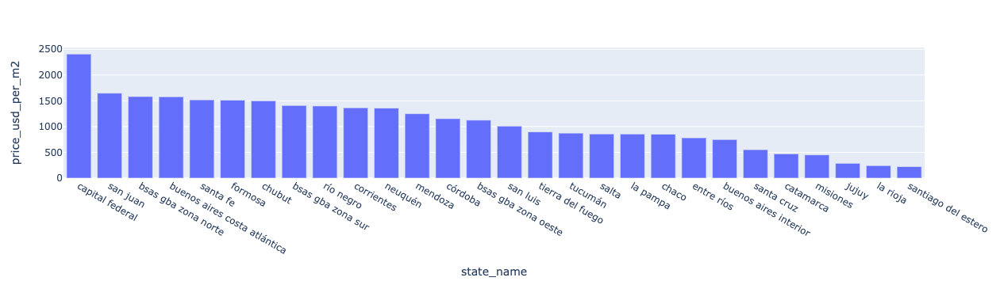

In [35]:
fig = px.bar(groupby_provincia_toplot, x="state_name", y="price_usd_per_m2",  barmode='stack')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)

fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}) #Ordena manera decreciente


fig.show()

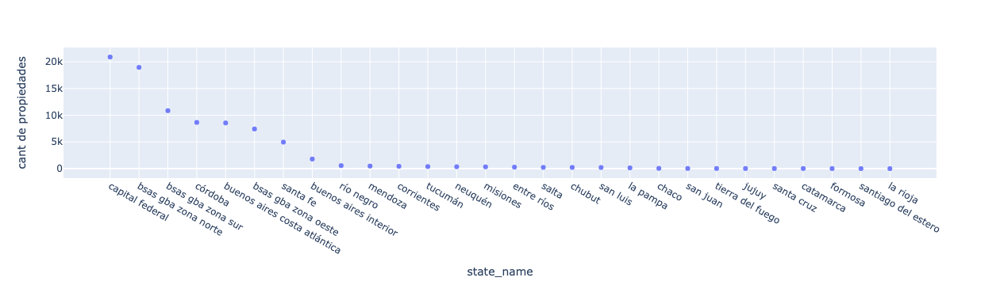

In [36]:
fig = px.scatter(data_frame = groupby_provincia_toplot, y = "cant de propiedades", x = "state_name", opacity = 0.9)
fig.show()

Al agrupar las propiedades por provincia, podemos realizar las siguientes observaciones:

*  Las propiedades que se encuentran en capital federal, son las que tienen un precio por metro cuadrado en usd mas alto.

*  La mayor cantidad de propiedades en venta, se encuentran en capital federal, salvo que juntemos todas las subdivisiones de      provincia de buenos aires, en ese caso, seria la Provincia de Buenos Aires, la que ofrece mayor cantidad.


<a id="6"></a> 
### 6) Analisis de consistencia y calidad de los datos
[Ir a índice](#indice)

### PLACE_WITH_PARENT_NAMES

place_with_parent_names = |country_name|state_name|place_name|, con lo cual, no nos da informacion extra, y es mas facil utilizar para los groupby sus columnas "hijas", con lo cual, la utilizaremos para completar "place_name" y "Provincia, que tiene algunos nulos y luego la descartaremos.


Vamos a comprobar si podemos completar place_name, con place_with_parent_names. Para esto, vamos a eliminar las filas donde haya NaN en place_name y comparar si es igual al anteultimo elemento de place_with_parent_names, al aplicarle un split(el ultimo es el pipe).

In [37]:
place_name_tester=df.place_with_parent_names.apply(lambda x: x.split('|')[-2])
place_name_tester

0           mataderos
1            la plata
2           mataderos
3             liniers
4              centro
             ...     
121213       martínez
121214     san isidro
121215       belgrano
121216         beccar
121218    plaza colón
Name: place_with_parent_names, Length: 85966, dtype: object

In [38]:
place_name_null_mask = df.place_name.isnull()

In [39]:
(place_name_tester[~place_name_null_mask]==df.place_name[~place_name_null_mask]).all()

True

Comprobamos que podemos imputar el valor de place_name , a partir de la columna place_with_parent_names, asi que vamos a imputarlo, creando una nueva columna, que utilice la informacion de los registros anteriores

In [40]:
serie_nulos_PLACE_NAME=df['PLACE NAME'].isnull().sum()

In [41]:
df.loc[place_name_null_mask,'PLACE NAME']=place_name_tester

serie_nulos_PLACE_NAME2=df['PLACE NAME'].isnull().sum()

Nota: Esto ocurre para todos los casos salvo para cuando la propiedad esta radicada en mar del plata

In [42]:
dataset[dataset.state_name=='Buenos Aires Costa Atlántica']['place_with_parent_names'].values

array(['|Argentina|Buenos Aires Costa Atlántica|Mar del Plata|Centro|',
       '|Argentina|Buenos Aires Costa Atlántica|Mar del Plata|',
       '|Argentina|Buenos Aires Costa Atlántica|Mar del Plata|', ...,
       '|Argentina|Buenos Aires Costa Atlántica|Villa Gesell|',
       '|Argentina|Buenos Aires Costa Atlántica|Mar del Plata|Punta Iglesia|',
       '|Argentina|Buenos Aires Costa Atlántica|Mar del Plata|Plaza Colón|'],
      dtype=object)

In [43]:
df_mardelplata_centro=df[np.logical_and(df.state_name!='capital federal', df['PLACE NAME']=='centro')]

df.loc[df_mardelplata_centro.index,'PLACE NAME'] = 'mar del plata'

In [44]:
patron_microcentro = re.compile(r'centro')

encontra_microcentro = df['PLACE NAME'].apply(lambda x: re.match(patron_microcentro,str(x)))

encontra_microcentro_mask = encontra_microcentro.notnull()

index_microcentro=encontra_microcentro[encontra_microcentro_mask].index

df.loc[index_microcentro,'PLACE NAME']='centro/microcentro'

## surface_covered_in_m2

Vamos a imputar los valores NaN de surface_covered_in_m2, con informacion que encontremos el la variable description y ponerlos en una nueva columna que llamaremos SUPERFICIE CUBIERTA EN M2

Vamos a imputar valores de surface_covered_in_m2, a partir de datos obtenidos de la columna description

Para lo que es superficie cubierta, utilizamos un criterio para acotar de 404.9m2 maximo(quantile 90) y 65m2, como minimo(quantile 10)

In [45]:
df['SUPERFICIE CUBIERTA EN M2']=df.surface_covered_in_m2

surface_covered_in_m2_null_mask=df.surface_covered_in_m2.isna()
patron_superficie_cubierta = re.compile(r'(cub(:)?\d+(m²|m2))|((cubierta|cub)(de)?(\d+))((m²|m2))|\d+(m²|m2)(cub)')

encuentra_superficie_cubierta = df.loc[surface_covered_in_m2_null_mask,'description'].apply(lambda x: re.search(patron_superficie_cubierta,str(x)))

encuentra_superficie_cubierta_mask=encuentra_superficie_cubierta.notnull()

superficie_cubierta=encuentra_superficie_cubierta[encuentra_superficie_cubierta_mask].apply(lambda x: x.group())

patron_limpiame_sup_cubierta = re.compile(r'\d+')
limpiame_sup_cubierta = superficie_cubierta.apply(lambda x: re.search(patron_limpiame_sup_cubierta,str(x)))

superficie_cubierta_str=limpiame_sup_cubierta.apply(lambda x: x.group())

superficie_cubierta_int = superficie_cubierta_str.astype(int)

superficie_cubierta_int_acotado_mask = np.logical_and(superficie_cubierta_int < superficie_cubierta_int.quantile(0.9),superficie_cubierta_int > superficie_cubierta_int.quantile(0.1))

superficie_cubierta_int_acotado=superficie_cubierta_int[superficie_cubierta_int_acotado_mask]

In [46]:
df.loc[surface_covered_in_m2_null_mask,'SUPERFICIE CUBIERTA EN M2'] = superficie_cubierta_int_acotado

## surface_total_in_m2

Vamos a completar valores a partir de datos que aparecen en description, creando una nueva columna llamada SUPERFICIE TOTAL EN M2

Utilizamos como criterio para acotar, el valor maximo de superficie total de 700m2(q3), y como minimo 44m2

Elegimos acotar los valores obtenidos con Regex, para no generar un bias, a partir de datos erroneos que haya tomado el patron.

In [47]:
df['SUPERFICIE TOTAL EN M2']=df.surface_total_in_m2

surface_total_in_m2_null_mask=df.surface_total_in_m2.isna()

patron_superficie_total = re.compile(r'(sup(\s)?cub(:)?(\s)?\d+(m²|m2|mts2))|((cubierta|cub)(\s)?(de)?(\s)?(\d+))((m²|m2|mts2))|\d+(\s)?(m²|m2|mts2)(\s)?(cub)|\d+\d+?(m²|m2|mts2)')

encuentra_superficie_total = df.loc[surface_total_in_m2_null_mask,'description'].apply(lambda x: re.search(patron_superficie_total,str(x)))

encuentra_superficie_total_mask=encuentra_superficie_total.notnull()

superficie_total_y_cubierta=encuentra_superficie_total[encuentra_superficie_total_mask].apply(lambda x: x.group())

patron_cubierta = re.compile(r'cub')

valores_sup_cubierta=superficie_total_y_cubierta.apply(lambda x:re.search(patron_cubierta,str(x)))

superficie_total=superficie_total_y_cubierta[valores_sup_cubierta.isnull()]


superficie_total_sin_m2=(superficie_total.replace('(m²|m2|mts2)','', regex=True))

superficie_total_int = superficie_total_sin_m2.astype(int)
superficie_total_int_acotado_mask = np.logical_and(superficie_total_int < superficie_total_int.quantile(0.8), superficie_total_int > superficie_total_int.quantile(0.2))

superficie_total_int_acotado=superficie_total_int[superficie_total_int_acotado_mask]



In [48]:
df.loc[surface_total_in_m2_null_mask,'SUPERFICIE TOTAL EN M2'] = superficie_total_int_acotado


## PRICE USD POR M2

El precio price_usd_per_m2, coincide con price/surface_covered_in_m2, cuando currency ==usd, para esto nos vamos a crear una nueva columna llamada PRECIO USD POR M2

In [49]:
df_dolares = df[df.currency=='usd']

df['PRECIO USD POR M2']=df_dolares[['price','surface_total_in_m2']].apply(lambda x: 0 if x.surface_total_in_m2 == 0 else x.price/x.surface_total_in_m2, axis=1)


In [50]:
df[['price_usd_per_m2','PRECIO USD POR M2']].sample(20)

,price_usd_per_m2,PRECIO USD POR M2
109266,NaN,NaN
69294,NaN,NaN
20278,210.890,NaN
62712,NaN,NaN
31284,NaN,NaN
43118,1905.172,1905.172
52213,NaN,NaN
35100,NaN,NaN
20528,NaN,NaN
110145,NaN,NaN


In [51]:
df['PRECIO USD POR M2'].notnull().sum()

45046

In [52]:
df['price_usd_per_m2'].notnull().sum()

49158

Como PRECIO USD POR M2 es igual que price_usd_per_m2, vamos a imputar los valores que podamos de PRECIO USD POR M2 con price_usd_per_m2

In [53]:
PRECIO_USD_POR_M2_null = df['PRECIO USD POR M2'].isna()

df.loc[PRECIO_USD_POR_M2_null,'PRECIO USD POR M2'] = df.loc[PRECIO_USD_POR_M2_null,'price_usd_per_m2']

### PRICE

#### Los precios estan en distintas monedas.

In [54]:
df.currency.value_counts()

usd    67135
ars     7031
uyu        1
Name: currency, dtype: int64

##### Primero, vamos a estudiar los casos donde currency vale pen y uyu

In [55]:
df_currency_uyu=df[df.currency=='uyu']
df_currency_uyu.description.values

array(['casa con calefacción central, mendoza, san roque, por $ 650000000'],
      dtype=object)

In [56]:
df_currency_uyu

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2
107390,sell,house,san roque,|argentina|mendoza|san roque|,argentina,mendoza,3836586.000,NaN,NaN,NaN,650000000.000,uyu,405477284.730,22980378.290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1by0s_venta_casa_san-...,"casa con calefacción central, mendoza, san roq...",casa - san vicente,https://thumbs4properaticom/2/pa0rbudkrk6ggvfy...,san roque,NaN,NaN,NaN


In [57]:
#Dado que el valor esta en otra moneda y nos parece una suma ilogica el precio, vamos a dropearlo
df = df.drop(index = df_currency_uyu.index)


**Ahora vamos a comprobar si columnas como 'price_aprox_local_currency' y 'price_aprox_usd' ,tienen alguna utilidad para nosotros, o la informacion que nos dan, las tenemos contenidas en otras columnas**

## 'price_aprox_local_currency', 'price_aprox_usd',

In [58]:
df[['price_aprox_local_currency','price_aprox_usd','price','currency']].sample(5)

,price_aprox_local_currency,price_aprox_usd,price,currency
4534,5293350.000,300000.000,300000.000,usd
60037,NaN,NaN,NaN,NaN
64930,NaN,NaN,NaN,NaN
76641,4764015.000,270000.000,270000.000,usd
105785,1662474.840,94220.570,1680000.000,ars


Observando el dataset, vemos que price_aprox_local_currency(ars), se aproxima al valor de price, cuando currency esta en 'ars'

Tambien vemos que price_aprox_usd, coincide con el valor de price, cuando currency esta en 'usd'.


In [59]:
ars_mask = df.currency == 'ars'

df_ars=df[ars_mask]

rel = df_ars.price/df_ars.price_aprox_local_currency
relacion = rel.mean()
relacion

1.009915671255779

*Observamos que la relacion entre price y price_aprox_local_currency, es "relacion"*


Nuestro objetivo, es obtener informacion nueva de price_aprox_local_currency y price_aprox_usd, para completar PRICE USD POR M2, price, price_per_m2

Veamos primero si nos son utiles estas columnas para lo que queremos hacer.

In [60]:
notnull_price_aprox_local_currency=df.price_aprox_local_currency.notnull()
notnull_price_aprox_usd=df.price_aprox_usd.notnull()
price_ars_usd = np.logical_or((df.currency == 'usd'),(df.currency == 'ars'))
null_price_ars_usd=df.price[price_ars_usd].isnull()


price_local_o_price_usd=np.logical_or(notnull_price_aprox_local_currency,notnull_price_aprox_usd)

null_price_notnull_price_local_o_price_usd=np.logical_and(price_local_o_price_usd,null_price_ars_usd)

null_price_notnull_price_local_o_price_usd.any()

False

Por lo tanto, comprobamos que **NO HAY** ningun valor no nulo en price_aprox_usd o price_aprox_local_currency, que podamos utilizar para imputar price, con currency 'ars' o 'usd'

Vamos a imputar los valores NaN de Price, con informacion que encontremos el la variable description y ponerlos en una nueva columna que llamaremos PRICE, dependiendo si son usd o pesos, tambien completaremos una nueva columna que llamaremos CURRENCY

#### Price en usd

Vamos a tomar como criterio de valor maximo de price en usd 265.000(q3), y un valor minimo de 95000(q1)

Dado que vamos a trabajar con Regex, vamos a eliminar los espacios del df, para simplificar los patrones de busqueda 

In [61]:
df = df.replace(" ","", regex=True)

In [62]:
df['PRICE']=df.price
df['CURRENCY']=df.currency

price_null_mask = df.price.isnull()

patron_price_usd = re.compile(r'u\$d\d+')

encuentra_price_usd = df.loc[price_null_mask,'title'].apply(lambda x: re.search(patron_price_usd,str(x)))
encuentra_price_usd_mask=encuentra_price_usd.notnull()

price_usd_str = encuentra_price_usd.loc[encuentra_price_usd_mask].apply(lambda x: x.group())

price_usd_clean = price_usd_str.apply(lambda x: x.split('u$d')[1])

price_usd_int = price_usd_clean.astype(int)

price_usd_int_acotado_mask = \
np.logical_and(price_usd_int < price_usd_int.quantile(0.75), price_usd_int > price_usd_int.quantile(0.25))

price_usd_int_acotado=price_usd_int[price_usd_int_acotado_mask]

df.loc[price_usd_int_acotado.index,'PRICE']=price_usd_int_acotado
df.loc[price_usd_int_acotado.index,'CURRENCY']='usd'


#### Price en ars

In [63]:
price_null_mask = df.price.isnull()

patron_price_ars = re.compile(r'\$\d+')

encuentra_price_ars = df.loc[price_null_mask,'title'].apply(lambda x: re.search(patron_price_ars,str(x)))
encuentra_price_ars_mask=encuentra_price_ars.notnull()

price_ars_str = encuentra_price_ars.loc[encuentra_price_ars_mask].apply(lambda x: x.group())


price_ars_clean = price_ars_str.apply(lambda x: x.split('$')[1])

price_ars_int = price_ars_clean.astype(int)

price_ars_int_acotado_mask = \
np.logical_and(price_ars_int < price_ars_int.quantile(0.75), price_ars_int > price_ars_int.quantile(0.25))

price_ars_int_acotado=price_ars_int[price_ars_int_acotado_mask]

df.loc[price_ars_int_acotado.index,'PRICE']=price_ars_int_acotado
df.loc[price_ars_int_acotado.index,'CURRENCY']='ars'


Ahora vamos a crear una nueva columna que se llame PRECIO USD, que sera el precio en usd del inmueble

In [64]:
df_usd = df[df['CURRENCY']=='usd']

df['PRECIO USD'] = df[['PRECIO USD POR M2','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD POR M2']*x['SUPERFICIE TOTAL EN M2'], axis=1)

df.loc[df_usd.index,'PRECIO USD'] = df.PRICE

## Duplex / Triplex

Creamos una nueva categoria de propiedades, los duplex.

In [65]:
df['TIPO DE PROPIEDAD']=df.property_type


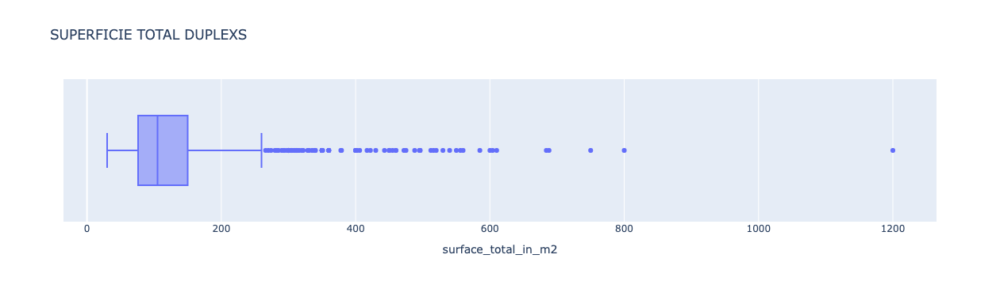

In [66]:
patron_duplex = re.compile(r'duplex|triplex|dúplex')

encuentra_duplex = df.title.apply(lambda x: re.search(patron_duplex, str(x)))


encuentra_duplex_mask = encuentra_duplex.notnull()

px.box(df[encuentra_duplex_mask], x='surface_total_in_m2', title= 'SUPERFICIE TOTAL DUPLEXS')

In [67]:
df[encuentra_duplex_mask].shape

(2392, 33)

In [68]:

df.loc[encuentra_duplex_mask,'TIPO DE PROPIEDAD']='duplex/triplex'

### Piso / Penthouses

In [69]:
df_apartamento=df[df.property_type=='apartment']

patron_piso = re.compile(r'piso|semipiso')

depto_sup_mayor_200m2 = df[np.logical_and(np.logical_or(df.surface_total_in_m2>200, df.surface_covered_in_m2>200), df.property_type=='apartment')]

encuentra_piso = depto_sup_mayor_200m2.title.apply(lambda x: re.search(patron_piso, str(x)))


encuentra_piso_mask = encuentra_piso.notnull()

piso=encuentra_piso[encuentra_piso_mask].apply(lambda x: x.group())

patron_penthouse = re.compile(r'penthouse')

encuentra_pent = df[df.property_type=='apartment'].description.apply(lambda x: re.search(patron_penthouse, str(x)))

encuentra_pent_mask = encuentra_pent.notnull()

pent_index = df_apartamento.loc[encuentra_pent_mask].index
piso_index = piso.index

df.loc[pent_index,'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[piso_index,'TIPO DE PROPIEDAD']='piso/penthouse'


In [70]:
df_apartamento=df[df.property_type=='apartment']

patron_piso = re.compile(r'piso|semipiso')

depto_sup_mayor_200m2 = df[np.logical_and(np.logical_or(df.surface_total_in_m2>200, df.surface_covered_in_m2>200), df.property_type=='apartment')]

encuentra_piso = depto_sup_mayor_200m2.description.apply(lambda x: re.search(patron_piso, str(x)))


encuentra_piso_mask = encuentra_piso.notnull()

piso=encuentra_piso[encuentra_piso_mask].apply(lambda x: x.group())

patron_penthouse = re.compile(r'penthouse')

encuentra_pent = df[df.property_type=='apartment'].title.apply(lambda x: re.search(patron_penthouse, str(x)))

encuentra_pent_mask = encuentra_pent.notnull()

pent_index = df_apartamento.loc[encuentra_pent_mask].index
piso_index = piso.index

df.loc[pent_index,'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[piso_index,'TIPO DE PROPIEDAD']='piso/penthouse'

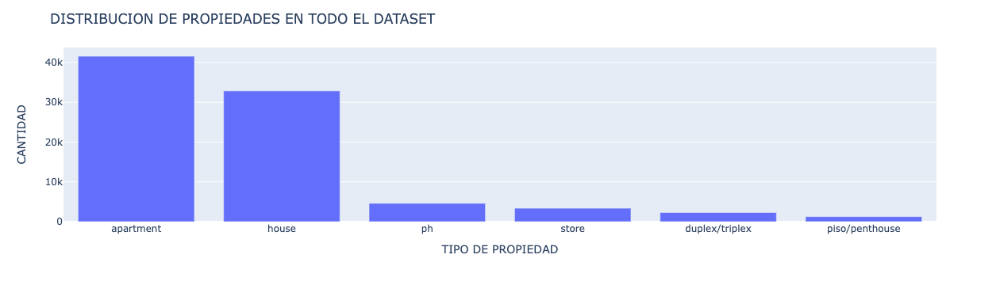

In [71]:
df_to_plot_2=df
df_to_plot_2['CANTIDAD']=1

df_to_plot_2= df_to_plot_2.groupby('TIPO DE PROPIEDAD').count()['CANTIDAD'].reset_index()


fig = px.bar(df_to_plot_2, x='TIPO DE PROPIEDAD', y="CANTIDAD",  barmode='stack')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)

fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}, title='DISTRIBUCION DE PROPIEDADES EN TODO EL DATASET') #Ordena manera decreciente


fig.show()

<a id="7"></a> 
### 7) Analisis EDA
[Ir a índice](#indice)

#### Outliers

### **Debido a cuestiones de tiempo, vamos a acotar el analisis solo a las propiedades de capital federal.**

<ipython-input-72-d96905d0418c>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



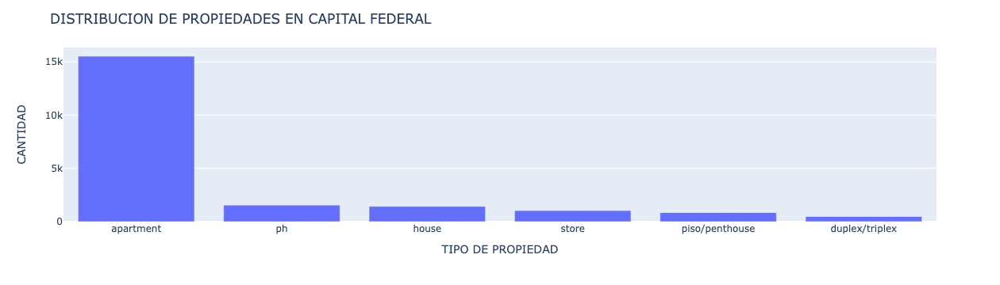

In [72]:
df_to_plot_3 = df[df.state_name=='capitalfederal']
df_to_plot_3['CANTIDAD']=1

df_to_plot_3= df_to_plot_3.groupby('TIPO DE PROPIEDAD').count()['CANTIDAD'].reset_index()


fig = px.bar(df_to_plot_3, x='TIPO DE PROPIEDAD', y="CANTIDAD",  barmode='stack')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)

fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}, title='DISTRIBUCION DE PROPIEDADES EN CAPITAL FEDERAL') #Ordena manera decreciente


fig.show()

Vamos a graficar algunas variables numericas a ver como esta distribuida nuestra data

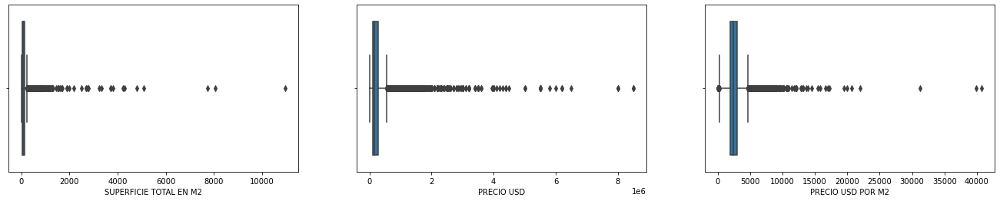

In [73]:
fig,ax = plt.subplots(ncols=3, figsize=(23,4))

sns.boxplot(data=df[df.state_name=='capitalfederal'], x='SUPERFICIE TOTAL EN M2', ax=ax[0]) 
sns.boxplot(data=df[df.state_name=='capitalfederal'], x='PRECIO USD', ax=ax[1]) 
sns.boxplot(data=df[df.state_name=='capitalfederal'], x='PRECIO USD POR M2', ax=ax[2])

plt.show()

Dado que la variable target principalmente es consecuencia de las primeras dos variables, vamos a trabajar con ellas.

## SUPERFICIE TOTAL EN M2

## Apartment

Vamos a buscar outliers a partir de place_name en departamentos de capital federal

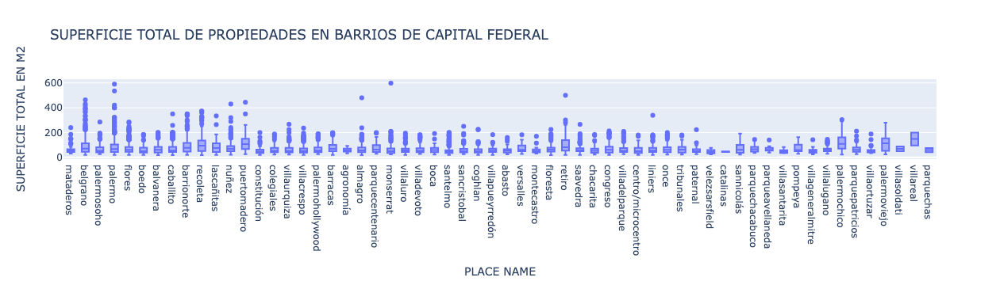

In [74]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL')
fig.show()


### mataderos - Apartment

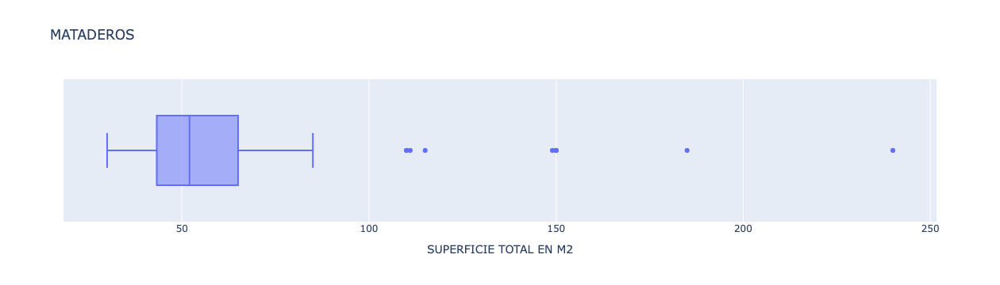

In [75]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='mataderos',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='MATADEROS')
fig.show()

In [76]:
df_apartamentos = df[df['TIPO DE PROPIEDAD']=='apartment']


mataderos_index=df_apartamentos[df_apartamentos['PLACE NAME']=='mataderos'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:7].index
df_apartamentos[df_apartamentos['PLACE NAME']=='mataderos'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:7]


,SUPERFICIE TOTAL EN M2,title,description
25414,240.000,avevapern5800,publicadoporcirculoinmobiliariasuratravesinmomap
77304,185.000,departamentotipoph,"departamentotipoph,estáenlaplantaalta1erpiso,e..."
104585,150.000,departamento-mataderos,exclusivospisos4ambientesdecategoría!!dos(2)co...
53546,150.000,casa4ambientes-mataderos,"excelentechalet,compuestodepatioyporchedeingre..."
58552,150.000,"3ambconterraza,parrillaysotano(estado100impeca...",codigo:114-577ubicadoen:araujo-publicadopor:in...
81446,149.000,"departamento4ambientescondep2balcones,todoalex...",departamentode4ambientesalfrente2balconesdoble...
102807,115.000,departamento-mataderos,ventadedepartamentoph3ambientescongarageenmata...


In [77]:
df.loc[mataderos_index[3],'TIPO DE PROPIEDAD']='house'

In [78]:
df.loc[mataderos_index[1],'TIPO DE PROPIEDAD']='ph'

In [79]:
df.loc[mataderos_index[6],'TIPO DE PROPIEDAD']='ph'

### belgrano - Apartment

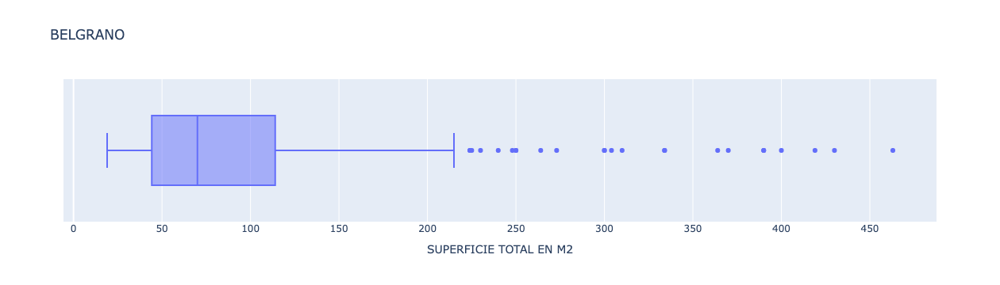

In [80]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='belgrano',df['TIPO DE PROPIEDAD']=='apartment')], x = "SUPERFICIE TOTAL EN M2", title='BELGRANO')
fig.show()

In [81]:
belgrano_index = df_apartamentos[df_apartamentos['PLACE NAME']=='belgrano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title']][:18].index

df_apartamentos[df_apartamentos['PLACE NAME']=='belgrano'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:18]


,SUPERFICIE TOTAL EN M2,title,description
818,463.000,departamentoenventa,"ventadedepartamento4dormitoriosenbelgrano,capi..."
55986,430.000,departamentoenventa,"excelentedepartamentoenventa/forumalcorta,cata..."
48728,419.000,belgrano/laimprenta7ambaptoprofdepcochera,corredorresponsable:arielchampanier-cucicba433...
33680,400.000,belgranoexcelentedepartamentoenventade8ambientes,excelentedepartamentoenventaentorredecategoría...
97013,390.000,4suitesescritorioyplayroombalconterrazaypileta...,espectaculardepartamentotipocasaconbalcónterra...
96695,390.000,departamentoenbelgrano,ventadepartamento6ambientesbelgranotorreaisens...
96821,370.000,3defebreroyzabala-torredemaximacategoriaconame...,torredemáximacategoríagranlivingconsalidaabalc...
120990,364.000,departamento-belgranoc,avisolegal:lasdescripcionesarquitectónicasyfun...
50426,334.000,departamentoventa,"enbelgrano,sobreluismcampos,entreollerosyfeder..."
51632,334.000,muylindodepartamentocon200mts²dejardínson334m2...,"enbelgrano,sobreluismcampos,entreollerosyfeder..."


In [82]:
df.loc[belgrano_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'

### palermo soho - Apartment

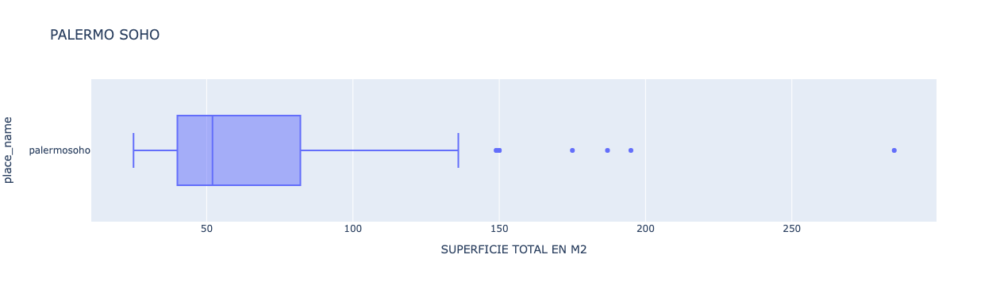

In [83]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='palermosoho',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", y='place_name', title='PALERMO SOHO')
fig.show()

In [84]:
palermosoho_index = df_apartamentos[df_apartamentos['PLACE NAME']=='palermosoho'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title']][:6].index

df_apartamentos[df_apartamentos['PLACE NAME']=='palermosoho'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6]


,SUPERFICIE TOTAL EN M2,title,description
109686,285.000,departamentoventa,hermosadptodedosambientesmuyeconómico
107050,195.000,"departamentoenventaenpalermosoho,capitalfederal",codigo:1237-76ubicadoen:paraguay4700-publicado...
10087,187.000,semipisoenjuncalentreugartecheyrepublicaarabes...,excelentesemipisoalfrenteconluzdemañanaenmuyes...
55197,175.000,excelentedeptoentorreconterrazasparrillavista3...,excelentepisoentorrefullamenitiesvista360grado...
85648,150.000,paraguay4700,latorresohoiiestáconstruidasobreunaampliafracc...
13640,150.000,departamentoenpalermosohocongranbalcónterraza,codigo:3016-wp0141ubicadoen:malabia12219nopiso...


In [85]:
df.loc[palermosoho_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

## Palermo - Apartment

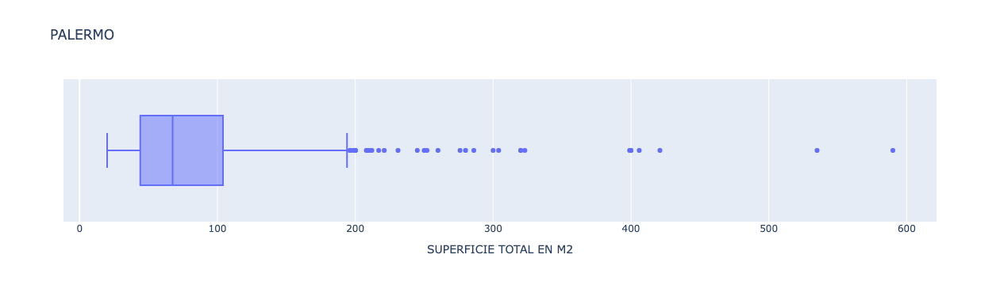

In [86]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='palermo',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='PALERMO')
fig.show()

In [87]:
palermo_index = df_apartamentos[df_apartamentos['PLACE NAME']=='palermo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:25].index

df_apartamentos[df_apartamentos['PLACE NAME']=='palermo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:25]


,SUPERFICIE TOTAL EN M2,title,description
54806,590.000,clay3100,oportunidad600frentealpolocon5cocheras:desarro...
73511,535.000,"ventadepartamentode5ambientescondependencias,2...","ventadepartamentode5ambientescondependencias,2..."
81885,421.000,latorremaslujosadepalermo!!!,leparcpalermoexclusivo!excelentedepartamentode...
116936,406.000,ventapalermo,"superficie:405,73m2características:excepcional..."
44675,400.000,ventapalermo,"superficie:369,86m2planta400,22m2propioscaract..."
97039,400.000,torredecategoria-frentealrosedal-espectacularv...,torrefrentealrosedalconespectacularvistaverdey...
57678,399.000,dellibertador1700,"magníficapropiedad,degrancategoría,enesquina,c..."
81630,323.000,departamentoenpalermo,vendido!leparcalcortacreoqueesodicetodounadela...
32146,320.000,avlibertadorykennedy,excelentedepartamentoconvistaaplazaslivingyesc...
73452,320.000,venta5ambientes,capitalbrokerspropiedades|o15-espectaculartrip...


In [88]:
df.loc[palermo_index[7],'TIPO DE PROPIEDAD']='duplex/triplex'

In [89]:
df.loc[palermo_index[-5],'TIPO DE PROPIEDAD']='duplex/triplex'

In [90]:
df.loc[palermo_index[-3],'TIPO DE PROPIEDAD']='duplex/triplex'

In [91]:
df.loc[palermo_index[-2],'TIPO DE PROPIEDAD']='duplex/triplex'

## Barrio Norte - Apartment

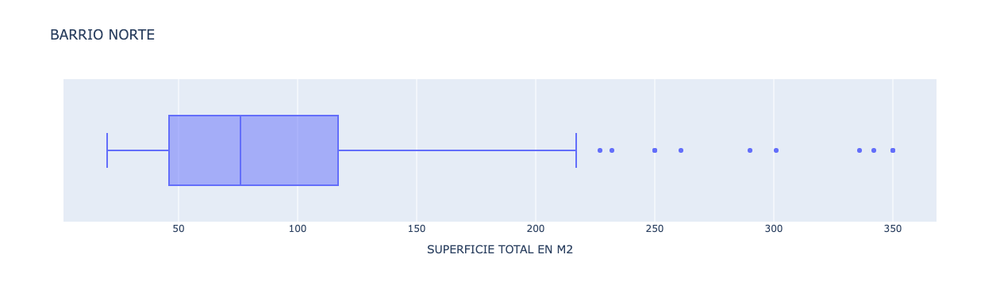

In [92]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='barrionorte',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='BARRIO NORTE')
fig.show()

In [93]:
barrionorte_index=df_apartamentos[df_apartamentos['PLACE NAME']=='barrionorte'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9].index

df_apartamentos[df_apartamentos['PLACE NAME']=='barrionorte'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9]


,SUPERFICIE TOTAL EN M2,title,description
16737,350.000,departamentoenventaubicadoenbarrionorte(iur036...,"edificioconstruidodegrancategoría,ubicadofrent..."
24890,350.000,excelentedeptoenrecoleta,ampliolivingycomedorendesnivelalfrenteconbalcn...
38432,342.000,torrelibedinsky-barrionorte-grandbourg-5ambc/d...,"excelentedepartamento,ubicadoenlazonamaselegan..."
59156,336.000,"edificiofariña,3suites2dep,3cocherasfijas",edificiodecategoría-construcciónfariña-excelen...
12713,301.000,suipachaesquinajuncal,torreenesquinaconvigilancialas24hspalierprivad...
90742,290.000,departamento-palermochico,"enexcelentetorreaisenson,granparquearboladoenp..."
41769,261.000,ventabarrionorte,"superficies:260,82,m2propia192,76m2cubierto68,..."
71850,250.000,departamentoenventa3dormitoriosconpatio-barrio...,"impecabledepartamentoenventa,tipocasa,conpatio..."
113434,250.000,departamentode4dormitoriosdegrancategoriamuylu...,barrionortearenales2200entreazcuenagayuriburu2...


In [94]:
df.loc[barrionorte_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Villa Crespo - Apartment

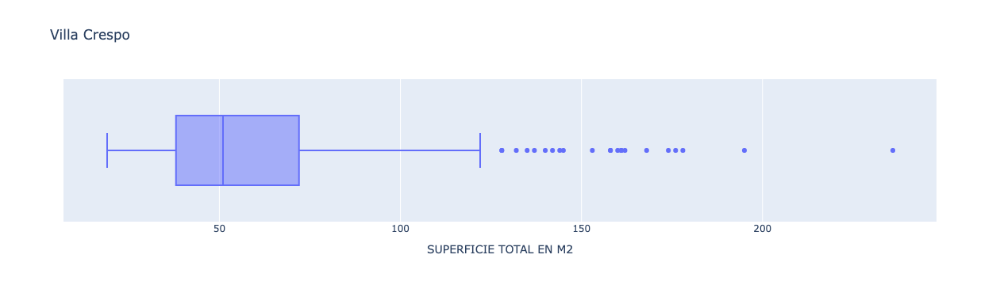

In [95]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='villacrespo',df['TIPO DE PROPIEDAD']=='apartment')],\
                 x = "SUPERFICIE TOTAL EN M2", title='Villa Crespo')
fig.show()

In [96]:
villacrespo_index=df_apartamentos[df_apartamentos['PLACE NAME']=='villacrespo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:19].index


df_apartamentos[df_apartamentos['PLACE NAME']=='villacrespo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:19]


,SUPERFICIE TOTAL EN M2,title,description
112623,236.000,"departamentodecategoría,alfrenteconbalcónsinex...","características:departamentodecategoría,4dormi..."
44611,195.000,departamentode4ambientesenventaenvillacrespo,"excelentesemipisode195mts2totales,muybienconse..."
85356,178.000,departamento-villacrespo,excelentedepartamento4ambientesaestrenarconbal...
31206,176.000,departamentoenventa,3ambientesenventaconjardin!!(76m2cubiertos+100...
56446,174.000,departamentoenventa,�excelentepisode4ambientescondependenciadeserv...
31419,168.000,departamentoenventa,"ventadedepartamento5ambientesenvillacrespo,cap..."
118034,162.000,departamento-villacrespo,unidadde3dormitoriosubicadaenel2dopisotresdorm...
28135,161.000,departamentode3ambientesenventaenvillacrespo,departamentotipocasade3ambientescondependencia...
113024,161.000,departamentoenventa,"pisode4ambientescondependenciaycocheras,envent..."
70826,160.000,departamento-villacrespo,"deptoenpalermoqueens,amtsdetodoslosautlets,imp..."


In [97]:
df.loc[villacrespo_index[8],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-7],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-8],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[villacrespo_index[-5],'TIPO DE PROPIEDAD']='duplex/triplex'

### Puerto Madero - Apartment

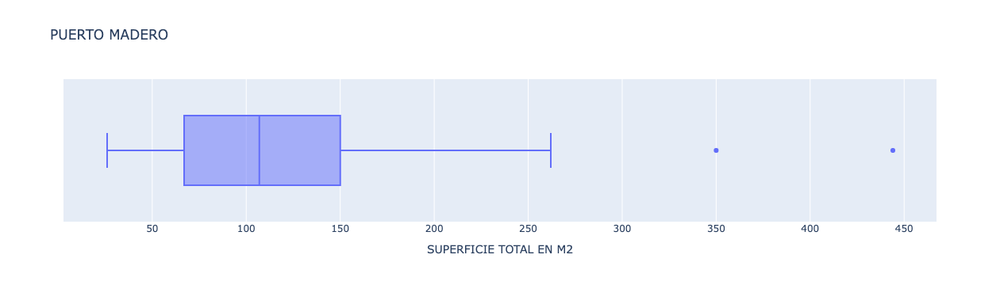

In [98]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'],\
                x = "SUPERFICIE TOTAL EN M2", title='PUERTO MADERO')
fig.show()

In [99]:
index_puertomadero=df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index


df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


,SUPERFICIE TOTAL EN M2,title,description
93696,444.000,puertomadero,-increíbledepartamentoendúplexen2plantasconter...
5880,350.000,"torreelfaro-impresionantevistaalrío,tigreypuer...",superluminosoysoleado-grancategoría-living/com...


In [100]:
df.loc[index_puertomadero[0],'TIPO DE PROPIEDAD']='duplex/triplex'

In [101]:
df.loc[index_puertomadero[1],'TIPO DE PROPIEDAD']='piso/penthouse'

### Nuñez - Apartment

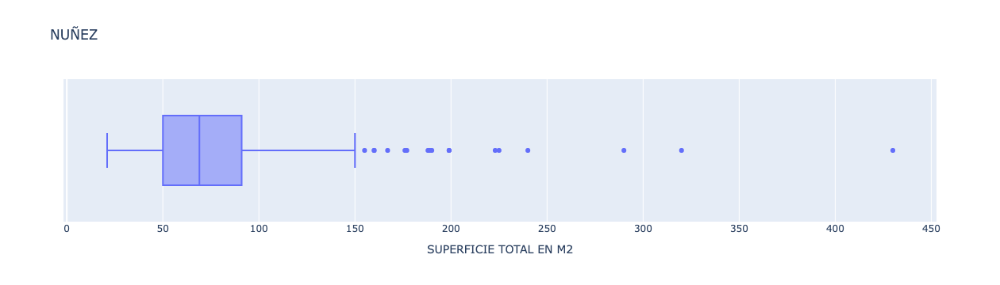

In [102]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'],\
             x = "SUPERFICIE TOTAL EN M2", title='NUÑEZ')
fig.show()

In [103]:
nunez_index=df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'].\
                    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:14].index

df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'].\
                    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description','PRECIO USD']][:14]


,SUPERFICIE TOTAL EN M2,title,description,PRECIO USD
55985,430.000,departamentoenventa,"excelentedepartamentoenventa/forumalcorta,cata...",2490000.000
59592,320.000,forumalcorta,en320mts4dormitorios1ensuitedependenciadeservi...,2550000.000
69590,290.000,ventatorrechateauexcelenteesquineroconlamejorv...,esquineroaltoconlamejorvistadelatorretorrechat...,2500000.000
46548,240.000,casaenventa-caseros,codigo:3746-c20ubicadoen:jjdeurquiza3968-publi...,100000.000
55223,225.000,quantumbelliniesquinero3dormcondep,torredemaximacategoriaenobralasmedidassonaprox...,1250000.000
42312,223.000,avdellibertador7000-nuñez-capitalfederal,excelentedepartamentoenunadelastorresmasexclus...,1650000.000
5448,199.000,"avdellibertador7000,departamentoenventa,5ambie...",ubicacion:eledificioseencuentrasobreavdelliber...,625000.000
8083,199.000,"avdellibertador7000,departamentoenventa,4dormi...",ubicacion:eledificioseencuentrasobreavdelliber...,625000.000
117696,190.000,departamento-nuñez,casatotalmenterecicladaa2cdrasdecabildo!!lotep...,360000.000
116578,189.000,magnificodepartamentode4ambenavlibertador!!!,"sobreavlibertador,magnificoentorno,vistamuyver...",480000.000


In [104]:
df.loc[nunez_index[3],'TIPO DE PROPIEDAD']='house'
df=df.drop(nunez_index[6])
df.loc[nunez_index[8],'TIPO DE PROPIEDAD']='house'
df.loc[nunez_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-2],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[nunez_index[-1],'TIPO DE PROPIEDAD']='duplex/triplex'

### Constitucion - Apartment

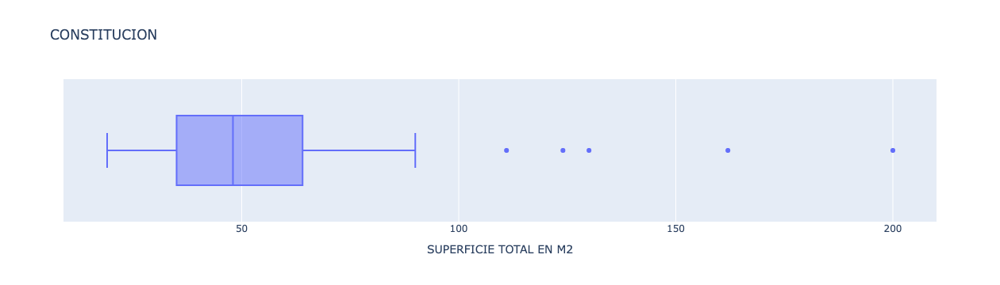

In [105]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'], x = "SUPERFICIE TOTAL EN M2", title='CONSTITUCION')
fig.show()

In [106]:
constitucion_index = df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:5].index
df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:5]


,SUPERFICIE TOTAL EN M2,title,description
11721,200.000,ventapisotipoph-de200m2-balcónalfrte-,ventadepisotipoph(1ºpiso)u$s249000“conexcelent...
89631,162.000,departamento/ph-4ambientes-constitución,ubicadosobrelacallecochabamba:entrelasdesaenzp...
110394,130.000,"departamento130m²5ambientesconwashing-room,cap...","departamento5ambientes,muyluminosolivingcomedo..."
11741,124.000,piso4ambientesenventasantiagodelestero1300esco...,amplioycómododepartamentode4ambientesensólidoe...
17289,111.000,departamentoliving/comedor3dormitorio(s)1toile...,"deepocaenmuybuenestadoexcelentevista,muchaluz ..."


In [107]:
df.loc[constitucion_index[0],'TIPO DE PROPIEDAD']='ph'
df.loc[constitucion_index[1],'TIPO DE PROPIEDAD']='ph'
df.loc[constitucion_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'


### Colegiales - Apartment

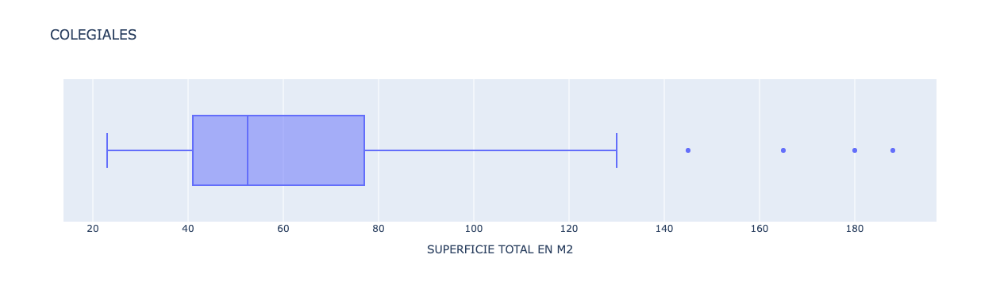

In [108]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'],\
             x = "SUPERFICIE TOTAL EN M2", title='COLEGIALES')
fig.show()

In [109]:
colegiales_index =df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4].index
df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4]


,SUPERFICIE TOTAL EN M2,title,description
4831,188.000,departamentoenventa,excelenteoportunidaddecompradedepartamentotrip...
63662,180.000,palpa2855-pbopcionalcochera,"porsubuenayestratégicaubicación,palpa2855cuent..."
113001,165.000,departamentoenventa,pisotipocasa4ambientesfrenteycontrafrente165m2...
61440,145.000,departamentoenventa,"ventadedepartamento4ambientesencolegiales,capi..."


In [110]:
df.loc[colegiales_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[colegiales_index[1],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[colegiales_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Almagro - Apartment

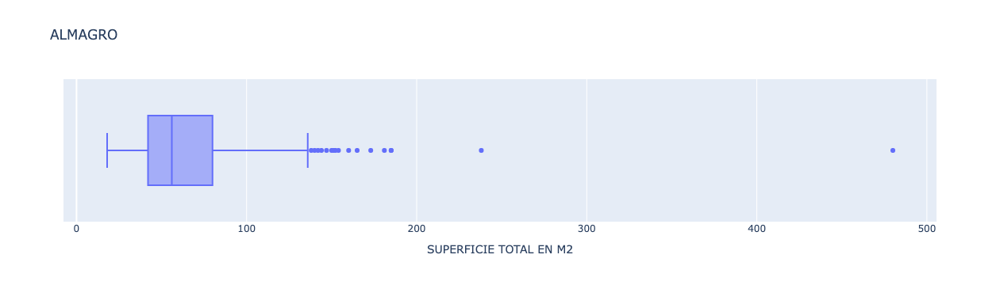

In [111]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'], x = "SUPERFICIE TOTAL EN M2", title='ALMAGRO')
fig.show()

In [112]:
almagro_index =df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13].index
df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13]


,SUPERFICIE TOTAL EN M2,title,description
110445,480.000,aranguren100//muyluminoso,"casa5ambientes,muyluminosapb:livingcomedorcoci..."
37737,238.000,departamentoliving/comedor3dormitorio(s)1suite...,imperdibleterrazapropiaconsumyparrilladepartam...
27766,185.000,ventadepartamento4ambientesalmagro,unico!impecabledepartamentoconunpatiodecasi80m...
24513,185.000,*nuevoprecio*departamentoenventaenalmagro3ambi...,codigo:3410-178ubicadoen:rivadavia3500-publica...
58118,181.000,departamentode4ambientesenventaenalmagro,departamentode3ambientesc/dependenciaporescale...
85818,173.000,inmejorabledepto5ambc/depcocheraybaulera,inmejorabledepartamento5ambientesenduplexc/dep...
20582,165.000,departamentoenventa,semipisoalfrenteenalmagro!!!!165m2totalesxescr...
5352,160.000,departamentoenventa,"4ambientesconpatioyterrazaalfrente,enventa,ena..."
7791,154.000,granpiso5ambc/dependencia7ºpisoalfrente,"excelenteplanta154m2,5ambcondependenciadobleen..."
11966,152.000,departamentoenventa,hermososemipisodecategoriade4ambc/depyescritor...


In [113]:
df.loc[almagro_index[0],'TIPO DE PROPIEDAD']='house'
df.loc[almagro_index[4],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[almagro_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-6],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[almagro_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Monserrat - Apartment

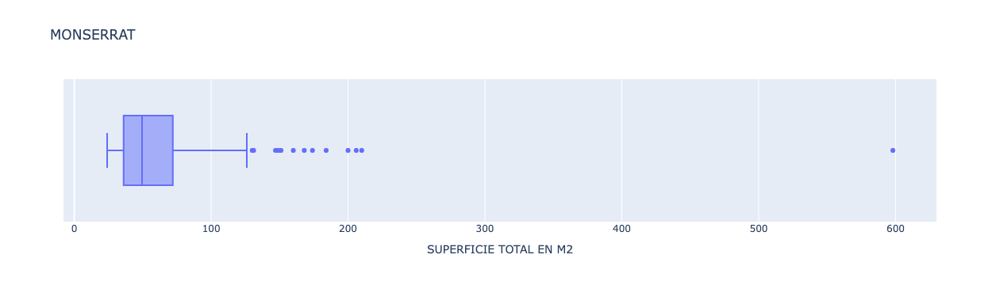

In [114]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'], x = "SUPERFICIE TOTAL EN M2", title='MONSERRAT')
fig.show()

In [115]:
monserrat_index=df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13].index

df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13]

,SUPERFICIE TOTAL EN M2,title,description
46709,598.000,barrioprivado,"¿querésvivirrodeadodepaz,paisajesnaturalesyelm..."
110451,210.000,muyluminoso//sanjose400,"departamento5ambientes,muyluminosolivingcomedo..."
39512,206.000,departamentoenventa,"ventadedepartamento6ambientesenmonserrat,capit..."
45225,200.000,espectacularpisode5ambientesenmonserrat,sumacategamplioyluminosopisode5ambientesenmont...
51217,184.000,departamentoantiguoconcochera,"setratadeundepartamentoantiguo,reciclado,deamp..."
83027,174.000,departamento-monserrat,excelentesemipisode5ambientesalfrenteedificioa...
33383,168.000,hermosodepartamentoestiloracionalistaservicios...,"setratadeunapropiedaddeampliosambientes,conexc..."
44184,160.000,excelente5ambenedificioemblemático,avdemayo1400enelemblemáticoedificioconocidocom...
79070,151.000,departamento-monserrat,hermososemipisoenventaenelbarriodemonserratena...
85251,149.000,departamento/ph-5ambientes,excelenteubicacion!apasosdelaavbelgranoyametro...


In [116]:
df.loc[monserrat_index[0]].description

'¿querésvivirrodeadodepaz,paisajesnaturalesyelmayorconfot?elprimerbarrioprivadodelaciudaddebalcarce,seencuentraubicadoalpiedelasierralabarrosa,cercanoalautodromojuanmanuelfangio,unodelospuntosmásimpactantesencuantoaloqueofreceelpaisajeserranoypróximoalosdistintoscircuitosdeactividadesculturalesydeportivasdisfrutedetodaslascomodidadesdelclubhouse,conlanaturalezadefondolaseguridadqueofreceunbarrioprivado,yunimportanteentornonatural,hacenquepuedaolvidarsedesuspreocupacionesyrelajarsedeverdadconsulteporlotesdisponibleslotesde598m2a1000m2conlacompradeunlotesebonificalaescriturayademásseobsequiandosbicicletasdemountainbikeconsultas:(04168rocío'

Se trata de un anuncio que incluye el conjunto de 4 unidades dentro de su precio.

In [117]:
df = df.drop(monserrat_index[0])

In [118]:
df.loc[monserrat_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[monserrat_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Villa Luro - Apartment

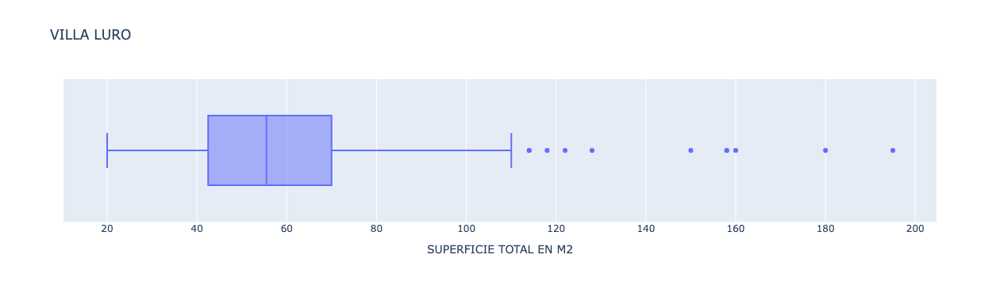

In [119]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'], x = "SUPERFICIE TOTAL EN M2", title='VILLA LURO')
fig.show()

In [120]:
villaluro_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9]


,SUPERFICIE TOTAL EN M2,title,description
99858,195.000,departamento-villaluro,ventadedepartamento3ambientesconterrazaubicado...
99845,180.000,departamento-villaluro,ventadedepartamento3ambientesconterrazaubicado...
99411,160.000,departamento-villaluro,ventadedepartamentotresambientesubicadoenlazon...
74831,158.000,"4ambientes,dosbaños,cocinaindependiente,terraz...",departamentoenventade4ambentercerpisoalfrentev...
74840,158.000,"4ambientes,2baños,cocinaindependiente,balcónat...",departamentoenventade4ambientesentercerpisoalf...
12298,150.000,departamentoenventa,"ventadedepartamento4ambientesenvillaluro,capit..."
81816,128.000,departamento-villaluro,excelentedepartamentode4ambientesconbalcón!liv...
81742,122.000,departamento-villaluro,excelentedepartamentode4ambientesconbalcónypat...
117030,118.000,casalotepropiode3ambientes,codigo:368-22ubicadoen:cesardiaz5241-publicado...


In [121]:
df.loc[villaluro_index[-1],'TIPO DE PROPIEDAD']='house'

### Villa Devoto - Apartment

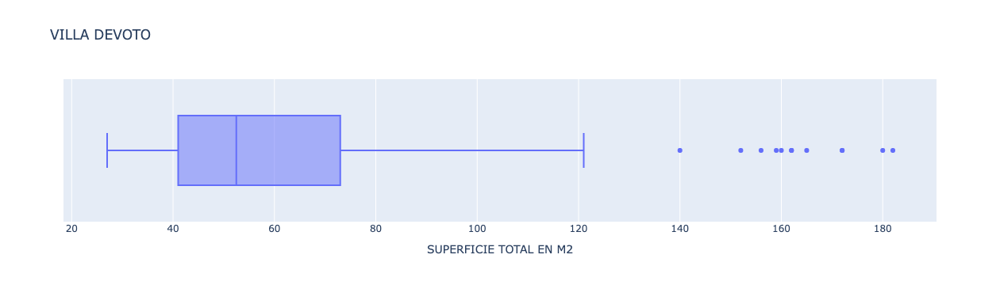

In [122]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'], x = "SUPERFICIE TOTAL EN M2", title='VILLA DEVOTO')
fig.show()

In [123]:
devoto_index =df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:10].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:10]


,SUPERFICIE TOTAL EN M2,title,description
83082,182.000,piso4ambcocheradoble,pisodecategoria-enzonaresidencial-edificioenes...
114580,180.000,"semipiso4ambientes,cochera180m2","semipiso4ambientesalfrentereciclado,excelentee..."
98432,172.000,departamento-villadevoto,ventadedepartamento4ambientesenvilladevotoexce...
97798,172.000,departamentoenvilladevoto,ventadedepartamento4ambientesenvilladevotoexce...
82057,165.000,piso5ambc/depserv,"pisoenvilladevoto,a5cuadrasdelaplazaedificiode..."
97722,162.000,departamentoenvilladevoto,ventadedepartamento4ambientesenvilladevotoexce...
98405,162.000,departamento-villadevoto,ventadedepartamento4ambientesenvilladevotoexce...
49910,160.000,departamentoenventa,"ventadedepartamento3ambientesenvilladevoto,cap..."
71419,159.000,"hermosopiso5ambc/dep,dormsuiteyespguardacoche-...","imponentepisode5ambientescondependencia,conbau..."
20239,156.000,"departamento156m²concocheraencarril,salvadorma...","excelentesemipisoenedificiodecategoria,ubicado..."


In [124]:
df.loc[devoto_index[0],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[1],'TIPO DE PROPIEDAD']='piso/penthouse'
df = df.drop(devoto_index[2])
df.loc[devoto_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'

### Palermo Chico - Apartment

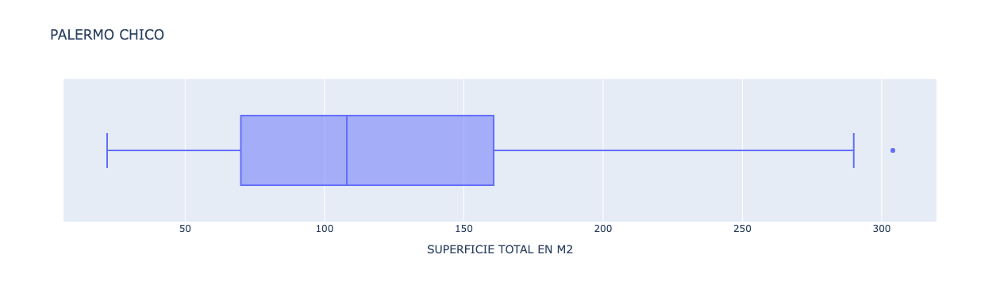

In [125]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='palermochico'], x = "SUPERFICIE TOTAL EN M2", title='PALERMO CHICO')
fig.show()

In [126]:
df_apartamentos[df_apartamentos['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description
18516,304.000,departamentoedificioedificiolanusselivingcomed...,departamentoedificioedificiolanusselivingcomed...


### Villa del Parque - Apartment

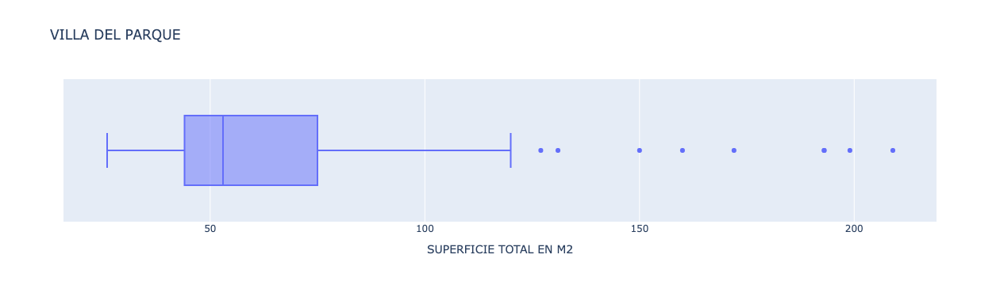

In [127]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque'], x = "SUPERFICIE TOTAL EN M2", title='VILLA DEL PARQUE')
fig.show()

In [128]:
villadelparque_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:8].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:8]


,SUPERFICIE TOTAL EN M2,title,description
6432,209.000,departamentoenventa,"ventadetreiplexhermoso,alfrenteconentradaindep..."
113446,199.000,departamentos3dormitoriosc/dep,"###edifdoblefrente,seg24hscochimpecable!!!!###..."
65600,193.000,6ambientes193m2/cocheraybaulera,6ambientesconcocheraybauleraimportantepisodegr...
65612,193.000,pisode193m2cocheraybaulera,pisoconcocheraybauleraimportantepisodegrancate...
49546,172.000,departamentoenventa,ventaduplex4ambientes+dependencia+garage+fondo...
22695,160.000,departamentode4ambientesentresplantas,"entradaindependiente,haciaabajogarajeprivadocu..."
109367,150.000,"departamento-villadelparque,semipiso,4ambiente...",excelentesemipisode4ambientescon3balcónes2coch...
74968,131.000,departamento-villadelparque,departamentode3ambientesen1erpisoalfrenteconte...


In [129]:
df.loc[villadelparque_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[villadelparque_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villadelparque_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villadelparque_index[4],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[villadelparque_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Centro/Microcentro - Apartment

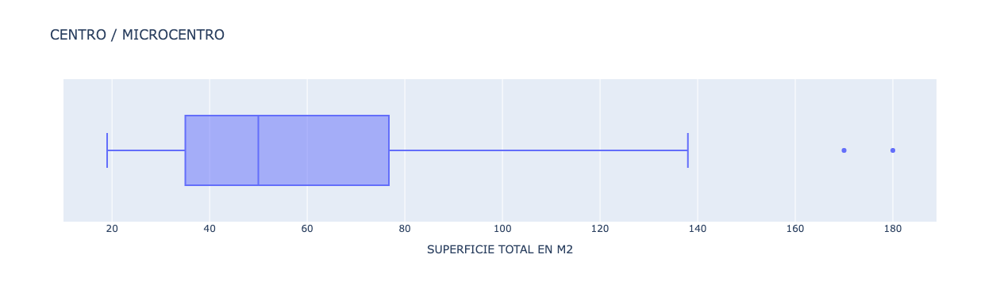

In [130]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='centro/microcentro'], x = "SUPERFICIE TOTAL EN M2", title='CENTRO / MICROCENTRO')
fig.show()

In [131]:
df_apartamentos[df_apartamentos['PLACE NAME']=='centro/microcentro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


,SUPERFICIE TOTAL EN M2,title,description
14877,180.000,deptode9ambientescongalería,deptode9ambientescongaleríaalfrentecon156m2cub...
49049,170.000,"departamentoenventa,oportunidad,buenaubicación...",departamentoenmuybuenaubicaciónaptoparaviviend...


### Villa Lugano - Apartment

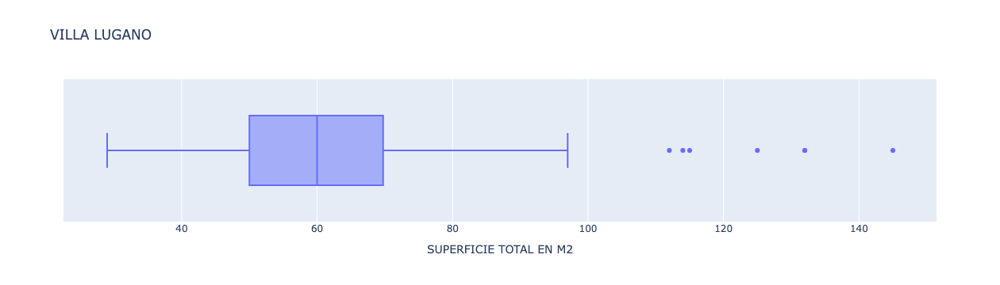

In [132]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano'], x = "SUPERFICIE TOTAL EN M2", title='VILLA LUGANO')
fig.show()

In [133]:
lugano_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6]


,SUPERFICIE TOTAL EN M2,title,description
60559,145.000,excelentepsosavriestra,excelentepisosobreavriestraycafayatelivingcome...
75442,132.000,semipisoespectacular3amb,semipisode4ambenelcomplejofranova!!!comosiesta...
76333,132.000,departamento-villalugano,ventasemipisode4ambientesenluganocapitalfedera...
111751,125.000,departamento-villalugano,"departamento125m²conpavimento,capitalfederal,v..."
26100,115.000,dpto4ambsinexpensasvriachueloaccininmobiliaria,"excelentedptode4ambcon3dorm,conplacard,livingc..."
74925,114.000,"3ambientescondosbaños,dosbalconesde114m2",hermososemipisode3ambenelcomplejofranovacomosi...


In [134]:
df.loc[lugano_index[0],'TIPO DE PROPIEDAD']='piso/penthouse'
df=df.drop(lugano_index[1])
df.loc[lugano_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[lugano_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'

Ahora, vamos a revisar con un describe los valores que nos quedaron 

In [135]:
df_departamentos_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]
df_departamentos_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,1946.000,8480.000,4684.000,14484.000,12533.000,11570.000,14567.000,14494.000,15465.000
mean,8.843,2.663,3025.255,69.405,74.292,2724.387,269036.465,203236.724,1.000
std,60.229,1.251,3094.053,134.502,45.496,1210.389,511811.556,189852.852,0.000
min,1.000,1.000,1.000,1.000,18.000,69.239,24300.000,5103.610,1.000
25%,2.000,2.000,1300.000,38.000,42.000,2073.171,102000.000,99000.000,1.000
50%,4.000,3.000,2025.000,54.000,60.000,2500.000,148687.000,143044.965,1.000
75%,7.000,4.000,3600.000,82.000,91.000,3056.746,250000.000,235000.000,1.000
max,2103.000,15.000,54240.000,9152.000,590.000,40720.406,14756597.000,3000000.000,1.000


In [136]:
#Lo minimo de un departamento son 27m2.
sup_min_mal_cargada=df_departamentos_caba[np.logical_or(df_departamentos_caba['SUPERFICIE CUBIERTA EN M2']<27,df_departamentos_caba['SUPERFICIE TOTAL EN M2']<27)].index
df_departamentos_caba[np.logical_or(df_departamentos_caba['SUPERFICIE CUBIERTA EN M2']<27,df_departamentos_caba['SUPERFICIE TOTAL EN M2']<27)]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
1162,sell,apartment,recoleta,|argentina|capitalfederal|recoleta|,argentina,capitalfederal,3429595.000,"-345940974,-583911079",-34.594,-58.391,95000.000,usd,1676227.500,95000.000,40.000,25.000,2375.000,3800.000,NaN,1.000,NaN,http://wwwproperaticomar/15hg1_venta_departame...,"monoambienteconterrazaenexcelenteubicacion,muy...",juncal16001°d,https://thumbs4properaticom/9/jp9zu0omiighhytc...,recoleta,25.000,40.000,2375.000,95000.000,usd,95000.000,apartment,1
1798,sell,apartment,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-3460596848,-5842522812",-34.606,-58.425,NaN,NaN,NaN,NaN,22.000,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/15jf7_venta_departame...,excelentemonoambienteaptoprofesionalidealconsu...,u$d70000-departamentoenventa-perón4151,https://thumbs4properaticom/6/ldcfsobcvoxiy4o5...,almagro,NaN,22.000,NaN,NaN,NaN,NaN,apartment,1
2384,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-3454615402,-5846242142",-34.546,-58.462,NaN,NaN,NaN,NaN,26.000,26.000,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/15k3s_venta_departame...,"segundopisoporescaleracocinaconbarradivisoria,...",u$d72000-departamentoenventa-3defebrero3567,https://thumbs4properaticom/5/ebrv7k3ka7vbttjr...,belgrano,26.000,26.000,NaN,NaN,NaN,NaN,apartment,1
2843,sell,apartment,sannicolás,|argentina|capitalfederal|sannicolás|,argentina,capitalfederal,6693229.000,"-3460410309,-5838792801",-34.604,-58.388,NaN,NaN,NaN,NaN,23.000,23.000,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/15klg_venta_departame...,1ambientecocinaindependientecompletapisosderob...,u$d53000-departamentoenventa-corrientesyparaná0,https://thumbs4properaticom/6/ged5rigseszvnf1e...,sannicolás,23.000,23.000,NaN,NaN,NaN,NaN,apartment,1
2980,sell,apartment,montecastro,|argentina|capitalfederal|montecastro|,argentina,capitalfederal,3430596.000,"-3462152481,-5850676727",-34.622,-58.507,NaN,NaN,NaN,NaN,30.000,26.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/15kqv_venta_departame...,"-edificioaestrenar-livingcomedor,concocinainco...",u$d69900-departamentoenventa-alcaraz5000,https://thumbs4properaticom/5/wujut5oq2_90c8zs...,montecastro,26.000,30.000,NaN,NaN,NaN,NaN,apartment,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119798,sell,apartment,recoleta,|argentina|capitalfederal|recoleta|,argentina,capitalfederal,3429595.000,"-345950543,-58392032",-34.595,-58.392,83000.000,usd,1464493.500,83000.000,34.000,22.000,2441.176,3772.727,NaN,1.000,NaN,http://wwwproperaticomar/1ch3w_venta_departame...,"ambientepisoaltounpisoporescalera,elascensorll...",rodríguezpeña1100-ambientemuyluminoso,https://thumbs4properaticom/0/hwgpxrbivd6dn9yr...,recoleta,22.000,34.000,2441.176,83000.000,usd,83000.000,apartment,1
120284,sell,apartment,santelmo,|argentina|capitalfederal|santelmo|,argentina,capitalfederal,3428113.000,NaN,NaN,NaN,1252600.000,ars,1239533.350,70250.410,30.000,26.000,2341.680,48176.923,NaN,NaN,NaN,http://wwwproperaticomar/1chqi_venta_departame...,"departamento30m²,capitalfederal,santelmo,por$1...",departamento-santelmo,https://thumbs4properaticom/5/a2dzjuh70gsx0yin...,santelmo,26.000,30.000,2341.680,1252600.000,ars,70250.410,apartment,1
120286,sell,apartment,santelmo,|argentina|capitalfederal|santelmo|,argentina,capitalfederal,3428113.000,NaN,NaN,NaN,1278000.000,ars,1264668.300,71674.930,30.000,26.000,2389.164,49153.846,NaN,NaN,NaN,http://wwwproperaticomar/1chqk_venta_departame...,"departamento30m²,c

In [137]:
df = df.drop(sup_min_mal_cargada)

In [138]:
df_departamentos_caba.sort_values('SUPERFICIE CUBIERTA EN M2',ascending=False)[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
56484,sell,apartment,montecastro,|argentina|capitalfederal|montecastro|,argentina,capitalfederal,3430596.000,"-34618411,-58497949",-34.618,-58.498,138000.000,usd,2434941.000,138000.000,NaN,9152.000,NaN,15.079,3.000,4.000,NaN,http://wwwproperaticomar/19r6g_venta_departame...,corredorresponsable:unobienesraicessrl-cucicba...,excelentedeptode4ambienesmuyluminoso,https://thumbs4properaticom/3/9cbq2o2xogfyup32...,montecastro,9152.000,NaN,NaN,138000.000,usd,138000.000,apartment,1
64104,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-34588259,-58409503",-34.588,-58.410,220000.000,usd,3881790.000,220000.000,NaN,7029.000,NaN,31.299,6.000,4.000,NaN,http://wwwproperaticomar/1aa1j_venta_departame...,corredorresponsable:cristianarnalponti-cucicba...,4ambientesfrentealaltopalermoc/osinmuebles,https://thumbs4properaticom/6/gbchroems94d8pwt...,palermo,7029.000,NaN,NaN,220000.000,usd,220000.000,apartment,1
109722,sell,apartment,floresta,|argentina|capitalfederal|floresta|,argentina,capitalfederal,3433910.000,"-346317378902,-584794281617",-34.632,-58.479,108000.000,usd,1905606.000,108000.000,NaN,6534.000,NaN,16.529,5.000,4.000,NaN,http://wwwproperaticomar/1c2kh_venta_departame...,corredorresponsable:hernanperrone-cucicba2792c...,departamento4ambientescocinaseparadamuchaluz,https://thumbs4properaticom/2/0zhir2ib1oz4mtry...,floresta,6534.000,NaN,NaN,108000.000,usd,108000.000,apartment,1
114174,sell,apartment,flores,|argentina|capitalfederal|flores|,argentina,capitalfederal,3433918.000,"-34630699,-58472579",-34.631,-58.473,129000.000,usd,2276140.500,129000.000,NaN,6062.000,NaN,21.280,8.000,2.000,NaN,http://wwwproperaticomar/1c9im_venta_departame...,corredorresponsable:ramiroelkadi-cucicba6534co...,dpto2ambientesconampliobalcóncorrido,https://thumbs4properaticom/4/bhj1uheycs4exfvb...,flores,6062.000,NaN,NaN,129000.000,usd,129000.000,apartment,1
117183,sell,apartment,congreso,|argentina|capitalfederal|congreso|,argentina,capitalfederal,3435259.000,"-34609821,-58392606",-34.610,-58.393,72000.000,usd,1270404.000,72000.000,NaN,3896.000,NaN,18.480,2.000,2.000,NaN,http://wwwproperaticomar/1cdao_venta_departame...,corredorresponsable:flaviaaguirre-cucicba471co...,congreso2ambientesexcelenteubicacion!!,https://thumbs4properaticom/9/mfflulevji6elrzs...,congreso,3896.000,NaN,NaN,72000.000,usd,72000.000,apartment,1
28563,sell,apartment,balvanera,|argentina|capitalfederal|balvanera|,argentina,capitalfederal,6693228.000,"-34616907,-58405224",-34.617,-58.405,89000.000,usd,1570360.500,89000.000,NaN,3834.000,NaN,23.213,NaN,1.000,NaN,http://wwwproperaticomar/17wou_venta_departame...,corredorresponsable:arielchampanier-cucicba433...,monoambientesuperluminoso!,https://thumbs4properaticom/3/-9ig5lcr3vunubv3...,balvanera,3834.000,NaN,NaN,89000.000,usd,89000.000,apartment,1
54806,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-345724752,-584284225",-34.572,-58.428,1200000.000,usd,21173400.000,1200000.000,590.000,590.000,2033.898,2033.898,NaN,15.000,NaN,http://wwwproperaticomar/19nud_venta_departame...,oportunidad600frentealpolocon5cocheras:desarro...,clay3100,https://thumbs4properaticom/4/-lex0ykvw4xldjkr...,palermo,590.000,590.000,2033.898,1200000.000,usd,1200000.000,apartment,1
40371,sell,apartment,retiro,|argentina|capitalfederal|retiro|,argentina,capitalfederal,3429576.000,"-345951586,-583785295",-34.595,-58.379,1500000.000,usd,26466750.000,1500000.000,500.000,500.000,3000.000,3000.000,NaN,5.000,NaN,http://wwwproperaticomar/18r6s_venta_

In [139]:
#Segun zonaprop, la maxima dimension de un departamento es de 750m2
sup_max_mal_cargada=df_departamentos_caba[df_departamentos_caba['SUPERFICIE CUBIERTA EN M2'] > 750].index 

In [140]:
df = df.drop(sup_max_mal_cargada)

In [141]:
#Vamos a dropear todo piso superior al 56, medida de Alvear Tower, la torre mas alta de caba.
piso_mal_cargado=df[df['floor'] > 56].index
df.sort_values('floor',ascending=False)[:20]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
39394,sell,house,nogoyá,|argentina|entreríos|nogoyá|,argentina,entreríos,3430412.000,"-323977301,-597901354",-32.398,-59.790,NaN,NaN,NaN,NaN,276.000,167.000,NaN,NaN,3150.000,5.000,NaN,http://wwwproperaticomar/18o8m_venta_casa_nogo...,ampliacasaconlocalenplenocentroaunacuadradepla...,casaenventa,https://thumbs4properaticom/5/03iwlqtkvn9oygc_...,nogoyá,167.000,276.000,NaN,NaN,NaN,NaN,house,1
60483,sell,house,villarosa,|argentina|bsasgbazonanorte|pilar|villarosa|,argentina,bsasgbazonanorte,3427377.000,"-34411636,-58843031",-34.412,-58.843,690000.000,usd,12174705.000,690000.000,NaN,508.000,NaN,1358.268,2177.000,5.000,NaN,http://wwwproperaticomar/19zbi_venta_casa_vill...,corredorresponsable:unobienesraicessrl-cmcpsi5...,ventacasalapraderapilar,https://thumbs4properaticom/9/u7vsfygtfm7_ht81...,villarosa,508.000,NaN,NaN,690000.000,usd,690000.000,house,1
63257,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-34574659,-58473337",-34.575,-58.473,390000.000,usd,6881355.000,390000.000,NaN,133.000,NaN,2932.331,2103.000,4.000,NaN,http://wwwproperaticomar/1a8gs_venta_departame...,corredorresponsable:gustavoguastello-cucicba86...,"departamentode4ambc/depcia,cocheraybaulera",https://thumbs4properaticom/9/yz8zgvb96capndxx...,belgrano,133.000,NaN,NaN,390000.000,usd,390000.000,apartment,1
5993,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|,argentina,bsasgbazonanorte,3427753.000,"-34433301,-58586118",-34.433,-58.586,170960.000,usd,3016503.720,170960.000,NaN,73.000,NaN,2341.918,1609.000,4.000,NaN,http://wwwproperaticomar/15sf4_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/5/m1u4-q9uculq8ttf...,tigre,73.000,NaN,NaN,170960.000,usd,170960.000,apartment,1
28537,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|tigre|,argentina,bsasgbazonanorte,NaN,"-34433301,-58586118",-34.433,-58.586,171000.000,usd,3017209.500,171000.000,NaN,73.000,NaN,2342.466,1609.000,4.000,NaN,http://wwwproperaticomar/17wj2_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/5/m1u4-q9uculq8ttf...,tigre,73.000,NaN,NaN,171000.000,usd,171000.000,apartment,1
31914,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|tigre|,argentina,bsasgbazonanorte,NaN,"-34433301,-58586118",-34.433,-58.586,177800.000,usd,3137192.100,177800.000,NaN,73.000,NaN,2435.616,1609.000,4.000,NaN,http://wwwproperaticomar/185je_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/5/m1u4-q9uculq8ttf...,tigre,73.000,NaN,NaN,177800.000,usd,177800.000,apartment,1
28528,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|tigre|,argentina,bsasgbazonanorte,NaN,"-34433301,-58586118",-34.433,-58.586,148400.000,usd,2618443.800,148400.000,NaN,61.000,NaN,2432.787,1608.000,3.000,NaN,http://wwwproperaticomar/17wik_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/9/wvbfudfh1r2ddc9s...,tigre,61.000,NaN,NaN,148400.000,usd,148400.000,apartment,1
5990,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|tigre|,argentina,bsasgbazonanorte,NaN,"-34433301,-58586118",-34.433,-58.586,142700.000,usd,2517870.150,142700.000,NaN,61.000,NaN,2339.344,1608.000,3.000,NaN,http://wwwproperaticomar/15sf0_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/9/wvbfudfh1r2d

In [142]:
df = df.drop(piso_mal_cargado)

In [143]:
precio_usd_m2_mal_cargado=df_departamentos_caba.sort_values('PRECIO USD POR M2',ascending=False)[:20]\
                        [['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','PLACE NAME','title','description']].index

df_departamentos_caba.sort_values('PRECIO USD POR M2',ascending=False)[:20]\
                                [['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','PLACE NAME','rooms','title','description']]

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,PLACE NAME,rooms,title,description
56214,40720.406,2809708.000,69.000,flores,NaN,departamentoenventa,"ventadedepartamento3ambientesenflores,capitalf..."
56215,39899.595,1476285.000,37.000,flores,NaN,departamentoenventa,"ventadedepartamento3ambientesenflores,capitalf..."
25000,31250.000,1250000.000,40.000,centro/microcentro,2.000,excelente2ambftec/cocherafijaaptoprof,excelente2ambfteexcelentevistaverdehallentrada...
25018,17021.277,800000.000,47.000,villadevoto,1.000,monoambientes,publicadoporramospropiedadesatravesinmomap
25410,16666.667,800000.000,48.000,mataderos,3.000,dueovendedto3ambencapital,publicadopormarcelorealatravesinmomap
24876,13881.818,610800.000,44.000,nuñez,1.000,espectacularvistaalriopiso12-posesininmediata,ambientesampliosdivisiblesdesde41m2a45m2conbal...
109906,13066.667,980000.000,75.000,balvanera,2.000,departamentoventa,espectaculardepartamentode2ambientesgrandes(45...
25017,12842.105,732000.000,57.000,caballito,2.000,departamentoaestrenar,*puertasinterioresdeambientesconmarcodechapayh...
104559,12083.333,2900000.000,240.000,belgrano,NaN,departamento-belgrano,"departamento240m²concloaca,capitalfederal,belg..."
24902,11812.500,472500.000,40.000,villaurquiza,1.000,monoambienteaestrenar!!!fteconbalcon!,publicadoporruizatravesinmomap


Es un poco ilogico los primeros 3 valores donde departamentos de 2/3 ambientes en flores o microcentro, tengan esos precios usd por m2

De zonaprop, vemos que un monoambiente en VillaDevoto, lo mas caro que esta es de usd 330.000, y para mataderos 150.000usd, un monoambiente en nunez cuesta 7800 usd/m2, lo mismo para balvanera y caballito, los precios son inferiores de mercado, estan mal cargados.

De zonaprop, un departamento de las mismas dimensiones en belgrano, maximo cuesta us 1.500.000, lo mismo para villaurquiza, el precio es demasiado elevado.

El valor de la propiedad en Recoleta, segun zonaprop, esta en 430.000 usd

In [144]:
df = df.drop(precio_usd_m2_mal_cargado[:11])

In [145]:
index_ambientes_derpartamento=df_departamentos_caba.sort_values('rooms',ascending=False)[:20].index

df_departamentos_caba.sort_values('rooms',ascending=False)[:20]\
                                [['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','PLACE NAME','rooms','title','description']]

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,PLACE NAME,rooms,title,description
54806,2033.898,1200000.000,590.000,palermo,15.000,clay3100,oportunidad600frentealpolocon5cocheras:desarro...
11722,1245.000,249000.000,200.000,santelmo,12.000,pisode200m2-carloscalvoal800-santelmo-,ventadepisotipoph(1ºpiso)u$s249000“conexcelent...
5954,NaN,225000.000,NaN,monserrat,9.000,semipiso8habitaciones-monserratoportunidad!!,corredorresponsable:mariacristinabarrionuevo-c...
14877,1166.667,210000.000,180.000,centro/microcentro,9.000,deptode9ambientescongalería,deptode9ambientescongaleríaalfrentecon156m2cub...
14879,1166.667,210000.000,180.000,congreso,9.000,deptode9ambientescongalería,deptode9ambientescongaleríaalfrentecon156m2cub...
14878,1166.667,210000.000,180.000,sannicolás,9.000,deptode9ambientescongalería,deptode9ambientescongaleríaalfrentecon156m2cub...
41769,1992.337,520000.000,261.000,barrionorte,8.000,ventabarrionorte,"superficies:260,82,m2propia192,76m2cubierto68,..."
33680,NaN,NaN,400.000,belgrano,8.000,belgranoexcelentedepartamentoenventade8ambientes,excelentedepartamentoenventaentorredecategoría...
45070,NaN,NaN,NaN,retiro,8.000,pisoenedificioestílofrancésrecicladoanuevo,corredorresponsable:luisvarela-csi5527/cucicba...
18516,6085.526,1850000.000,304.000,palermochico,8.000,departamentoedificioedificiolanusselivingcomed...,departamentoedificioedificiolanusselivingcomed...


In [146]:
df.loc[index_ambientes_derpartamento[1],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[index_ambientes_derpartamento[2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[index_ambientes_derpartamento[8],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[index_ambientes_derpartamento[16],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[62909,'TIPO DE PROPIEDAD']='ph'

## House

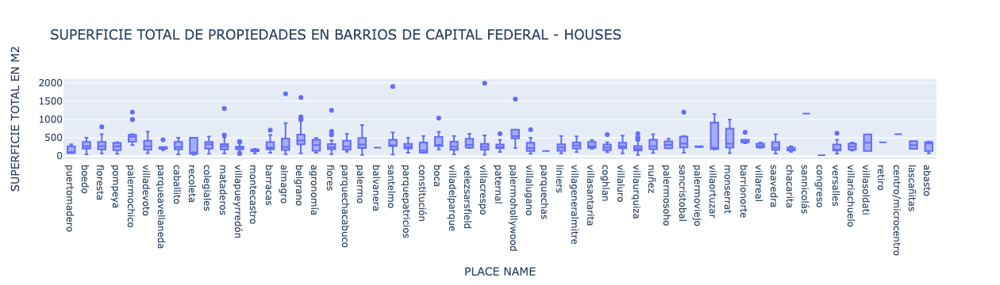

In [147]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - HOUSES')
fig.show()

In [148]:
df_house = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]


### Floresta - house

In [149]:
floresta_index = df_house[df_house['PLACE NAME']=='floresta'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='floresta'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
38832,800.000,ventacasaenrumenco4amb,hermosacasaenventaenelexclusivobarrioderumenco...


In [150]:
df.loc[floresta_index,'SUPERFICIE TOTAL EN M2']=240

### Palermochico - house

In [151]:
palermochico_index = df_house[df_house['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3].index
df_house[df_house['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]


,SUPERFICIE TOTAL EN M2,title,description
71861,1200.000,casa-palermochico,excepcionalcasaenventaenbarrioparqueexcepciona...
13766,1000.000,casaestilofrances,importantecasadeestilofrancés-jardínconpiletad...
46401,1000.000,imponentecasaenbarrioparque!!!,importanteresidenciaubicadaenbarrioparquelapro...


Se tratan de casos particulares de casas de muy alto nivel, vamos a dropearlas, ya que no son comunes.

In [152]:
df = df.drop(palermochico_index)

### Parque Avellaneda - house

In [153]:
df[df['PLACE NAME']=='parqueavellaneda'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
49985,447.000,casaenventa,"ventadecasa7ambientesomasenparqueavellaneda,ca..."


### Villa Pueyrredon - house

In [154]:
pueyrredon_index_max=df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index

pueyrredon_index_min = pueyrredon_index_max=df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:40].index


# df[df['PLACE NAME']=='villapueyrredón'].\
#                 sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]

df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description
20617,70.000,casaenventa,ventadecasatipotriplex3ambientesenvillapueyrre...


In [155]:
#No queda claro si es un departamento, o una casa, o ambos.
df = df.drop(pueyrredon_index_max[0])
df.loc[pueyrredon_index_min[0],'TIPO DE PROPIEDAD']='duplex/triplex'

### Barracas - house

In [156]:
barracas_index = df_house[df_house['PLACE NAME']=='barracas'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index
df_house[df_house['PLACE NAME']=='barracas'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description','TIPO DE PROPIEDAD']][:2]

,SUPERFICIE TOTAL EN M2,title,description,TIPO DE PROPIEDAD
7388,710.000,excelenteedificioenblock::idealinversiónparasu...,"excelenteedificioenblockconstituidopor4deptos,...",house
10024,580.000,avregimientosdepatriicios::casade5ambconlocald...,casaenventayalquilerde580m2enlaplantabajaposee...,house


Ambos son casos especiales, uno es un edificio, y el otro es una casa que tambien tiene un local

In [157]:
df = df.drop(barracas_index)

### Almagro - house

In [158]:
almagro_index=df_house[df_house['PLACE NAME']=='almagro'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='almagro'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
17830,1700.000,casaenventa,"ventadecasa8ambientesenalmagro,capitalfederall..."


tiene problemas de papeles esta propiedad

In [159]:
df = df.drop(almagro_index[0])

### Belgrano - house


In [160]:
belgrano_index = df_house[df_house['PLACE NAME']=='belgrano'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3].index
df_house[df_house['PLACE NAME']=='belgrano'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]

,SUPERFICIE TOTAL EN M2,title,description
30202,1600.000,11deseptiembre1500,"excelentecasadeestilo,absolutamenterefaccionad..."
45644,1070.000,virreydelpino3500,"casainglesaestilotudor,deprincipiosde1900compl..."
13779,1050.000,impactantecasaestiloinglés,impactantecasaestiloingléseninmejorableubicaci...


In [161]:
df.loc[belgrano_index[1],'SUPERFICIE TOTAL EN M2']=870

### Flores - house


In [162]:
flores_index = df_house[df_house['PLACE NAME']=='flores'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4].index
df_house[df_house['PLACE NAME']=='flores'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4]

,SUPERFICIE TOTAL EN M2,title,description
78356,1251.000,casa-flores,"ventaexcelentecasa7ambientespb:estarcomedor,co..."
12329,676.000,casaenventa,ventadecasa6ambientesenfloresmagnificaresidenc...
56234,610.000,casaenventa,"ventadecasa3ambientescontallerenflores,capital..."
10461,580.000,sevendecasadecategoríade580m2cubiertoscondepar...,sevendeesplendidacasaenfloressobrelacalledolor...


In [163]:
#La casa tambien incluye un departamento dentro
df = df.drop(flores_index[3])

### Don Bosco - house

In [164]:
donbosco_index = df_house[df_house['PLACE NAME']=='donbosco'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='donbosco'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description


In [165]:
df.loc[donbosco_index,'SUPERFICIE TOTAL EN M2']=1246

### San Telmo - house

In [166]:
otl_santelmo=df_house[df_house['PLACE NAME']=='santelmo'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


otl_santelmo_min=df_house[df_house['PLACE NAME']=='santelmo'].\
sort_values('SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:2]
otl_santelmo_min

,SUPERFICIE TOTAL EN M2,title,description
3926,45.000,u$d78000-tipocasaphenventa-peru1200,"còmodoph,2ambientes-bajasexpensas-cercanoahist..."
55211,167.000,casaenterrenopropioconlocalcomercialygarage,"casaconlocal,garage,terrazaaccesiblebañocomple..."


Es un caso muy particular de propiedad, vamos a dropearlo

In [167]:
df = df.drop(otl_santelmo.index[0])

In [168]:
df.loc[otl_santelmo_min.index[0],'TIPO DE PROPIEDAD']='ph'

### Boca - house

In [169]:
otl_boca=df_house[df_house['PLACE NAME']=='boca'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_boca

,SUPERFICIE TOTAL EN M2,title,description
55580,1038.000,casaantiguasobrelotepropio,"amtsdelaavalmirantebrownydepedrodemendoza,seen..."


In [170]:
#Tiene varios locales esta propiedad

df= df.drop(otl_boca.index)

### Villa del Parque - house

In [171]:
otl_villadelparque=df_house[df_house['PLACE NAME']=='villadelparque'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_villadelparque

,SUPERFICIE TOTAL EN M2,title,description
6812,552.000,excelentecasade408metroscub5dormitoriosusosmul...,"casasobrelotede866x37,de5dormitorios4baños,con..."


### Mataderos - house

In [172]:
otl_mataderos=df_house[df_house['PLACE NAME']=='mataderos'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]
otl_mataderos

,SUPERFICIE TOTAL EN M2,title,description
118186,1300.000,casa-mataderos,importanteresidenciade1300m2totalessobrelotede...
103018,575.000,casa-mataderos,ventacasaenmataderos3ambientescongarajecasasob...


In [173]:
#El primer caso es muy raro, vamos a dropearlo.
df = df.drop(otl_mataderos.index[0])

### Villa Crespo - house

In [174]:
otl_crespo=df_house[df_house['PLACE NAME']=='villacrespo'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_crespo

,SUPERFICIE TOTAL EN M2,title,description
18525,1991.000,casade5ambientesenventaenvillacrespo,excelentepropiedaddoblefrentecasacongalponde60...


In [175]:
df.loc[otl_crespo.index,'SUPERFICIE TOTAL EN M2']=495

### Paternal - house

In [176]:
otl_paternal=df_house[df_house['PLACE NAME']=='paternal'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_paternal

,SUPERFICIE TOTAL EN M2,title,description
14487,612.000,casade4ambientesenventaenpaternal,"excelenteloteparaedificar,salen1636metrosvendi..."


In [177]:
df = df.drop(otl_paternal.index[0])

### Villa lugano - house

In [178]:
otl_lugano=df_house[df_house['PLACE NAME']=='villalugano'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_lugano

,SUPERFICIE TOTAL EN M2,title,description
20608,723.000,casaenventa,"ventadecasa3ambientesenvillalugano,capitalfede..."


Es un caso particular, vamos a dropearlo.

In [179]:
df = df.drop(otl_lugano.index)

### Coglhan - house

In [180]:
otl_coghlan=df_house[df_house['PLACE NAME']=='coghlan'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_coghlan

,SUPERFICIE TOTAL EN M2,title,description
118499,588.000,casasobrelotede866x40,"casadecategoriasobrelotepropiode866x40,importa..."


In [181]:
#Se trata de una casa muy grande, es un caso especial

df = df.drop(otl_coghlan.index)

### Villa Urquiza - house

In [182]:
otl_urquiza=df_house[df_house['PLACE NAME']=='villaurquiza'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]
otl_urquiza

,SUPERFICIE TOTAL EN M2,title,description
120329,613.000,casa-villaurquiza,unacasaexcepcionalenelcorazóndevillaurquizasob...
13066,500.000,"reservado-casasobrelotepropiode8,66x37,53","casade4ambientesconjardín,quinchoconparrillayt..."
120795,500.000,casa-villaurquiza,"casade4ambientesconjardín,quinchoconparrillayt..."


In [183]:
#El primer valor, es un caso particular, y dsp el otro, esta duplicado

df = df.drop(otl_urquiza.index[:2])

### Barrio Norte - house

In [184]:
otl_norte=df_house[df_house['PLACE NAME']=='barrionorte'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_norte

,SUPERFICIE TOTAL EN M2,title,description
72340,650.000,edificoenventabarrionorte,edificioenventabarrionorteplanchetadisponible


In [185]:
#Se trata de un edificio entero
df=df.drop(otl_norte.index)

In [186]:
df_casas_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
df_casas_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,1.000,532.000,3.000,1258.000,975.000,831.000,1283.000,1281.000,1423.000
mean,2.000,4.829,5367.000,235.874,307.031,1606.919,464090.179,463618.033,1.000
std,NaN,1.784,5039.640,273.789,182.971,926.417,453082.664,452787.829,0.000
min,2.000,1.000,1.000,1.000,28.000,257.143,63000.000,63000.000,1.000
25%,2.000,4.000,3050.500,130.000,184.500,1062.869,240000.000,240000.000,1.000
50%,2.000,5.000,6100.000,200.000,268.000,1423.358,350000.000,350000.000,1.000
75%,2.000,6.000,8050.000,300.000,400.000,1946.612,500000.000,500000.000,1.000
max,2.000,18.000,10000.000,8175.000,1600.000,12121.212,6200000.000,6200000.000,1.000


In [187]:
muchos_m2_cubiertos=df_casas_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending=False)[:7].index
df_casas_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending=False)[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
56791,sell,house,liniers,|argentina|capitalfederal|liniers|,argentina,capitalfederal,3431333.000,"-34642482,-58528451",-34.642,-58.528,165000.000,usd,2911342.500,165000.000,NaN,8175.000,NaN,20.183,NaN,4.000,NaN,http://wwwproperaticomar/19rpq_venta_casa_lini...,corredorresponsable:jorgesalafia-cucicba5666co...,ventacasa4ambc/cocheraenliniers,https://thumbs4properaticom/5/fkqbchzwceg_vmhp...,liniers,8175.000,NaN,NaN,165000.000,usd,165000.000,house,1.000
30202,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345639863,-584466546",-34.564,-58.447,NaN,NaN,NaN,NaN,1600.000,1600.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/180qv_venta_casa_belg...,"excelentecasadeestilo,absolutamenterefaccionad...",11deseptiembre1500,https://thumbs4properaticom/2/fyxzhd0iv9wqmgsy...,belgrano,1600.000,1600.000,NaN,NaN,NaN,NaN,house,1.000
18525,sell,house,villacrespo,|argentina|capitalfederal|villacrespo|,argentina,capitalfederal,3427458.000,"-346019154,-584443228",-34.602,-58.444,NaN,NaN,NaN,NaN,1991.000,1240.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1774k_venta_casa_vill...,excelentepropiedaddoblefrentecasacongalponde60...,casade5ambientesenventaenvillacrespo,https://thumbs4properaticom/6/yueu85uo9nubxz_k...,villacrespo,1240.000,495.000,NaN,NaN,NaN,NaN,house,1.000
60198,sell,house,sancristobal,|argentina|capitalfederal|sancristobal|,argentina,capitalfederal,3429153.000,"-346262123,-583970854",-34.626,-58.397,1500000.000,usd,26466750.000,1500000.000,1200.000,1200.000,1250.000,1250.000,NaN,NaN,NaN,http://wwwproperaticomar/19yrf_venta_casa_san-...,"excelentepropiedadenlotepropio,ubicadaenelbarr...",casaenventa,https://thumbs4properaticom/0/nca0hkow9r-x-aaj...,sancristobal,1200.000,1200.000,1250.000,1500000.000,usd,1500000.000,house,1.000
23311,sell,house,santelmo,|argentina|capitalfederal|santelmo|,argentina,capitalfederal,3428113.000,"-34623938,-58371177",-34.624,-58.371,1380000.000,usd,24349410.000,1380000.000,NaN,1030.000,NaN,1339.806,NaN,9.000,NaN,http://wwwproperaticomar/17lb0_venta_casa_san-...,corredorresponsable:joseguendler-cucicba811con...,impactantepropiedadentrespisosretasada!!,https://thumbs4properaticom/5/g9s5lb8uf5kmdt3h...,santelmo,1030.000,284.000,NaN,1380000.000,usd,1380000.000,house,1.000
13528,sell,house,villaortuzar,|argentina|capitalfederal|villaortuzar|,argentina,capitalfederal,3427387.000,"-345686572,-584643072",-34.569,-58.464,2500000.000,usd,44111250.000,2500000.000,1150.000,1015.000,2173.913,2463.054,NaN,NaN,NaN,http://wwwproperaticomar/16piv_venta_casa_belg...,codigo:4ubicadoen:conde-publicadopor:n&fpropie...,espectacularcasadoblefrenteenbelgranor,https://thumbs4properaticom/6/3v5tdwzwjg-pars6...,villaortuzar,1015.000,1150.000,2173.913,2500000.000,usd,2500000.000,house,1.000
13158,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-34570631,-58462415",-34.571,-58.462,2500000.000,usd,44111250.000,2500000.000,NaN,1015.000,NaN,2463.054,NaN,12.000,NaN,http://wwwproperaticomar/16oaq_venta_casa_belg...,corredorresponsable:danielacosta-cucicba2406co...,imponenteresidencia720mts2deterrenoy3pisos,https://thumbs4properaticom/7/tmy1i-jw7rmtifns...,belgrano,1015.000,NaN,NaN,2500000.000,usd,2500000.000,house,1.000


Una superficie cubierta de 8000m2 para una casa, es muy extraño,asi como tambien un valor de superficie total inferior a superficie cubierta

In [188]:
df = df.drop(muchos_m2_cubiertos[:4])


In [189]:
# Vamos a poner un minimo de 20m2 cubiertos para casas.
pocos_m2_cubiertos=df_casas_caba[df_casas_caba['SUPERFICIE CUBIERTA EN M2'] < 20].index
df_casas_caba[df_casas_caba['SUPERFICIE CUBIERTA EN M2'] < 20]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
8384,sell,house,villadevoto,|argentina|capitalfederal|villadevoto|,argentina,capitalfederal,3427451.000,"-346113787,-585014969",-34.611,-58.501,220000.000,usd,3881790.000,220000.000,NaN,1.000,NaN,220000.000,NaN,NaN,NaN,http://wwwproperaticomar/160ub_venta_casa_vill...,plantabajalivingcomedorpisoceramicoc/placardde...,marcossastre4100casade3ambientesalfrentesobrel...,https://thumbs4properaticom/3/qjo5ij35pbeubkui...,villadevoto,1.000,NaN,NaN,220000.000,usd,220000.000,house,1.000
8390,sell,house,villasantarita,|argentina|capitalfederal|villasantarita|,argentina,capitalfederal,6693230.000,"-34613523,-584908717",-34.614,-58.491,240000.000,usd,4234680.000,240000.000,NaN,1.000,NaN,240000.000,NaN,NaN,NaN,http://wwwproperaticomar/160ux_venta_casa_vill...,garageenpb-c/bauleraybañoprimerpisoporescalera...,pjetokio2000-casade4ambientesconescritorios/lo...,https://thumbs4properaticom/4/2v4brxqjkxm7llb8...,villasantarita,1.000,NaN,NaN,240000.000,usd,240000.000,house,1.000
22590,sell,house,villadelparque,|argentina|capitalfederal|villadelparque|,argentina,capitalfederal,3427455.000,"-346075704,-584953795",-34.608,-58.495,380000.000,usd,6704910.000,380000.000,259.000,1.000,1467.181,380000.000,NaN,NaN,NaN,http://wwwproperaticomar/17j9m_venta_casa_vill...,"casalotepropio,3ambientesconlocalalfrentecuent...",ventacasa-villadelparque-marcossastre3500,https://thumbs4properaticom/4/ohcdlknqndjslnlq...,villadelparque,1.000,259.000,1467.181,380000.000,usd,380000.000,house,1.000
33557,sell,house,villalugano,|argentina|capitalfederal|villalugano|,argentina,capitalfederal,3427408.000,"-34679962,-584685505",-34.680,-58.469,225000.000,usd,3970012.500,225000.000,NaN,1.000,NaN,225000.000,NaN,NaN,NaN,http://wwwproperaticomar/189ld_venta_casa_vill...,"casaparadosfamilias,congalpónidealtallerdecost...",casaenventaenvillaluganoparadosfamilias,https://thumbs4properaticom/2/9caloskpmchalzpo...,villalugano,1.000,NaN,NaN,225000.000,usd,225000.000,house,1.000
33558,sell,house,villalugano,|argentina|capitalfederal|villalugano|,argentina,capitalfederal,3427408.000,"-346776466,-584705797",-34.678,-58.471,200000.000,usd,3528900.000,200000.000,NaN,1.000,NaN,200000.000,NaN,NaN,NaN,http://wwwproperaticomar/189le_venta_casa_vill...,hermosacasatipochaletde2plantasenventaenvillal...,casatipochaletendosplantasenventa,https://thumbs4properaticom/2/3rn_zkmi59v21gc_...,villalugano,1.000,NaN,NaN,200000.000,usd,200000.000,house,1.000
42575,sell,house,montecastro,|argentina|capitalfederal|montecastro|,argentina,capitalfederal,3430596.000,"-34620674,-585058262",-34.621,-58.506,410000.000,usd,7234245.000,410000.000,NaN,1.000,NaN,410000.000,NaN,NaN,NaN,http://wwwproperaticomar/18wqg_venta_casa_mont...,casade6ambientess/lotede10m2x28m2jardinalfrent...,casade6ambientess/lotede10m2x28m2,https://thumbs4properaticom/9/bzg3vdtx8m9rkn5t...,montecastro,1.000,NaN,NaN,410000.000,usd,410000.000,house,1.000
48473,sell,house,versalles,|argentina|capitalfederal|versalles|,argentina,capitalfederal,3427510.000,"-346260871,-585202126",-34.626,-58.520,510000.000,usd,8998695.000,510000.000,NaN,1.000,NaN,510000.000,NaN,NaN,NaN,http://wwwproperaticomar/19a7u_venta_casa_vers...,plantabajacocheracubiertalivingcomedorendesniv...,"ruizdelosllanos1400-casade5ambientess/lotede8,...",https://thumbs4properaticom/2/52mjdjvstdpnc6nk...,versalles,1.000,NaN,NaN,510000.000,usd,510000.000,house,1.000
54532,sell,house,villadelparque,|argentina|capitalfederal|villadelparque|,argentina,capitalfederal,3427455.000,"-34616343,-585098021",-34.616,-58.510,350000.000,usd,6175575.000,350000.000,1

In [190]:
df = df.drop(pocos_m2_cubiertos)

In [191]:
muchos_m2_totales=df_casas_caba.sort_values('SUPERFICIE TOTAL EN M2', ascending=False)[:7].index
df_casas_caba.sort_values('SUPERFICIE TOTAL EN M2', ascending=False)[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
30202,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345639863,-584466546",-34.564,-58.447,NaN,NaN,NaN,NaN,1600.000,1600.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/180qv_venta_casa_belg...,"excelentecasadeestilo,absolutamenterefaccionad...",11deseptiembre1500,https://thumbs4properaticom/2/fyxzhd0iv9wqmgsy...,belgrano,1600.000,1600.000,NaN,NaN,NaN,NaN,house,1.000
66895,sell,house,palermohollywood,|argentina|capitalfederal|palermo|palermoholly...,argentina,capitalfederal,NaN,"-345834449283,-584373002989",-34.583,-58.437,3500000.000,usd,61755750.000,3500000.000,1556.000,NaN,2249.357,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1aejf_venta_casa_pale...,excepcionaledificiotipoindustrial-granpropieda...,casa-palermohollywood,https://thumbs4properaticom/6/biant1793rsguzyb...,palermohollywood,NaN,1556.000,2249.357,3500000.000,usd,3500000.000,house,1.000
78356,sell,house,flores,|argentina|capitalfederal|flores|,argentina,capitalfederal,3433918.000,"-346334926681,-584572314074",-34.633,-58.457,NaN,NaN,NaN,NaN,1251.000,744.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1au1m_venta_casa_flor...,"ventaexcelentecasa7ambientespb:estarcomedor,co...",casa-flores,https://thumbs4properaticom/0/pi5rk8ktwftbrpxi...,flores,744.000,1251.000,NaN,NaN,NaN,NaN,house,1.000
60198,sell,house,sancristobal,|argentina|capitalfederal|sancristobal|,argentina,capitalfederal,3429153.000,"-346262123,-583970854",-34.626,-58.397,1500000.000,usd,26466750.000,1500000.000,1200.000,1200.000,1250.000,1250.000,NaN,NaN,NaN,http://wwwproperaticomar/19yrf_venta_casa_san-...,"excelentepropiedadenlotepropio,ubicadaenelbarr...",casaenventa,https://thumbs4properaticom/0/nca0hkow9r-x-aaj...,sancristobal,1200.000,1200.000,1250.000,1500000.000,usd,1500000.000,house,1.000
21605,sell,house,sannicolás,|argentina|capitalfederal|sannicolás|,argentina,capitalfederal,6693229.000,"-346042126,-583894037",-34.604,-58.389,350000.000,usd,6175575.000,350000.000,1159.000,440.000,301.984,795.455,NaN,NaN,NaN,http://wwwproperaticomar/17ftc_venta_casa_san-...,codigo:2563-cas-mon1500ubicadoen:montevideon°1...,importantepropiedadalaventaenbellavista,https://thumbs4properaticom/3/qiufghbfbwa3seyv...,sannicolás,440.000,1159.000,301.984,350000.000,usd,350000.000,house,1.000
13528,sell,house,villaortuzar,|argentina|capitalfederal|villaortuzar|,argentina,capitalfederal,3427387.000,"-345686572,-584643072",-34.569,-58.464,2500000.000,usd,44111250.000,2500000.000,1150.000,1015.000,2173.913,2463.054,NaN,NaN,NaN,http://wwwproperaticomar/16piv_venta_casa_belg...,codigo:4ubicadoen:conde-publicadopor:n&fpropie...,espectacularcasadoblefrenteenbelgranor,https://thumbs4properaticom/6/3v5tdwzwjg-pars6...,villaortuzar,1015.000,1150.000,2173.913,2500000.000,usd,2500000.000,house,1.000
13779,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-34570603,-584609372",-34.571,-58.461,2800000.000,usd,49404600.000,2800000.000,1050.000,980.000,2666.667,2857.143,NaN,NaN,NaN,http://wwwproperaticomar/16qbq_venta_casa_belg...,impactantecasaestiloingléseninmejorableubicaci...,impactantecasaestiloinglés,https://thumbs4properaticom/0/fe-txsshqt0kzsgs...,belgrano,980.000,1050.000,2666.667,2800000.000,usd,2800000.000,house,1.000


In [192]:
# Muchos m2 totales para su zona

df = df.drop(muchos_m2_totales[1])
df = df.drop(muchos_m2_totales[2])

In [193]:
muy_barata=df_casas_caba.sort_values('PRECIO USD POR M2')[:7].index
df_casas_caba.sort_values('PRECIO USD POR M2')[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
10501,sell,house,boca,|argentina|capitalfederal|boca|,argentina,capitalfederal,3436004.000,"-346344961,-583631337",-34.634,-58.363,135000.000,usd,2382007.500,135000.000,525.000,525.000,257.143,257.143,NaN,NaN,NaN,http://wwwproperaticomar/1686m_venta_casa_boca...,casaenlotepropiode844defrentepor3637defondoubi...,casamultifamiliarenlaboca,https://thumbs4properaticom/1/obijtl5acmc-ieup...,boca,525.000,525.000,257.143,135000.000,usd,135000.000,house,1.000
13428,sell,house,caballito,|argentina|capitalfederal|caballito|,argentina,capitalfederal,3435874.000,"-34624673,-584302634",-34.625,-58.430,130000.000,usd,2293785.000,130000.000,450.000,100.000,288.889,1300.000,NaN,4.000,NaN,http://wwwproperaticomar/16p65_venta_casa_caba...,"casacontresdormitoriosy1baño,ampliococinalivin...",mardelaspampasampliacasa,https://thumbs4properaticom/5/tvgkileon4x_nxs3...,caballito,100.000,450.000,288.889,130000.000,usd,130000.000,house,1.000
21605,sell,house,sannicolás,|argentina|capitalfederal|sannicolás|,argentina,capitalfederal,6693229.000,"-346042126,-583894037",-34.604,-58.389,350000.000,usd,6175575.000,350000.000,1159.000,440.000,301.984,795.455,NaN,NaN,NaN,http://wwwproperaticomar/17ftc_venta_casa_san-...,codigo:2563-cas-mon1500ubicadoen:montevideon°1...,importantepropiedadalaventaenbellavista,https://thumbs4properaticom/3/qiufghbfbwa3seyv...,sannicolás,440.000,1159.000,301.984,350000.000,usd,350000.000,house,1.000
55601,sell,house,boca,|argentina|capitalfederal|boca|,argentina,capitalfederal,3436004.000,"-34633823,-583598175",-34.634,-58.360,125000.000,usd,2205562.500,125000.000,400.000,100.000,312.500,1250.000,NaN,NaN,NaN,http://wwwproperaticomar/19pd3_venta_casa_boca...,codigo:2388-llg1123ubicadoen:santamaría1005-pu...,propiedada300metrosdeavenidahyrigoyen,https://thumbs4properaticom/0/tp3ad54ptrlxddpu...,boca,100.000,400.000,312.500,125000.000,usd,125000.000,house,1.000
4888,sell,house,boca,|argentina|capitalfederal|boca|,argentina,capitalfederal,3436004.000,"-346370988,-583582907",-34.637,-58.358,180000.000,usd,3176010.000,180000.000,524.000,524.000,343.511,343.511,NaN,NaN,NaN,http://wwwproperaticomar/15odp_venta_casa_boca...,casaenlotepropiode844defrentepor3637defondoubi...,casaenterrenopropiocon6departamentos,https://thumbs4properaticom/0/9hhgigbrqkgmfux5...,boca,524.000,524.000,343.511,180000.000,usd,180000.000,house,1.000
141,sell,house,floresta,|argentina|capitalfederal|floresta|,argentina,capitalfederal,3433910.000,"-346280255,-584662479",-34.628,-58.466,219500.000,usd,3872967.750,219500.000,600.000,170.000,365.833,1291.176,NaN,3.000,NaN,http://wwwproperaticomar/15d71_venta_casa_mar-...,exclusivochaletenaltosdesierradelospadresaesca...,chaletsierras,https://thumbs4properaticom/4/bz9li7uvgcvclwhr...,floresta,170.000,600.000,365.833,219500.000,usd,219500.000,house,1.000
15217,sell,house,floresta,|argentina|capitalfederal|floresta|,argentina,capitalfederal,3433910.000,"-346246787,-584874405",-34.625,-58.487,75000.000,usd,1323337.500,75000.000,200.000,55.000,375.000,1363.636,NaN,3.000,NaN,http://wwwproperaticomar/16ug1_venta_casa_flor...,casa3amb(55m2)concocheraauna1y1/2delbalnearioc...,casa3amba1y1/2delmarenstaclara,https://thumbs4properaticom/7/dy2bbsddkftrzcmh...,floresta,55.000,200.000,375.000,75000.000,usd,75000.000,house,1.000


In [194]:
df = df.drop(muy_barata[:1])
#Demasiado bajo el valor de la propiedad mas barata

In [195]:
demasiado_cara = df_casas_caba.sort_values('PRECIO USD', ascending = False)[:7].index
df_casas_caba.sort_values('PRECIO USD', ascending = False)[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
57581,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-3457933,-583995855",-34.579,-58.400,6200000.000,usd,109395900.000,6200000.000,NaN,970.000,NaN,6391.753,NaN,NaN,NaN,http://wwwproperaticomar/19tna_venta_casa_pale...,edificiodeestiloanglo-americanoconladrilloalav...,juezestrada2800,https://thumbs4properaticom/8/isfx2yhxemy1pa7k...,palermochico,970.000,NaN,NaN,6200000.000,usd,6200000.000,house,1.000
5891,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-345804578,-584010945",-34.580,-58.401,4000000.000,usd,70578000.000,4000000.000,330.000,330.000,12121.212,12121.212,NaN,NaN,NaN,http://wwwproperaticomar/15s4h_venta_casa_pale...,planosdeimportanteestudiodearquitecturacasamod...,casamodernadedoblefrenteenimpecableestado,https://thumbs4properaticom/4/bovqmydeafcf3amc...,palermochico,330.000,330.000,12121.212,4000000.000,usd,4000000.000,house,1.000
66895,sell,house,palermohollywood,|argentina|capitalfederal|palermo|palermoholly...,argentina,capitalfederal,NaN,"-345834449283,-584373002989",-34.583,-58.437,3500000.000,usd,61755750.000,3500000.000,1556.000,NaN,2249.357,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1aejf_venta_casa_pale...,excepcionaledificiotipoindustrial-granpropieda...,casa-palermohollywood,https://thumbs4properaticom/6/biant1793rsguzyb...,palermohollywood,NaN,1556.000,2249.357,3500000.000,usd,3500000.000,house,1.000
27533,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-345774344,-584014371",-34.577,-58.401,3200000.000,usd,56462400.000,3200000.000,527.000,527.000,6072.106,6072.106,NaN,NaN,NaN,http://wwwproperaticomar/17ttt_venta_casa_pale...,"excelentecasadeestiloclásicoconpileta,jardínyp...",ombu2900,https://thumbs4properaticom/9/7ynvrpjlsf92cql2...,palermochico,527.000,527.000,6072.106,3200000.000,usd,3200000.000,house,1.000
20328,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-345775100971,-584013239437",-34.578,-58.401,3200000.000,usd,56462400.000,3200000.000,600.000,500.000,5333.333,6400.000,NaN,NaN,NaN,http://wwwproperaticomar/17cbo_venta_casa_pale...,espectacularcasaenunadelascallesmáslindasdebar...,barrioparque:espectacularcasaconpiletasobreombú,https://thumbs4properaticom/6/ywvgsq0ciuppe_g4...,palermochico,500.000,600.000,5333.333,3200000.000,usd,3200000.000,house,1.000
70839,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,NaN,NaN,NaN,3200000.000,usd,56462400.000,3200000.000,530.000,530.000,6037.736,6037.736,NaN,NaN,NaN,http://wwwproperaticomar/1ak4z_venta_casa_pale...,"casaenbarrioparqueconjardín,parrillaypileta,to...",importantecasaenbarrioparque,https://thumbs4properaticom/2/yfvgiepcsow8yu1z...,palermochico,530.000,530.000,6037.736,3200000.000,usd,3200000.000,house,1.000
81174,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345688913339,-584381186543",-34.569,-58.438,3000000.000,usd,52933500.000,3000000.000,1000.000,700.000,3000.000,4285.714,NaN,NaN,NaN,http://wwwproperaticomar/1axoo_venta_casa_belg...,exclusivochaletdecuatroplantasdeestiloenimpeca...,exclusivacasade700m2cubiertosconjardínconpiscina,https://thumbs4properaticom/1/2pq_xd0uahem2-de...,belgrano,700.000,1000.000,3000.000,3000000.000,usd,3000000.000,house,1.000


In [196]:
# El valor mas caro, es un edificio, no una casa
df = df.drop(demasiado_cara[1])


## PH

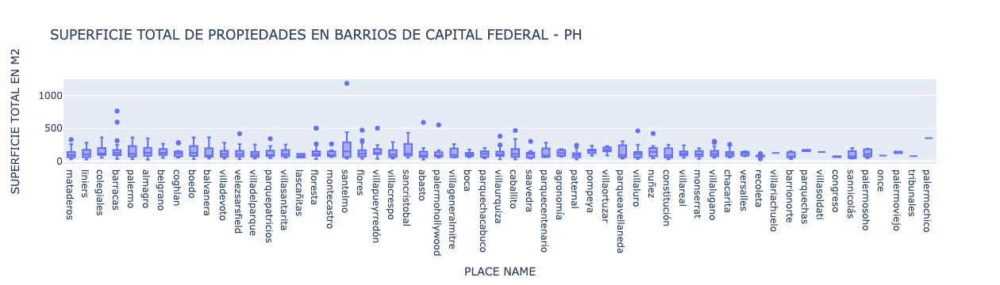

In [197]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PH')
fig.show()

In [198]:
df_ph = df[df['TIPO DE PROPIEDAD']=='ph']

### Mataderos - PH

In [199]:
otl_mataderos=df_ph[df_ph['PLACE NAME']=='mataderos'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:5]
otl_mataderos[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
557,326.000,245000.000,hermosacasaenventaenmataderos,"espectacularphalfrenteenplantabaja,ubicadoenla..."
29476,260.000,130000.000,phalfondo7ambientes-mataderos-guamini2400,6habitacionescocina2bañosterrazac/preparadopar...
26029,260.000,180000.000,ph7ambconfondo,"phen2plantasconfondoyparrilla,7ambientes,3baos..."
77336,260.000,290000.000,phmataderosexcelenteoportunidadpara2familias,oportunidadpara2familiaspropiedadconjuntayalav...
18480,250.000,200000.000,"excelente5ambientescongge,3baños,patio,terraza...","excelente5ambientescongge,3baños,cocinacomedor..."


In [200]:
# Con el primer valor, no queda claro si es un ph o una casa, vamos a dropearlo
df = df.drop(otl_mataderos.index[:1])


### Barracas - PH

In [201]:
otl_barracas=df_ph[df_ph['PLACE NAME']=='barracas'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_barracas[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
60990,762.000,1250000.000,phenventa,son11departamentos/estudiosenblock¡¡todosalqui...
22518,593.000,350000.000,phde6ambientesconterrazayentradaindependiente,phde6ambientesconterrazayentradaindependientee...
4901,310.000,250000.000,ph4ambientescondependencia2patiosyterraza,hermosophconentradaindependiente2patios2terraz...


In [202]:
# Los 2 ph mas grandes, son casos muy particulares, vamos a dropearlos, ya que es poco usual un inmueble de esas caracteristicas.

df = df.drop(otl_barracas.index[:2])

### Coghlan - PH

In [203]:
otl_coghlan=df_ph[df_ph['PLACE NAME']=='coghlan'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_coghlan[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
75098,280.000,319000.000,ph-coghlan,"phalfrenteenpbsinexpensas,entradaindependiente..."
20574,276.000,350000.000,phenventa,"importantephapulmóndemanzanaalnoroeste,conunac..."


### Velez Sardfield - PH

In [204]:
otl_velezsardfield=df_ph[df_ph['PLACE NAME']=='velezsarsfield'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_velezsardfield[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
116919,417.000,365000.000,phenvelezsarsfield,elinmuebleesunaphdetresunidadesfuncionaleslauf...
37930,260.000,300000.000,redesanmartin4527vélezsphpb4ambu$300000aptoprof,"ultimopreciou$300000oportunidad,con70m2deparqu..."


In [205]:
# Vamos a dropear este caso particular de ph enorme para lo que es la zona y los valores promedio de m2 de ph.
df = df.drop(otl_velezsardfield.index[:1])


### Parque Patricios - PH

In [206]:
otl_parquepatricios=df_ph[df_ph['PLACE NAME']=='parquepatricios'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_parquepatricios[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
35641,340.000,176000.000,ideal2familiasretasadaoportunidadnoselopierdaa...,"oportunidad,noselopierda,propiedadubicadaenbar..."
47568,230.000,NaN,"venta-ph4amb,c/cochera,patioyterraza-pquepatri...",codigo:1717-522ubicadoen:cátulocastillo2300-pu...


In [207]:
# Vamos a dropear este caso particular de ph enorme para lo que es la zona y los valores promedio de m2 de ph.

df=df.drop(otl_parquepatricios.index[:1])

### Floresta - PH

In [208]:
otl_floresta=df_ph[df_ph['PLACE NAME']=='floresta'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_floresta[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
42668,500.000,280000.000,floresta-oportunidad-edificio-hotelen2plantasc...,"codigo:07ubicadoen:josebonifacio3100,caba,-pub..."
40934,500.000,280000.000,floresta-oportunidad-edificio-hotelen2plantasc...,edificio-hotelen2plantascon12departamentosconb...
51357,260.000,280000.000,phenventa,operacion:ventatipodepropiedad:phambientes:6lo...


In [209]:
# Vamos a dropear los 2 valores, que son duplicados y refieren a un hotel.

df=df.drop(otl_floresta.index[:2])

### Montecastro - PH

In [210]:
otl_montecastro=df_ph[df_ph['PLACE NAME']=='montecastro'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_montecastro[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
21787,260.000,230000.000,phenventa,"ventadephpisounico4ambientesenmontecastro,capi..."
32781,165.000,214900.000,excelentephmontecastroc/terraza,"excelentephtipocasamuybuenaubicacion,aunacuadr..."


In [211]:
# Vamos a dropear este ph, ya que se trata de un caso particular

df=df.drop(otl_montecastro.index[:1])

### Flores - PH

In [212]:
otl_flores=df_ph[df_ph['PLACE NAME']=='flores'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_flores[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
71260,471.000,280000.000,"ph6ambc/patio,terrazaycochera-",departamentotipophde6ambientesenelbarriodeflor...
51445,313.000,315000.000,phenventa,"ventadeph4ambientesenflores,capitalfederalimpe..."
72099,275.000,395000.000,excelentephenflores3dormgranterrazaconquincho,phenprimerpisoconescaleradetresdormitoriosmasq...
30792,272.000,285000.000,ph5ambientesalfrenteentradaindependienteconter...,directorioymembrillar:phpisoúnicodeestiloalfre...


In [213]:
# Vamos a dropear este ph, ya que se trata de un caso particular

df=df.drop(otl_flores.index[:1])

### Villa Pueyrredon - PH

In [214]:
otl_pueyrredon=df_ph[df_ph['PLACE NAME']=='villapueyrredón'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_pueyrredon[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
10592,500.000,700000.000,"depto5amb+casa7amb,cocherapara6autos",setratadedospropiedadesenuna:-->-->entrandopor...
114037,244.000,450000.000,cochera-jardin-quincho-parrilla-impecable,"excelentepropiedadenimportantecomplejo,amtsdea..."
4931,201.000,291000.000,villapueyrredon-ph2dorm+escrit-excelenteestado...,phenprimerpisoporescalera-excelenteestadorecic...
72772,185.000,220000.000,habana3200phvillapueyrredon4ambientes,muybuenphdegenerosasmedidasseaccedeporescalera...


In [215]:
# Vamos a dropear este valor, ya que es un aglomerado de varios tipos de propiedades.

df=df.drop(otl_pueyrredon.index[:1])

### Abasto - PH

In [216]:
otl_abasto=df_ph[df_ph['PLACE NAME']=='abasto'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_abasto[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
87105,590.000,510000.000,ventacasade7ambientesenabasto,"importantephconentradaindependienteantiguo,rec..."
8874,200.000,254900.000,impecablephrecicladoenabasto,sarmiento3200phenabastorecicladoanuevo!!excele...
5354,160.000,160000.000,phenventa,"4ambientesconpatioyterrazaalfrente,enventa,ena..."
30229,141.000,129000.000,"phconterraza,sinexpensas","excelenteubicación,corazóndelabasto,(3cuadrasd..."


In [217]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_abasto.index[:1])

### Villa Urquiza - PH

In [218]:
otl_urquiza=df_ph[df_ph['PLACE NAME']=='villaurquiza'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_urquiza[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
72052,380.000,497000.000,granphenpb-villaurquiza,parainversióndealtarentabilidadgranphenplantab...
19129,245.000,240000.000,ventaph/casa/cochera/local/vurquiza/reciclar,corredorresponsable:unobienesraicessrl-cucicba...
6726,236.000,270000.000,phenventa,ventadepartamentotipoph4ambientesvillaurquizap...
101540,230.000,275000.000,phenventavillaurquiza5ambientesgarajepatioterraza,codigo:973-612337ubicadoen:valdenegro3273-publ...


In [219]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_urquiza[:1].index)

### Caballito - PH

In [220]:
otl_caballito=df_ph[df_ph['PLACE NAME']=='caballito'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_caballito[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
22700,466.000,300000.000,granphenprimerpisoconentradaindependiente,granazoteaygarageolocalalacalleenplantabajaapt...
45392,336.000,590000.000,"imponnetephdeestiloconcocheradoble,terrazayqui...",vermasimagenesen360gradosenhttps://googl/photo...
119246,324.000,410000.000,phventa,"nicolásrepetto1600,espectaculartriplexapareado..."
24365,320.000,332000.000,caballitoph5ambientesconbalconyterraza,"hermosophsobreavsanmartín,cercanoalcidcampeado..."


In [221]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_caballito[:1].index)

### Saavedra - PH

In [222]:
otl_saavedra=df_ph[df_ph['PLACE NAME']=='saavedra'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_saavedra[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
32107,300.000,470000.000,casade5ambientesconcochera,"excelentedúplexenexcelenteubicaciónplantabaja,..."
31507,152.000,245000.000,phenventa,"ventadedepartamento4ambientesensaavedra,phalfr..."
55381,143.000,169900.000,ventadedepartamentoensaavedra,ph2pisoporescalerac/entradaindependientec/come...


In [223]:
df.loc[otl_saavedra.index[:1],'TIPO DE PROPIEDAD']='duplex/triplex'

### Paternal - PH

In [224]:
otl_paternal=df_ph[df_ph['PLACE NAME']=='paternal'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_paternal[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
38697,242.000,350000.000,phenventa,"phde5ambientesenpaternal,capitalfederal-terraz..."
25318,200.000,130000.000,phdobleviviendapb5amby1piso3amb,"multifamiliar,2viviendasomasenplantabaja,5habi..."
52027,195.000,290000.000,excelenteph5ambrecicladoanuevo-(1ºpxesc),"phde5amb-pisounicoconentradaindependiente,sine..."


In [225]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_paternal[:1].index)

### Villa Luro - PH

In [226]:
otl_luro=df_ph[df_ph['PLACE NAME']=='villaluro'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_luro[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
21794,460.000,345000.000,phenventa,"ventadedepositoenvillaluro,capitalfederalsetra..."
71620,250.000,285000.000,ph5ambientesvirgilioal300,excelentephde6ambientesalfrenteconentradaindep...
75596,157.000,215000.000,ph4ambentradaíndeppatioy2tzas,phconentradaindependienteenventaenvillaluroenc...


In [227]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_luro[:1].index)

### Nuñez - PH

In [228]:
otl_nunez=df_ph[df_ph['PLACE NAME']=='nuñez'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_nunez[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
47149,420.000,980000.000,phventa,sevendeenblokcompleto8unidadesplantabajade2amb...
46777,230.000,580000.000,ibera1800(excelenteyamplioph),"phalacalleconentradaindependiente,cocheraparat..."
88098,225.000,600000.000,cochera-nuñez,excelentepropiedadconentradaindependienteideal...


In [229]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_nunez[:1].index)

### Villa Lugano - PH

In [230]:
otl_lugano=df_ph[df_ph['PLACE NAME']=='villalugano'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_lugano[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
39478,301.000,235000.000,phenventa,"villalugano:lote866x3469,superficie301m2,zonif..."
49239,284.000,200000.000,"excelentephde4ambientesydeposito,juntososeparados","constade:tipocasaalfrenteendosplantas,plantaba..."
62891,225.000,170000.000,phfte4ambmuybuenestadoyubicacion,sevendephfrentetipocasaubicadoenlaciudadautóno...


In [231]:
# Vamos a dropear este valor, ya que es un lote

df = df.drop(otl_lugano[:1].index)

### Chacarita - PH

In [232]:
otl_chacarita=df_ph[df_ph['PLACE NAME']=='chacarita'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_chacarita[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
117595,254.000,390000.000,ph-chacarita,"bellisimophalfrente,4ambientes+garageoconsulto..."
31468,230.000,347000.000,phenventa,ventadeph4ambconterrazarecicladoanuevo1erpisop...
23497,140.000,188000.000,phaggiornado3ambientespatioyquincho,"livingcomedor,2dormitorios,patio,quinchoen2dop..."


### San Telmo - PH

In [233]:
otl_santelmo=df_ph[df_ph['PLACE NAME']=='santelmo'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:1]

otl_santelmo[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
113982,1183.000,1290000.000,libertad1200,"inmuebleconstruidoenph,actualmenteutilizadocom..."


Es un caso muy particular, donde el inmueble es un hostel de muy grandes dimensiones.

In [234]:
df = df.drop(otl_santelmo.index)

In [235]:
df_ph_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
df_ph_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,123.000,1002.000,150.000,1441.000,1099.000,1053.000,1511.000,1510.000,1542.000
mean,2.293,3.618,983.140,88.727,123.694,1667.809,186851.357,185982.417,1.000
std,2.279,1.343,1066.722,53.300,72.298,578.619,103306.624,100193.468,0.000
min,1.000,1.000,1.000,1.000,22.000,151.371,45000.000,15591.260,1.000
25%,1.000,3.000,327.500,54.000,70.000,1222.222,120000.000,120000.000,1.000
50%,1.000,3.000,700.000,76.000,105.000,1610.000,160000.000,160000.000,1.000
75%,3.000,4.000,1500.000,110.000,160.000,2047.619,227000.000,225750.000,1.000
max,16.000,12.000,9000.000,400.000,550.000,3630.435,1185000.000,995000.000,1.000


In [236]:
muchos_pisos_ph = df_ph_caba[df_ph_caba.floor > 6].index
df_ph_caba.sort_values('floor', ascending=False)[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
37483,sell,ph,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-34588935,-58432096",-34.589,-58.432,165000.000,usd,2911342.500,165000.000,NaN,20.000,NaN,8250.000,16.000,3.000,NaN,http://wwwproperaticomar/18j9k_venta_ph_palerm...,corredorresponsable:hernanperrone-cucicba2792c...,"phenpalermo,sinexpensas!!!",https://thumbs4properaticom/8/soxj2fxpbp5fokw7...,palermo,20.000,NaN,NaN,165000.000,usd,165000.000,ph,1.000
44398,sell,ph,caballito,|argentina|capitalfederal|caballito|,argentina,capitalfederal,3435874.000,"-34629006,-58431408",-34.629,-58.431,130000.000,usd,2293785.000,130000.000,NaN,44.000,NaN,2954.545,14.000,4.000,NaN,http://wwwproperaticomar/190iu_venta_ph_caball...,corredorresponsable:juancarlostreco-cucicba403...,excelentephenpbaptocredito-aptoprofesional,https://thumbs4properaticom/6/mw7adxyoq8ihneop...,caballito,44.000,NaN,NaN,130000.000,usd,130000.000,ph,1.000
21936,sell,ph,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-34600779,-58415586",-34.601,-58.416,163000.000,usd,2876053.500,163000.000,NaN,20.000,NaN,8150.000,9.000,4.000,NaN,http://wwwproperaticomar/17h14_venta_ph_almagr...,corredorresponsable:danielacosta-cucicba2406co...,ventaphalmagro4ambrestaurado,https://thumbs4properaticom/8/81pgua8x5nwky9_q...,almagro,20.000,NaN,NaN,163000.000,usd,163000.000,ph,1.000
19070,sell,ph,villadelparque,|argentina|capitalfederal|villadelparque|,argentina,capitalfederal,3427455.000,"-34609143,-58501454",-34.609,-58.501,140000.000,usd,2470230.000,140000.000,NaN,20.000,NaN,7000.000,8.000,3.000,NaN,http://wwwproperaticomar/178ov_venta_ph_villa-...,corredorresponsable:matiascastelli-cucicba3678...,ventaexcelenteph3ambvdelparqueaptocrédito,https://thumbs4properaticom/8/vlwx7wmriutwcrn6...,villadelparque,20.000,NaN,NaN,140000.000,usd,140000.000,ph,1.000
62571,sell,ph,balvanera,|argentina|capitalfederal|balvanera|,argentina,capitalfederal,6693228.000,"-34603329,-58397141",-34.603,-58.397,135000.000,usd,2382007.500,135000.000,NaN,97.000,NaN,1391.753,7.000,4.000,NaN,http://wwwproperaticomar/1a7cf_venta_ph_balvan...,corredorresponsable:patriciamariasodor-cucicba...,departamento4ambbalvaneraenventa!!!!,https://thumbs4properaticom/1/oj10bger-m6gxrby...,balvanera,97.000,NaN,NaN,135000.000,usd,135000.000,ph,1.000
19502,sell,ph,villacrespo,|argentina|capitalfederal|villacrespo|,argentina,capitalfederal,3427458.000,"-345956141,-58439306",-34.596,-58.439,135000.000,usd,2382007.500,135000.000,54.000,46.000,2500.000,2934.783,6.000,3.000,2000.000,http://wwwproperaticomar/179zu_venta_ph_villa-...,ventadedepartamentoenedificio3ambientesenvilla...,phenventa,https://thumbs4properaticom/0/mpgs2ixqoeuo6hur...,villacrespo,46.000,54.000,2500.000,135000.000,usd,135000.000,ph,1.000
694,sell,ph,coghlan,|argentina|capitalfederal|coghlan|,argentina,capitalfederal,3435359.000,"-345666643,-58471989",-34.567,-58.472,152000.000,usd,2681964.000,152000.000,52.000,52.000,2923.077,2923.077,6.000,2.000,1800.000,http://wwwproperaticomar/15fql_venta_ph_coghla...,"ventadedepartamento1dormenbelgrano,capitalfede...",phenventa,https://thumbs4properaticom/4/shiedjrwc7svzw4x...,coghlan,52.000,52.000,2923.077,152000.000,usd,152000.000,ph,1.000
119660,sell,ph,versalles,|argentina|capitalfederal|versalles|,argentina,capitalfederal,3427510.000,"-34630983,-58518105",-34.631,-58.518,220000.000,usd,3881790.000,220000.000,NaN,98.000,NaN,2244.898,6.000,3.000,NaN,http://wwwproperaticomar/1cgym_venta_ph_versal...,corredorresponsable:danielacosta-cucicba2406co...,impecableph3ambconjardin,h

In [237]:
#Vamos a dropear los ph que tienen valores raros de cantidad de pisos, y poner un maximo de hasta 6 pisos

df = df.drop(muchos_pisos_ph)

In [238]:
# Vamos a tomar como parametro el quantile 20, como minimo de superficie cubierta.

q2=df_ph_caba['SUPERFICIE CUBIERTA EN M2'].quantile(.2)

superficie_cubierta_mal_ph = df[df['SUPERFICIE CUBIERTA EN M2'] < q2].index

df = df.drop(superficie_cubierta_mal_ph)

In [239]:
# Vamos a dropear todos los valores donde sup cub sea superior a sup total

superficie_total_mal_ph = df_ph_caba[df_ph_caba['SUPERFICIE CUBIERTA EN M2'] > df_ph_caba['SUPERFICIE TOTAL EN M2']].index

df = df.drop(superficie_total_mal_ph)

In [240]:
index_ph_precio_m2=df[np.logical_and(df['TIPO DE PROPIEDAD']=='ph',df['PRECIO USD POR M2']<500)].index

df_ph_caba.sort_values('PRECIO USD POR M2')[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
111989,sell,ph,villacrespo,|argentina|capitalfederal|villacrespo|,argentina,capitalfederal,3427458.000,NaN,NaN,NaN,278000.000,ars,275099.980,15591.260,103.000,82.000,151.371,3390.244,NaN,NaN,400.000,http://wwwproperaticomar/1c6d3_venta_ph_villa-...,"hermosoph,muybienubicadoyenexcelenteestado4amb...",ph-villacrespo,https://thumbs4properaticom/3/5czgr8bsnoqlxeri...,villacrespo,82.000,103.000,151.371,278000.000,ars,15591.260,ph,1.000
49704,sell,ph,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-346142052423,-584134833035",-34.614,-58.413,138000.000,usd,2434941.000,138000.000,295.000,153.000,467.797,901.961,NaN,4.000,NaN,http://wwwproperaticomar/19co6_venta_ph_almagr...,"ventadedepartamento4ambientesenalmagro,capital...",phenventa,https://thumbs4properaticom/5/uhgiqd-zwlszjwbi...,almagro,153.000,295.000,467.797,138000.000,usd,138000.000,ph,1.000
49703,sell,ph,balvanera,|argentina|capitalfederal|balvanera|,argentina,capitalfederal,6693228.000,"-346141472,-58413315",-34.614,-58.413,138000.000,usd,2434941.000,138000.000,295.000,153.000,467.797,901.961,NaN,4.000,NaN,http://wwwproperaticomar/19co5_venta_ph_balvan...,"ventadecasa4ambientesenbalvanera,capitalfedera...",phenventa,https://thumbs4properaticom/3/z1egdvnc2dtdakcl...,balvanera,153.000,295.000,467.797,138000.000,usd,138000.000,ph,1.000
29476,sell,ph,mataderos,|argentina|capitalfederal|mataderos|,argentina,capitalfederal,3430787.000,"-346572422,-585029706",-34.657,-58.503,130000.000,usd,2293785.000,130000.000,260.000,200.000,500.000,650.000,NaN,7.000,NaN,http://wwwproperaticomar/17z3x_venta_ph_matade...,6habitacionescocina2bañosterrazac/preparadopar...,phalfondo7ambientes-mataderos-guamini2400,https://thumbs4properaticom/0/nv0uq-w3bmuqys-o...,mataderos,200.000,260.000,500.000,130000.000,usd,130000.000,ph,1.000
20229,sell,ph,constitución,|argentina|capitalfederal|constitución|,argentina,capitalfederal,3435257.000,"-346253217,-583828981",-34.625,-58.383,129000.000,usd,2276140.500,129000.000,250.000,130.000,516.000,992.308,NaN,6.000,NaN,http://wwwproperaticomar/17bz9_venta_ph_consti...,"phde250mts2segunescritura,entradaindependiente...",phventa,https://thumbs4properaticom/9/duz7_au1cfb_8ug0...,constitución,130.000,250.000,516.000,129000.000,usd,129000.000,ph,1.000
5900,sell,ph,parquechacabuco,|argentina|capitalfederal|parquechacabuco|,argentina,capitalfederal,3430116.000,"-346434566,-58432178",-34.643,-58.432,105000.000,usd,1852672.500,105000.000,203.000,118.000,517.241,889.831,NaN,4.000,NaN,http://wwwproperaticomar/15s5i_venta_ph_parque...,4ambentradaindependienteprimeroporescaleraquec...,"4ambalfrenteconbalcón,patioyterraza",https://thumbs4properaticom/1/afdjyqthhshcysil...,parquechacabuco,118.000,203.000,517.241,105000.000,usd,105000.000,ph,1.000
55298,sell,ph,mataderos,|argentina|capitalfederal|mataderos|,argentina,capitalfederal,3430787.000,"-346635514,-584908494",-34.664,-58.491,85000.000,usd,1499782.500,85000.000,159.000,72.000,534.591,1180.556,NaN,3.000,NaN,http://wwwproperaticomar/19otv_venta_ph_matade...,ph3ampliosycómodosambientesconpatioyterrazaenm...,reservado-reservado-ph3ampliosycómodosambiente...,https://thumbs4properaticom/7/yxnl092yyweibl88...,mataderos,72.000,159.000,534.591,85000.000,usd,85000.000,ph,1.000
42726,sell,ph,villareal,|argentina|capitalfederal|villareal|,argentina,capitalfederal,3427383.000,"-346201601,-585311704",-34.620,-58.531,130000.000,usd,2293785.000,130000.000,240.000,120.000,541.667,1083.333,NaN,NaN,NaN,http://wwwproperaticomar/18x1f_venta_ph_villa-...,codigo:2850-ab2015ubica

In [241]:
df.loc[index_ph_precio_m2[:1],'TIPO DE PROPIEDAD']='apartment'

Los precios de los ph por m2, inician en 500 usd/m2, vamos a dropear los precios inferiores

In [242]:
df = df.drop(index_ph_precio_m2)

In [243]:
index_muchas_expensas = df[np.logical_and(df['TIPO DE PROPIEDAD']=='ph',df.state_name=='capitalfederal')].sort_values('expenses',ascending=False)[:3].index
df[np.logical_and(df['TIPO DE PROPIEDAD']=='ph',df.state_name=='capitalfederal')].sort_values('expenses',ascending=False)[:3]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
11966,sell,apartment,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-346024867,-58430141",-34.602,-58.430,265000.000,usd,4675792.500,265000.000,152.000,140.000,1743.421,1892.857,3.000,4.000,9000.000,http://wwwproperaticomar/16ikv_venta_departame...,hermososemipisodecategoriade4ambc/depyescritor...,departamentoenventa,https://thumbs4properaticom/0/lvghp2n2wilyxkbm...,almagro,140.000,152.000,1743.421,265000.000,usd,265000.000,ph,1.000
84796,sell,ph,barrionorte,|argentina|capitalfederal|barrionorte|,argentina,capitalfederal,3436109.000,NaN,NaN,NaN,270000.000,usd,4764015.000,270000.000,NaN,211.000,NaN,1279.621,NaN,NaN,4600.000,http://wwwproperaticomar/1b25w_venta_ph_barrio...,barrionorte-ph-1pisoporescalera-parainversor!!...,phenventa7ambienteszonabrarrionorte,https://thumbs4properaticom/7/rcb4oajh2jon4yyx...,barrionorte,211.000,NaN,NaN,270000.000,usd,270000.000,ph,1.000
85251,sell,apartment,monserrat,|argentina|capitalfederal|monserrat|,argentina,capitalfederal,3430570.000,NaN,NaN,NaN,190000.000,usd,3352455.000,190000.000,149.000,147.000,1275.168,1292.517,NaN,NaN,4000.000,http://wwwproperaticomar/1b2s6_venta_departame...,excelenteubicacion!apasosdelaavbelgranoyametro...,departamento/ph-5ambientes,https://thumbs4properaticom/4/pk4fkpbyrex4yjrx...,monserrat,147.000,149.000,1275.168,190000.000,usd,190000.000,ph,1.000


In [244]:
df.loc[index_muchas_expensas[0],'TIPO DE PROPIEDAD']='piso/penthouse'

## Store

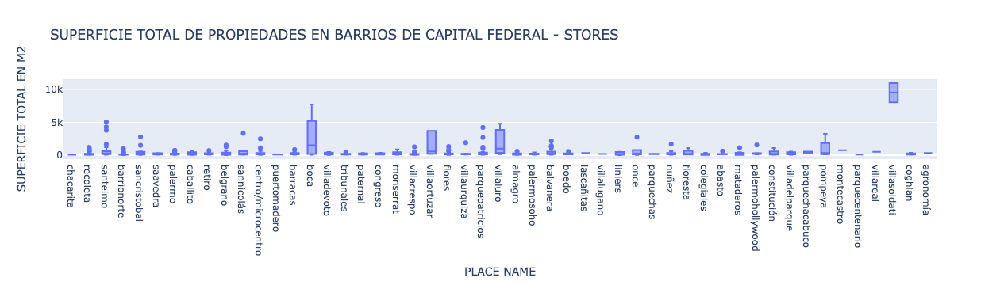

In [245]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')], y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - STORES')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q3(75) + 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [246]:
store_outliers = ['recoleta','santelmo', 'barrionorte','sancristobal','palermo','retiro','belgrano','sannicolás','centro/microcentro', 'barracas', 'tribunales',
                 'montserrat','villacrespo','flores','villaurquiza','parquepatricios','balvanera','boedo','once','nuñez','floresta','abasto','florida']

df_stores = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]

for outliers in store_outliers:
    q1 = df_stores[df_stores['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_stores[df_stores['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_store_sup_max = df_stores[np.logical_and(df_stores['PLACE NAME']==outliers, df_stores['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    
    df = df.drop(index_outlier_store_sup_max)


In [247]:
df_stores_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]
df_stores_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,3.000,22.000,111.000,598.000,624.000,545.000,631.000,627.000,717.000
mean,2.667,2.227,3270.973,298.241,285.502,2686.191,630433.365,549877.983,1.000
std,1.155,2.844,3748.459,707.488,710.790,2093.466,1248450.701,762273.364,0.000
min,2.000,1.000,1.000,48.000,12.000,13.797,19900.000,5608.360,1.000
25%,2.000,1.000,1000.000,91.000,90.750,1400.000,215000.000,212500.000,1.000
50%,2.000,1.000,2000.000,150.000,151.500,2184.874,355000.000,350000.000,1.000
75%,3.000,1.000,4500.000,279.500,273.500,3275.862,600000.000,600000.000,1.000
max,4.000,10.000,19000.000,10958.000,10958.000,22000.000,19267560.000,8500000.000,1.000


In [248]:
store_index_expenses=df_stores_caba.sort_values('expenses')[:20].index

df_stores_caba.sort_values('expenses')[['expenses','SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2','PRECIO USD']][:20]

# Ya que suponemos el valor de 1 es algo simbolico, vamos a imputarles nan a los 12 primeros valores de expenses

df.loc[store_index_expenses[:12],'expenses']=np.NaN

In [249]:
df_stores_caba.sort_values('SUPERFICIE TOTAL EN M2')[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD']][:4]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD
65904,NaN,12.000,2083.333,25000.000
21863,NaN,20.000,5500.000,110000.000
64728,NaN,20.000,2000.000,40000.000
65263,NaN,22.000,4500.000,99000.000


In [250]:
# Podemos ver que hay varios NaN, en la superficie cubierta, y es por esto que tiene un valor inferior min a sup total, pero los valores de superficie total son muy bajos

# Suponemos un valor de Superficie total minimo de 30m2

store_index_sup_muy_chica = df_stores_caba[df_stores_caba['SUPERFICIE TOTAL EN M2'] < 30 ].index
df = df.drop(store_index_sup_muy_chica)


store_index_sup_mal_cargada = df_stores_caba[df_stores_caba['SUPERFICIE CUBIERTA EN M2'] > df_stores_caba['SUPERFICIE TOTAL EN M2']].index
df = df.drop(store_index_sup_mal_cargada)

In [251]:
store_index_sup_muy_grande = df_stores_caba.sort_values('SUPERFICIE TOTAL EN M2', ascending = False)[:18].index

df_stores_caba.sort_values('SUPERFICIE TOTAL EN M2', ascending = False)[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:18]



,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
69115,10958.000,10958.000,775.689,8500000.000,excelentenaveindustrialde10960m2sobreterrenode...
66112,NaN,8053.000,13.797,111111.000,naveindustrial-villasoldati
66045,7722.000,7722.000,1036.001,8000000.000,ventaconrentaespectaculardepósitopremium
65246,4800.000,4800.000,833.333,4000000.000,plantaindustrialde3500m2salidaa3calles
67045,3700.000,3700.000,1486.486,5500000.000,importantepropiedad3700m2aptav/destinos
66777,3700.000,3700.000,1756.757,6500000.000,excelentepropiedadde3700m2amtstriunvirato
66615,3250.000,3250.000,461.538,1500000.000,edificio3250m2c/oficinas+depósitosenpolotecnol...
83224,NaN,2700.000,1296.296,3500000.000,edificiocomercialenboca
66884,NaN,1556.000,2249.357,3500000.000,local-palermohollywood
66031,1205.000,1205.000,995.851,1200000.000,tacuari1100-importantepropiedadusocomercial


In [252]:
# Podemos observar que los 2 primeros index, refieren a una nave industrial de enormes dimensiones y un deposito, tambien de varias hectareas, vamos a dropear estos valores.
# Los 7 primeros index, corresponden todos a valores muy altos para sus respectivas zonas.
# Los index 8,13 y 15 tienen valores muy superiores a sus zonas.
df = df.drop(store_index_sup_muy_grande[:8])
df = df.drop(store_index_sup_muy_grande[8])
df = df.drop(store_index_sup_muy_grande[13])
df = df.drop(store_index_sup_muy_grande[15])


In [253]:

df_stores_caba.sort_values('PRECIO USD',ascending = False)[:3][['SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2','PRECIO USD','PLACE NAME']]

,SUPERFICIE TOTAL EN M2,title,PRECIO USD POR M2,PRECIO USD,PLACE NAME
69115,10958.000,excelentenaveindustrialde10960m2sobreterrenode...,775.689,8500000.000,villasoldati
66045,7722.000,ventaconrentaespectaculardepósitopremium,1036.001,8000000.000,boca
66777,3700.000,excelentepropiedadde3700m2amtstriunvirato,1756.757,6500000.000,villaortuzar


Son logicos los precios

In [254]:
# Se trata de 2 locales que se venden juntos.

df.loc[7040]
df = df.drop(7040)


### Duplex/Triplex 

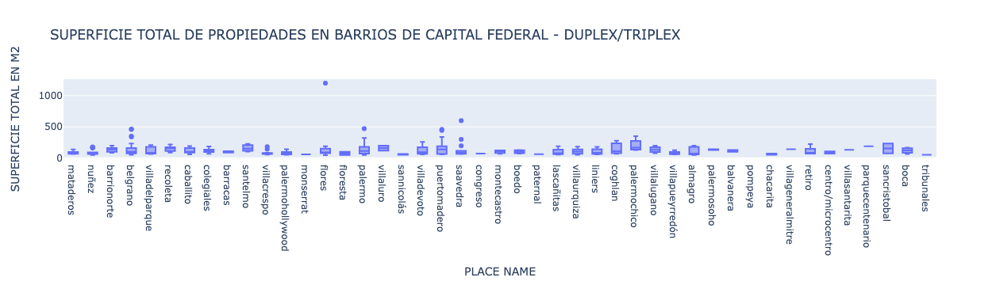

In [255]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')], y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - DUPLEX/TRIPLEX')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q3(75) + 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [256]:
duplex_outliers = ['nuñez','belgrano','villacrespo','palermo','puertomadero','saavedra']

df_duplex= df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]

for outliers in duplex_outliers:
    q1 = df_duplex[df_duplex['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_duplex[df_duplex['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_duplex_sup_max = df_duplex[np.logical_and(df_duplex['PLACE NAME']==outliers, df_duplex['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    
    df = df.drop(index_outlier_duplex_sup_max)


In [257]:
df_duplex=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
df_duplex.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,47.000,268.000,83.000,407.000,322.000,308.000,424.000,424.000,435.000
mean,5.809,3.302,3931.337,101.199,117.450,2693.551,353849.167,312132.294,1.000
std,4.271,1.178,3129.851,47.413,80.680,1113.749,597809.701,270823.077,0.000
min,1.000,1.000,1.000,48.000,48.000,250.000,23000.000,23000.000,1.000
25%,2.500,2.000,1800.000,64.000,71.250,1990.476,175000.000,175000.000,1.000
50%,5.000,3.000,3000.000,85.000,98.000,2500.000,240000.000,240000.000,1.000
75%,9.000,4.000,6000.000,129.000,146.750,3017.500,365000.000,360500.000,1.000
max,15.000,8.000,17000.000,290.000,1200.000,9597.523,9435376.000,3100000.000,1.000


In [258]:
duplex_index_expenses = df_duplex.sort_values('expenses')[:4].index
df_duplex.sort_values('expenses')[['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:4]



,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
91109,1.000,80.000,80.000,3020.000,241600.000,"venta-dúplex2ambientes,dormitorioensuiteennúñez"
33339,10.000,80.000,130.000,NaN,NaN,ventaduplexaestrenar
75203,300.000,62.000,102.000,1666.667,170000.000,ventadúplex4ambientesenliniersconterrazapropia
72490,300.000,150.000,150.000,1653.333,248000.000,departamentoventa3ambientesbarrionorteduplexal...


In [259]:
# Vamos a dropear el primer indice, que no nos dice , y 10 es un valor muy bajo

df = df.drop(duplex_index_expenses[:1])

In [260]:
df_duplex.sort_values('PRECIO USD', ascending = False)\
        [['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:5]


,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
81630,NaN,NaN,323.000,9597.523,3100000.000,departamentoenpalermo
42468,NaN,290.000,350.000,6571.429,2300000.000,venta-impresionanteduplexconterrazayparrilla-b...
6760,NaN,252.000,252.000,6944.444,1750000.000,excelentetriplexmuyaltoconvistaaríoyalnorte
12845,NaN,265.000,NaN,NaN,1600000.000,triplexamobladodelujoenmolinosfaenabuilding
45379,NaN,239.000,339.000,4100.295,1390000.000,espectacularresidenciaenduplexconlasmejoresvis...


Segun simulaciones en zonaprop son valores logicos los de PRECIO USD y PRECIO USD POR M2

## Piso/Penthouse

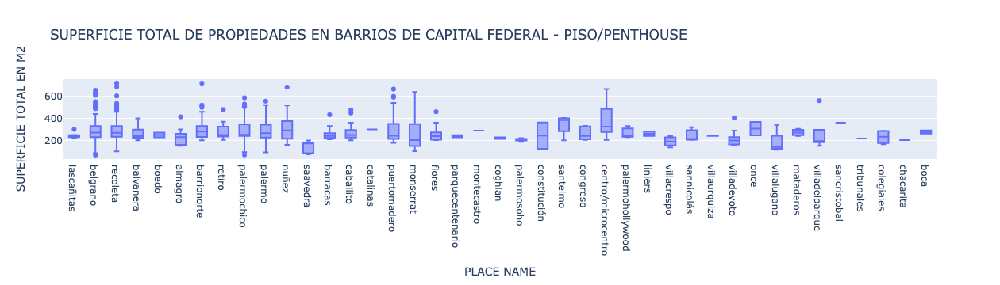

In [261]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PISO/PENTHOUSE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [262]:
piso_outliers = ['lascañitas','belgrano','recoleta','almagro','barrionorte','retiro','palermochico','palermo','nuñez','barracas','caballito','puertomadero','flores',
                  'centro/microcentro','villadevoto','villadelparque']

df_piso = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]

for outliers in store_outliers:
    q1 = df_piso[df_piso['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_piso[df_piso['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_piso_sup_max = df_piso[np.logical_and(df_piso['PLACE NAME']==outliers, df_piso['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    index_outlier_piso_sup_min = df_piso[np.logical_and(df_piso['PLACE NAME']==outliers, df_piso['SUPERFICIE TOTAL EN M2'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_piso_sup_max)
    df = df.drop(index_outlier_piso_sup_min)



In [263]:
df_piso_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
df_piso_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,68.000,534.000,296.000,818.000,757.000,685.000,783.000,783.000,852.000
mean,4.426,5.290,12434.561,480.511,273.527,3519.730,969454.731,967600.500,1.000
std,3.453,1.755,8201.714,6531.613,82.063,2310.657,829738.987,830080.502,0.000
min,1.000,1.000,1.000,48.000,68.000,268.470,70000.000,70000.000,1.000
25%,1.000,4.000,7000.000,198.500,220.000,2181.818,490000.000,490000.000,1.000
50%,3.500,5.000,11949.000,233.500,250.000,2934.783,740000.000,740000.000,1.000
75%,6.250,6.000,16000.000,294.000,313.000,4310.345,1200000.000,1200000.000,1.000
max,14.000,17.000,70000.000,187000.000,666.000,20731.707,8500000.000,8500000.000,1.000


In [264]:
piso_index_ambientes = df_piso_caba.sort_values('rooms', ascending = False)[:10].index
df_piso_caba.sort_values('rooms', ascending = False)[['rooms','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]



,rooms,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
51034,17.000,359.000,NaN,NaN,1700000.000,pisodecategoríaenventaenrecoleta,corredorresponsable:laurahzarate-cucicba6602co...
18180,14.000,320.000,400.000,837.500,335000.000,"14habitaciones,5bañostodoen320mts",setratadeunapropiedaddesarrolladatodoenel3erpi...
53896,12.000,554.000,NaN,NaN,1380000.000,duplexdegrancategoríaconterraza,corredorresponsable:cristianarnalponti-cucicba...
11722,12.000,200.000,200.000,1245.000,249000.000,pisode200m2-carloscalvoal800-santelmo-,ventadepisotipoph(1ºpiso)u$s249000“conexcelent...
13044,12.000,363.000,366.000,3278.689,1200000.000,arroyoyesmeralda:oficina/viviendafrancesunico!...,-excelentepisode375menedificiofrancésdegrancat...
54484,12.000,329.000,329.000,2844.985,936000.000,arenalesal1800-edificiofrancesrecicladoensutot...,recicladoensutotalidadubicadoenexclusivoedific...
36021,12.000,417.000,417.000,2997.602,1250000.000,arenales2100increíbleduplexestilofránces,impecableedificiofrancéssondospisoscomunicados...
44689,12.000,320.000,320.000,2171.875,695000.000,mtdealvear-libertad320m2enimpactanteedificiofr...,plazalibertaddeptounicoenedificioestilofrancés...
34696,11.000,623.000,NaN,NaN,420000.000,hotel/pensionenbalvaneraaptocredito,corredorresponsable:luisromangarcia-cucicba404...
40355,11.000,273.000,273.000,915.751,250000.000,ventahosteloviviendaensantelmo,setratadeundepartamentoamplioquefuncionaactual...


In [265]:
# El primer index, no podemos comprobar si realmente tiene 17 ambientes, asi que vamos a dropearlo, ya que no nos dice mucho

df = df.drop(piso_index_ambientes[:1])

df.loc[piso_index_ambientes[6],'TIPO DE PROPIEDAD']='duplex/triplex'

# Se trata de un hotel y no un piso
df = df.drop(piso_index_ambientes[9])


In [266]:
piso_index_expensas = df_piso_caba.sort_values('expenses')[:10].index
df_piso_caba.sort_values('expenses')[['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
83764,1.000,214.000,214.000,6542.056,1400000.000,renoirii-pisoaltosolcondoscocheras,renoirii-solpisoalto-condoscocherastresdormito...
83778,1.000,214.000,214.000,7009.346,1500000.000,renoiriisolcondoscocherasaestrenar,renoirii-sol-pisoalto-doscocherasexcelentedto4...
64855,1.000,364.000,364.000,9615.385,3500000.000,torremirabilia-5ambientes-palermo,torremirabiliapalermopalierprivadoydeservicioh...
79931,1.000,290.000,380.000,NaN,NaN,unicodepartamentoconterrazaenchateaulibertador,espectaculardepartamentoentorrechateaulibertad...
79345,1.000,380.000,400.000,1000.000,400000.000,oficinaenventasantelmo,excelentepropiedadde400m2en3plantasidealusocom...
86189,1.000,214.000,214.000,7476.636,1600000.000,renoiriisolpisoaltocondoscocheras,renoiriiexcelentedto4ambdeppisoaltovistapanora...
74837,1.000,230.000,280.000,1000.000,280000.000,piso5ambientes-mataderos,ventapiso5ambientesavemiliocastroliniersbarrio...
39591,5.000,NaN,209.000,1866.029,390000.000,departamentoenventa,"departamento7ambientesomasenbarracas,capitalfe..."
113001,850.000,165.000,165.000,1878.788,310000.000,departamentoenventa,pisotipocasa4ambientesfrenteycontrafrente165m2...
72730,1100.000,123.000,202.000,891.089,180000.000,jbjusto4200dptoconjardinaptocomercial,"excelentepropiedad,edificiode2pisos,lamismasee..."


In [267]:
# Los 8 primeros valores de expensas estan mal imputados, vamos a cargarles NaN values.

df.loc[piso_index_expensas[:8],'expenses']=np.NaN

In [268]:
piso_index_sup_cubierta = df_piso_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending = False)[:10].index
df_piso_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending = False)[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
76012,187000.000,NaN,NaN,600000.000,excelentepisoenbarrionorte,barrionorteexcelentesemipisoalfrentebalcóncorr...
45122,3330.000,NaN,NaN,70000.000,ventadepartamento2ambaptocredito-almagro-,corredorresponsable:jorgesalafia-cucicba5666co...
63093,2949.000,NaN,NaN,76900.000,monoambienteconcocinaamericanaenbelgranor,corredorresponsable:jorgesalafia-cucicba5666co...
47109,655.000,NaN,NaN,2499000.000,vendepisobarrancasbelgrano8ambpiletapropia,corredorresponsable:ricardodemichelli-cucicba1...
64643,639.000,639.000,624.413,399000.000,moreno1500,ventapetithotelenbloqueenmonserrat**areciclar*...
34696,623.000,NaN,NaN,420000.000,hotel/pensionenbalvaneraaptocredito,corredorresponsable:luisromangarcia-cucicba404...
58045,611.000,666.000,NaN,NaN,eylepetrona300,edificioalephdique2partners+fosterpuertomadero...
46948,600.000,NaN,NaN,NaN,departamentoenventaenrecoleta,codigo:4008-carlosjose-4ubicadoen:avalvear1900...
14859,600.000,600.000,7500.000,4500000.000,torrerenoirii-pisode600m²vistaalrio7ambcon4coc...,contactoleonel15renoirtorreiipisoenterovista36...
5907,587.000,587.000,5110.733,3000000.000,importantepenthouseeninmejorablezona,"supervistaabiertaarioyciudadúnico,conjardìnenl..."


In [269]:
df.loc[piso_index_sup_cubierta[:1],['SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2']]=187

df = df.drop(piso_index_sup_cubierta[1])


In [270]:
df_piso_caba.sort_values('PRECIO USD POR M2', ascending = False)\
[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
44685,410.000,410.000,20731.707,8500000.000,leparcalcorta-pisomuyaltode410m2con2cocheras,contacto:martinpinus15-excelentisimapropiedadd...
24997,200.000,220.000,20000.000,4400000.000,excelentepiso220m2c/dep2cocherasfijas,excelentepiso220m2palierprivadolivingycomedors...
44684,410.000,410.000,19512.195,8000000.000,leparcalcorta-pisomuyaltode410m2con2cocheras,contacto:martinpinus15-excelentisimapropiedadd...
44682,300.000,320.000,17187.500,5500000.000,leparcalcorta-pisode320m2con2cocheras,contacto:martinpinus15-excelentisimapropiedadd...
13320,200.000,211.000,12796.209,2700000.000,leparcalcorta-pisode211m²con2cocheras,contacto:rominataccari15contacto:martinpinus15...
55448,250.000,250.000,12000.000,3000000.000,venta:semipisodegrancategoríaeimportantestermi...,"livingycomedoryestaroescritorio,balcón,toilett..."
53494,400.000,400.000,11000.000,4400000.000,leparcdemaria4500-pisoaltisimorecicladovistaal...,contactoleonelmoiguer15***torreleparcpalermo**...
49284,377.000,377.000,10875.332,4100000.000,leparcdemaria4500-pisoaltisimorecicladovistaal...,***torreleparcpalermo******excelentisimopisoal...
57173,456.000,516.000,10658.915,5500000.000,forumalcortatriplex,"triplexenforumalcorta!vistaespectacularario,ci..."
52789,456.000,516.000,10658.915,5500000.000,espectacularpenthouseenforumalcorta!,espectacularpenthouseenforumalcorta!trilpexenp...


Los precios son logicos, al simularlos en Zona Prop.

## Price

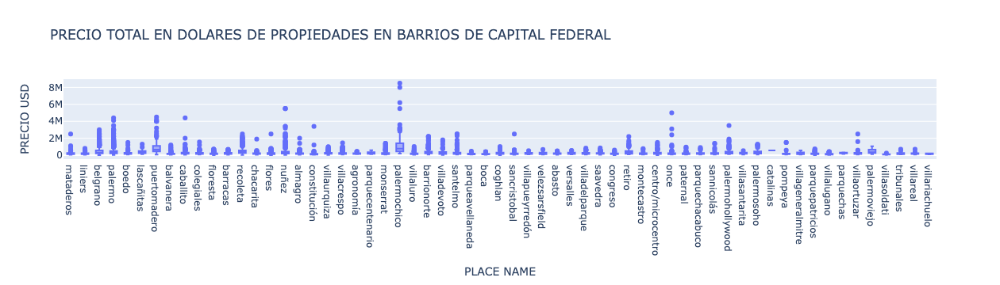

In [271]:
fig = px.box(df[df.state_name=='capitalfederal'], y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL')

fig.show()


#### APARTAMENTOS - USD

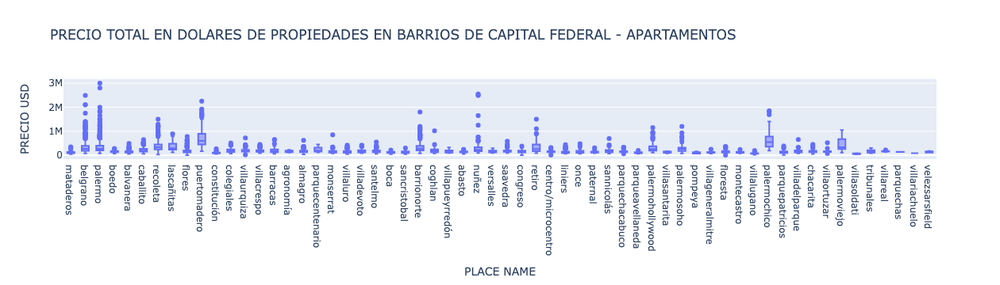

In [272]:
df_departamento_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]

fig = px.box(df_departamento_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - APARTAMENTOS')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [273]:
precio_outliers_departamentos = ['mataderos','belgrano','palermo','boedo','balvanera','caballito','recoleta','flores','puertomadero','constitución','colegiales','villaurquiza',
                 'villacrespo','barracas','almagro','monserrat','villaluro','villadevoto','santelmo','boca','sancristobal','barrionorte','coghlan','abasto',
                 'nuñez','versalles','saavedra','congreso','retiro','centro/microcentro','liniers','once','paternal','sannicolás','parquechacabuco','parqueavellaneda',
                 'palermohollywood','palermosoho','villageneralmitre','floresta','montecastro','villalugano','palermochico','parquepatricios','villadelparque',
                 'chacarita','villaortuzar','villareal']


for outliers in precio_outliers_departamentos:
    q1 = df_departamento_capitalfederal[df_departamento_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_departamento_capitalfederal[df_departamento_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_ap_max = df_departamento_capitalfederal[np.logical_and(df_departamento_capitalfederal['PLACE NAME']==outliers, df_departamento_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_ap_min = df_departamento_capitalfederal[np.logical_and(df_departamento_capitalfederal['PLACE NAME']==outliers, df_departamento_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_ap_max)
    df = df.drop(index_outlier_ap_min)
    


In [274]:
df_departamento_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]
df_departamento_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,1231.000,5177.000,2831.000,8098.000,7151.000,6521.000,8439.000,8410.000,9025.000
mean,5.162,3.251,3640.607,84.767,91.627,2719.421,298193.451,242373.984,1.000
std,4.905,0.993,3102.936,35.726,40.109,1089.022,552666.891,161809.285,0.000
min,1.000,1.000,1.000,48.000,27.000,69.382,24300.000,6730.040,1.000
25%,2.000,3.000,1800.000,59.000,62.000,2022.059,140000.000,139500.000,1.000
50%,4.000,3.000,2900.000,74.000,80.000,2500.000,195000.000,190000.000,1.000
75%,7.000,4.000,4500.000,100.000,111.000,3105.263,297000.000,290000.000,1.000
max,55.000,9.000,54240.000,419.000,419.000,9750.000,14756597.000,1500000.000,1.000


In [275]:
df_departamento_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2')\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:5]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
30694,NaN,27.000,2333.333,63000.000,"monoambienteinterno27m2aptoprofesional,"
73107,NaN,27.000,4407.407,119000.000,departamento-barrionorte
117634,NaN,27.000,2851.852,77000.000,departamento-belgrano
92489,NaN,27.000,1600.000,43200.000,departamento-scristobal
101234,NaN,27.000,2218.519,59900.000,local30mt2/aestrenar!!


In [276]:

df_departamento_capitalfederal.sort_values('PRECIO USD')\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:10]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
55686,67.000,97.000,69.382,6730.040,3ambientesampliosenimpecableestadoconpatio1ºpo...
119958,60.000,60.000,126.188,7571.290,departamentoenventaenbalvanera3ambientes60m2–j...
14580,76.000,82.000,122.426,10038.970,excelentedptode4ambcoch/baulera/parquepatricio...
24862,60.000,60.000,405.000,24300.000,sevendedpto4ambbarriopiedrabuena
40829,NaN,154.000,187.498,28874.750,departamentoventa
56910,49.000,NaN,NaN,39000.000,ventadpto3ambenvillasoldati
25177,NaN,NaN,NaN,40000.000,excelente2ambienteconmuybuenprecio!!!
92489,NaN,27.000,1600.000,43200.000,departamento-scristobal
25171,50.000,50.000,900.000,45000.000,dpto3ambsavio
28512,70.000,70.000,642.857,45000.000,departamentoventa


In [277]:
# De simulacion en la pagina ZonaProps, tomamos un precio minimo de 42.000 usd para un departamento en caba.

index_mal_precio_usd_m2 = df_departamento_capitalfederal[df_departamento_capitalfederal['PRECIO USD'] < 42000].index


df = df.drop(index_mal_precio_usd_m2)

In [278]:
# Sobre el valor de las expensas, dropeamos los valores inferiores al quantil del 5%

q_expensas_caba=df_departamento_capitalfederal.expenses.quantile(0.05)

index_expensas_mal_cargadas=df_departamento_capitalfederal[df_departamento_capitalfederal.expenses < q_expensas_caba].index

df = df.drop(index_expensas_mal_cargadas)

#### Houses - usd

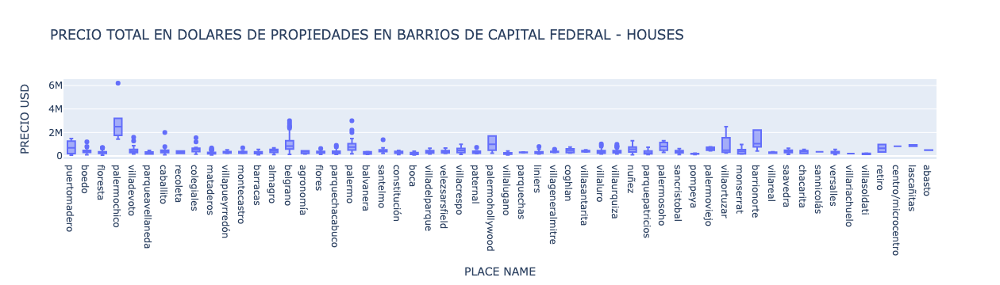

In [279]:
df_houses_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
fig = px.box(df_houses_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - HOUSES')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [280]:
precio_outliers_casas_caba = ['boedo','floresta','villadevoto','parqueavellaneda','caballito','colegiales','montecastro','belgrano','flores','parquechacabuco',
                         'palermo','mataderos','paternal','liniers','villageneralmitre','villaluro','villaurquiza','parquepatricios','sancristobal']


for outliers in precio_outliers_casas_caba:
    q1 = df_houses_capitalfederal[df_houses_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_houses_capitalfederal[df_houses_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_h_max = df_houses_capitalfederal[np.logical_and(df_houses_capitalfederal['PLACE NAME']==outliers, df_houses_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_h_min = df_houses_capitalfederal[np.logical_and(df_houses_capitalfederal['PLACE NAME']==outliers, df_houses_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_h_max)
    df = df.drop(index_outlier_h_min)
    


In [281]:
df_houses_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
df_houses_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,1.000,439.000,3.000,1118.000,917.000,788.000,1147.000,1145.000,1279.000
mean,2.000,4.738,5367.000,234.482,299.373,1556.171,440334.612,439764.891,1.000
std,NaN,1.657,5039.640,131.270,162.882,805.782,400965.607,400462.968,0.000
min,2.000,1.000,1.000,48.000,48.000,288.889,70000.000,70000.000,1.000
25%,2.000,4.000,3050.500,141.000,185.000,1040.467,240000.000,240000.000,1.000
50%,2.000,5.000,6100.000,200.500,260.000,1391.616,345000.000,345000.000,1.000
75%,2.000,5.000,8050.000,295.000,385.000,1893.327,490000.000,490000.000,1.000
max,2.000,18.000,10000.000,1030.000,1159.000,6072.106,6200000.000,6200000.000,1.000


nota : El valor minimo de pisos en casas es 2, debido a los NaN

In [282]:
index_precio_mal_ingresad=df_houses_capitalfederal.sort_values('PRECIO USD',ascending = False)[:4].index

df_houses_capitalfederal.sort_values('PRECIO USD',ascending = False)[:4]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description','PLACE NAME']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description,PLACE NAME
57581,970.000,NaN,NaN,6200000.000,juezestrada2800,edificiodeestiloanglo-americanoconladrilloalav...,palermochico
27533,527.000,527.000,6072.106,3200000.000,ombu2900,"excelentecasadeestiloclásicoconpileta,jardínyp...",palermochico
70839,530.000,530.000,6037.736,3200000.000,importantecasaenbarrioparque,"casaenbarrioparqueconjardín,parrillaypileta,to...",palermochico
20328,500.000,600.000,5333.333,3200000.000,barrioparque:espectacularcasaconpiletasobreombú,espectacularcasaenunadelascallesmáslindasdebar...,palermochico


In [283]:
# El primer index, tiene un valor un 50% mas elevado a las simulaciones en zonaprop, vamos a droppearlo.

df = df.drop(index_precio_mal_ingresad[0])


### PH - usd

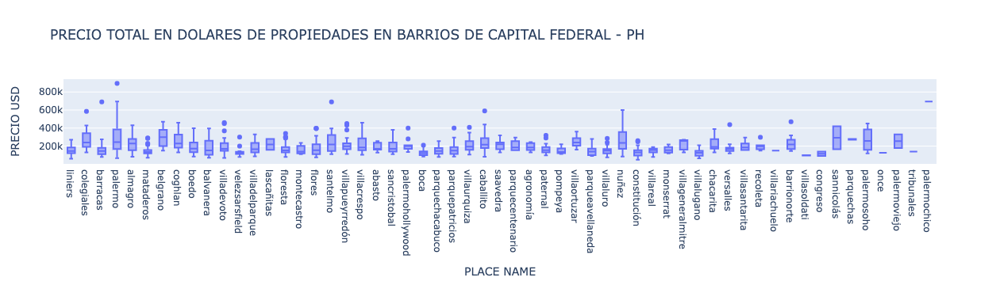

In [284]:
df_ph_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
fig = px.box(df_ph_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PH')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [285]:
precio_outliers_ph_caba = ['colegiales','barracas','palermo','mataderos','villadevoto','velezsarsfield','floresta','flores','villapueyrredón','palermohollywood',
                           'boca','parquechacabuco','parquepatricios','villaurquiza','caballito','paternal','villaluro','nuñez','constitución','versalles','barrionorte']


for outliers in precio_outliers_ph_caba:
    q1 = df_ph_capitalfederal[df_ph_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_ph_capitalfederal[df_ph_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_ph_max = df_ph_capitalfederal[np.logical_and(df_ph_capitalfederal['PLACE NAME']==outliers, df_ph_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_ph_min = df_ph_capitalfederal[np.logical_and(df_ph_capitalfederal['PLACE NAME']==outliers, df_ph_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_ph_max)
    df = df.drop(index_outlier_ph_min)
    


In [286]:
df_ph_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
df_ph_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,84.000,749.000,115.000,1112.000,924.000,890.000,1183.000,1182.000,1212.000
mean,1.857,3.749,996.383,99.368,131.666,1627.716,193430.262,192547.766,1.000
std,1.262,1.164,891.601,46.430,69.503,572.070,95550.301,91176.316,0.000
min,1.000,1.000,1.000,48.000,23.000,500.000,50000.000,50000.000,1.000
25%,1.000,3.000,400.000,65.000,79.000,1179.434,132000.000,132000.000,1.000
50%,1.000,4.000,700.000,87.000,113.500,1539.580,168000.000,168000.000,1.000
75%,2.000,4.000,1500.000,120.000,164.000,2000.000,230000.000,230000.000,1.000
max,6.000,11.000,4600.000,400.000,550.000,3630.435,1185000.000,695000.000,1.000


In [287]:
# Sobre el valor de las expensas, dropeamos los valores inferiores al quantil del 10%

q_expensas_caba=df_ph_capitalfederal.expenses.quantile(0.10)

index_expensas_mal_cargadas=df_ph_capitalfederal[df_ph_capitalfederal.expenses < q_expensas_caba].index

df = df.drop(index_expensas_mal_cargadas)

#### Stores - usd

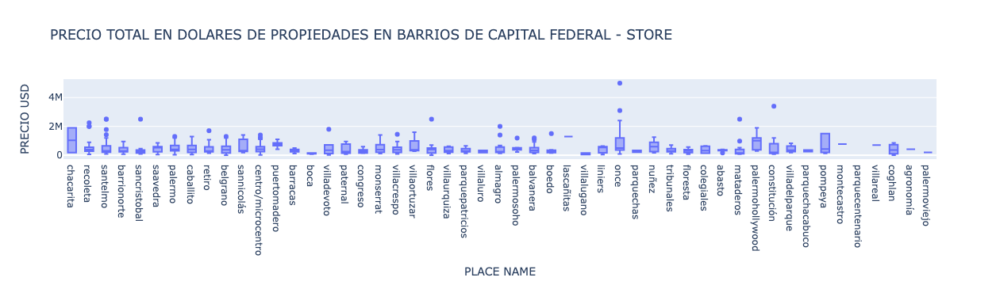

In [288]:
df_stores_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]

fig = px.box(df_stores_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - STORE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [289]:
precio_outliers_store_caba = ['recoleta','santelmo','sancristobal','palermo','retiro','sannicolás','centro/microcentro','paternal','villacrespo','flores',
                              'almagro','palermosoho','balvanera','boedo','once','mataderos','constitución']


for outliers in precio_outliers_store_caba:
    q1 = df_stores_capitalfederal[df_stores_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_stores_capitalfederal[df_stores_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_store_max = df_stores_capitalfederal[np.logical_and(df_stores_capitalfederal['PLACE NAME']==outliers, df_stores_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_store_min = df_stores_capitalfederal[np.logical_and(df_stores_capitalfederal['PLACE NAME']==outliers, df_stores_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_store_max)
    df = df.drop(index_outlier_store_min)
    


In [290]:
df_stores_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]
df_stores_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,3.000,21.000,89.000,563.000,581.000,503.000,581.000,577.000,666.000
mean,2.667,2.286,3800.573,213.728,200.095,2623.598,474808.747,417713.845,1.000
std,1.155,2.901,3558.342,263.843,157.025,1974.982,758268.351,307491.888,0.000
min,2.000,1.000,400.000,48.000,30.000,39.950,19900.000,5608.360,1.000
25%,2.000,1.000,1250.000,90.000,90.000,1400.000,210000.000,210000.000,1.000
50%,2.000,1.000,3000.000,144.000,150.000,2142.857,338000.000,330000.000,1.000
75%,3.000,1.000,5000.000,247.000,250.000,3200.746,550000.000,550000.000,1.000
max,4.000,10.000,19000.000,3250.000,894.000,22000.000,12581296.000,1900000.000,1.000


In [291]:
df_stores_capitalfederal.sort_values('PRECIO USD')[:10]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
63543,58.000,58.000,96.696,5608.360,excelentelocalenventaconrentaenflores
99066,70.000,70.000,128.191,8973.380,ventafondodecomercioenbelgrano
99089,70.000,70.000,128.191,8973.380,ventafondodecomercioencoghlan
29170,365.000,365.000,39.950,14581.750,importantelocalensubsueloconentradaindependien...
98565,NaN,NaN,NaN,19900.000,fondodecomercio-villadevoto
106027,230.000,270.000,105.556,28500.000,ventafondodecomercioenlascañitas
6446,300.000,300.000,116.667,35000.000,localenventa
65552,NaN,NaN,NaN,45000.000,fondodecomercio-saavedra
95330,NaN,30.000,1500.000,45000.000,localenzonacomercial1rajunta
16935,NaN,NaN,NaN,48000.000,localc/fondodecomercioenlugano1y2


In [292]:
# Precio minimo de store, 45000 usd

index_precio_usd_mal=df_stores_capitalfederal[df_stores_capitalfederal['PRECIO USD'] < 45000].index 

df = df.drop(index_precio_usd_mal)

In [293]:
index_precio_usd=df_stores_capitalfederal.sort_values('PRECIO USD', ascending = False)[:20].index

df_stores_capitalfederal.sort_values('PRECIO USD', ascending = False)[:20]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','PLACE NAME','description']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,PLACE NAME,description
106502,NaN,NaN,NaN,1900000.000,localenventaenpalermohollywood,palermohollywood,"localenventa,desarrolladoen2plantasconterrazal..."
66425,1190.000,NaN,NaN,1900000.000,excelentedepósitode1200m2conoficinas,chacarita,capitalfederal-chacarita-código0296ivrdepósito...
63970,480.000,480.000,3750.000,1800000.000,ventadelocalenesquinaenpreconstrucciónenlaentr...,villadevoto,excelentelocalendoblealturaubicadoenlaesquinad...
66307,750.000,750.000,2133.333,1600000.000,depósitode750m2amtsavtriunvirato,villaortuzar,"capitalfederal,villaortúzar-código0296depósito..."
66653,3250.000,NaN,NaN,1500000.000,edificio3250m2c/oficinas+depósitosenpolotecnol...,pompeya,capitalfederal-pompeya-código0047eedificiodeof...
66665,3250.000,NaN,NaN,1500000.000,edificio3250m2c/oficinas+depósitosenpolotecnol...,pompeya,capitalfederal-pompeya-código0047lvedificiodeo...
105784,289.000,334.000,4491.018,1500000.000,local-palermohollywood,palermohollywood,excelentelocalgastronómicoenventaconrentaentre...
45335,273.000,287.000,4878.049,1400000.000,"¨localenventasobrecarlospellegrinial100,caba¨",sannicolás,"¨localenventasobrecarlospellegrinial100,caba¨u..."
60991,NaN,450.000,3111.111,1400000.000,localenventa,monserrat,localfrentealhotelinternacionalydelatorredeirs...
51998,450.000,450.000,3111.111,1400000.000,exentidadbancaria-localcon20mdefrente(tienebov...,monserrat,frentealhotelinternacionalydelatorredeirsayrod...


In [294]:
# El 3er index, se trata de un valor muy elevado segun zonaprops.
# El 4er index, se trata de un local sin terminar de construir.
# El 8vo index, aun esta en construccion
# Los indices 11 y 12, son duplicados, y tienen un precio superior a su zona.
# El indice 7050, son 2 locales juntos.

df = df.drop(index_precio_usd[2])
df = df.drop(index_precio_usd[3])
df = df.drop(index_precio_usd[4])
df = df.drop(index_precio_usd[5])
df = df.drop(index_precio_usd[7])
df = df.drop(index_precio_usd[10])
df = df.drop(index_precio_usd[11])
df = df.drop(index_precio_usd[14])
df = df.drop(index_precio_usd[15])

In [295]:
index_sup_grande = df_stores_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2', ascending = False)[:7].index

df_stores_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2', ascending = False)[:7]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','PLACE NAME','description']]
   

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,PLACE NAME,description
60992,894.000,894.000,1454.139,1300000.000,localenventa,monserrat,localamtsdeavdademayo(sevemuybiendesdelaavenid...
52000,894.000,894.000,1454.139,1300000.000,esquinahipolitoyrigoyen--excelentesvidrieras,monserrat,amtsdeavdademayo(sevemuybiendesdelaavenidayaqu...
61929,890.000,890.000,1292.135,1150000.000,local450m2+subsenplenofocotradicionaldelcentro...,monserrat,"¨localenventa,callepiedrasal100,caba¨ubicacion..."
109861,820.000,820.000,1463.415,1200000.000,"propiedadcomercialenblockoseparado,doblefrente...",constitución,propiedadcomercialenventacompuestapordosunidad...
44580,811.000,811.000,1171.393,950000.000,localde811m2zonificación:aph1,monserrat,estapropiedadhasidodiseñadaporelarquitectoalej...
75274,800.000,800.000,975.000,780000.000,edificiocomercial-balvanera,balvanera,"excelentephen2plantas,18habitaciones-5baños-en..."
60996,800.000,800.000,625.000,500000.000,negocioenventa,once,hotelconpropiedad--600m2aproximadosson3pisos--...


#### Duplex/Triplex - usd

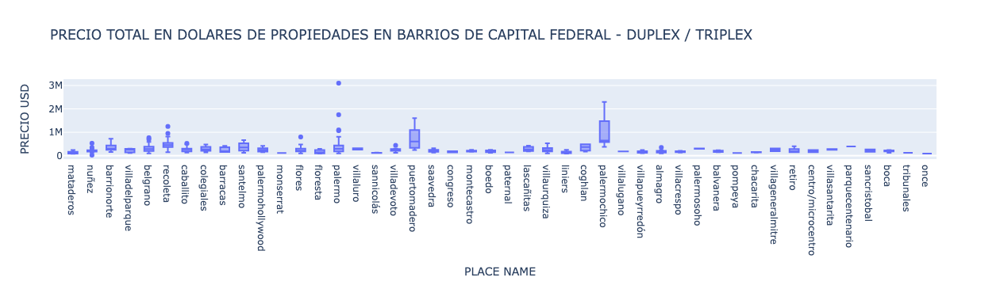

In [296]:
df_duplex_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
fig = px.box(df_duplex_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - DUPLEX / TRIPLEX')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [297]:
precio_outliers_duplex_caba = ['nuñez','recoleta','caballito','flores','palermo','villadevoto','liniers','almagro']


for outliers in precio_outliers_duplex_caba:
    q1 = df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_duplex_max = df_duplex_capitalfederal[np.logical_and(df_duplex_capitalfederal['PLACE NAME']==outliers, df_duplex_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_duplex_min = df_duplex_capitalfederal[np.logical_and(df_duplex_capitalfederal['PLACE NAME']==outliers, df_duplex_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_duplex_max)
    df = df.drop(index_outlier_duplex_min)
    


In [298]:
df_duplex_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
df_duplex_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,47.000,262.000,81.000,392.000,305.000,292.000,406.000,406.000,417.000
mean,5.809,3.271,3995.062,98.719,110.626,2647.902,336579.919,293013.528,1.000
std,4.271,1.171,3134.439,44.834,50.277,979.290,586763.220,214585.542,0.000
min,1.000,1.000,10.000,48.000,48.000,900.000,82000.000,82000.000,1.000
25%,2.500,2.000,1800.000,63.000,70.000,1990.476,171250.000,171250.000,1.000
50%,5.000,3.000,3000.000,84.000,95.000,2478.932,237000.000,237000.000,1.000
75%,9.000,4.000,6000.000,129.000,142.000,3000.000,340000.000,339000.000,1.000
max,15.000,8.000,17000.000,290.000,350.000,6611.111,9435376.000,2300000.000,1.000


#### Piso/Penthouses - usd

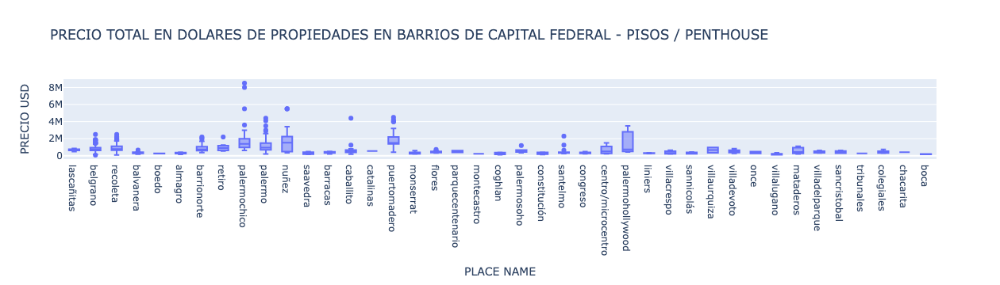

In [299]:
df_pisos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
fig = px.box(df_pisos_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PISOS / PENTHOUSE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [300]:
precio_outliers_pisos_caba = ['belgrano','recoleta','barrionorte','retiro','palermochico','palermo','nuñez','caballito','puertomadero','palermosoho','centro/microcentro',
                              'santelmo']


for outliers in precio_outliers_pisos_caba:
    q1 = df_pisos_capitalfederal[df_pisos_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_pisos_capitalfederal[df_pisos_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_pisos_max = df_pisos_capitalfederal[np.logical_and(df_pisos_capitalfederal['PLACE NAME']==outliers, df_pisos_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_pisos_min = df_pisos_capitalfederal[np.logical_and(df_pisos_capitalfederal['PLACE NAME']==outliers, df_pisos_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_pisos_max)
    df = df.drop(index_outlier_pisos_min)
    


In [301]:
df_pisos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
df_pisos_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD,CANTIDAD
count,66.000,489.000,276.000,763.000,708.000,635.000,726.000,726.000,795.000
mean,4.348,5.237,12363.652,237.679,266.456,3210.752,839928.587,837928.776,1.000
std,3.404,1.639,7606.987,79.742,76.731,1740.052,522905.631,522993.936,0.000
min,1.000,2.000,850.000,48.000,68.000,268.470,110000.000,89937.580,1.000
25%,1.000,4.000,7000.000,192.500,220.000,2110.088,482000.000,480000.000,1.000
50%,3.500,5.000,11717.500,227.000,245.000,2844.985,702500.000,700000.000,1.000
75%,6.000,6.000,16000.000,281.500,304.000,3875.000,1055250.000,1048750.000,1.000
max,14.000,14.000,70000.000,639.000,666.000,12796.209,3500000.000,3500000.000,1.000


In [302]:
index_sup_cuv = df_pisos_capitalfederal.sort_values('SUPERFICIE CUBIERTA EN M2',ascending = False)[:5].index
df_pisos_capitalfederal.sort_values('SUPERFICIE CUBIERTA EN M2',ascending = False)[:5]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
64643,639.000,639.000,624.413,399000.000,moreno1500
34696,623.000,NaN,NaN,420000.000,hotel/pensionenbalvaneraaptocredito
58045,611.000,666.000,NaN,NaN,eylepetrona300
46948,600.000,NaN,NaN,NaN,departamentoenventaenrecoleta
5907,587.000,587.000,5110.733,3000000.000,importantepenthouseeninmejorablezona


In [303]:
# Dropeo el primer indice, ya que el valor de sup cuv esta mal ingresado.

df = df.drop(index_sup_cuv[0])

In [304]:
index_precio_usd = df_pisos_capitalfederal.sort_values('PRECIO USD',ascending = False)[:5].index
df_pisos_capitalfederal.sort_values('PRECIO USD',ascending = False)[:5]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','PLACE NAME']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,PLACE NAME
70556,300.000,330.000,10606.061,3500000.000,departamento-palermohollywood,palermohollywood
69489,NaN,455.000,7472.527,3400000.000,excelentepiso450m2entorrechateau,nuñez
70170,NaN,455.000,7472.527,3400000.000,espectacularpisoaltoentorrechteaulibertadorde4...,nuñez
59593,369.000,369.000,8672.087,3200000.000,venta5ambientesforumalcorta,nuñez
5907,587.000,587.000,5110.733,3000000.000,importantepenthouseeninmejorablezona,palermochico


In [305]:
index_mal_expenses=df_pisos_capitalfederal.sort_values('expenses',ascending = False)[:5].index
df_pisos_capitalfederal.sort_values('expenses',ascending = False)[:5]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD
112634,sell,apartment,flores,|argentina|capitalfederal|flores|,argentina,capitalfederal,3433918.000,"-346296569177,-584564173675",-34.630,-58.456,330000.000,usd,5822685.000,330000.000,202.000,185.000,1633.663,1783.784,NaN,NaN,70000.000,http://wwwproperaticomar/1c75x_venta_departame...,excelentepisode6ambientesc/dependenciadeservic...,departamento-flores,https://thumbs4properaticom/6/d5ukrtqoz21bh8fe...,flores,185.000,202.000,1633.663,330000.000,usd,330000.000,piso/penthouse,1.000
49979,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-34579084696,-58406328964",-34.579,-58.406,1950000.000,usd,34406775.000,1950000.000,343.000,323.000,5685.131,6037.152,NaN,5.000,38000.000,http://wwwproperaticomar/19d6c_venta_departame...,"ventadedepartamento4dormitoriosenpalermo,capit...",departamentoenventa,https://thumbs4properaticom/5/augrn39d9tfbdgzq...,palermo,323.000,343.000,5685.131,1950000.000,usd,1950000.000,piso/penthouse,1.000
71045,sell,apartment,nuñez,|argentina|capitalfederal|nuñez|,argentina,capitalfederal,3430348.000,NaN,NaN,NaN,2200000.000,usd,38817900.000,2200000.000,286.000,NaN,7692.308,NaN,NaN,NaN,37000.000,http://wwwproperaticomar/1akee_venta_departame...,"torrechateaulibertador,esquineropisoalto3dormi...",departamento-nuñez,https://thumbs4properaticom/0/-dwo4ke_pykhe_v7...,nuñez,NaN,286.000,7692.308,2200000.000,usd,2200000.000,piso/penthouse,1.000
69414,sell,apartment,nuñez,|argentina|capitalfederal|nuñez|,argentina,capitalfederal,3430348.000,NaN,NaN,NaN,2200000.000,usd,38817900.000,2200000.000,296.000,NaN,7432.432,NaN,NaN,NaN,35000.000,http://wwwproperaticomar/1ai81_venta_departame...,derevista!!!departamentototalmentereformadoent...,excelentepisoenalquileryventaamuebladoentorrec...,https://thumbs4properaticom/9/hun5sv9dqv3vcijj...,nuñez,NaN,296.000,7432.432,2200000.000,usd,2200000.000,piso/penthouse,1.000
95824,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,NaN,NaN,NaN,2200000.000,usd,38817900.000,2200000.000,390.000,390.000,5641.026,5641.026,NaN,NaN,35000.000,http://wwwproperaticomar/1bhra_venta_departame...,"edificiosanchezelia,construidoporrivadetallesy...",venta4ambientescon3cocheras-palermo,https://thumbs4properaticom/9/cexuoafiffxkfrks...,palermo,390.000,390.000,5641.026,2200000.000,usd,2200000.000,piso/penthouse,1.000


In [306]:
# Valor de expensas demasiado alto para la zona de flores

df = df.drop(index_mal_expenses[0])

### Variables Categoricas

Creamos la variable ZONAS COMUNALES, donde vamos a categorizar los distintos barrios de capital por las comunas donde se encuentran

In [307]:
comunas_dict={
'constitucion':'ZONA ESTE COMUNAL',
'catalinas':'ZONA ESTE COMUNAL',
'libertad':'ZONA ESTE COMUNAL',
'retiro':'ZONA ESTE COMUNAL',
'sannicolás':'ZONA ESTE COMUNAL',
'puertomadero':'ZONA ESTE COMUNAL',
'santelmo':'ZONA ESTE COMUNAL',
'montserrat':'ZONA ESTE COMUNAL',
'monserrat':'ZONA ESTE COMUNAL',
'constitución':'ZONA ESTE COMUNAL',
'centro/microcentro':'ZONA ESTE COMUNAL',
'centro':'ZONA ESTE COMUNAL',
'tribunales':'ZONA ESTE COMUNAL',
'sannicolás':'ZONA ESTE COMUNAL',
'recoleta':'ZONA ESTE COMUNAL',
'barrionorte':'ZONA ESTE COMUNAL',
'billinghurst':'ZONA ESTE COMUNAL',
'balvanera':'ZONA ESTE COMUNAL',
'sancristobal':'ZONA ESTE COMUNAL',
'abasto':'ZONA ESTE COMUNAL',
'congreso':'ZONA ESTE COMUNAL',
'sarmiento':'ZONA ESTE COMUNAL',
'once':'ZONA ESTE COMUNAL',
'corrientes':'ZONA ESTE COMUNAL',
'boca':"ZONA SUR COMUNAL",
'barracas':"ZONA SUR COMUNAL",
'parquepatricios':"ZONA SUR COMUNAL",
'pompeya':"ZONA SUR COMUNAL",
'catalinas':"ZONA SUR COMUNAL",
'almagro':"ZONA CENTRO COMUNAL",
'boedo':"ZONA CENTRO COMUNAL",
'donbosco':"ZONA CENTRO COMUNAL",
'caballito':"ZONA CENTRO COMUNAL",
'parquecentenario':"ZONA CENTRO COMUNAL",
'flores':"ZONA CENTRO COMUNAL",
'parquechacabuco':"ZONA CENTRO COMUNAL",
'rivadavia':"ZONA CENTRO COMUNAL",
'villasoldati':"ZONA SUR COMUNAL",
'villariachuelo':"ZONA SUR COMUNAL",
'villalugano':"ZONA SUR COMUNAL",
'liniers':"ZONA OESTE COMUNAL",
'mataderos':"ZONA OESTE COMUNAL",
'parqueavellaneda':"ZONA OESTE COMUNAL",
'villareal':"ZONA OESTE COMUNAL",
'montecastro':"ZONA OESTE COMUNAL", 
'versalles':"ZONA OESTE COMUNAL", 
'floresta':"ZONA OESTE COMUNAL", 
'velezsarsfield':"ZONA OESTE COMUNAL",
'villaluro':"ZONA OESTE COMUNAL",
'villageneralmitre':"ZONA OESTE COMUNAL", 
'villadevoto':"ZONA OESTE COMUNAL", 
'villadelparque':"ZONA OESTE COMUNAL",
'villasantarita':"ZONA OESTE COMUNAL",
'santarita':"ZONA OESTE COMUNAL",
'coghlan':"ZONA NORTE COMUNAL",
'saavedra':"ZONA NORTE COMUNAL",
'villaurquiza':"ZONA NORTE COMUNAL",
'villapueyrredón':"ZONA NORTE COMUNAL",
'nuñez':"ZONA NORTE COMUNAL",
'belgrano':"ZONA NORTE COMUNAL",
'colegiales':"ZONA NORTE COMUNAL",
'palermo':"ZONA NORTE COMUNAL",
'lasheras':"ZONA NORTE COMUNAL",
'palermochico':"ZONA NORTE COMUNAL",
'palermohollywood':"ZONA NORTE COMUNAL",
'palermoviejo':"ZONA NORTE COMUNAL",
'palermosoho':"ZONA NORTE COMUNAL",
'lascañitas':"ZONA NORTE COMUNAL",
'chacarita':"ZONA NORTE COMUNAL",
'villacrespo':"ZONA NORTE COMUNAL",
'paternal':"ZONA NORTE COMUNAL",
'villaortuzar':"ZONA NORTE COMUNAL",
'agronomía':"ZONA NORTE COMUNAL",
'parquechas':"ZONA NORTE COMUNAL",
}


# comunas 12 13 14 15 grupo norte
# comunas 9, 10 y 11 grupo oeste
# comunas 8 y 4 grupo sur
# comunas 1, 2 y 3 grupo este
# comunas 5,6 y 7 grupo centro


df_capitalfederal = df.loc[df.state_name=='capitalfederal']
zonas_comunas_serie = df_capitalfederal['PLACE NAME'].replace(comunas_dict)
df['ZONAS COMUNALES']=zonas_comunas_serie

### Correlacion entre variables

**Vamos a seguir trabajando solo con capital federal y sus barrios**

##### CORRELACION EN APARTAMENTOS UBICADOS EN CAPITAL FEDERAL

In [308]:
def correlation_plotter(data_to_plot,cols_to_plot):
    g = sns.PairGrid(data_to_plot, vars=cols_to_plot, hue='ZONAS COMUNALES' ,palette='bright')
    g.map(plt.scatter, alpha=0.6)
    g.add_legend();
    plt.show()

In [309]:
df_corr_capitalfederal_apartment = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','floor','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_apartment.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,floor,rooms,expenses
PRECIO USD POR M2,1.000,0.705,0.082,0.164,0.219,-0.106,0.394
PRECIO USD,0.705,1.000,0.695,0.695,0.182,0.323,0.718
SUPERFICIE TOTAL EN M2,0.082,0.695,1.000,0.916,0.062,0.606,0.591
SUPERFICIE CUBIERTA EN M2,0.164,0.695,0.916,1.000,0.026,0.639,0.615
floor,0.219,0.182,0.062,0.026,1.000,-0.018,0.191
rooms,-0.106,0.323,0.606,0.639,-0.018,1.000,0.380
expenses,0.394,0.718,0.591,0.615,0.191,0.380,1.000


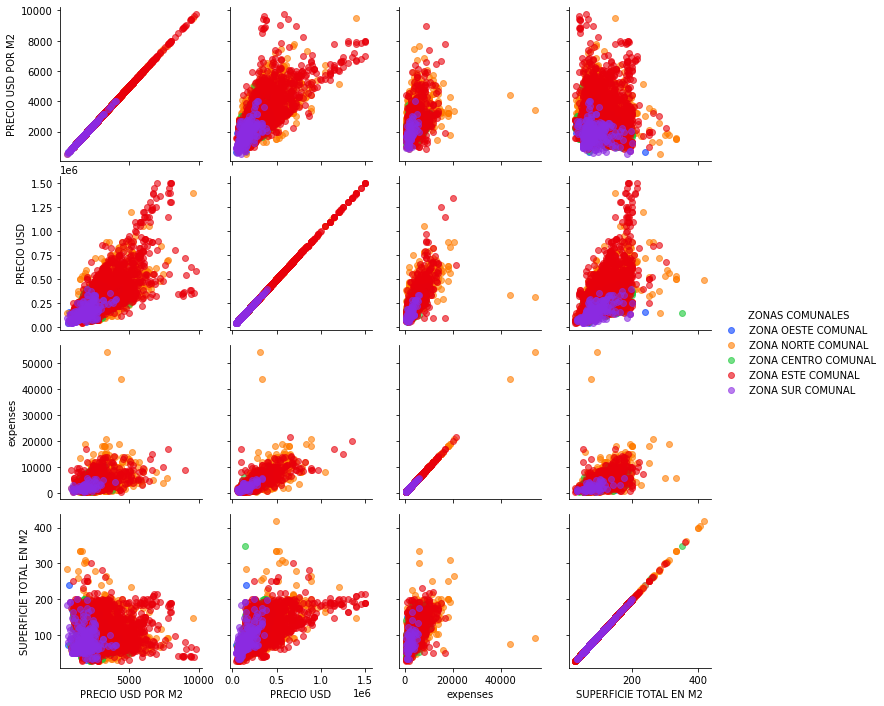

In [310]:
correlation_plotter(df_corr_capitalfederal_apartment,['PRECIO USD POR M2','PRECIO USD','expenses','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones DEPARTAMENTOS:
  
   * Las zonas comunales Norte y Este son las que presentan los departamentos mas caros, mientras que la Zona comunal Sur, es la que presenta los mas                economicos.
   
   * Las Zona comunales Norte y Este, tambien son los que presentan los departamentos con mas SUPERFICIE TOTAL EN M2.

   * Podemos ver que logicamente hay una correlacion `POSITIVA` con el PRECIO USD.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de las EXPENSAS del departamento, departamentos ubicados en zonas mas costosas o que tienen        mas amenities, suelen tener un PRECIO USD POR M2 mayor.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de SUPERFICIE del departamento.

##### CORRELACION EN CASAS UBICADAS EN CAPITAL FEDERAL

In [311]:
df_corr_capitalfederal_houses = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_houses.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.691,-0.089,0.105,0.008,0.439
PRECIO USD,0.691,1.000,0.574,0.658,0.396,-0.963
SUPERFICIE TOTAL EN M2,-0.089,0.574,1.000,0.842,0.375,-0.528
SUPERFICIE CUBIERTA EN M2,0.105,0.658,0.842,1.000,0.549,-0.951
rooms,0.008,0.396,0.375,0.549,1.000,NaN
expenses,0.439,-0.963,-0.528,-0.951,NaN,1.000


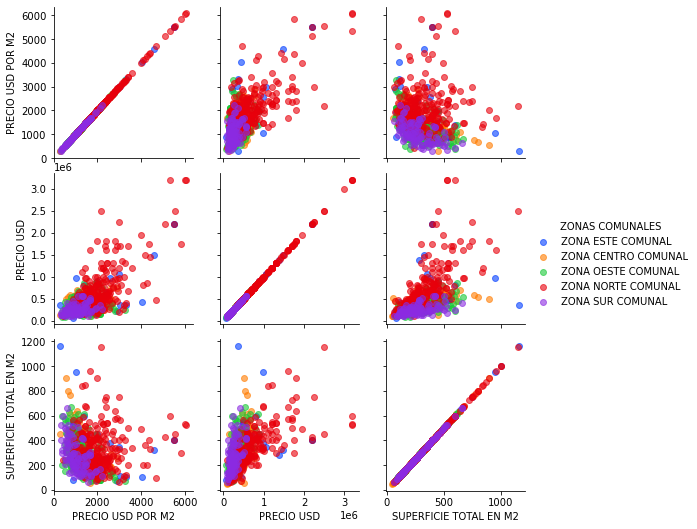

In [312]:
correlation_plotter(df_corr_capitalfederal_houses,['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones CASAS:

   * Al igual que con los departamentos, las casas mas caras, las encontramos en la Zona Comunal Norte.

   * Podemos ver que logicamente hay una correlacion `POSITIVA` con el PRECIO USD.
   

##### CORRELACION EN PHs UBICADOS EN CAPITAL FEDERAL

In [313]:
df_corr_capitalfederal_ph = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_ph.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.219,-0.473,-0.343,-0.275,0.182
PRECIO USD,0.219,1.000,0.690,0.660,0.487,0.248
SUPERFICIE TOTAL EN M2,-0.473,0.690,1.000,0.853,0.618,0.225
SUPERFICIE CUBIERTA EN M2,-0.343,0.660,0.853,1.000,0.626,0.343
rooms,-0.275,0.487,0.618,0.626,1.000,-0.001
expenses,0.182,0.248,0.225,0.343,-0.001,1.000


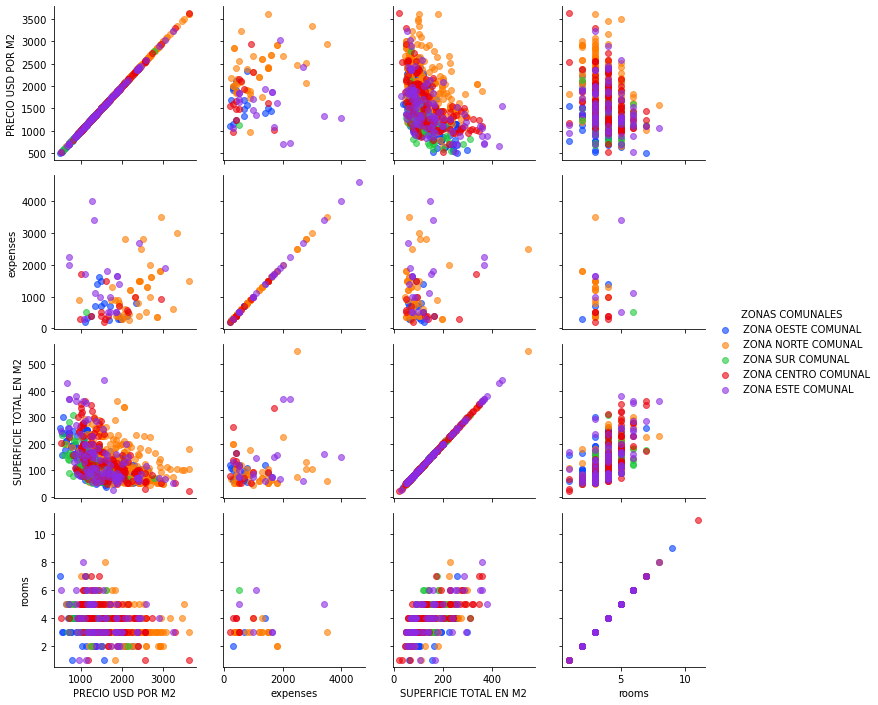

In [314]:
correlation_plotter(df_corr_capitalfederal_ph,['PRECIO USD POR M2','expenses','SUPERFICIE TOTAL EN M2','rooms'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones PHs:
   
   * Los PH que mayores EXPENSAS pagan, se encuentran en la ZONA ESTE COMUNAL y la ZONA NORTE COMUNAL.
   
   * Los PH de mayores dimensiones los encontramos en la ZONA ESTE COMUNAL y la ZONA NORTE COMUNAL.
   
   * Podemos ver que hay una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y las SUPERFICIES que ocupa el PH, a medida que aumentan las dimensiones de los      PH, el PRECIO USD POR M2, va disminuyendo.
    
   * Podemos ver que hay una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la cantidad de ambientes del PH, lo cual esta relacionado con la conclusion        anterior sobre las dimensiones del PH.
   
   * Podemos ver que hay una correlacion `POSITIVA` entre el PRECIO USD POR M2 y las EXPENSAS que paga el PH, esto se debe probablemente, porque                    PHs ubicados en zonas mas costosas pagan mayores expensas.

##### CORRELACION EN STORES UBICADOS EN CAPITAL FEDERAL

In [315]:
df_corr_capitalfederal_stores = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_stores.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.405,-0.358,-0.356,-0.403,-0.086
PRECIO USD,0.405,1.000,0.542,0.542,-0.067,0.218
SUPERFICIE TOTAL EN M2,-0.358,0.542,1.000,0.984,0.538,0.554
SUPERFICIE CUBIERTA EN M2,-0.356,0.542,0.984,1.000,0.489,0.550
rooms,-0.403,-0.067,0.538,0.489,1.000,1.000
expenses,-0.086,0.218,0.554,0.550,1.000,1.000


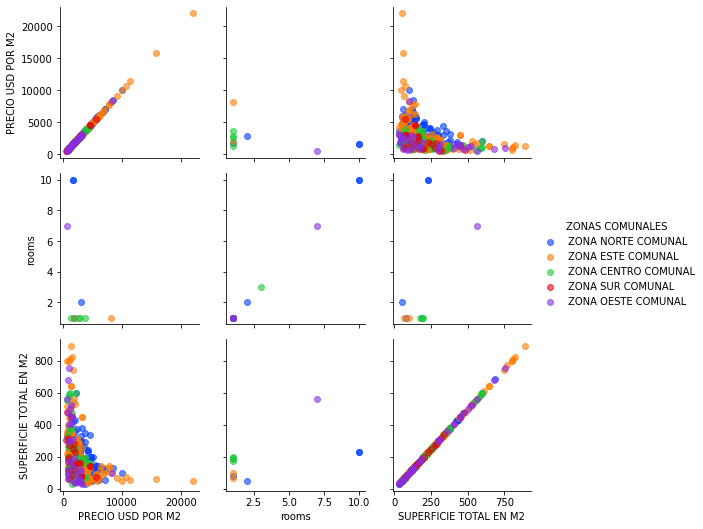

In [316]:
correlation_plotter(df_corr_capitalfederal_stores,['PRECIO USD POR M2','rooms','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones STORES:

   * Pareciera haber una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la SUPERFICIE, Stores de mayores superficies, su PRECIO USD POR M2 va                  disminuyendo.
   
   * Pareciera haber una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la cantidad de AMBIENTES del STORE, pero al ser una cantidad pequeña de datos, hay      que tener cuidado con esta conclusion, puede no ser representativa.

##### CORRELACION EN PISOS/SEMI-PISOS/PENTHOUSES UBICADOS EN CAPITAL FEDERAL

In [317]:
df_corr_capitalfederal_pisos = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_pisos.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.882,0.041,0.225,-0.144,0.556
PRECIO USD,0.882,1.000,0.441,0.478,0.005,0.626
SUPERFICIE TOTAL EN M2,0.041,0.441,1.000,0.800,0.311,0.329
SUPERFICIE CUBIERTA EN M2,0.225,0.478,0.800,1.000,0.434,0.502
rooms,-0.144,0.005,0.311,0.434,1.000,0.082
expenses,0.556,0.626,0.329,0.502,0.082,1.000


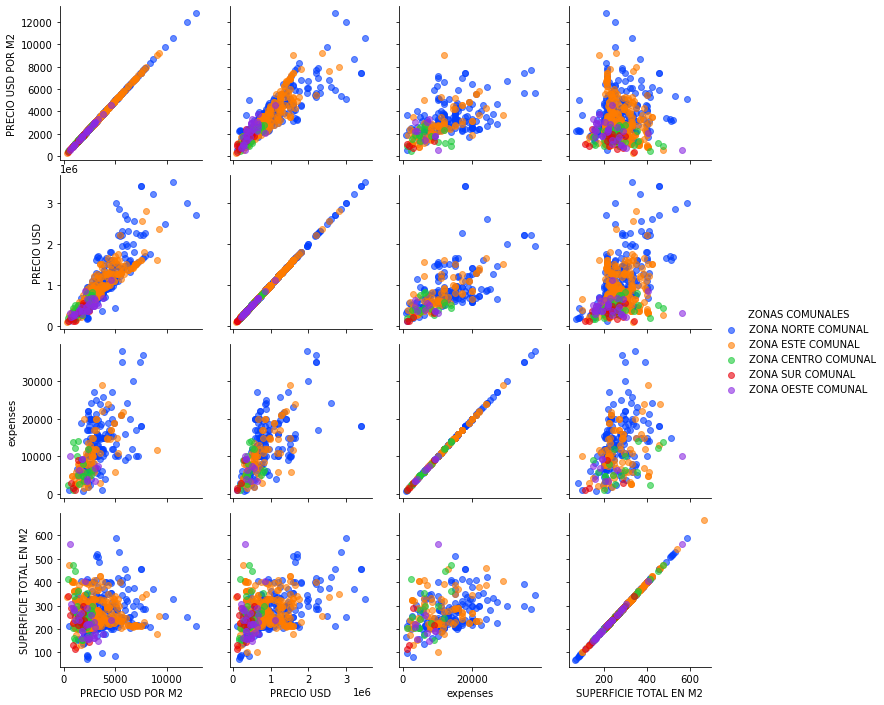

In [318]:
correlation_plotter(df_corr_capitalfederal_pisos,['PRECIO USD POR M2','PRECIO USD','expenses','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones PISOS/SEMI-PISOS/PENTHOUSES:

   * Los PISOS mas costosos, se encuentran en la ZONA NORTE COMUNAL
   
   * Los PISOS que mayor costos de expensas tienen, se encuentran en la ZONA NORTE COMUNAL.
   
   * Los PISOS de mayores dimensiones se encuentran en la ZONA NORTE COMUNAL.

   * Podemos ver que hay una correlacion `POSITIVA` con el PRECIO USD.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de las EXPENSAS del PISO, inmuebles ubicados en zonas mas costosas o que tienen mas amenities,      suelen tener un PRECIO USD POR M2 mayor.
   
   * A diferencia de otras propiedades, donde el PRECIO USD POR M2, disminuia conforme aumentaban las dimensiones de la propiedad, en este caso, podemos ver        que hay una correlacion `POSITIVA` entre las SUPERFICIES y el PRECIO USD POR M2, similar a lo que ocurre con los apartamentos, al aumentar la superficie        del inmueble, el PRECIO USD POR M2, tiene a aumentar.


<a id="8"></a> 
## 8) Analisis y Operacion Sobre Datos Faltantes
[Ir a índice](#indice)

Seguimos trabajando solamente sobre los inmuebles ubicados en capital federal

In [319]:
df_sin_imputar = df[df.state_name=='capitalfederal']

In [320]:
df[df.state_name=='capitalfederal'].isnull().sum()/df[df.state_name=='capitalfederal'].shape[0]*100


operation                     0.000
property_type                 0.000
place_name                    0.000
place_with_parent_names       0.000
country_name                  0.000
state_name                    0.000
geonames_id                   4.645
lat-lon                      15.621
lat                          15.621
lon                          15.621
price                         6.899
currency                      6.899
price_aprox_local_currency    6.899
price_aprox_usd               6.899
surface_total_in_m2          22.279
surface_covered_in_m2        10.023
price_usd_per_m2             28.058
price_per_m2                 15.304
floor                        89.228
rooms                        46.161
expenses                     75.482
properati_url                 0.000
description                   0.000
title                         0.000
image_thumbnail               0.000
PLACE NAME                    0.000
SUPERFICIE CUBIERTA EN M2    10.023
SUPERFICIE TOTAL EN M2      

En primer lugar, vemos si podemos imputar algunos valores de PRECIO USD POR M2, a partir de SUPERFICIE TOTAL EN M2 y PRECIO USD, vamos a seguir la siguiente logica de operacion.

1 PRECIO USD = PRECIO USD POR M2 * SUPERFICIE TOTAL EN M2

2 SUPERFICIE TOTAL EN M2 = PRECIO USD / PRECIO USD POR M2

3 PRECIO USD POR M2 = PRECIO USD / SUPERFICIE TOTAL EN M2

In [321]:
df_PRECIO_USD_NULL_CAPITAL_FED_mask=np.logical_and(df.state_name=='capitalfederal',df['PRECIO USD'].isnull())

df.loc[df_PRECIO_USD_NULL_CAPITAL_FED_mask,'PRECIO USD'] = df[['PRECIO USD POR M2','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD POR M2']* x['SUPERFICIE TOTAL EN M2'], axis=1)


In [322]:
df_SUPERFICIE_TOTAL_EN_M2_NULL_CAPITAL_FED_mask=np.logical_and(df.state_name=='capitalfederal',df['SUPERFICIE TOTAL EN M2'].isnull())

df.loc[df_SUPERFICIE_TOTAL_EN_M2_NULL_CAPITAL_FED_mask,'SUPERFICIE TOTAL EN M2'] = df[['PRECIO USD','PRECIO USD POR M2']].apply(lambda x: x['PRECIO USD']* x['PRECIO USD POR M2'], axis=1)

In [323]:
df_PRECIO_USD_POR_M2_NULL_CAPITAL_FED_mask=np.logical_and(df.state_name=='capitalfederal',df['PRECIO USD POR M2'].isnull())

df.loc[df_PRECIO_USD_POR_M2_NULL_CAPITAL_FED_mask,'PRECIO USD POR M2'] = df[['PRECIO USD','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD']/x['SUPERFICIE TOTAL EN M2'], axis=1)

In [324]:
df[df.state_name=='capitalfederal'][['PLACE NAME','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRICE','CURRENCY','PRECIO USD','TIPO DE PROPIEDAD']]\
.isnull().sum()/df[df.state_name=='capitalfederal'].shape[0]*100

PLACE NAME                0.000
SUPERFICIE TOTAL EN M2   21.151
PRECIO USD POR M2        26.704
PRICE                     6.566
CURRENCY                  6.566
PRECIO USD                6.839
TIPO DE PROPIEDAD         0.000
dtype: float64

Logramos bajar un 1.3% aproximadamente la cantidad de NaN values en PRECIO USD POR M2

Ahora vamos a buscar imputar SUPERFICIE TOTAL EN M2, a partir de las medianas de las superficies agrupando por tipo de propiedad y zona.

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - DEPARTAMENTOS

In [325]:
df_departamentos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='apartment')]

superficie_total_departamentos_groupby_place_name_mean=df_departamentos_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_departamentos_groupby_place_name_mean

PLACE NAME
abasto                77.526
agronomía             66.222
almagro               78.131
balvanera             83.650
barracas              91.103
barrionorte          102.479
belgrano             101.896
boca                  77.800
boedo                 85.737
caballito             90.027
centro/microcentro    82.778
chacarita             71.351
coghlan               82.767
colegiales            74.212
congreso              93.185
constitución          65.706
flores                80.590
floresta              75.797
lascañitas           106.116
liniers               65.058
mataderos             78.692
monserrat             71.444
montecastro           58.500
nuñez                 84.233
once                  80.333
palermo               96.203
palermochico         128.402
palermohollywood      81.479
palermosoho           84.106
palermoviejo         126.611
parqueavellaneda      62.875
parquecentenario      99.611
parquechacabuco       71.875
parquechas            75.000
par

Vemos que hay 1 valor de superficie con NaN value VILLARIACHUELO

In [326]:
index_riachuelo = df_departamentos_capitalfederal[df_departamentos_capitalfederal['PLACE NAME']=='villariachuelo'].index
df_departamentos_capitalfederal[df_departamentos_capitalfederal['PLACE NAME']=='villariachuelo']


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES
50299,sell,apartment,villariachuelo,|argentina|capitalfederal|villariachuelo|,argentina,capitalfederal,3427379.000,"-34698136,-58470461",-34.698,-58.470,85000.000,usd,1499782.500,85000.000,NaN,60.000,NaN,1416.667,12.000,3.000,NaN,http://wwwproperaticomar/19e48_venta_departame...,corredorresponsable:soniaelvirawunderlich-csi5...,ventadepartamento3ambientesvillacelina,https://thumbs4properaticom/5/lj1l7nvhaaxghfnj...,villariachuelo,60.000,NaN,NaN,85000.000,usd,85000.000,apartment,1.000,ZONA SUR COMUNAL


Observamos que se debe a que no tiene valor de SUPERFICIE TOTAL en el unico registro que existe de esa zona.

Debido a que se trata de un apartamento y las dimensiones cubiertas no suelen ser muy distintas a las totales, vamos a utilizar el valor de la SUPERFICE CUBIERTA

In [327]:
df.loc[index_riachuelo, 'SUPERFICIE TOTAL EN M2'] = df.loc[index_riachuelo, 'SUPERFICIE CUBIERTA EN M2']

In [328]:
df_departamentos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='apartment')]

superficie_total_departamentos_groupby_place_name_mean=df_departamentos_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']

In [329]:
df_departamentos_capital_SUP_TOTAL_null=df_departamentos_capitalfederal[df_departamentos_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_departamentos_capital_SUP_TOTAL_null = df_departamentos_capital_SUP_TOTAL_null.index
barrios_deptos_caba=df_departamentos_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_deptos_caba:
        if barrios == PLACE_NAME:
            return superficie_total_departamentos_groupby_place_name_mean.loc[barrios]

df.loc[index_departamentos_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_departamentos_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - CASAS

In [330]:
df_house_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='house')]

superficie_total_house_groupby_place_name_mean=df_house_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_house_groupby_place_name_mean

PLACE NAME
abasto                371.500
agronomía             295.667
almagro               347.192
balvanera             233.000
barracas              260.914
barrionorte           396.000
belgrano              439.674
boca                  359.750
boedo                 290.267
caballito             258.245
centro/microcentro    600.000
chacarita             192.600
coghlan               226.750
colegiales            268.071
constitución          236.250
flores                253.193
floresta              273.250
lascañitas            304.000
liniers               244.893
mataderos             261.725
monserrat             460.700
montecastro           156.600
nuñez                 318.577
palermo               373.500
palermochico          461.462
palermohollywood      504.400
palermosoho           318.375
palermoviejo          260.000
parqueavellaneda      248.429
parquechacabuco       293.765
parquechas            140.000
parquepatricios       258.615
paternal              237.545

In [331]:
df_houses_capital_SUP_TOTAL_null=df_house_capitalfederal[df_house_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_houses_capital_SUP_TOTAL_null = df_houses_capital_SUP_TOTAL_null.index
barrios_houses_caba=df_house_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_houses_caba:
        if barrios == PLACE_NAME:
            return superficie_total_house_groupby_place_name_mean.loc[barrios]

df.loc[index_houses_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_houses_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - PHs

In [332]:
df_ph_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='ph')]

superficie_total_ph_groupby_place_name_mean=df_ph_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']

superficie_total_ph_groupby_place_name_mean

PLACE NAME
abasto              121.500
agronomía           123.333
almagro             153.150
balvanera           143.000
barracas            133.897
barrionorte          88.500
belgrano            142.111
boca                104.875
boedo               172.650
caballito           146.689
chacarita           122.500
coghlan             137.100
colegiales          139.118
congreso             67.500
constitución        106.444
flores              124.140
floresta            121.211
lascañitas           82.500
liniers             124.833
mataderos           121.942
monserrat           121.500
montecastro         105.500
nuñez               133.533
once                 85.000
palermo             154.981
palermohollywood    143.556
palermosoho         120.286
palermoviejo        131.500
parqueavellaneda    150.750
parquecentenario    127.500
parquechacabuco     131.727
parquechas          150.000
parquepatricios     113.842
paternal            101.000
pompeya             152.714
recoleta 

In [333]:
df_ph_capital_SUP_TOTAL_null=df_ph_capitalfederal[df_ph_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_ph_capital_SUP_TOTAL_null = df_ph_capital_SUP_TOTAL_null.index
barrios_ph_caba=df_ph_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_ph_caba:
        if barrios == PLACE_NAME:
            return superficie_total_ph_groupby_place_name_mean.loc[barrios]

df.loc[index_ph_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_ph_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - STORES

In [334]:
df_store_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='store')]

superficie_total_store_groupby_place_name_mean=df_store_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_store_groupby_place_name_mean

PLACE NAME
abasto               165.800
agronomía            350.000
almagro              213.000
balvanera            211.300
barracas             181.571
barrionorte          101.500
belgrano             195.375
boca                 187.500
boedo                178.000
caballito            269.375
centro/microcentro   210.194
chacarita             80.000
coghlan              234.667
colegiales           162.167
congreso             190.545
constitución         244.143
flores               168.235
floresta             228.800
lascañitas           350.000
liniers              282.833
mataderos            182.667
monserrat            300.286
montecastro          755.000
nuñez                236.714
once                 273.083
palermo              156.940
palermohollywood     219.444
palermosoho          176.571
palermoviejo             NaN
parquecentenario     100.000
parquechacabuco      450.500
parquechas           180.000
parquepatricios      179.333
paternal             178.200
pom

Observamos que tenemos un NaN en palermo viejo.

In [335]:
df_store_capitalfederal[df_store_capitalfederal['PLACE NAME']=='palermoviejo']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES
83521,sell,store,palermoviejo,|argentina|capitalfederal|palermo|palermoviejo|,argentina,capitalfederal,NaN,"-345981559056,-58408105003",-34.598,-58.408,198000.000,usd,3493611.000,198000.000,NaN,104.000,NaN,1903.846,NaN,NaN,NaN,http://wwwproperaticomar/1b0mr_venta_local_pal...,"ventaopermutadelocalaestrenar,enplantabaja,alf...",local-palermoviejo,https://thumbs4properaticom/6/bstjfl0o6fcvnfpa...,palermoviejo,104.000,NaN,NaN,198000.000,usd,198000.000,store,1.000,ZONA NORTE COMUNAL


In [336]:
df_store_capital_SUP_TOTAL_null=df_store_capitalfederal[df_store_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_store_capital_SUP_TOTAL_null = df_store_capital_SUP_TOTAL_null.index
barrios_store_caba=df_store_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_store_caba:
        if barrios == PLACE_NAME:
            return superficie_total_store_groupby_place_name_mean.loc[barrios]

df.loc[index_store_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_store_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - DUPLEX/TRIPLEX

In [337]:
df_duplex_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='duplex/triplex')]

superficie_total_duplex_groupby_place_name_mean=df_duplex_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_duplex_groupby_place_name_mean

PLACE NAME
almagro               85.800
balvanera            116.000
barracas              99.000
barrionorte          135.500
belgrano             108.972
boca                 120.750
boedo                103.250
caballito            104.727
centro/microcentro    91.000
chacarita             64.000
coghlan              153.333
colegiales           122.667
congreso              73.000
flores                93.571
floresta              75.000
lascañitas           100.500
liniers               77.333
mataderos             89.000
monserrat             60.000
montecastro          104.667
nuñez                 72.824
once                     NaN
palermo              111.927
palermochico         204.500
palermohollywood      84.800
palermosoho          137.000
parquecentenario     190.000
paternal              63.000
pompeya                  NaN
puertomadero         133.429
recoleta             147.792
retiro               111.000
saavedra              85.417
sancristobal         155.500
san

Observamos que tenemos un NaN en pompeya y once, que es lo mismo que balvanera.

In [338]:
once=df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']=='once']
once

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES
110260,sell,apartment,once,|argentina|capitalfederal|once|,argentina,capitalfederal,3430291.000,"-34606699,-58411274",-34.607,-58.411,92500.000,usd,1632116.250,92500.000,NaN,70.000,NaN,1321.429,3.000,2.000,NaN,http://wwwproperaticomar/1c3ej_venta_departame...,corredorresponsable:veronicagrelareina-cucicba...,departamento2ambenduplexalmagroaestrenar,https://thumbs4properaticom/0/yb7fisdcp3hh-uat...,once,70.000,NaN,NaN,92500.000,usd,92500.000,duplex/triplex,1.000,ZONA ESTE COMUNAL


In [339]:
df.loc[once.index,'PLACE NAME']='balvanera'

In [340]:
df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']=='pompeya']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES
33944,sell,ph,pompeya,|argentina|capitalfederal|pompeya|,argentina,capitalfederal,3430387.000,"-34646048,-58414174",-34.646,-58.414,115000.000,usd,2029117.500,115000.000,NaN,66.000,NaN,1742.424,NaN,4.000,NaN,http://wwwproperaticomar/18azx_venta_ph_pompey...,corredorresponsable:arielchampanier-cucicba433...,venta4ambduplexhospitaleslineah,https://thumbs4properaticom/0/svuvuriuxgmfnkx9...,pompeya,66.000,NaN,NaN,115000.000,usd,115000.000,duplex/triplex,1.000,ZONA SUR COMUNAL


In [341]:
df_duplex_capital_SUP_TOTAL_null=df_duplex_capitalfederal[df_duplex_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_duplex_capital_SUP_TOTAL_null = df_duplex_capital_SUP_TOTAL_null.index
barrios_duplex_caba=df_duplex_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_duplex_caba:
        if barrios == PLACE_NAME:
            return superficie_total_duplex_groupby_place_name_mean.loc[barrios]

df.loc[index_duplex_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_duplex_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - PISOS/PENTHOUSES

In [342]:
df_pisos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='piso/penthouse')]

superficie_total_pisos_groupby_place_name_mean=df_pisos_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_pisos_groupby_place_name_mean

PLACE NAME
almagro              229.000
balvanera            250.000
barracas             233.444
barrionorte          278.271
belgrano             266.438
boca                 276.000
boedo                249.500
caballito            276.882
catalinas            300.000
centro/microcentro   313.750
chacarita            202.000
coghlan              220.500
colegiales           229.800
congreso             262.400
constitución         243.500
flores               254.231
lascañitas           240.300
liniers              260.000
mataderos            271.667
monserrat            226.636
montecastro          289.000
nuñez                277.179
once                 307.000
palermo              279.957
palermochico         282.000
palermohollywood     267.667
palermosoho          203.000
parquecentenario     237.000
puertomadero         275.900
recoleta             272.885
retiro               256.526
saavedra             139.143
sancristobal         360.000
sannicolás           243.667
san

In [343]:
df_pisos_capital_SUP_TOTAL_null=df_pisos_capitalfederal[df_pisos_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_pisos_capital_SUP_TOTAL_null = df_pisos_capital_SUP_TOTAL_null.index
barrios_pisos_caba=df_pisos_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_pisos_caba:
        if barrios == PLACE_NAME:
            return superficie_total_pisos_groupby_place_name_mean.loc[barrios]

df.loc[index_pisos_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_pisos_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

Vamos a revisar como quedo nuestra columna SUPERFICIE TOTAL EN M2

In [344]:
df[df.state_name=='capitalfederal'][['PLACE NAME','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRICE','CURRENCY','PRECIO USD','TIPO DE PROPIEDAD']]\
.isnull().sum()/df[df.state_name=='capitalfederal'].shape[0]*100

PLACE NAME                0.000
SUPERFICIE TOTAL EN M2    0.023
PRECIO USD POR M2        26.704
PRICE                     6.566
CURRENCY                  6.566
PRECIO USD                6.839
TIPO DE PROPIEDAD         0.000
dtype: float64

In [345]:
df[np.logical_and(df.state_name=='capitalfederal',df['SUPERFICIE TOTAL EN M2'].isnull())]\
        [['TIPO DE PROPIEDAD','PLACE NAME','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2']]

,TIPO DE PROPIEDAD,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2
33944,duplex/triplex,pompeya,66.000,NaN
83521,store,palermoviejo,104.000,NaN
110260,duplex/triplex,balvanera,70.000,NaN


Los valores que quedaron sin imputar, son aquellos donde no tenemos registros, para poder sacar su valor de imputacion.

#### Ahora imputamos el PRECIO USD POR M2 con PRICE USD y SUPERFICIE TOTAL EN M2

In [346]:
df_PRECIO_USD_POR_M2_NULL_CAPITAL_FED_mask=np.logical_and(df.state_name=='capitalfederal',df['PRECIO USD POR M2'].isnull())

df.loc[df_PRECIO_USD_POR_M2_NULL_CAPITAL_FED_mask,'PRECIO USD POR M2'] = df[['PRECIO USD','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD']/x['SUPERFICIE TOTAL EN M2'], axis=1)

In [347]:
df[df.state_name=='capitalfederal'].isnull().sum()/df[df.state_name=='capitalfederal'].shape[0]*100

operation                     0.000
property_type                 0.000
place_name                    0.000
place_with_parent_names       0.000
country_name                  0.000
state_name                    0.000
geonames_id                   4.645
lat-lon                      15.621
lat                          15.621
lon                          15.621
price                         6.899
currency                      6.899
price_aprox_local_currency    6.899
price_aprox_usd               6.899
surface_total_in_m2          22.279
surface_covered_in_m2        10.023
price_usd_per_m2             28.058
price_per_m2                 15.304
floor                        89.228
rooms                        46.161
expenses                     75.482
properati_url                 0.000
description                   0.000
title                         0.000
image_thumbnail               0.000
PLACE NAME                    0.000
SUPERFICIE CUBIERTA EN M2    10.023
SUPERFICIE TOTAL EN M2      

### Vamos a ver como se afecto el PRECIO USD POR M2 con un scatterplot antes y despues de la imputacion.

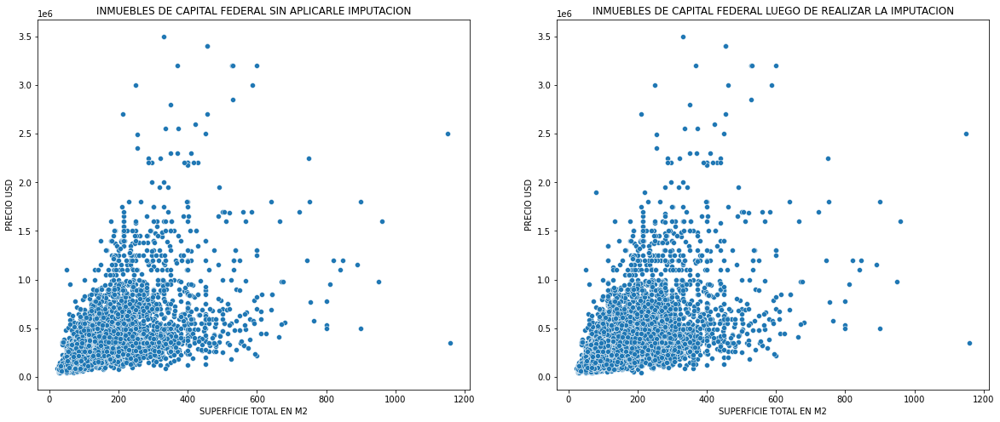

In [348]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 =sns.scatterplot(data = df[df.state_name=='capitalfederal'], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar, x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("INMUEBLES DE CAPITAL FEDERAL LUEGO DE REALIZAR LA IMPUTACION")
g2.set_title("INMUEBLES DE CAPITAL FEDERAL SIN APLICARLE IMPUTACION")

plt.show()

### Vamos a separar por zonas comunales a los inmuebles, a ver como afecto la imputacion.

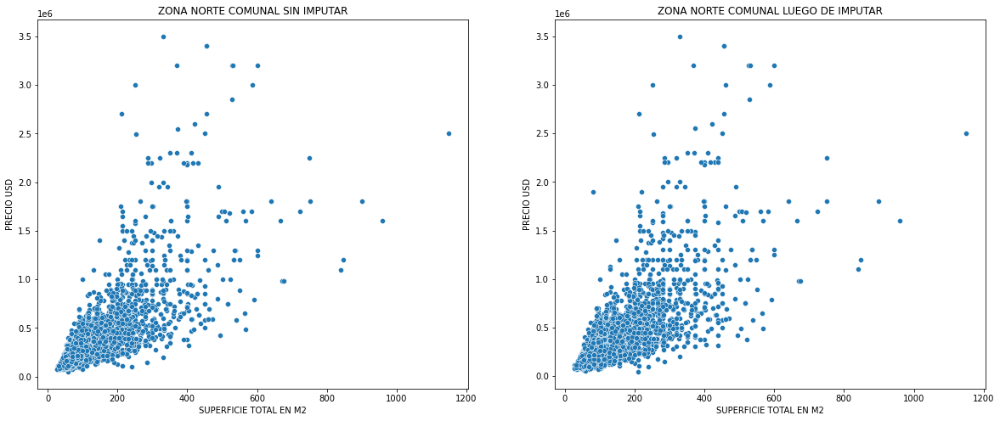

In [349]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA NORTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA NORTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA NORTE COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA NORTE COMUNAL SIN IMPUTAR")

plt.show()

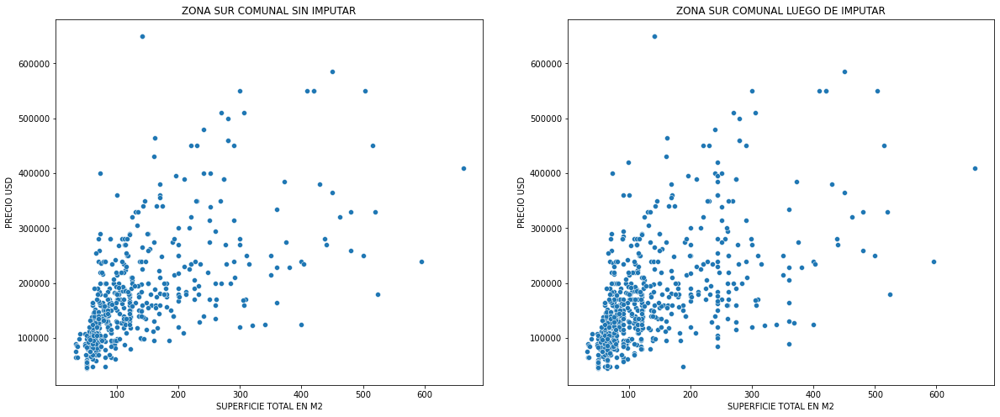

In [350]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA SUR COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA SUR COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA SUR COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA SUR COMUNAL SIN IMPUTAR")

plt.show()

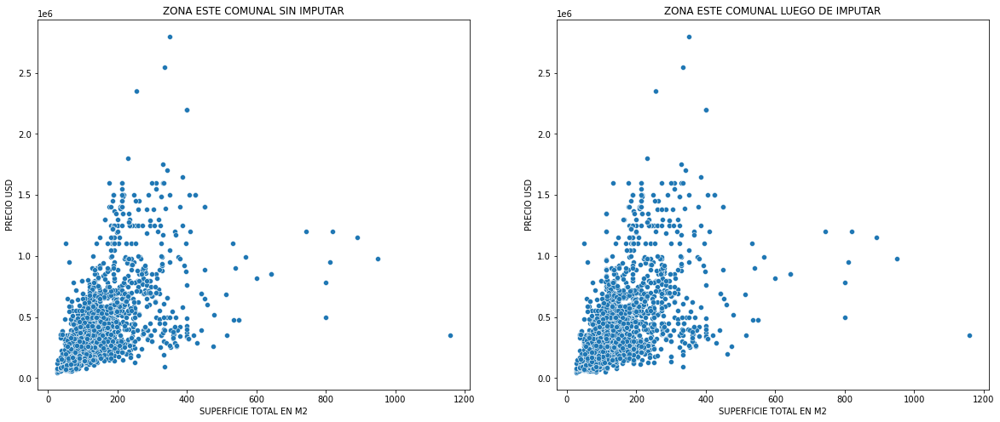

In [351]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA ESTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA ESTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA ESTE COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA ESTE COMUNAL SIN IMPUTAR")

plt.show()

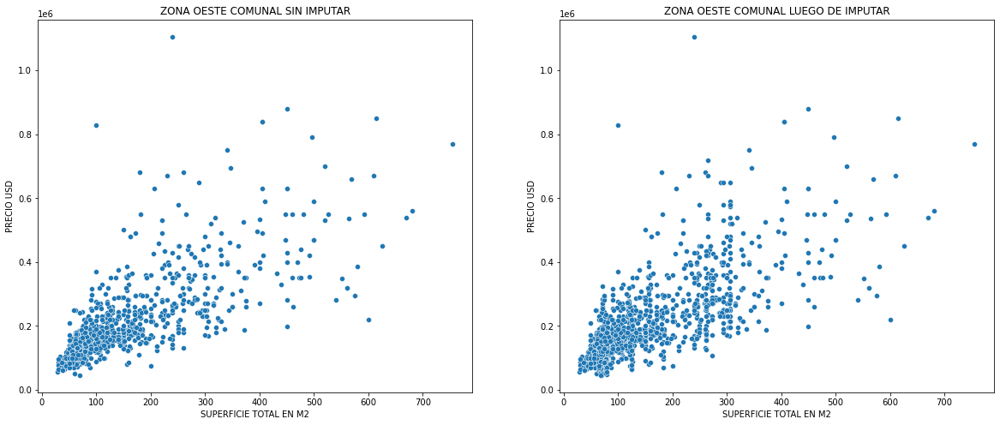

In [352]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA OESTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA OESTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA OESTE COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA OESTE COMUNAL SIN IMPUTAR")

plt.show()

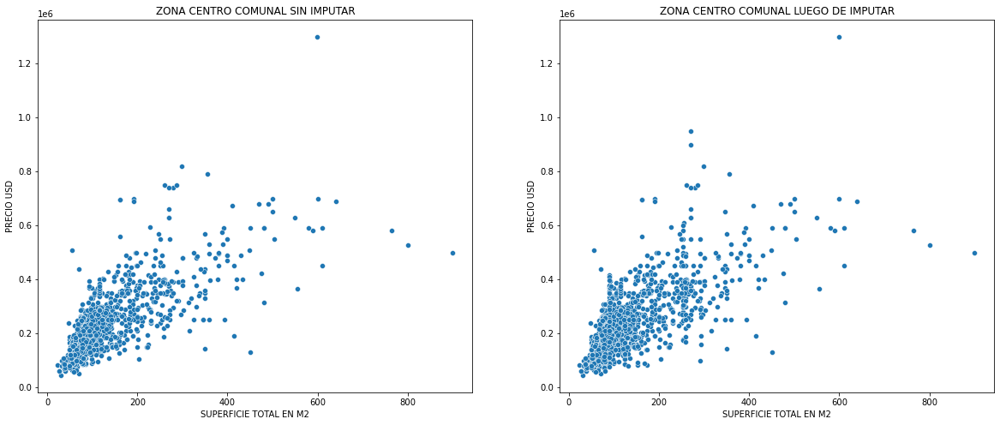

In [353]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA CENTRO COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA CENTRO COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA CENTRO COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA CENTRO COMUNAL SIN IMPUTAR")

plt.show()

#### **No parece haber grandes cambios luego de la imputacion, por lo que vamos a adoptar esta imputacion**

# `CONCLUSION:`

In [354]:
registros_capital_federal_dirty=dataset[dataset['state_name']=='Capital Federal'].shape[0]
registros_capital_federal_dirty

32316

In [355]:
registros_capital_federal_clean=df[df['state_name']=='capitalfederal'].shape[0]
registros_capital_federal_clean

13219

In [356]:
reduccion_del_dataset=registros_capital_federal_clean/registros_capital_federal_dirty
reduccion_del_dataset*100

40.905433840821885

#### Con lo cual el dataset, limpio luego de imputarlo y sacarle los outliers, duplicados, valores mal ingresados, nos queda reducido en un 40.9% del tamaño que tenia originalmente, ya que paso de 32.316 registros a 13219

<a id="9"></a> 
## 9) Limpieza y transformación de "rooms"

#### Índice del punto 9

[9.1) Analizo el dato "rooms" vs lo que puedo encontrar en "description"](#9.1)

[9.1.a) Inmuebles de 2 ambientes](#9.1.a)

[9.1.b) Inmuebles de 3 ambientes](#9.1.b)

[9.1.c) Inmuebles de 1 ambiente](#9.1.c)

[9.1.d) Inmuebles de 4 ambientes](#9.1.d)

[9.1.e) Dropear dataset según cantidad de ambientes](#9.1.e)

[9.2) Limpieza para cuando el regex tira un ambiente pero es una casa](#9.2)

[9.3) Imputación de valores en "ambientes_regex" y borrar "rooms"](#9.3)

[Ir a índice](#indice)

In [357]:
# miro cómo están las cantidades del dataframe ahora
df.shape

(68245, 35)

In [358]:
data = df

In [359]:
data.rooms.value_counts()

3.000     9298
4.000     6227
2.000     4627
5.000     2975
1.000     1125
6.000     1097
7.000      616
8.000      322
10.000     176
9.000      140
11.000      58
12.000      51
13.000      26
14.000      25
15.000      18
17.000      12
16.000       9
20.000       8
18.000       6
22.000       6
30.000       4
21.000       4
19.000       2
32.000       2
23.000       2
25.000       2
24.000       1
31.000       1
27.000       1
29.000       1
28.000       1
Name: rooms, dtype: int64

In [360]:
len(data)

68245

In [361]:
data.rooms.isnull().sum()

41402

In [362]:
# reemplazo nulos con 0, sabiendo que el dato 0 no existe en rooms. Para que más adelante me lo tome el value_counts o el pivot table
data["rooms"] = data.rooms.fillna(0)
data.rooms.value_counts()

0.000     41402
3.000      9298
4.000      6227
2.000      4627
5.000      2975
1.000      1125
6.000      1097
7.000       616
8.000       322
10.000      176
9.000       140
11.000       58
12.000       51
13.000       26
14.000       25
15.000       18
17.000       12
16.000        9
20.000        8
18.000        6
22.000        6
30.000        4
21.000        4
19.000        2
32.000        2
25.000        2
23.000        2
24.000        1
31.000        1
28.000        1
27.000        1
29.000        1
Name: rooms, dtype: int64

In [363]:
data.rooms.value_counts(normalize = True)
# 61% nulos aprox.

0.000    0.607
3.000    0.136
4.000    0.091
2.000    0.068
5.000    0.044
1.000    0.016
6.000    0.016
7.000    0.009
8.000    0.005
10.000   0.003
9.000    0.002
11.000   0.001
12.000   0.001
13.000   0.000
14.000   0.000
15.000   0.000
17.000   0.000
16.000   0.000
20.000   0.000
18.000   0.000
22.000   0.000
30.000   0.000
21.000   0.000
19.000   0.000
32.000   0.000
25.000   0.000
23.000   0.000
24.000   0.000
31.000   0.000
28.000   0.000
27.000   0.000
29.000   0.000
Name: rooms, dtype: float64

In [364]:
data.columns

Index(['operation', 'property_type', 'place_name', 'place_with_parent_names',
       'country_name', 'state_name', 'geonames_id', 'lat-lon', 'lat', 'lon',
       'price', 'currency', 'price_aprox_local_currency', 'price_aprox_usd',
       'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2',
       'price_per_m2', 'floor', 'rooms', 'expenses', 'properati_url',
       'description', 'title', 'image_thumbnail', 'PLACE NAME',
       'SUPERFICIE CUBIERTA EN M2', 'SUPERFICIE TOTAL EN M2',
       'PRECIO USD POR M2', 'PRICE', 'CURRENCY', 'PRECIO USD',
       'TIPO DE PROPIEDAD', 'CANTIDAD', 'ZONAS COMUNALES'],
      dtype='object')

<a id="9.1"></a>
#### 9.1) Analizo el dato "rooms" vs lo que puedo encontrar en "description"

[Ir a índice del punto 9](#9)

In [365]:
# configuro para que muestre todas las columnas y filas cuando quiero ver tablas
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [366]:
# veo comentarios con todos sus caracteres, los voy a usar para preparar el patróx regex
comentrooms = data.sample(7)
#list(comentrooms.description)

In [367]:
# por ahora es un string lo que va a ser regex
patron_ambientescompleto = ".?(?P<cantidad_ambientes>\d\d?|un|uno|dos|tres|cuatro|cinco|mono)\s?\s?(?P<ambiente>amb)"
# el compile lo que hace es pasarlo a formato pattern
regex_ambientescompleto = re.compile(patron_ambientescompleto)

In [368]:
encuentra_ambientes = data.description.apply(lambda x: None if x is np.NaN else regex_ambientescompleto.search(x))
encuentra_ambientes = encuentra_ambientes.apply(lambda x: x if x is None else x.group('cantidad_ambientes'))
encuentra_ambientes.value_counts()

3         8177
4         4625
2         3958
5         1485
dos        997
tres       884
mono       831
6          457
un         322
1          273
cuatro     207
7          191
cinco       37
8           27
9           18
00          15
23          15
24          11
10           8
11           8
50           7
04           7
14           6
53           6
26           4
03           4
06           4
27           3
33           3
72           3
02           3
05           3
43           3
15           2
08           2
83           2
44           2
18           2
93           2
13           2
45           2
uno          2
17           2
92           2
97           2
12           2
28           1
84           1
52           1
0            1
64           1
37           1
54           1
22           1
35           1
73           1
47           1
51           1
25           1
62           1
21           1
46           1
30           1
63           1
91           1
Name: description, dtype:

In [369]:
encuentra_ambientes = data.description.apply(lambda x: None if x is np.NaN else regex_ambientescompleto.search(x))
data['ambientes_regex'] = encuentra_ambientes.apply(lambda x: 'No se encontró' if x is None else x.group('cantidad_ambientes'))

In [370]:
data['ambientes_regex'].value_counts()

No se encontró    45598
3                  8177
4                  4625
2                  3958
5                  1485
dos                 997
tres                884
mono                831
6                   457
un                  322
1                   273
cuatro              207
7                   191
cinco                37
8                    27
9                    18
00                   15
23                   15
24                   11
11                    8
10                    8
04                    7
50                    7
14                    6
53                    6
03                    4
06                    4
26                    4
05                    3
27                    3
33                    3
72                    3
02                    3
43                    3
15                    2
08                    2
83                    2
44                    2
18                    2
93                    2
13                    2
45              

In [371]:
data['ambientes_regex'].value_counts(normalize=True)

No se encontró   0.668
3                0.120
4                0.068
2                0.058
5                0.022
dos              0.015
tres             0.013
mono             0.012
6                0.007
un               0.005
1                0.004
cuatro           0.003
7                0.003
cinco            0.001
8                0.000
9                0.000
00               0.000
23               0.000
24               0.000
11               0.000
10               0.000
04               0.000
50               0.000
14               0.000
53               0.000
03               0.000
06               0.000
26               0.000
05               0.000
27               0.000
33               0.000
72               0.000
02               0.000
43               0.000
15               0.000
08               0.000
83               0.000
44               0.000
18               0.000
93               0.000
13               0.000
45               0.000
uno              0.000
17         

<h5>Veo que el regex no capta gran parte de los inmuebles (66% nulos). Sin embargo, la columna "rooms" también tenía muchos nulos (61% nulos).<br>
El siguiente trabajo consiste en chequear los que sí capta, para ver qué dice la columna "rooms" y que de alguna manera eso me verifique la consistencia de esa columna

<a id="9.1.a"></a> 
#### 9.1.a) Inmuebles de 2 ambientes

[Ir a índice del punto 9](#9)

In [372]:
# chequeo cantidades entre lo que el regex devuelve para dos ambientes y lo que dice el rooms
dos_ambientes = data[(data['ambientes_regex'] == 'dos') | (data['ambientes_regex'] == '2')]
print('Cantidades que me tira el regex')
print(dos_ambientes.ambientes_regex.value_counts())
print('')
print('Cantidades que me tira el rooms')
print(dos_ambientes.rooms.value_counts())
print('')
print('Cantidades que me tira el rooms en %')
print(dos_ambientes.rooms.value_counts(normalize=True))

Cantidades que me tira el regex
2      3958
dos     997
Name: ambientes_regex, dtype: int64

Cantidades que me tira el rooms
0.000     2362
2.000     2276
3.000      110
1.000       85
4.000       60
5.000       34
6.000       13
7.000        6
10.000       4
9.000        1
12.000       1
13.000       1
11.000       1
8.000        1
Name: rooms, dtype: int64

Cantidades que me tira el rooms en %
0.000    0.477
2.000    0.459
3.000    0.022
1.000    0.017
4.000    0.012
5.000    0.007
6.000    0.003
7.000    0.001
10.000   0.001
9.000    0.000
12.000   0.000
13.000   0.000
11.000   0.000
8.000    0.000
Name: rooms, dtype: float64


<h5>Voy a chequear samples de descripciones en las que difieren para entender cuál de las dos columnas es más fiable

In [373]:
# chequeo sample de los inmuebles que el regex tiró dos ambientes y el rooms dice algo distinto
aux_2_rooms = data[((data['ambientes_regex'] == 'dos') | (data['ambientes_regex'] == '2')) & (data['rooms'] != 2)].sample(5)
aux_2_rooms

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
99961,sell,apartment,nordelta,|argentina|bsasgbazonanorte|tigre|nordelta|,argentina,bsasgbazonanorte,NaN,NaN,NaN,NaN,165000.000,usd,2911342.500,165000.000,NaN,49.000,NaN,3367.347,NaN,0.000,NaN,http://wwwproperaticomar/1bnaa_venta_departame...,excelenteoficinaaptoprofesional2ambconcocheray...,departamento-puertanorte,https://thumbs4properaticom/8/bnx6mi7rh5ogvueu...,nordelta,49.000,NaN,NaN,165000.000,usd,165000.000,apartment,1.000,NaN,2
99943,sell,apartment,martínez,|argentina|bsasgbazonanorte|sanisidro|martínez|,argentina,bsasgbazonanorte,3430813.000,NaN,NaN,NaN,160000.000,usd,2823120.000,160000.000,NaN,NaN,NaN,NaN,NaN,0.000,NaN,http://wwwproperaticomar/1bn9d_venta_departame...,edificiolaguzzidptos2ambdesdeu$s160000losambda...,departamento-martinez,nan,martínez,NaN,NaN,NaN,160000.000,usd,160000.000,apartment,1.000,NaN,2
64394,sell,apartment,nordelta,|argentina|bsasgbazonanorte|tigre|nordelta|,argentina,bsasgbazonanorte,NaN,NaN,NaN,NaN,187000.000,usd,3299521.500,187000.000,75.000,53.000,2493.333,3528.302,NaN,0.000,NaN,http://wwwproperaticomar/1aatk_venta_departame...,allago!2ambientesenportezuelo!idealinversores!...,departamento-albatros,https://thumbs4properaticom/1/nqhatsuyxa142zsp...,nordelta,53.000,75.000,2493.333,187000.000,usd,187000.000,apartment,1.000,NaN,2
99576,sell,house,lomasdezamora,|argentina|bsasgbazonasur|lomasdezamora|lomasd...,argentina,bsasgbazonasur,NaN,NaN,NaN,NaN,130000.000,usd,2293785.000,130000.000,110.000,100.000,1181.818,1300.000,NaN,0.000,NaN,http://wwwproperaticomar/1bmsw_venta_casa_loma...,aptocréditobancario!!duplexde2ambientesy1/2liv...,casa-lomasdezamoraoeste,https://thumbs4properaticom/0/0vn_zvw-2apsrhdu...,lomasdezamora,100.000,110.000,1181.818,130000.000,usd,130000.000,house,1.000,NaN,2
104233,sell,apartment,liniers,|argentina|capitalfederal|liniers|,argentina,capitalfederal,3431333.000,"-346415839514,-585059745036",-34.642,-58.506,85000.000,usd,1499782.500,85000.000,NaN,NaN,NaN,NaN,NaN,0.000,NaN,http://wwwproperaticomar/1bt1l_venta_departame...,"edificioenelbarriodevillaluro,acassuso5570/75,...",departamento-liniers,https://thumbs4properaticom/1/wwquprd9lx7bbn8_...,liniers,NaN,65.058,1306.533,85000.000,usd,85000.000,apartment,1.000,ZONA OESTE COMUNAL,dos


In [374]:
list(aux_2_rooms.description)

['excelenteoficinaaptoprofesional2ambconcocherayvistaalcentrocomercial,distribuidoconunarecepción,cocinay3boxprivados,idealparaconsultorio,oficinasocentrodebellezaeldeptoestaimpecableytieneungranpotencialparacualquiertipodereformaporsuexcelentedistribuciónhttp://',
 'edificiolaguzzidptos2ambdesdeu$s160000losambdanalpatioconcocheraoptativa1dormitoriosconplacardaestrenar',
 'allago!2ambientesenportezuelo!idealinversores!ultimasunidades!gabrielaiglesiasnegociosinmobiliariosmásde15añoscomercializandopropiedadesennordeltaofnordeltat:yrotd:bahiagrandelocal7nordeltam:ofvillanuevat:yrotd:deanfunesyboulevardvillanuevam:horarios:lunasab10a18hsconsultanuestrositioweb:códigoreferenciapropiedad:gap446573',
 'aptocréditobancario!!duplexde2ambientesy1/2living-comedor3,40x4,20mts,cocinaintegradacompletaaltoybajomesadacondesayunadorespacioparalavarropasylavavajillas2,75x2,20mts,entrepisoo(segundodormitorio,escritorio,vestidor)2x4,45mts,lavadero,toilette,patio2,85x1,90mtsplantaalta,hall2,85x4,45mts,dorm

<h5>Después de leer varios samples, generalmente es más fiable la columna "ambientes_regex".

In [375]:
# chequeo sample de los inmuebles que el regex tiró dos ambientes y el rooms dice dos ambientes
aux_2_rooms_coincide = data[((data['ambientes_regex'] == 'dos') | (data['ambientes_regex'] == '2')) & (data['rooms'] == 2)].sample(5)
aux_2_rooms_coincide

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
11450,sell,apartment,puertomadero,|argentina|capitalfederal|puertomadero|,argentina,capitalfederal,3429760.000,"-346037721,-583635529",-34.604,-58.364,450000.000,usd,7940025.000,450000.000,66.000,55.000,6818.182,8181.818,NaN,2.000,NaN,http://wwwproperaticomar/16bp4_venta_departame...,"dosambientesconescritorio,incríblesvistasalaci...",torresdelyachvistaaldiquepuentedelamujer,https://thumbs4properaticom/3/hxagd8xlikrrvt9v...,puertomadero,55.000,66.000,6818.182,450000.000,usd,450000.000,apartment,1.000,ZONA ESTE COMUNAL,dos
113317,sell,apartment,mardelplata,|argentina|buenosairescostaatlántica|mardelplata|,argentina,buenosairescostaatlántica,3430863.000,"-380001057,-575544402",-38.000,-57.554,157000.000,usd,2770186.500,157000.000,NaN,61.000,NaN,2573.770,NaN,2.000,NaN,http://wwwproperaticomar/1c86w_venta_departame...,departamentode2ambientesalacalleaestrenar-semi...,bolivar3100andros,https://thumbs4properaticom/7/91zkbw3wvjqrt0xs...,mardelplata,61.000,NaN,NaN,157000.000,usd,157000.000,apartment,1.000,NaN,2
32433,sell,apartment,mardelplata,|argentina|buenosairescostaatlántica|mardelplata|,argentina,buenosairescostaatlántica,3430863.000,"-37999962,-575459176",-38.000,-57.546,79900.000,usd,1409795.550,79900.000,39.000,NaN,2048.718,NaN,NaN,2.000,NaN,http://wwwproperaticomar/186zv_venta_departame...,"2ambientesalacalleconbalconsaliente,hallentrad...",depto2ambsgodelestero1700,https://thumbs4properaticom/6/b1fo8pmf01852u16...,mardelplata,NaN,39.000,2048.718,79900.000,usd,79900.000,apartment,1.000,NaN,2
16066,sell,apartment,mardelplata,|argentina|buenosairescostaatlántica|mardelplata|,argentina,buenosairescostaatlántica,3430863.000,"-380046431,-575454812",-38.005,-57.545,85000.000,usd,1499782.500,85000.000,43.000,NaN,1976.744,NaN,NaN,2.000,NaN,http://wwwproperaticomar/16xf9_venta_departame...,"dpto2ambexthalldeentrada,ampliodistribuidor,li...",dpto2ambext,https://thumbs4properaticom/3/t4zkmpth6ehcu_9m...,mardelplata,NaN,43.000,1976.744,85000.000,usd,85000.000,apartment,1.000,NaN,2
52885,sell,apartment,quilmes,|argentina|bsasgbazonasur|quilmes|quilmes|,argentina,bsasgbazonasur,3429651.000,"-34726994,-58248138",-34.727,-58.248,130000.000,usd,2293785.000,130000.000,NaN,53.000,NaN,2452.830,9.000,2.000,NaN,http://wwwproperaticomar/19k5x_venta_departame...,corredorresponsable:martinveltri-cmq805contact...,"dpto2ambc/cochera,terrazasdequilmes",https://thumbs4properaticom/0/jeomi0zpp5jlzmoa...,quilmes,53.000,NaN,NaN,130000.000,usd,130000.000,apartment,1.000,NaN,2


In [376]:
list(aux_2_rooms_coincide.description)

['dosambientesconescritorio,incríblesvistasalaciudadelrioenunodelosmejoresedificiosdepuertomaderocuentaconvestidosyyacuzzienlaunidad,spaprofesionalpiscinaolímpicayotradeniñosgymconmuybuenasmáquinas,dosambientesconunescritorioyvestidorenelcuerto',
 'departamentode2ambientesalacalleaestrenar-semipiso-61mts2aprox-livingcomedorconbalcónterraza-toilette-cocinaseparadaconbarra-lavadero-dormitorioensuiteconbañocompleto(hidro)-calefacciónporlosaradiante-edificioconquinchodeusocomúncocheraaparte:valores:cubiertau$s23500,descubiertau$s17500',
 '2ambientesalacalleconbalconsaliente,hallentrada,amplioliving-comedor(6x3),cocinaseparadaconespacioparalavarropa,hallintimodistribuccionconplacard,bañocompleto,dormitorio(3x350)conplacard,reciclado',
 'dpto2ambexthalldeentrada,ampliodistribuidor,livingalfrenteconbalcón,dormitorioalcfteconplacard,bañocompleto,cocinaconespacioparalavarropasimpecablemuebles',
 'corredorresponsable:martinveltri-cmq805contacto:georginabuono-mlsid#420171087-13departamentode2ambi

<h5>Se comprueba con varios samples que cuando ambos coinciden es porque el dato es correcto en ambas columnas

<a id="9.1.b"></a>
#### 9.1.b) Inmuebles de 3 ambientes

[Ir a índice del punto 9](#indice)

In [377]:
# chequeo cantidades entre lo que el regex devuelve para tres ambientes y lo que dice el rooms
dos_ambientes = data[(data['ambientes_regex'] == 'tres') | (data['ambientes_regex'] == '3')]
print('Cantidades que me tira el regex')
print(dos_ambientes.ambientes_regex.value_counts())
print('')
print('Cantidades que me tira el rooms')
print(dos_ambientes.rooms.value_counts())
print('')
print('Cantidades que me tira el rooms en %')
print(dos_ambientes.rooms.value_counts(normalize=True))

Cantidades que me tira el regex
3       8177
tres     884
Name: ambientes_regex, dtype: int64

Cantidades que me tira el rooms
3.000     4423
0.000     4220
2.000      179
4.000      126
5.000       46
6.000       24
1.000       22
7.000       10
10.000       5
8.000        4
15.000       1
9.000        1
Name: rooms, dtype: int64

Cantidades que me tira el rooms en %
3.000    0.488
0.000    0.466
2.000    0.020
4.000    0.014
5.000    0.005
6.000    0.003
1.000    0.002
7.000    0.001
10.000   0.001
8.000    0.000
15.000   0.000
9.000    0.000
Name: rooms, dtype: float64


In [378]:
# chequeo sample de los inmuebles que el regex tiró tres ambientes y el rooms dice algo distinto
aux_3_rooms = data[((data['ambientes_regex'] == 'tres') | (data['ambientes_regex'] == '3')) & (data['rooms'] != 3)].sample(5)
aux_3_rooms

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
116753,sell,apartment,nuñez,|argentina|capitalfederal|nuñez|,argentina,capitalfederal,3430348.000,NaN,NaN,NaN,240000.000,usd,4234680.000,240000.000,80.000,72.000,3000.000,3333.333,NaN,0.000,4000.000,http://wwwproperaticomar/1ccok_venta_departame...,departamentoaptoprofesionalexcelenteaccesoporv...,departamento-ldenuñez,https://thumbs4properaticom/6/_cqr43u2jie4ehpy...,nuñez,72.000,80.000,3000.000,240000.000,usd,240000.000,apartment,1.000,ZONA NORTE COMUNAL,3
104905,sell,apartment,villaballester,|argentina|bsasgbazonanorte|generalsanmartín|v...,argentina,bsasgbazonanorte,3427467.000,NaN,NaN,NaN,168000.000,usd,2964276.000,168000.000,NaN,NaN,NaN,NaN,NaN,0.000,NaN,http://wwwproperaticomar/1btwa_venta_departame...,altosdeballester:aristóbulodelvalleyvicentelóp...,departamento-villaballester,https://thumbs4properaticom/3/wyi0vvrg9apdtcwu...,villaballester,NaN,NaN,NaN,168000.000,usd,168000.000,apartment,1.000,NaN,3
105949,sell,apartment,palermohollywood,|argentina|capitalfederal|palermo|palermoholly...,argentina,capitalfederal,NaN,"-345805094287,-584318511211",-34.581,-58.432,448000.000,usd,7904736.000,448000.000,106.000,67.000,4226.415,6686.567,NaN,0.000,NaN,http://wwwproperaticomar/1bvgn_venta_departame...,esunfrentede5lotessobreguatemalaentrefitzroyyb...,departamento-palermohollywood,https://thumbs4properaticom/8/6ydhb2o0l9bfssnx...,palermohollywood,67.000,106.000,4226.415,448000.000,usd,448000.000,apartment,1.000,ZONA NORTE COMUNAL,3
87243,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-34564688363,-584514710632",-34.565,-58.451,159000.000,usd,2805475.500,159000.000,68.000,68.000,2338.235,2338.235,NaN,0.000,3500.000,http://wwwproperaticomar/1b5ln_venta_departame...,"departamentoenventa,semipisoenbelgranode3ambie...",departamentoenbelgrano,https://thumbs4properaticom/1/1sklbsdxgdes5drq...,belgrano,68.000,68.000,2338.235,159000.000,usd,159000.000,apartment,1.000,ZONA NORTE COMUNAL,3
20242,sell,apartment,olivos,|argentina|bsasgbazonanorte|vicentelópez|olivos|,argentina,bsasgbazonanorte,3430310.000,NaN,NaN,NaN,415000.000,usd,7322467.500,415000.000,120.000,94.000,3458.333,4414.894,9.000,0.000,NaN,http://wwwproperaticomar/17c2l_venta_departame...,sevendeconrentahastajulio2018edificiorawson252...,"departamento120m²conplantasenrawson2500,vicent...",https://thumbs4properaticom/7/bkh8yzqrlm418_5-...,olivos,94.000,120.000,3458.333,415000.000,usd,415000.000,apartment,1.000,NaN,3


In [379]:
list(aux_3_rooms.description)

["departamentoaptoprofesionalexcelenteaccesoporvariosmediosametrosdelaavlibertador,delageneralpaz,estacióndetrenrivadaviaypuentesaavedraunidadde3ambientescocinaintegradaalivingcomedor,2dormitorios(unodeellosensuite),toiletteybalcóncorridocalefacciónporradiadores,aac(frío),termotanquepeisa,hornoeléctricoyanafeagaspisospatagoniaflooringcocheracubiertamuybuenedificio,hormigónpintado,2ascensoresotis,porteroeléctricod'aria::::",
 'altosdeballester:aristóbulodelvalleyvicentelópezexcelentedepartamento3ambenpiso10frentecocina(160x3)conbarradesayunadoraintegradaalliving-comedor(320x6),2dormitoriosconplacard(3x360)(3x320),1toilette(150x120),1bañocompleto(160x250),balcón(120x320)ycocheracubiertaensubsuelo-vistapanorámicaabierta-cuentacon3a/asplitfrío-calortiposupersplit-artefactodecocina,hornoyspareléctricos-mesadadecocinaybarradesayunadoratodoensilestonegríferiamarca"hydros"-aberturasmarcatecnocom-lospisosdelosdormitoriossonflotantes-eledificiocuentaconamenitties:quinchoconparrilla,solarium,pile

Sigue siendo más fiable la columna "ambientes_regex".

In [380]:
# chequeo sample de los inmuebles que el regex tiró tres ambientes y el rooms dice tres ambientes
aux_3_rooms_coincide = data[((data['ambientes_regex'] == 'tres') | (data['ambientes_regex'] == '3')) & (data['rooms'] == 3)].sample(5)
aux_3_rooms_coincide

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
15311,sell,apartment,mardelplata,|argentina|buenosairescostaatlántica|mardelplata|,argentina,buenosairescostaatlántica,3430863.000,"-379966382,-575547178",-37.997,-57.555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000,NaN,http://wwwproperaticomar/16ur7_venta_departame...,exclentedepartamentodetresambientesmuyluminoso...,tresambientesenventactftesuperluminosoyenexcel...,https://thumbs4properaticom/5/0nstvtctmvixaurn...,mardelplata,NaN,NaN,NaN,NaN,NaN,NaN,apartment,1.000,NaN,tres
56059,sell,house,castelar,|argentina|bsasgbazonaoeste|morón|castelar|,argentina,bsasgbazonaoeste,3435607.000,"-346668814,-586502315595",-34.667,-58.650,85000.000,usd,1499782.500,85000.000,313.000,94.000,271.565,904.255,NaN,3.000,NaN,http://wwwproperaticomar/19q49_venta_casa_cast...,"ventadecasa3ambientesencastelar,2dormitorios,l...",casaenventa,https://thumbs4properaticom/8/6eadxhi-f8punu1b...,castelar,94.000,313.000,271.565,85000.000,usd,85000.000,house,1.000,NaN,3
58668,sell,apartment,mardelplata,|argentina|buenosairescostaatlántica|mardelplata|,argentina,buenosairescostaatlántica,3430863.000,"-379886269,-575467098",-37.989,-57.547,130000.000,usd,2293785.000,130000.000,154.000,54.000,844.156,2407.407,NaN,3.000,NaN,http://wwwproperaticomar/19w3i_venta_departame...,cómododepartamentode3ambientesaunacuadradelmar...,departamentoenventaambientesdormitorios154m254m2c,https://thumbs4properaticom/9/jbgxxadcpft-rw1k...,mardelplata,54.000,154.000,844.156,130000.000,usd,130000.000,apartment,1.000,NaN,3
58306,sell,apartment,martíncoronado,|argentina|bsasgbazonaoeste|tresdefebrero|mart...,argentina,bsasgbazonaoeste,NaN,"-345833185,-586014921",-34.583,-58.601,112000.000,usd,1976184.000,112000.000,105.000,105.000,1066.667,1066.667,NaN,3.000,NaN,http://wwwproperaticomar/19v7t_venta_departame...,"ventadeduplex3ambientesenmartíncoronado,tresde...",departamentoenventa,https://thumbs4properaticom/0/sb1eext7s8v-y4dz...,martíncoronado,105.000,105.000,1066.667,112000.000,usd,112000.000,apartment,1.000,NaN,3
29533,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345652883,-58460861",-34.565,-58.461,255000.000,usd,4499347.500,255000.000,85.000,73.000,3000.000,3493.151,NaN,3.000,NaN,http://wwwproperaticomar/17z82_venta_departame...,departamento3ambientesconcomedordiario(exdepen...,3ambientescomdriotoiletteconcocheraybauleraexc...,https://thumbs4properaticom/5/m1rcf480gs6rct8l...,belgrano,73.000,85.000,3000.000,255000.000,usd,255000.000,apartment,1.000,ZONA NORTE COMUNAL,3


In [381]:
list(aux_3_rooms_coincide.description)

['exclentedepartamentodetresambientesmuyluminoso-medidasmuygenerosas-pisosdemadera-excelenteestadodeconservacion-saltayrivadavia-esaptoprofesionales-',
 'ventadecasa3ambientesencastelar,2dormitorios,livingcomedor,cocinaybañocompleto,cocheracubierta,galeríaenfondodepartamentocon2dormitorios,baño,cocinacomedorideal2familias--gonzalezcrespopropiedades',
 'cómododepartamentode3ambientesaunacuadradelmar,living-comedorluminosoconsalidaalaterraza,toilette,1dormitorioyunescritorioosegundodormitorio,cocina,calefacciónportirobalanceadoygranterrazade100m2conparrillaydeposito',
 'ventadeduplex3ambientesenmartíncoronado,tresdefebreroplantabaja:cocheraparadosautos,conjardinyparrilla1erpiso:livingcomedor(423x295),conpisocerámico,ventanaconvidriosrepartidostoilette(113x124)cocina(423x295)conpisocerámico2dopiso:doshabitacioneshabitaciónprincipal(423x349)habitación(423x349)conpisocerámico,yaccesoaplayroombañoprincipalconinodoro,bidetybañadera,concerámicosenpisosymurosestado:muybueno--christianparascopro

Se comprueba con varios samples que cuando ambos coinciden es porque el dato es correcto en ambas columnas

<a id="9.1.c"></a>
#### 9.1.c) Inmuebles de 1 ambiente

[Ir a índice del punto 9](#9)

In [382]:
# chequeo cantidades entre lo que el regex devuelve para un ambiente y lo que dice el rooms
dos_ambientes = data[(data['ambientes_regex'] == 'un') | (data['ambientes_regex'] == '1') | (data['ambientes_regex'] == 'mono')]
print('Cantidades que me tira el regex')
print(dos_ambientes.ambientes_regex.value_counts())
print('')
print('Cantidades que me tira el rooms')
print(dos_ambientes.rooms.value_counts())
print('')
print('Cantidades que me tira el rooms en %')
print(dos_ambientes.rooms.value_counts(normalize=True))

Cantidades que me tira el regex
mono    831
un      322
1       273
Name: ambientes_regex, dtype: int64

Cantidades que me tira el rooms
0.000     825
1.000     371
2.000      58
4.000      51
3.000      50
5.000      29
6.000      13
8.000      10
10.000      5
7.000       5
9.000       2
11.000      2
12.000      2
25.000      1
18.000      1
14.000      1
Name: rooms, dtype: int64

Cantidades que me tira el rooms en %
0.000    0.579
1.000    0.260
2.000    0.041
4.000    0.036
3.000    0.035
5.000    0.020
6.000    0.009
8.000    0.007
10.000   0.004
7.000    0.004
9.000    0.001
11.000   0.001
12.000   0.001
25.000   0.001
18.000   0.001
14.000   0.001
Name: rooms, dtype: float64


In [383]:
# chequeo sample de los inmuebles que el regex tiró un ambiente y el rooms dice algo distinto
aux_1_rooms = data[((data['ambientes_regex'] == 'un') | (data['ambientes_regex'] == '1') | (data['ambientes_regex'] == 'mono')) & (data['rooms'] != 1)].sample(5)
aux_1_rooms

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
4459,sell,house,sanmartíndelosandes,|argentina|neuquén|sanmartíndelosandes|,argentina,neuquén,3836951.000,"-401366654,-712768789",-40.137,-71.277,380000.000,usd,6704910.000,380000.000,1660.000,160.000,228.916,2375.000,NaN,4.000,NaN,http://wwwproperaticomar/15n0y_venta_departame...,"plantaprincipal:hallfrío,livingconhogar,toilet...",casaenventa,https://thumbs4properaticom/2/ojevspd4xqmvk5vr...,sanmartíndelosandes,160.000,1660.000,228.916,380000.000,usd,380000.000,house,1.000,NaN,un
77218,sell,house,laplata,|argentina|bsasgbazonasur|laplata|laplata|,argentina,bsasgbazonasur,3432039.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,125.000,NaN,NaN,NaN,0.000,NaN,http://wwwproperaticomar/1askk_venta_casa_la-p...,"casaenexcelenteestadode125m2cubiertos3dorm,1su...",casaen22e/51y53,https://thumbs4properaticom/7/rqedns6zqnfhk4s4...,laplata,125.000,NaN,NaN,NaN,NaN,NaN,house,1.000,NaN,mono
2680,sell,apartment,generalsanmartín,|argentina|bsasgbazonanorte|generalsanmartín|,argentina,bsasgbazonanorte,3433778.000,"-345367012,-5857592392",-34.537,-58.576,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,http://wwwproperaticomar/15kf6_venta_departame...,deptomonoambienteen2dopisoproximoalaestacion,u$d58000-departamentoenventa-colonia3000,https://thumbs4properaticom/9/uwvlmdxqxvzecscu...,generalsanmartín,NaN,NaN,NaN,NaN,NaN,NaN,apartment,1.000,NaN,mono
97246,sell,apartment,trelew,|argentina|chubut|trelew|,argentina,chubut,3833883.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.000,NaN,NaN,NaN,NaN,0.000,NaN,http://wwwproperaticomar/1bjsq_venta_departame...,departamentomonoambientecéntricoaestrenaredifi...,departamento-trelew,https://thumbs4properaticom/7/dpg3f-329eevyld8...,trelew,NaN,50.000,NaN,NaN,NaN,NaN,apartment,1.000,NaN,mono
47403,sell,house,santabarbarabarriocerrado,|argentina|bsasgbazonanorte|tigre|santabarbara...,argentina,bsasgbazonanorte,NaN,"-34425087,-585796585",-34.425,-58.580,499000.000,usd,8804605.500,499000.000,700.000,300.000,712.857,1663.333,NaN,0.000,NaN,http://wwwproperaticomar/19883_venta_casa_sant...,"hermosacasaenbarriosantabárbara,cálidayconfort...",barriosantabarbaraexcelentecasatigre,https://thumbs4properaticom/8/mgepl3ykf-vqhgqr...,santabarbarabarriocerrado,300.000,700.000,712.857,499000.000,usd,499000.000,house,1.000,NaN,un


In [384]:
list(aux_1_rooms.description)

['plantaprincipal:hallfrío,livingconhogar,toilette,comedor,cocinacondesayunadorterrazaalavegaentrepisoalqueseaccedeporunaescalerademaderayenelquesedesarrollaunambientehoyempleadocomoescritorioquebalconeahaciaellivingcomedorun(1)dormitorioensuitecocherasemicubiertanivel-1:dos(2)dormitorios,bañocompletoc/bañera,vestidorquinchointegradoalacasa,quetieneademásentradaindependiente\xa0tambiéncuentaconimportantejardínparquizadoconriegoporaspersiónygoteo;amboscomputarizadoslacasatienetermopaneles,aberturasyrevestimientodelengaalarmaconmonitoreodisponedetodoslosservicios:luz,aguacorriente,gasnatural,teléfono,internetbandaancha,wi-fi,directv(--dappelloserviciosinmobiliarios',
 'casaenexcelenteestadode125m2cubiertos3dorm,1suite,comedor,estar,cocina,2baños,toillete,patio,\\nseaceptacomopartedepago:monoambiente/cocheraaptabancoestudioyacoubnegociosinmobiliariosteléfono(221)471-1191/471-7377',
 'deptomonoambienteen2dopisoproximoalaestacion',
 'departamentomonoambientecéntricoaestrenaredificiocombe,28

<h5>Con los inmuebles de un ambiente suele ser más fiable el "departamento_regex" exceptuando cuando el tipo de inmueble es "casa". Debajo busco confirmarlo

Primero, ¿Cuántos son? 

In [385]:
data.columns

Index(['operation', 'property_type', 'place_name', 'place_with_parent_names',
       'country_name', 'state_name', 'geonames_id', 'lat-lon', 'lat', 'lon',
       'price', 'currency', 'price_aprox_local_currency', 'price_aprox_usd',
       'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2',
       'price_per_m2', 'floor', 'rooms', 'expenses', 'properati_url',
       'description', 'title', 'image_thumbnail', 'PLACE NAME',
       'SUPERFICIE CUBIERTA EN M2', 'SUPERFICIE TOTAL EN M2',
       'PRECIO USD POR M2', 'PRICE', 'CURRENCY', 'PRECIO USD',
       'TIPO DE PROPIEDAD', 'CANTIDAD', 'ZONAS COMUNALES', 'ambientes_regex'],
      dtype='object')

In [386]:
data['TIPO DE PROPIEDAD'].value_counts()

house             31793
apartment         26943
ph                 3624
store              2561
duplex/triplex     2123
piso/penthouse     1201
Name: TIPO DE PROPIEDAD, dtype: int64

In [387]:
aux_1_rooms = data[((data['ambientes_regex'] == 'un') | (data['ambientes_regex'] == '1') | (data['ambientes_regex'] == 'mono'))]
aux_1_rooms['TIPO DE PROPIEDAD'].value_counts()

apartment         968
house             365
ph                 36
store              31
duplex/triplex     15
piso/penthouse     11
Name: TIPO DE PROPIEDAD, dtype: int64

In [388]:
#incluyo piso/penthouse y duplex/triplex porque seguramente también tengan la misma situación
aux_1_rooms_house = data[((data['ambientes_regex'] == 'un') | (data['ambientes_regex'] == '1') | (data['ambientes_regex'] == 'mono')) & (data['rooms'] != 1) & ((data['TIPO DE PROPIEDAD'] == 'house') | (data['TIPO DE PROPIEDAD'] == 'duplex/triplex') | (data['TIPO DE PROPIEDAD'] == 'piso/penthouse'))]
aux_1_rooms_house.shape

(378, 36)

¿Sobre cuántas casas?

In [389]:
aux_1_rooms_house.shape[0] / (data['TIPO DE PROPIEDAD'] == 'house').shape[0]

0.0055388673162869075

In [390]:
aux_1_rooms_house.shape[0] / (data['TIPO DE PROPIEDAD'] == 'duplex/triplex').shape[0]

0.0055388673162869075

In [391]:
aux_1_rooms_house.shape[0] / (data['TIPO DE PROPIEDAD'] == 'piso/penthouse').shape[0]

0.0055388673162869075

In [392]:
# ¿Y sobre propiedades en total?
aux_1_rooms_house.shape[0] / data.shape[0]

0.0055388673162869075

In [393]:
# chequeo sample de los inmuebles que el regex tiró un ambiente y el rooms dice algo distinto para casos en los que la propiedad es una casa
aux_1_rooms_house_sample = aux_1_rooms_house.sample(5)
aux_1_rooms_house_sample

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
39213,sell,house,mardelplata,|argentina|buenosairescostaatlántica|mardelplata|,argentina,buenosairescostaatlántica,3430863.000,"-379578245,-575642956",-37.958,-57.564,228000.000,usd,4022946.000,228000.000,330.000,177.000,690.909,1288.136,NaN,4.000,NaN,http://wwwproperaticomar/18n4q_venta_casa_mar-...,ubicadaatrescientosmetrosdelaavenidaconstituci...,caisamarchalet4ambientesparque,https://thumbs4properaticom/4/nfyymdykn7w_to4b...,mardelplata,177.000,330.000,690.909,228000.000,usd,228000.000,house,1.000,NaN,mono
91940,sell,house,punilla,|argentina|córdoba|punilla|,argentina,córdoba,3839996.000,NaN,NaN,NaN,750000.000,ars,742176.190,42062.750,NaN,143.000,NaN,5244.755,NaN,0.000,NaN,http://wwwproperaticomar/1bc81_venta_casa_puni...,ceciliainmueblesofrece:numerodereferencia:606p...,casa-villabustos,https://thumbs4properaticom/9/rhiowja0bb2p0ei5...,punilla,143.000,NaN,NaN,750000.000,ars,NaN,house,1.000,NaN,mono
50487,sell,house,costaesmeralda,|argentina|buenosairescostaatlántica|costaesme...,argentina,buenosairescostaatlántica,NaN,"-370149264973,-568063904408",-37.015,-56.806,250000.000,usd,4411125.000,250000.000,1000.000,150.000,250.000,1666.667,NaN,4.000,NaN,http://wwwproperaticomar/19ehu_venta_casa_cost...,"costaesmeraldacasaminimalistacostaesmeralda,pa...",costaesmeraldaespectacularcasaenzonadeportivai,https://thumbs4properaticom/6/jeovzonccfdvy7zj...,costaesmeralda,150.000,1000.000,250.000,250000.000,usd,250000.000,house,1.000,NaN,un
55635,sell,house,tandil,|argentina|buenosairesinterior|tandil|,argentina,buenosairesinterior,3427832.000,"-373127873,-591355194",-37.313,-59.136,230000.000,usd,4058235.000,230000.000,844.000,160.000,272.512,1437.500,NaN,0.000,NaN,http://wwwproperaticomar/19pen_venta_casa_tand...,codigo:4015-66ubicadoen:arana1100-publicadopor...,sevendepropiedadconamplioterreno|zonalaestació...,https://thumbs4properaticom/3/aovf1sqf6avd9tza...,tandil,160.000,844.000,272.512,230000.000,usd,230000.000,house,1.000,NaN,mono
83435,sell,house,lacalera,|argentina|córdoba|lacalera|,argentina,córdoba,3852374.000,NaN,NaN,NaN,500000.000,ars,494784.060,28041.830,NaN,72.000,NaN,6944.444,NaN,0.000,NaN,http://wwwproperaticomar/1b0ib_venta_casa_la-c...,sevendepropiedadenzonadesierrasconexcelentevis...,casaundormitorioydepartamentomonoambiente,https://thumbs4properaticom/0/y6sye9s8fvbqpaaz...,lacalera,72.000,NaN,NaN,500000.000,ars,NaN,house,1.000,NaN,mono


In [394]:
list(aux_1_rooms_house_sample.description)

['ubicadaatrescientosmetrosdelaavenidaconstitucionsobreunlotede330m2distribuidaendosplantasplatabaja:sectorsocial:livingcomedorconcocinaintegradatoileteplantaalta:tresdormitoriosyungranbañocompletoenelfondodellotecuentaconotrodepartamentoadicionalconformadoporunmonoambientedivisiblede50m2metroscuadradosconstruidosesde177lote330mtsconstruidaenladriilocomuncondoblemuroycamaradeairecarpinteriadealuminiomodenacondoblevidriadohermeticoanodizadonaturalgris,losmueblesdecocinasonjohnsoncongranitonegrozuluu$s228000-',
 'ceciliainmueblesofrece:numerodereferencia:606planos:noantigüedad:20aproxvista:vistaalassierrascercaniaalaruta:14aproxentorno:vecinospermanentescercaniaario:16cuadrasaproxcoordenadas:-312660569,-644758418comollegar:delcentrodesantamariadepunilla(guitarradecosquinrock)comoyendoparacosquin,llegarasegundaestacióndeservicio(callehugowats)giraralaizquierdahastatoparconcalleestanislaodelcampo,doblaralaizquierdaunacuadrayvolverasubirhacialaderechaporcallefadernº1245comodidades:casaprinc

<h5>Debajo se confirma que cuando se trata de property_type == apartment, sigue siendo más fiable la columna "ambientes_regex".

In [395]:
# chequeo sample de los inmuebles que el regex tiró un ambiente y el rooms dice algo distinto para casos en los que la propiedad es un departamento
aux_1_rooms_nothouse = data[((data['ambientes_regex'] == 'un') | (data['ambientes_regex'] == '1') | (data['ambientes_regex'] == 'mono')) & (data['rooms'] != 1) & (data['property_type'] == 'apartment')].sample(5)
aux_1_rooms_nothouse

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
543,sell,apartment,rosario,|argentina|santafe|rosario|,argentina,santafe,3838574.000,"-32943262,-606561149",-32.943,-60.656,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,http://wwwproperaticomar/15f5x_venta_departame...,"ametrosdebvoroño,santiagoycordoba,monoambiente...",santiago800,https://thumbs4properaticom/0/uvegoea8mvkmc8x4...,rosario,NaN,NaN,NaN,NaN,NaN,NaN,apartment,1.000,NaN,mono
68827,sell,apartment,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,NaN,NaN,NaN,43900.000,usd,774593.550,43900.000,36.000,NaN,1219.444,NaN,NaN,0.000,NaN,http://wwwproperaticomar/1ahfg_venta_departame...,departamentomonoambienteubicadoentorre2dedeanf...,departamentomonoambienteventa-centro,https://thumbs4properaticom/5/s2iyrhljkc3ypzx_...,córdoba,NaN,36.000,1219.444,43900.000,usd,43900.000,apartment,1.000,NaN,mono
35459,sell,apartment,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-34612707,-58419564",-34.613,-58.420,165000.000,usd,2911342.500,165000.000,NaN,77.000,NaN,2142.857,NaN,4.000,NaN,http://wwwproperaticomar/18eip_venta_departame...,corredorresponsable:luisvarela-csi5527/cucicba...,semipiso4ambientesaptocreditoalmagro,https://thumbs4properaticom/1/-0ddw9g6vshnxpw0...,almagro,77.000,77.000,2142.857,165000.000,usd,165000.000,apartment,1.000,ZONA CENTRO COMUNAL,1
91489,sell,apartment,rosario,|argentina|santafe|rosario|,argentina,santafe,3838574.000,NaN,NaN,NaN,903000.000,ars,893580.290,50643.560,33.000,NaN,1534.653,NaN,NaN,0.000,NaN,http://wwwproperaticomar/1bbn5_venta_departame...,departamentomonoambienteenconstruccióningresoa...,departamento-rosario,https://thumbs4properaticom/6/48zexuv5hlfc0rpl...,rosario,NaN,33.000,1534.653,903000.000,ars,50643.560,apartment,1.000,NaN,mono
35003,sell,apartment,sanisidro,|argentina|bsasgbazonanorte|sanisidro|,argentina,bsasgbazonanorte,3428983.000,NaN,NaN,NaN,120000.000,usd,2117340.000,120000.000,50.000,50.000,2400.000,2400.000,1.000,0.000,NaN,http://wwwproperaticomar/18d8k_venta_departame...,muyampliomonoambientedivisiblebaã±ocompletocom...,"departamento50m²concocheraenliniers300,bsasgba...",https://thumbs4properaticom/8/gjqratzswtu_kp7s...,sanisidro,50.000,50.000,2400.000,120000.000,usd,120000.000,apartment,1.000,NaN,mono


In [396]:
list(aux_1_rooms_nothouse.description)

['ametrosdebvoroño,santiagoycordoba,monoambientetotalmenteamueblado,contrafrente,constadeunambienteamplioconcocina,bañoybalcónalcontrafrenteimpecableestado-',
 'departamentomonoambienteubicadoentorre2dedeanfunes,elmismocuentaconunasuperficietotalde36,50mts2conunbaño',
 'corredorresponsable:luisvarela-csi5527/cucicba3872contacto:florenciacecchini-mlsid#361098-100departamentoaptocréditopiso2"b"ubicación:contrafrenteentre:rivadaviaydonboscolocalidad:cababarrio:almagrosuptotal:77m2expensas:$4000supcubierta:77m2balcon:francésablmensual:$382baulera:siaysa:porexpensascategoríaedificio;muybuenaluminosidad(1-10):8aptoprofesional:si(conlimitaciones)cantidaddepisos:10orientaciónliving:esteteléfonos:siantigüedad:60añosnºdeplantas:14cantidadcocheras:noestadodelaunidad:muybuenadeptosxpiso:2nºdeascensores:1ambientes:4encargado:permanentevigilancia:nopalier:siliving:6mx2,75mcocina:4,55x2,90hall:1mx3mdormitorio:3,00mx2,90mliving:6mx2,75mdormitorio:2,80mx3mlavadero:sidependenserv:notoilette:siterraza:no

In [397]:
# chequeo sample de los inmuebles que el regex tiró un ambiente y el rooms dice un ambiente
aux_1_rooms_coincide = data[((data['ambientes_regex'] == 'un') | (data['ambientes_regex'] == '1') | (data['ambientes_regex'] == 'mono')) & (data['rooms'] == 1)].sample(5)
aux_1_rooms_coincide

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
20374,sell,apartment,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-34612567,-58418194",-34.613,-58.418,107000.000,usd,1887961.500,107000.000,62.000,52.000,1725.806,2057.692,NaN,1.000,NaN,http://wwwproperaticomar/17cep_venta_local_alm...,setratadeundepartamentomonoambienteenplantabaj...,monoambienteconpatiorecicladoanuevo+doslocales...,https://thumbs4properaticom/4/gjaixedqh7sfw_xe...,almagro,52.000,62.000,1725.806,107000.000,usd,107000.000,apartment,1.000,ZONA CENTRO COMUNAL,mono
8662,sell,apartment,mardelplata,|argentina|buenosairescostaatlántica|mardelplata|,argentina,buenosairescostaatlántica,3430863.000,"-380063555,-575468259",-38.006,-57.547,52000.000,usd,917514.000,52000.000,30.000,NaN,1733.333,NaN,NaN,1.000,NaN,http://wwwproperaticomar/161r6_venta_departame...,"departamento30m²1ambiente,buenosairescostaatlá...",ambientealacallec/balconsaliente,https://thumbs4properaticom/0/d7lec4x8jagsxuxm...,mardelplata,NaN,30.000,1733.333,52000.000,usd,52000.000,apartment,1.000,NaN,1
21933,sell,apartment,santafe,|argentina|santafe|santafe|,argentina,santafe,3836277.000,"-31623092,-6068985",-31.623,-60.690,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/17h0n_venta_departame...,corredorresponsable:marcosprovvidenti-ccistafe...,ventadepartamentomonoambientesantafe,https://thumbs4properaticom/9/b3j9y2uxluzfj-dk...,santafe,NaN,NaN,NaN,NaN,NaN,NaN,apartment,1.000,NaN,mono
50002,sell,apartment,paraná,|argentina|entreríos|paraná|,argentina,entreríos,3430146.000,"-317446998,-605257871",-31.745,-60.526,NaN,NaN,NaN,NaN,34.000,NaN,NaN,NaN,1.000,1.000,NaN,http://wwwproperaticomar/19d7o_venta_departame...,"ventadedepartamentomonoambiente,paraná--inmobi...",departamentoenventa,https://thumbs4properaticom/7/zc40ue1vb42z0fnh...,paraná,NaN,34.000,NaN,NaN,NaN,NaN,apartment,1.000,NaN,mono
114370,sell,apartment,barrionorte,|argentina|capitalfederal|barrionorte|,argentina,capitalfederal,3436109.000,"-345918599583,-584071053831",-34.592,-58.407,250000.000,usd,4411125.000,250000.000,59.000,51.000,4237.288,4901.961,NaN,1.000,NaN,http://wwwproperaticomar/1c9sh_venta_departame...,departamentomonoambientealfrenteconsalidaabalc...,"avsantafeal2800,esquinaagüerodepartamentomonoa...",https://thumbs4properaticom/5/taxtdelv_vuu-n4n...,barrionorte,51.000,59.000,4237.288,250000.000,usd,250000.000,apartment,1.000,ZONA ESTE COMUNAL,mono


In [398]:
list(aux_1_rooms_coincide.description)

['setratadeundepartamentomonoambienteenplantabajaconpatiode5x2,2,recicladoanuevo,condoslocalesalfrenteconbañosehallaubicadoauncuadradeavrivadaviayavhipólitoirigoyen,doscuadrasdeavcastrobarros,ytrescuadrasdelaavbelgranotransportescercanos:colectivos:2,5,7,8,19,26,84,86,88,90,103,104,105,115,127,128,132,146,151,160,165,180subtes:castrobarros(líneaa),loria(líneaa)tren:fcsarmientoestaciónonceaptocréditobancario¿necesitásvenderparacomprar?soliciteunatasaciónsincargo"encontrateconlavidaquesoñás"whatsapp+54911',
 'departamento30m²1ambiente,buenosairescostaatlántica,mardelplata,poru$s52000',
 'corredorresponsable:marcosprovvidenti-ccistafen0198contacto:ceciliatorres-mlsid#420121084-71cómododepartamentomonoambienteaestrenar!de39m2conbalcón-cocinaseparadaporbarraampliobañoymuebledeguardadomarcosprovvidenticcisantafemat:nº0198',
 'ventadedepartamentomonoambiente,paraná--inmobiliariadelparquedesarrollosinmobiliarios',
 'departamentomonoambientealfrenteconsalidaabalcónterrazaconcocinaintegradaybaño

<h5>Se comprueba con varios samples que cuando ambos coinciden es porque el dato es correcto en ambas columnas

<a id="9.1.d"></a>
#### 9.1.d) Inmuebles de 4 ambientes

[Ir a índice del punto 9](#9)

In [399]:
# chequeo cantidades entre lo que el regex devuelve para cuatro ambientes y lo que dice el rooms
dos_ambientes = data[(data['ambientes_regex'] == 'cuatro') | (data['ambientes_regex'] == '4')]
print('Cantidades que me tira el regex')
print(dos_ambientes.ambientes_regex.value_counts())
print('')
print('Cantidades que me tira el rooms')
print(dos_ambientes.rooms.value_counts())
print('')
print('Cantidades que me tira el rooms en %')
print(dos_ambientes.rooms.value_counts(normalize=True))

Cantidades que me tira el regex
4         4625
cuatro     207
Name: ambientes_regex, dtype: int64

Cantidades que me tira el rooms
0.000    2368
4.000    2218
3.000     129
5.000      63
2.000      32
1.000      13
7.000       4
6.000       3
9.000       1
8.000       1
Name: rooms, dtype: int64

Cantidades que me tira el rooms en %
0.000   0.490
4.000   0.459
3.000   0.027
5.000   0.013
2.000   0.007
1.000   0.003
7.000   0.001
6.000   0.001
9.000   0.000
8.000   0.000
Name: rooms, dtype: float64


In [400]:
# chequeo sample de los inmuebles que el regex tiró cuatro ambientes y el rooms dice algo distinto
aux_4_rooms = data[((data['ambientes_regex'] == 'cuatro') | (data['ambientes_regex'] == '4')) & (data['rooms'] != 4)].sample(5)
aux_4_rooms

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
32583,sell,house,florida,|argentina|bsasgbazonanorte|vicentelópez|florida|,argentina,bsasgbazonanorte,3433908.000,"-345408161,-584892167",-34.541,-58.489,230000.000,usd,4058235.000,230000.000,290.000,90.000,793.103,2555.556,NaN,0.000,NaN,http://wwwproperaticomar/1879o_venta_casa_flor...,"casa4amb+depto2ambideal2familias,congranpatioc...","casa4amb+depto2ambideal2familias,congranpatio-...",https://thumbs4properaticom/4/ux2htpyynziz_wio...,florida,90.000,290.000,793.103,230000.000,usd,230000.000,house,1.000,NaN,4
46271,sell,house,sanisidro,|argentina|bsasgbazonanorte|sanisidro|,argentina,bsasgbazonanorte,3428983.000,"-344596286,-585315272",-34.460,-58.532,198000.000,usd,3493611.000,198000.000,110.000,100.000,1800.000,1980.000,NaN,0.000,NaN,http://wwwproperaticomar/195uh_venta_casa_san-...,hermosotriplexde4ambientesencomplejojardinesde...,lonardial100triplex4ambientesencomplejojardine...,https://thumbs4properaticom/7/i96e89ggaiod7kdd...,sanisidro,100.000,110.000,1800.000,198000.000,usd,198000.000,duplex/triplex,1.000,NaN,4
66553,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,NaN,NaN,NaN,560000.000,usd,9880920.000,560000.000,310.000,240.000,1806.452,2333.333,NaN,0.000,19000.000,http://wwwproperaticomar/1adz4_venta_departame...,oportunidad!!!gran4ambientestipotriplexcondepe...,oportunidad!!3defebrero2169,https://thumbs4properaticom/5/jkw8xyurzd912t6b...,belgrano,240.000,310.000,1806.452,560000.000,usd,560000.000,apartment,1.000,ZONA NORTE COMUNAL,4
93614,sell,ph,olivos,|argentina|bsasgbazonanorte|vicentelópez|olivos|,argentina,bsasgbazonanorte,3430310.000,NaN,NaN,NaN,135000.000,usd,2382007.500,135000.000,95.000,95.000,1421.053,1421.053,NaN,0.000,NaN,http://wwwproperaticomar/1bef2_venta_ph_olivos...,"ph3/4ambdesarrolladoenplantaalta,conlivingcome...",phvta,https://thumbs4properaticom/8/gkie5jrqnemclueo...,olivos,95.000,95.000,1421.053,135000.000,usd,135000.000,ph,1.000,NaN,4
19612,sell,house,mapuchecountryclub,|argentina|bsasgbazonanorte|pilar|mapuchecount...,argentina,bsasgbazonanorte,NaN,"-344428999,-588531643",-34.443,-58.853,NaN,NaN,NaN,NaN,318.000,318.000,NaN,NaN,NaN,0.000,NaN,http://wwwproperaticomar/17a8g_venta_casa_pila...,"casaenclubdecampomapuche,pilarviviendade4ambie...",casaenventa,https://thumbs4properaticom/8/qgxt4s5ortci24pk...,mapuchecountryclub,318.000,318.000,NaN,NaN,NaN,NaN,house,1.000,NaN,4


In [401]:
list(aux_4_rooms.description)

['casa4amb+depto2ambideal2familias,congranpatiocasaantiguaenbuenestado,condeptoenphalfondo,sobrelotepropioengeodesiade26x11,44myentradaporpasillode1,5x25m(317m2)90/100m2cubiertos,halldeentrada,livingcomedorde7x3m,3dormitorios:1ºdormitoriode2,8x2,6m,2ºdormitoriode4x4m,3ºdormitoriode3x3mconentradaporpatiococinade2,6x2,2m,lavaderoydosbañosgranpatioconparrilla,sepuedehacerjardindeptoph2ambalfondoconcocinacacastañomartilleroycorredorpúblicocolegiadosi3184y3322lasmedidassonaproximadasyalsoloefectoorientativolasmedidasrealessurgirándeltitulodepropiedadrespectivocacastañomartilleroycorredorpúblicocolegiadosi3184y3322macastañomatriculacorredorinmobiliariocpinro6467carloscastañopropiedadestel+5411',
 'hermosotriplexde4ambientesencomplejojardinesdebéccar-pb:halldeentrada,toilette,family/escritoriolavaderoybaulera,garageopatio-plantamedia:livngcomedorycocinaintegradaconbarradivisoria-plantaalta:2dormitorios,losdosensuite,entradaporhallcomúnyentradaindividualelcomplejocuentaconpileta,sumygimansio-h

Con los inmuebles de 4 ambientes suele ser más fiable el "departamento_regex"

In [402]:
# chequeo sample de los inmuebles que el regex tiró cuatro ambientes y el rooms dice cuatro ambientes
aux_4_rooms_coincide = data[((data['ambientes_regex'] == 'cuatro') | (data['ambientes_regex'] == '4')) & (data['rooms'] == 4)].sample(5)
aux_4_rooms_coincide

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
31617,sell,house,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,"-314656469689,-64096198976",-31.466,-64.096,NaN,NaN,NaN,NaN,300.000,200.000,NaN,NaN,NaN,4.000,NaN,http://wwwproperaticomar/184tb_venta_casa_cord...,"ventadecasa4ambientesenb°ituzaingó,córdoba3dor...",casaenventa,https://thumbs4properaticom/7/ouwjhalkbcehvbij...,córdoba,200.000,300.000,NaN,NaN,NaN,NaN,house,1.000,NaN,4
60427,sell,apartment,barrionorte,|argentina|capitalfederal|barrionorte|,argentina,capitalfederal,3436109.000,"-345870101,-583992871",-34.587,-58.399,285000.000,usd,5028682.500,285000.000,107.000,101.000,2663.551,2821.782,NaN,4.000,NaN,http://wwwproperaticomar/19z8d_venta_departame...,muylindodepartamentoalfrenteconmuchaluzde4ambi...,juanmariagutierrezal2600-4amb-c/dep-frentesol,https://thumbs4properaticom/4/q_njdzhs_hf2aap9...,barrionorte,101.000,107.000,2663.551,285000.000,usd,285000.000,apartment,1.000,ZONA ESTE COMUNAL,4
43511,sell,house,costaesmeralda,|argentina|buenosairescostaatlántica|costaesme...,argentina,buenosairescostaatlántica,NaN,"-370103402498,-568031884145",-37.010,-56.803,280000.000,usd,4940460.000,280000.000,237.000,157.000,1181.435,1783.439,NaN,4.000,NaN,http://wwwproperaticomar/18ykx_venta_casa_cost...,vendocasamodernayluminosa-construidaenhormigon...,vendocasadehormigonendeportivo2#396costaesmeralda,https://thumbs4properaticom/6/akbb1yfmlpn8cqxw...,costaesmeralda,157.000,237.000,1181.435,280000.000,usd,280000.000,house,1.000,NaN,cuatro
31326,sell,house,ciudadevita,|argentina|bsasgbazonaoeste|lamatanza|ciudadev...,argentina,bsasgbazonaoeste,NaN,"-347174288506,-585275320709",-34.717,-58.528,210000.000,usd,3705345.000,210000.000,458.000,146.000,458.515,1438.356,NaN,4.000,NaN,http://wwwproperaticomar/183x1_venta_casa_ciud...,ventahermosochalet4ambientesencircunscripción3...,casaenventa,https://thumbs4properaticom/2/xr3mgvwowsqcredt...,ciudadevita,146.000,458.000,458.515,210000.000,usd,210000.000,house,1.000,NaN,4
116363,sell,house,villadelparque,|argentina|capitalfederal|villadelparque|,argentina,capitalfederal,3427455.000,"-34608868,-58493013",-34.609,-58.493,400000.000,usd,7057800.000,400000.000,NaN,191.000,NaN,2094.241,NaN,4.000,NaN,http://wwwproperaticomar/1cc8h_venta_casa_vill...,corredorresponsable:arielchampanier-cucicba433...,"casalote7,80x424ambgranjardinggeypatio",https://thumbs4properaticom/1/8zg3texgosmrmtze...,villadelparque,191.000,293.385,1363.398,400000.000,usd,400000.000,house,1.000,ZONA OESTE COMUNAL,4


In [403]:
list(aux_4_rooms_coincide.description)

['ventadecasa4ambientesenb°ituzaingó,córdoba3dormitorios,conplacares,pisoparquet,cocinacomedor,living,quincho,garageypatiocerradosuperficieterreno300m2,construidos200m2--fitzroyinmobiliaria',
 'muylindodepartamentoalfrenteconmuchaluzde4ambientescondependencia-excelenteubicacióna1cuadradelasherasypueyrredonlivingcomedorconsalidaabalcón-3ampliosdormitorios-pisosdemadera-bañocompletoytoilletederecepción-lavaderoindependiente-doblecirculación-calefaccióncentralbuenestadoengeneralzukerserviciosinmobiliariossucursalnuñezramallo2347cabatel:4-702-8100-',
 'vendocasamodernayluminosa-construidaenhormigon-cuentaconcuatroambientes,matrimonialensuite,patioconparrillaconsulte',
 'ventahermosochalet4ambientesencircunscripción3°,ciudadevitamuybuenaubicación,calleenrotondaconstade:livingconpisocerámico;cocinaconmueblesdealtoybajomesada;tresdormitoriosconpisosflotantes(1conplacard);bañoampliadoconpisocerámicoehidro-masajecircular;garajeparadosautoscontecholosaconlucesempotradas,bañoylavadero;lindoparque

Se comprueba con varios samples que cuando ambos coinciden es porque el dato es correcto en ambas columnas

<a id="9.1.e"></a> 
#### 9.1.e) Dropear dataset según cantidad de ambientes

[Ir a índice del punto 9](#9)

<h5>Dado que tanto en la columna "rooms" como en la "ambientes_regex", los inmuebles con valor igual o mayor a 7 no alcanzan al 1% del dataset, voy a dropearlos según la columna generalmente más fiable: "ambientes_regex".

In [404]:
data.ambientes_regex.value_counts()

No se encontró    45598
3                  8177
4                  4625
2                  3958
5                  1485
dos                 997
tres                884
mono                831
6                   457
un                  322
1                   273
cuatro              207
7                   191
cinco                37
8                    27
9                    18
00                   15
23                   15
24                   11
11                    8
10                    8
04                    7
50                    7
14                    6
53                    6
03                    4
06                    4
26                    4
05                    3
27                    3
33                    3
72                    3
02                    3
43                    3
15                    2
08                    2
83                    2
44                    2
18                    2
93                    2
13                    2
45              

In [405]:
# primero limpio los datos existentes. EL "No se encontró" lo transformo a 0, sabiendo que significa que no está el dato, después decido qué hacer con eso
data["ambientes_regex"] = data.ambientes_regex.replace({'un': "1", 'mono': "1", 'uno':'1', 'tres': "3", 'dos': "2", 'cuatro': "4", 'cinco': "5", 'No se encontró': "0"})
data.ambientes_regex.value_counts()

0     45599
3      9061
2      4955
4      4832
5      1522
1      1428
6       457
7       191
8        27
9        18
23       15
00       15
24       11
10        8
11        8
04        7
50        7
14        6
53        6
06        4
26        4
03        4
27        3
02        3
05        3
33        3
43        3
72        3
44        2
15        2
83        2
08        2
18        2
93        2
45        2
92        2
17        2
97        2
12        2
13        2
62        1
46        1
52        1
84        1
28        1
37        1
64        1
54        1
22        1
63        1
73        1
35        1
47        1
30        1
51        1
25        1
21        1
91        1
Name: ambientes_regex, dtype: int64

In [406]:
data['ambientes_regex'] = data.ambientes_regex.astype('int64')
data.ambientes_regex.value_counts()

0     45614
3      9065
2      4958
4      4839
5      1525
1      1428
6       461
7       191
8        29
9        18
23       15
24       11
10        8
11        8
50        7
14        6
53        6
26        4
72        3
33        3
27        3
43        3
45        2
97        2
93        2
92        2
44        2
83        2
18        2
17        2
15        2
13        2
12        2
51        1
54        1
62        1
47        1
46        1
52        1
28        1
37        1
35        1
30        1
73        1
91        1
25        1
64        1
22        1
21        1
84        1
63        1
Name: ambientes_regex, dtype: int64

In [407]:
cantidad_anterior = data.shape[0]

In [408]:
data = data.loc[data['ambientes_regex'] < 7,:]
data.ambientes_regex.value_counts()

0    45614
3     9065
2     4958
4     4839
5     1525
1     1428
6      461
Name: ambientes_regex, dtype: int64

In [409]:
(cantidad_anterior - data.shape[0]) / cantidad_anterior

0.005201846289105429

In [410]:
cantidad_anterior - data.shape[0]

355

<a id="9.2"></a>
#### 9.2) Limpieza para cuando el regex devuelve un ambiente pero es una casa

[Ir a índice del punto 9](#9)

Según el análisis hecho, también llegué a la conclusión de que cuando la propiedad es 'house' (o duplex/triplex/piso/penthouse) y el regex devuelve que es un monoambiente, es más fiable el dato de la columna "rooms". Sin embargo, leyendo varios samples y viendo que suelen ser casuísticas raras, decido dropearlas

In [411]:
cantidad_anterior = data.shape[0]
cantidad_anterior

67890

In [412]:
# genero máscara 
mask_data = ((data['ambientes_regex'] == 1) & ((data['TIPO DE PROPIEDAD'] == 'house') | (data['TIPO DE PROPIEDAD'] == 'duplex/triplex') | (data['TIPO DE PROPIEDAD'] == 'piso/penthouse')))
mask_data.value_counts()

False    67497
True       393
dtype: int64

In [413]:
# necesito que los valores verdaderos sean falsos y viceversa, para sacar a los que indica la máscara en vez de quedármelos
mask_data = mask_data.replace({True: False, False: True})
mask_data.value_counts()

True     67497
False      393
dtype: int64

In [414]:
data = data[mask_data]
data.shape

(67497, 36)

In [415]:
cantidad_anterior - data.shape[0]

393

In [416]:
(cantidad_anterior - data.shape[0]) / cantidad_anterior

0.005788775961113566

<a id="9.3"></a>
#### 9.3) Imputación de valores en "ambientes_regex" y borrar "rooms"

[Ir a índice del punto 9](#9)

In [417]:
# dado que nos vamos a quedar con "ambientes_regex", borramos "roooms"
data = data.drop(columns = ['rooms'])
data.head(2)

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex
1,sell,apartment,laplata,|argentina|bsasgbazonasur|laplata|,argentina,bsasgbazonasur,3432039.000,"-349038831,-579643295",-34.904,-57.964,150000.000,usd,2646675.000,150000.000,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/15bob_venta_departame...,"ventadedepartamentoendécimopisoalfrente,aestre...",ventadepto2dormaestrenar7e/36y37,https://thumbs4properaticom/7/ikpvbu2ztha7jv45...,laplata,NaN,NaN,NaN,150000.000,usd,150000.000,apartment,1.000,NaN,0
2,sell,apartment,mataderos,|argentina|capitalfederal|mataderos|,argentina,capitalfederal,3430787.000,"-346522615,-585229825",-34.652,-58.523,72000.000,usd,1270404.000,72000.000,55.000,55.000,1309.091,1309.091,NaN,NaN,http://wwwproperaticomar/15bod_venta_departame...,2ambientes3erpisolaterallivingcomedorampliococ...,2amb3erpisoconascensoraptocredito,https://thumbs4properaticom/5/sxkr34f_iwg3w_ej...,mataderos,55.000,55.000,1309.091,72000.000,usd,72000.000,apartment,1.000,ZONA OESTE COMUNAL,2


In [418]:
data.pivot_table(index=["ambientes_regex"], values=['description'], aggfunc=len)
# ver cómo agregar una columna que totalice y un describe para todo

,description
ambientes_regex,
0,45614
1,1035
2,4958
3,9065
4,4839
5,1525
6,461


In [419]:
print('% de propiedades sin valores nulos:',(data.loc[data['ambientes_regex'] != 0, 'ambientes_regex'].count()) / data.shape[0])

% de propiedades sin valores nulos: 0.32420700179267226


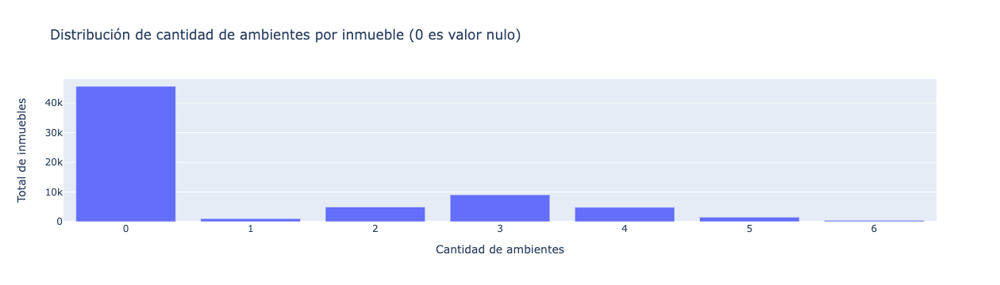

In [420]:
cantidad_rooms = data.pivot_table(index=["ambientes_regex"], values=['operation'], aggfunc=len) 
cantidad_rooms = cantidad_rooms.reset_index().rename(columns={'operation': 'Cantidad'})

fig = px.bar(cantidad_rooms, x="ambientes_regex", y="Cantidad",
             labels={'ambientes_regex':'Cantidad de ambientes', 'Cantidad':'Total de inmuebles'},
             title="Distribución de cantidad de ambientes por inmueble (0 es valor nulo)")

fig.show()

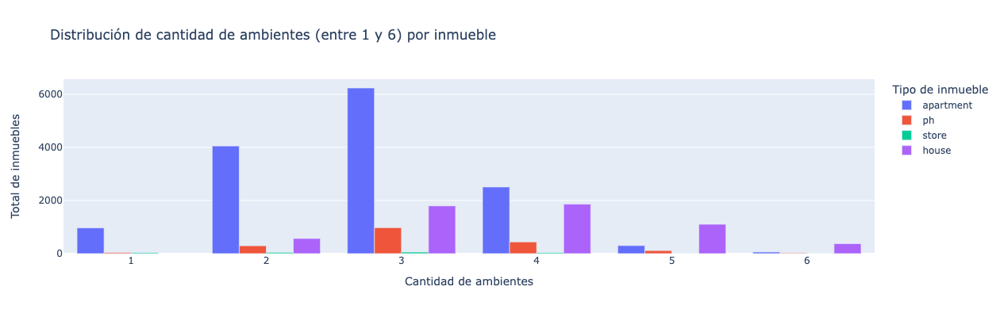

In [421]:
cantidad_rooms_property = data.pivot_table(index=["ambientes_regex","property_type"], values=['operation'], aggfunc=len) 
cantidad_rooms_property = cantidad_rooms_property.reset_index().rename(columns={'operation': 'Cantidad'})
cantidad_rooms_property_6 = cantidad_rooms_property[(cantidad_rooms_property["ambientes_regex"]!=0)] # saco los nulos

# ploty gráfico
fig = px.bar(cantidad_rooms_property_6, x="ambientes_regex", y="Cantidad",
             color='property_type', barmode='group',
             height=400,
             labels={'ambientes_regex':'Cantidad de ambientes', 'Cantidad':'Total de inmuebles', 'property_type':'Tipo de inmueble'},
             title="Distribución de cantidad de ambientes (entre 1 y 6) por inmueble")
fig.show()

Me falta ver cómo puedo imputar considerando estos datos

<a id="10"></a>
## 10) Construcción de otras variables que podrían influir en el valor de inmueble

[Ir a índice](#indice)

In [422]:
# por ahora es un string lo que va a ser regex
patron_parrilla = "(?P<parrilla>.?parrilla|asador)"
patron_cochera = '(?P<cochera>.?cochera)'
patron_pileta = '(?P<pileta>.?pileta|piscina)'
patron_sum = '(?P<sum>.?sum)'
patron_solarium = '(?P<sum>.?solárium|solarium)'
patron_gym = '(?P<gym>.?gimnasio|gym)'
patron_balcon = '(?P<balcon>.?balcon|balcón)'
patron_jardin = '(?P<jardin>.?jardín|jardin)'
patron_lavadero = '(?P<lavadero>.?laundry|loundry|lavadero)'
patron_aestrenar = '(?P<estrenar>.?estrenar)'
patron_quincho = '(?P<quincho>.?quincho)'
patron_patio = '(?P<patio>.?patio)'

In [423]:
# el compile lo que hace es pasarlo a formato pattern, objeto que detecta el patrón que le pido
regex_parrilla  = re.compile(patron_parrilla)
regex_cochera  = re.compile(patron_cochera)
regex_pileta  = re.compile(patron_pileta)
regex_solarium  = re.compile(patron_solarium)
regex_sum  = re.compile(patron_sum)
regex_gym  = re.compile(patron_gym)
regex_balcon  = re.compile(patron_balcon)
regex_jardin  = re.compile(patron_jardin)
regex_lavadero  = re.compile(patron_lavadero)
regex_aestrenar  = re.compile(patron_aestrenar)
regex_quincho  = re.compile(patron_quincho)
regex_patio  = re.compile(patron_patio)

In [424]:
# defino una función para generar columnas con las distintas características de inmuebles y contabilizarlas

def columna_regex(regex, nombre_de_nueva_columna):
    columna_regex = data.description.apply(lambda x: None if x is np.NaN else regex.search(x))
    data[nombre_de_nueva_columna] = columna_regex.apply(lambda x: 0 if x is None else 1)
    print('Esta es la cantidad neta: ')
    print(data[nombre_de_nueva_columna].value_counts())
    print('')
    print('Esta es la cantidad en %: ')
    print(data[nombre_de_nueva_columna].value_counts(normalize=True))
    return

#### 10.1) Parrilla

In [425]:
columna_regex(regex_parrilla, 'parrilla_regex')

Esta es la cantidad neta: 
0    44992
1    22505
Name: parrilla_regex, dtype: int64

Esta es la cantidad en %: 
0   0.667
1   0.333
Name: parrilla_regex, dtype: float64


#### 10.2) Cochera

In [426]:
columna_regex(regex_cochera, 'cochera_regex')

Esta es la cantidad neta: 
0    45677
1    21820
Name: cochera_regex, dtype: int64

Esta es la cantidad en %: 
0   0.677
1   0.323
Name: cochera_regex, dtype: float64


#### 10.3) Pileta

In [427]:
columna_regex(regex_pileta, 'pileta_regex')

Esta es la cantidad neta: 
0    49100
1    18397
Name: pileta_regex, dtype: int64

Esta es la cantidad en %: 
0   0.727
1   0.273
Name: pileta_regex, dtype: float64


#### 10.4) SUM

In [428]:
columna_regex(regex_sum, 'sum_regex')

Esta es la cantidad neta: 
0    61628
1     5869
Name: sum_regex, dtype: int64

Esta es la cantidad en %: 
0   0.913
1   0.087
Name: sum_regex, dtype: float64


#### 10.5) Solarium

In [429]:
columna_regex(regex_solarium, 'solarium_regex')

Esta es la cantidad neta: 
0    63705
1     3792
Name: solarium_regex, dtype: int64

Esta es la cantidad en %: 
0   0.944
1   0.056
Name: solarium_regex, dtype: float64


Desestimar dado que es demasiado bajo el porcentaje?

In [430]:
# data = data.drop(columns = ['solarium_regex'])

#### 10.5) Gym

In [431]:
columna_regex(regex_gym, 'gym_regex')

Esta es la cantidad neta: 
0    63712
1     3785
Name: gym_regex, dtype: int64

Esta es la cantidad en %: 
0   0.944
1   0.056
Name: gym_regex, dtype: float64


Desestimar dado que es demasiado bajo el porcentaje?

In [432]:
# data = data.drop(columns = ['gym_regex'])

#### 10.6) Balcón

In [433]:
columna_regex(regex_balcon, 'balcon_regex')

Esta es la cantidad neta: 
0    47445
1    20052
Name: balcon_regex, dtype: int64

Esta es la cantidad en %: 
0   0.703
1   0.297
Name: balcon_regex, dtype: float64


#### 10.7) Jardín

In [434]:
columna_regex(regex_jardin, 'jardin_regex')

Esta es la cantidad neta: 
0    55379
1    12118
Name: jardin_regex, dtype: int64

Esta es la cantidad en %: 
0   0.820
1   0.180
Name: jardin_regex, dtype: float64


#### 10.8) Lavadero

In [435]:
columna_regex(regex_lavadero, 'lavadero_regex')

Esta es la cantidad neta: 
0    38219
1    29278
Name: lavadero_regex, dtype: int64

Esta es la cantidad en %: 
0   0.566
1   0.434
Name: lavadero_regex, dtype: float64


#### 10.9) A estrenar

In [436]:
columna_regex(regex_aestrenar, 'estrenar_regex')

Esta es la cantidad neta: 
0    63048
1     4449
Name: estrenar_regex, dtype: int64

Esta es la cantidad en %: 
0   0.934
1   0.066
Name: estrenar_regex, dtype: float64


No sé si desestimarlo

#### 10.10) Quincho

In [437]:
columna_regex(regex_quincho, 'quincho_regex')

Esta es la cantidad neta: 
0    58207
1     9290
Name: quincho_regex, dtype: int64

Esta es la cantidad en %: 
0   0.862
1   0.138
Name: quincho_regex, dtype: float64


#### 10.11) Patio

In [438]:
columna_regex(regex_patio, 'patio_regex')

Esta es la cantidad neta: 
0    52451
1    15046
Name: patio_regex, dtype: int64

Esta es la cantidad en %: 
0   0.777
1   0.223
Name: patio_regex, dtype: float64


<a id="11"></a>
## 11) Limpieza y transformación de número de piso

[Ir a índice](#indice)

In [439]:
data.columns

Index(['operation', 'property_type', 'place_name', 'place_with_parent_names',
       'country_name', 'state_name', 'geonames_id', 'lat-lon', 'lat', 'lon',
       'price', 'currency', 'price_aprox_local_currency', 'price_aprox_usd',
       'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2',
       'price_per_m2', 'floor', 'expenses', 'properati_url', 'description',
       'title', 'image_thumbnail', 'PLACE NAME', 'SUPERFICIE CUBIERTA EN M2',
       'SUPERFICIE TOTAL EN M2', 'PRECIO USD POR M2', 'PRICE', 'CURRENCY',
       'PRECIO USD', 'TIPO DE PROPIEDAD', 'CANTIDAD', 'ZONAS COMUNALES',
       'ambientes_regex', 'parrilla_regex', 'cochera_regex', 'pileta_regex',
       'sum_regex', 'solarium_regex', 'gym_regex', 'balcon_regex',
       'jardin_regex', 'lavadero_regex', 'estrenar_regex', 'quincho_regex',
       'patio_regex'],
      dtype='object')

In [440]:
data.floor.value_counts()

1.000     1098
2.000      890
3.000      456
4.000      283
6.000      225
5.000      214
7.000      157
8.000      129
9.000       93
10.000      92
11.000      66
12.000      54
14.000      29
13.000      29
15.000      18
17.000      15
16.000      14
18.000      10
22.000       9
27.000       6
21.000       5
20.000       5
19.000       4
25.000       3
33.000       3
39.000       2
32.000       2
24.000       2
36.000       2
29.000       1
34.000       1
40.000       1
49.000       1
31.000       1
55.000       1
41.000       1
38.000       1
50.000       1
37.000       1
42.000       1
56.000       1
28.000       1
Name: floor, dtype: int64

In [441]:
data.floor.notnull().sum()/len(data.floor)

0.05819517904499459

In [442]:
data.floor.isnull().sum()

63569

Altísima cantidad de nulos.

In [443]:
# chequeo sample de los valores no nulos de "floor", a ver qué me dicen sus descripciones vs el dato en sí
floor_notnull = data[data.floor.notnull()].sample(5)
floor_notnull

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,parrilla_regex,cochera_regex,pileta_regex,sum_regex,solarium_regex,gym_regex,balcon_regex,jardin_regex,lavadero_regex,estrenar_regex,quincho_regex,patio_regex
45131,sell,apartment,barrionorte,|argentina|capitalfederal|barrionorte|,argentina,capitalfederal,3436109.000,"-34592945,-58408875",-34.593,-58.409,425000.000,usd,7498912.500,425000.000,NaN,185.000,NaN,2297.297,2.000,NaN,http://wwwproperaticomar/1939y_venta_departame...,corredorresponsable:pamelasuarez-cucicba5334co...,ventadepiso7ambientesaptoprofesional-baulera,https://thumbs4properaticom/5/jcm0ovl0bam9bo-z...,barrionorte,185.000,102.479,4147.193,425000.000,usd,425000.000,apartment,1.000,ZONA ESTE COMUNAL,0,0,0,0,0,0,0,1,0,1,0,0,0
49469,sell,house,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,"-315635082,-63535778",-31.564,-63.536,260000.000,usd,4587570.000,260000.000,NaN,NaN,NaN,NaN,3.000,NaN,http://wwwproperaticomar/19c82_venta_casa_cord...,casaenventade3dormencordoba,"jardínespinosa-casa3dor,quincho,c",https://thumbs4properaticom/6/k4q0r6dfmhb1igm7...,córdoba,NaN,NaN,NaN,260000.000,usd,260000.000,house,1.000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
59058,sell,apartment,caballito,|argentina|capitalfederal|caballito|,argentina,capitalfederal,3435874.000,"-34620807,-58440519",-34.621,-58.441,255000.000,usd,4499347.500,255000.000,NaN,149.000,NaN,1711.409,1.000,NaN,http://wwwproperaticomar/19wtq_venta_departame...,corredorresponsable:mauromarvisi-cucicba1762co...,4amb-cochera/baulera-opportunidad!,https://thumbs4properaticom/0/30r6efbr7jzesrba...,caballito,149.000,90.027,2832.471,255000.000,usd,255000.000,apartment,1.000,ZONA CENTRO COMUNAL,0,0,1,0,0,0,0,1,0,1,0,0,1
35049,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-345867328334,-584165580478",-34.587,-58.417,222000.000,usd,3917079.000,222000.000,NaN,93.000,NaN,2387.097,8.000,NaN,http://wwwproperaticomar/18dhv_venta_departame...,corredorresponsable:unobienesraicessrl-cucicba...,ventadedepartamento4ambientescondependencia,https://thumbs4properaticom/3/9c9aldp-aairv7x6...,palermo,93.000,96.203,2307.632,222000.000,usd,222000.000,apartment,1.000,ZONA NORTE COMUNAL,4,0,0,0,0,0,0,0,0,1,0,0,0
119454,sell,apartment,sanisidro,|argentina|bsasgbazonanorte|sanisidro|sanisidro|,argentina,bsasgbazonanorte,3428983.000,"-34467014,-58511229",-34.467,-58.511,145000.000,usd,2558452.500,145000.000,NaN,66.000,NaN,2196.970,2.000,NaN,http://wwwproperaticomar/1cgoe_venta_departame...,corredorresponsable:maximilianovazquez-csi5119...,muylindo3ambrecicladoconvistaalacatedral,https://thumbs4properaticom/4/9q6julucodu_bfrc...,sanisidro,66.000,NaN,NaN,145000.000,usd,145000.000,apartment,1.000,NaN,3,0,0,0,0,0,0,0,0,1,0,0,0


In [444]:
# veo los comentarios con todos sus caracteres
list(floor_notnull.description)

['corredorresponsable:pamelasuarez-cucicba5334contacto:vanesacolomer-mlsid#420281015-141ventadepisodecategoríaenbarrionorteaptoprofesionalpalierprivado,hallderecepción,livingíntimodegrandedimensiones,otrolugardeestaralqueselepuededardiferentesusos,importantecomedorcondoblecirculación,lindisimasaberturasdemaderadeexcelentecalidad,marcosanchos,todoslostechosaltosyconmolduraquerealzanlacategoríadecadaunodesusambientes,pisosderobleeslavonia,cocinamuycómodayampliacongrancapacidaddeguardado,barradesayunadora,lavaderoindependiente,muybuenadistribucióndelosambientescontriplecirculación,tresdormitoriosdebuenasdimensionesconinmejorablecapacidaddeguardado,dosbaños,toilette,habitacióndeservicioquepuedeutilizarsecomocuartodormitorio,escritorioíntimocondoblecirculación,balcóncorridoalpulmóndemanzanaentradadeservicio-bauleraenelsextopisoedificiodecategoría,contansoloochounidades,muybienmantenido,conentradademarmoltravertino,palierinterno,ubicadocategóricamenteadoscuadrasdeavsantafe,atrescuadrasdecoro

Después de correr varias veces el sample y comparar sus descripciones con el dato de floor, confirmo que, cuando figura, me indica el número de piso en el que se encuentra un depto.

In [445]:
# Ahora, podría confirmar si todos los inmuebles que tienen el dato de número de piso son departamentos
data[data.floor.notnull()].property_type.value_counts()

apartment    3075
house         582
ph            248
store          23
Name: property_type, dtype: int64

In [446]:
# chequeo sample de los valores no nulos de "floor" y house, a ver qué me dicen sus descripciones vs el dato en sí
floor_notnull_house = data[(data.floor.notnull()) & (data['property_type'] == 'house')].sample(5)
floor_notnull_house

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,parrilla_regex,cochera_regex,pileta_regex,sum_regex,solarium_regex,gym_regex,balcon_regex,jardin_regex,lavadero_regex,estrenar_regex,quincho_regex,patio_regex
47603,sell,house,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,"-314228315,-641277909",-31.423,-64.128,900000.000,usd,15880050.000,900000.000,NaN,NaN,NaN,NaN,2.000,NaN,http://wwwproperaticomar/198kh_venta_casa_cord...,casaenventade2dormencordoba,casaenventade2dormencordoba,https://thumbs4properaticom/5/shta4ipocyztjal2...,córdoba,NaN,NaN,NaN,900000.000,usd,900000.000,house,1.000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
13267,sell,house,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,"-314402666,-641378651",-31.440,-64.138,1600000.000,usd,28231200.000,1600000.000,NaN,187.000,NaN,8556.150,1.000,NaN,http://wwwproperaticomar/16ol3_venta_casa_cord...,casaenventade2dormencordoba,casaenventade2dormencordoba,https://thumbs4properaticom/6/ysioeltdi5acln6k...,córdoba,187.000,NaN,NaN,1600000.000,usd,1600000.000,house,1.000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
12956,sell,house,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,"-314241192,-641335644",-31.424,-64.134,1800000.000,usd,31760100.000,1800000.000,NaN,176.000,NaN,10227.273,1.000,NaN,http://wwwproperaticomar/16npg_venta_casa_cord...,casaenventade2dormencordoba,casaenventade2dormencordoba,https://thumbs4properaticom/6/xfcl3hkw53ugr_dx...,córdoba,176.000,NaN,NaN,1800000.000,usd,1800000.000,house,1.000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
19317,sell,house,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,"-314234207,-64151842",-31.423,-64.152,94000.000,usd,1658583.000,94000.000,NaN,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/179gm_venta_casa_cord...,casaenventade2dormencordoba,casaenventade2dormencordoba,https://thumbs4properaticom/2/c4uffyzrdcozbfrp...,córdoba,NaN,NaN,NaN,94000.000,usd,94000.000,house,1.000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
51269,sell,house,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,"-313874973,-641985968",-31.387,-64.199,2600000.000,usd,45875700.000,2600000.000,NaN,174.000,NaN,14942.529,1.000,NaN,http://wwwproperaticomar/19gh7_venta_casa_cord...,casaenventade3dormencordoba,ventadehermosayfuncionalcasaenb°s,https://thumbs4properaticom/9/ffmi4u6rphyo_7cr...,córdoba,174.000,NaN,NaN,2600000.000,usd,2600000.000,house,1.000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0


In [447]:
# veo los comentarios con todos sus caracteres
list(floor_notnull_house.description)

['casaenventade2dormencordoba',
 'casaenventade2dormencordoba',
 'casaenventade2dormencordoba',
 'casaenventade2dormencordoba',
 'casaenventade3dormencordoba']

Después de correr varias veces el sample y comparar sus descripciones con el dato de floor únicamente para cuando la propiedad es "house", parece ser que el dato no me indica nada fiable (a veces aparece piso 1, a veces aparece "2" y en la descripción dice "2 dormitorios", etc.).

In [448]:
patron_piso = "(?P<piso>\d?\d.?º?.?.?piso)"
regex_piso  = re.compile(patron_piso)

In [449]:
columna_regex(regex_piso, 'regex_piso')

Esta es la cantidad neta: 
0    61482
1     6015
Name: regex_piso, dtype: int64

Esta es la cantidad en %: 
0   0.911
1   0.089
Name: regex_piso, dtype: float64


In [450]:
aux_floor = data[(data.regex_piso == 1)].sample(5)
aux_floor

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,parrilla_regex,cochera_regex,pileta_regex,sum_regex,solarium_regex,gym_regex,balcon_regex,jardin_regex,lavadero_regex,estrenar_regex,quincho_regex,patio_regex,regex_piso
115449,sell,apartment,córdoba,|argentina|córdoba|córdoba|,argentina,córdoba,3860259.000,NaN,NaN,NaN,150000.000,usd,2646675.000,150000.000,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1cb77_venta_departame...,behminmobiliariapresentadepartamentoenventaene...,semipisobvlasherasylavalleja,https://thumbs4properaticom/5/aj9iskq1tx6znxke...,córdoba,NaN,NaN,NaN,150000.000,usd,150000.000,apartment,1.000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,1,1
118969,sell,ph,villaadelina,|argentina|bsasgbazonanorte|sanisidro|villaade...,argentina,bsasgbazonanorte,3427478.000,NaN,NaN,NaN,130000.000,usd,2293785.000,130000.000,95.000,90.000,1368.421,1444.444,NaN,NaN,http://wwwproperaticomar/1cg1w_venta_ph_villa-...,ventaph3ambientesenvillaadelinaexcelentephen1º...,ventaph3ambientesenvillaadelina,https://thumbs4properaticom/5/sv4rsvvc1w5gluwv...,villaadelina,90.000,95.000,1368.421,130000.000,usd,130000.000,ph,1.000,NaN,3,0,0,0,0,0,0,1,0,1,0,0,1,1
6802,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,NaN,NaN,NaN,270000.000,usd,4764015.000,270000.000,122.000,108.000,2213.115,2500.000,NaN,4637.000,http://wwwproperaticomar/15vqh_venta_departame...,departamentoenventa|belgrano-capitalfederal|5a...,departamentoenventa,https://thumbs4properaticom/1/wjnejksnij5_fxv0...,belgrano,108.000,122.000,2213.115,270000.000,usd,270000.000,apartment,1.000,ZONA NORTE COMUNAL,5,0,0,0,0,0,0,1,0,1,0,0,0,1
18944,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345620844,-584566864",-34.562,-58.457,119000.000,usd,2099695.500,119000.000,55.000,55.000,2163.636,2163.636,NaN,NaN,http://wwwproperaticomar/178d6_venta_departame...,excelentedepartamentode2ambientes1/2muyluminos...,"excelente2amb1/2totalmentereciclado,conbajasex...",https://thumbs4properaticom/3/bgu8-iurbzpg4fle...,belgrano,55.000,55.000,2163.636,119000.000,usd,119000.000,apartment,1.000,ZONA NORTE COMUNAL,2,0,0,0,0,0,0,0,0,0,0,0,0,1
20488,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-34568705,-5843231",-34.569,-58.432,440000.000,usd,7763580.000,440000.000,NaN,110.000,NaN,4000.000,NaN,NaN,http://wwwproperaticomar/17csm_venta_departame...,corredorresponsable:danielacosta-cucicba2406co...,"3amb,balcónaterrazadoconparrillacochera",https://thumbs4properaticom/9/xh7gv_wdirpqgazg...,palermo,110.000,96.203,4573.685,440000.000,usd,440000.000,apartment,1.000,ZONA NORTE COMUNAL,0,1,1,0,1,0,0,1,0,1,0,0,0,1


In [451]:
list(aux_floor.description)

['behminmobiliariapresentadepartamentoenventaenelbvlasherasesqlavalleja,a50mtsdecostaneraidealparaviviendafamiliaroparaoficinasconstrucciónenexcelenteestadodepartamentosituadaenun3pisoconascensor,de3dormitoriosyescritorioampliacocinacomedor,ampliolivingcomedor,consalidaapatio,3baños,delascualesunoensuite,dependeciadeservicio,244mtscubiertos,excelenteventilaciónyluminosidadvistafrenteycontrafrente-controldeaccesoporporteroeléctrico-unidadescondormitoriosconpisosdeparquetycortinadeenrollardemadera,placaresempotrados-cocinacomedorequipadoconmueblesbajomesadayalacenabañoscompletos,bañerasenlosadaspisosyrevestimientodecerámicos-instalacionesparaairesacondicionados,teléfono,televisiónascensorpuertasautomáticas-ingresodejerarquía,conrevestimientoenmadera,mármolyporcelanatocontacto:behmserviciosinmobiliarios12680',
 'ventaph3ambientesenvillaadelinaexcelentephen1ºpisoametrosdelaavparanalivingcomedorcocinaconmueblescompletosycomedordiariobañocompleto2dormitorioconplacardbalcóncorridopatiotechado

<h5>Entre los samples y probar distintos intentos de regex, no se llega a mejor cantidad de datos (con calidad). En las descripciones no parece ser habitual detallar esa característica (aunque los hay, no es significativa la cantidad). Por tal motivo, dropeamos la columna

In [452]:
data = data.drop(columns = ['floor', 'regex_piso'])
data.head(2)

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,parrilla_regex,cochera_regex,pileta_regex,sum_regex,solarium_regex,gym_regex,balcon_regex,jardin_regex,lavadero_regex,estrenar_regex,quincho_regex,patio_regex
1,sell,apartment,laplata,|argentina|bsasgbazonasur|laplata|,argentina,bsasgbazonasur,3432039.000,"-349038831,-579643295",-34.904,-57.964,150000.000,usd,2646675.000,150000.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/15bob_venta_departame...,"ventadedepartamentoendécimopisoalfrente,aestre...",ventadepto2dormaestrenar7e/36y37,https://thumbs4properaticom/7/ikpvbu2ztha7jv45...,laplata,NaN,NaN,NaN,150000.000,usd,150000.000,apartment,1.000,NaN,0,0,1,0,0,0,0,1,0,1,1,0,0
2,sell,apartment,mataderos,|argentina|capitalfederal|mataderos|,argentina,capitalfederal,3430787.000,"-346522615,-585229825",-34.652,-58.523,72000.000,usd,1270404.000,72000.000,55.000,55.000,1309.091,1309.091,NaN,http://wwwproperaticomar/15bod_venta_departame...,2ambientes3erpisolaterallivingcomedorampliococ...,2amb3erpisoconascensoraptocredito,https://thumbs4properaticom/5/sxkr34f_iwg3w_ej...,mataderos,55.000,55.000,1309.091,72000.000,usd,72000.000,apartment,1.000,ZONA OESTE COMUNAL,2,0,0,0,0,0,0,0,0,1,0,0,0


<a id="12"></a>
## 12) Creamos el dataframe de trabajo para nuestro modelo de regression lineal
[Ir a índice](#indice)

In [453]:
data_capital_lm = data[data.state_name=='capitalfederal']
data_capital_lm.isnull().sum()/data_capital_lm.shape[0]*100

operation                     0.000
property_type                 0.000
place_name                    0.000
place_with_parent_names       0.000
country_name                  0.000
state_name                    0.000
geonames_id                   4.654
lat-lon                      15.716
lat                          15.716
lon                          15.716
price                         6.920
currency                      6.920
price_aprox_local_currency    6.920
price_aprox_usd               6.920
surface_total_in_m2          22.169
surface_covered_in_m2        10.074
price_usd_per_m2             27.964
price_per_m2                 15.364
expenses                     75.350
properati_url                 0.000
description                   0.000
title                         0.000
image_thumbnail               0.000
PLACE NAME                    0.000
SUPERFICIE CUBIERTA EN M2    10.074
SUPERFICIE TOTAL EN M2        0.023
PRECIO USD POR M2             6.882
PRICE                       

Para no introducir cesgo a nuestra variable target, vamos a droppear ese 6,8% de nulos que nos quedaron, asi como tambien los nulos de PRICE Y SUPERFICIE TOTAL EN M2


Tambien vamos a hacer un filtrado de la Features que vamos a utilizar para predecir el PRECIO USD POR M2

In [454]:
data_capital_lm = data_capital_lm.dropna(axis=0,how='any',subset=['PRECIO USD POR M2', 'SUPERFICIE TOTAL EN M2','PRECIO USD'])
data_capital_lm = data_capital_lm.iloc[:,23:46]
data_capital_lm = data_capital_lm.drop(['SUPERFICIE CUBIERTA EN M2'],axis=1)
data_capital_lm = data_capital_lm.reset_index(drop=True)
data_capital_lm.isnull().sum()

PLACE NAME                0
SUPERFICIE TOTAL EN M2    0
PRECIO USD POR M2         0
PRICE                     0
CURRENCY                  0
PRECIO USD                0
TIPO DE PROPIEDAD         0
CANTIDAD                  0
ZONAS COMUNALES           0
ambientes_regex           0
parrilla_regex            0
cochera_regex             0
pileta_regex              0
sum_regex                 0
solarium_regex            0
gym_regex                 0
balcon_regex              0
jardin_regex              0
lavadero_regex            0
estrenar_regex            0
quincho_regex             0
patio_regex               0
dtype: int64

In [455]:
data_capital_lm.to_csv('Dataset_clean.csv')

<a id="13"></a>
## 13) Modelo de REGRESION LINEAL MULTIPLE
[Ir a índice](#indice)

In [456]:
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

## INICIALMENTE VAMOS A REALIZAR UN ESTUDIO DE LAS FEATURES CATEGORICAS

#### 1) PLACE NAME

In [ ]:
px.bar(data_capital_lm['PLACE NAME'].value_counts(), title='CANTIDAD DE PROPIEDADES POR BARRIO')

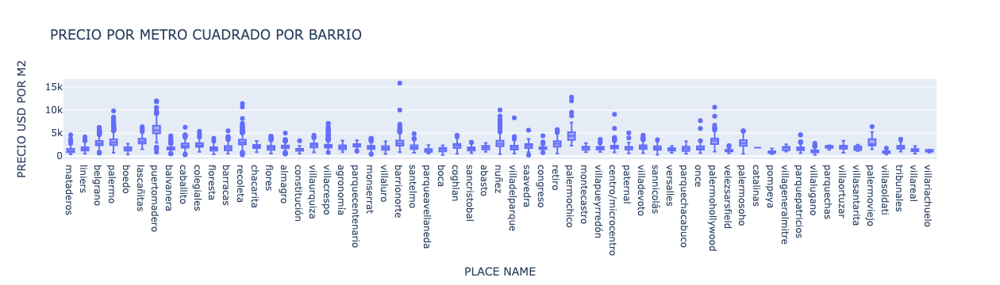

In [121]:
px.box(data_frame=data_capital_lm, x='PLACE NAME', y='PRECIO USD POR M2', title='PRECIO POR METRO CUADRADO POR BARRIO')

Podemos ver valores de precio usd por m2, bastante mayores al precio promedio del barrio, especialmente en chacarita y once

In [86]:
index_chacarita=data_capital_lm[data_capital_lm['PLACE NAME']=='chacarita'].sort_values('PRECIO USD POR M2', ascending=False)[:3].index
data_capital_lm[data_capital_lm['PLACE NAME']=='chacarita'].sort_values('PRECIO USD POR M2', ascending=False)[:3]
data_capital_lm=data_capital_lm.drop(index_chacarita[0])

In [87]:
index_once=data_capital_lm[data_capital_lm['PLACE NAME']=='once'].sort_values('PRECIO USD POR M2', ascending=False)[:3].index
data_capital_lm[data_capital_lm['PLACE NAME']=='once'].sort_values('PRECIO USD POR M2', ascending=False)[:3]
data_capital_lm=data_capital_lm.drop(index_once[0])

In [ ]:
px.box(data_frame=data_capital_lm, x='PLACE NAME', y='PRECIO USD POR M2', title='PRECIO POR METRO CUADRADO POR BARRIO')

#### 2) TIPO DE PROPIEDAD

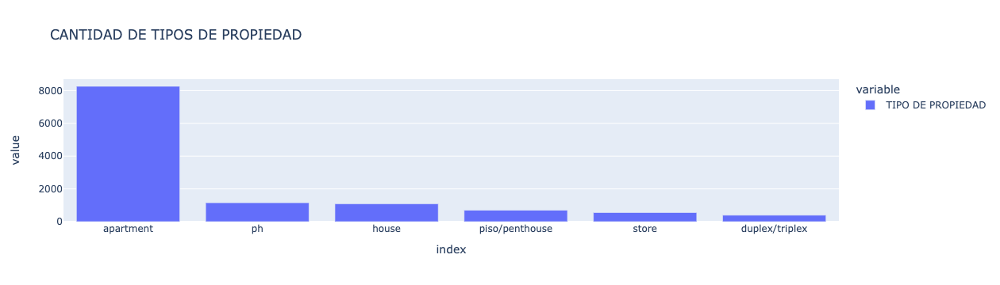

In [117]:
px.bar(data_capital_lm['TIPO DE PROPIEDAD'].value_counts(), title='CANTIDAD DE TIPOS DE PROPIEDAD')

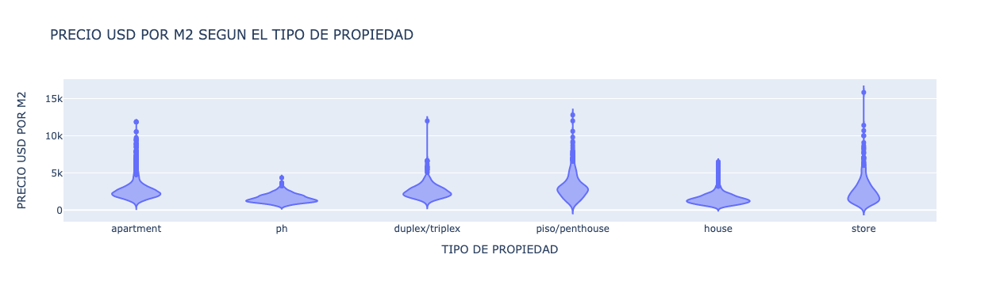

In [118]:
px.violin(data_frame = data_capital_lm, x='TIPO DE PROPIEDAD', y='PRECIO USD POR M2', title= "PRECIO USD POR M2 SEGUN EL TIPO DE PROPIEDAD")

#### 3) ZONAS COMUNALES

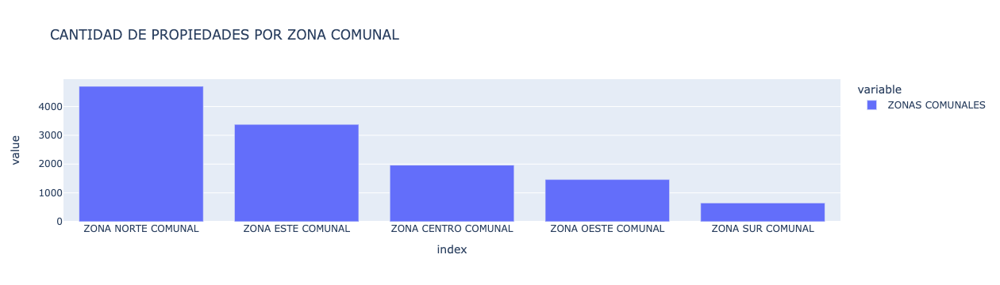

In [119]:
px.bar(data_capital_lm['ZONAS COMUNALES'].value_counts(), title = 'CANTIDAD DE PROPIEDADES POR ZONA COMUNAL')

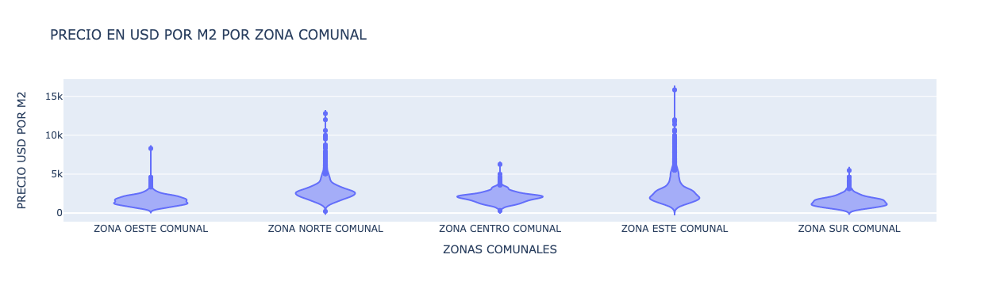

In [120]:
px.violin(data_frame = data_capital_lm, x='ZONAS COMUNALES', y='PRECIO USD POR M2', title='PRECIO EN USD POR M2 POR ZONA COMUNAL')

#### 

Ahora vamos a generar variables dummies, para las variables categoricas NOMINALES a partir de la funcion de pandas get_dummies:

   * PLACE NAME
    
   * TIPO DE PROPIEDAD
    
   * ZONAS COMUNALES

In [466]:
categoricas = data_capital_lm[['PLACE NAME', 'TIPO DE PROPIEDAD', 'ZONAS COMUNALES']]

features_categoricas_df = pd.get_dummies(categoricas, drop_first=True)


Juntamos las features dummies, con el dataset que estamos trabajando

In [467]:
data_capital_lm_con_cat = pd.concat([data_capital_lm,features_categoricas_df], axis=1)


In [468]:
data_capital_lm_con_cat.head(3)

,PLACE NAME,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,parrilla_regex,cochera_regex,pileta_regex,sum_regex,solarium_regex,gym_regex,balcon_regex,jardin_regex,lavadero_regex,estrenar_regex,quincho_regex,patio_regex,PLACE NAME_agronomía,PLACE NAME_almagro,PLACE NAME_balvanera,PLACE NAME_barracas,PLACE NAME_barrionorte,PLACE NAME_belgrano,PLACE NAME_boca,PLACE NAME_boedo,PLACE NAME_caballito,PLACE NAME_catalinas,PLACE NAME_centro/microcentro,PLACE NAME_chacarita,PLACE NAME_coghlan,PLACE NAME_colegiales,PLACE NAME_congreso,PLACE NAME_constitución,PLACE NAME_flores,PLACE NAME_floresta,PLACE NAME_lascañitas,PLACE NAME_liniers,PLACE NAME_mataderos,PLACE NAME_monserrat,PLACE NAME_montecastro,PLACE NAME_nuñez,PLACE NAME_once,PLACE NAME_palermo,PLACE NAME_palermochico,PLACE NAME_palermohollywood,PLACE NAME_palermosoho,PLACE NAME_palermoviejo,PLACE NAME_parqueavellaneda,PLACE NAME_parquecentenario,PLACE NAME_parquechacabuco,PLACE NAME_parquechas,PLACE NAME_parquepatricios,PLACE NAME_paternal,PLACE NAME_pompeya,PLACE NAME_puertomadero,PLACE NAME_recoleta,PLACE NAME_retiro,PLACE NAME_saavedra,PLACE NAME_sancristobal,PLACE NAME_sannicolás,PLACE NAME_santelmo,PLACE NAME_tribunales,PLACE NAME_velezsarsfield,PLACE NAME_versalles,PLACE NAME_villacrespo,PLACE NAME_villadelparque,PLACE NAME_villadevoto,PLACE NAME_villageneralmitre,PLACE NAME_villalugano,PLACE NAME_villaluro,PLACE NAME_villaortuzar,PLACE NAME_villapueyrredón,PLACE NAME_villareal,PLACE NAME_villariachuelo,PLACE NAME_villasantarita,PLACE NAME_villasoldati,PLACE NAME_villaurquiza,TIPO DE PROPIEDAD_duplex/triplex,TIPO DE PROPIEDAD_house,TIPO DE PROPIEDAD_ph,TIPO DE PROPIEDAD_piso/penthouse,TIPO DE PROPIEDAD_store,ZONAS COMUNALES_ZONA ESTE COMUNAL,ZONAS COMUNALES_ZONA NORTE COMUNAL,ZONAS COMUNALES_ZONA OESTE COMUNAL,ZONAS COMUNALES_ZONA SUR COMUNAL
0,mataderos,55.000,1309.091,72000.000,usd,72000.000,apartment,1.000,ZONA OESTE COMUNAL,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,liniers,124.833,761.015,95000.000,usd,95000.000,ph,1.000,ZONA OESTE COMUNAL,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,belgrano,65.000,3000.000,195000.000,usd,195000.000,apartment,1.000,ZONA NORTE COMUNAL,2,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


Ahora separamos las Features explicativas, de la variable Target (PRECIO USD POR M2) y creamos los sets de entrenamiento y testeo

In [469]:
X = data_capital_lm_con_cat.drop(['PRECIO USD','PRICE','PRECIO USD POR M2','PRECIO USD','PLACE NAME','CURRENCY','TIPO DE PROPIEDAD','ZONAS COMUNALES'], axis=1)
y = data_capital_lm_con_cat['PRECIO USD POR M2']

# Divido el set en test y entrenamiento
X_train,X_test,y_train,y_test = train_test_split(X, y, random_state=1)

# Vamos a instanciar nuestro modelo de regression lineal
lm = linear_model.LinearRegression()
# Vamos a entrenar nuestro modelo con los datos de train
model_1 = lm.fit(X_train, y_train)
# Vamos a ver que r2 tiene
r2_score_1 = model_1.score(X_test,y_test)
r2_score_1

0.5927692723178108

In [470]:
r2_score_set_entrenamiento_1 = model_1.score(X_train,y_train)
r2_score_set_entrenamiento_1

0.5881655755500074

In [471]:
# Imprimimos el intercepto de nuestro modelo
model_1.intercept_

2189.2877916023053

In [472]:
# Imprimimos los valores de los coeficientes de cada Feature de nuestro modelo
model_1.coef_

array([-2.78323992e+00, -3.39355211e-11, -2.15585200e+01, -7.86907039e+00,
        3.88804982e+02,  2.59619284e+02,  1.21924391e+01, -5.51036454e+01,
        4.07032497e+02, -3.44821533e-02,  8.78626964e+01,  1.72856820e+01,
        8.17921880e+01,  9.97010784e+01, -2.15402695e+02, -5.08157756e+02,
        1.17460927e+02, -1.28214553e+02,  2.10208957e+02,  9.41554640e+02,
        2.94736134e+02, -7.05977127e+01, -2.62929949e+02,  2.90022469e+02,
        5.55974010e+02,  3.14196664e+02, -4.49135638e+02, -3.67133459e+02,
       -1.38316578e+02, -1.36830837e+01, -3.57972526e+02, -1.52646432e+02,
       -9.94100678e+01,  7.12773187e+02, -8.60911567e+01, -2.50923092e+02,
       -2.27781892e+00,  1.36882113e+02,  3.30590483e+02,  8.95478763e+01,
        4.99885991e+02,  1.89473842e+03,  6.53338192e+02,  3.99276854e+02,
        4.25319100e+02, -3.86261015e+02,  3.31013277e+02, -2.17987930e+02,
       -5.88221531e+02,  1.39053685e+02, -6.27616550e+02, -3.51663695e+02,
        3.33084900e+03,  

## VAMOS A HACER UN ANALISIS CON STATSMODELS DE LAS VARIABLES EXPLICATIVAS

In [39]:
import statsmodels.api as sm

X_train_sm = sm.add_constant(X_train)

model = sm.OLS(y_train, X_train_sm).fit()

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      PRECIO USD POR M2   R-squared:                       0.588
Model:                            OLS   Adj. R-squared:                  0.585
Method:                 Least Squares   F-statistic:                     163.4
Date:                Thu, 28 Oct 2021   Prob (F-statistic):               0.00
Time:                        09:56:05   Log-Likelihood:                -73723.
No. Observations:                9121   AIC:                         1.476e+05
Df Residuals:                    9041   BIC:                         1.482e+05
Df Model:                          79                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                               1985.9634     33.762     58.823      0.000    1919.783    2052.144
SUPERFICIE TOTAL EN M2                -2.7832      0.140    -19.906      0.000      -3.057      -2.509
ambientes_regex                      -21.5585      5.087     -4.238      0.000     -31.530     -11.587
parrilla_regex                        -7.8691     24.144     -0.326      0.744     -55.197      39.459
cochera_regex                        388.8050     19.994     19.446      0.000     349.612     427.998
pileta_regex                         259.6193     33.100      7.843      0.000     194.735     324.503
sum_regex                             12.1924     29.840      0.409      0.683     -46.300      70.685
solarium_regex                       -55.1036     38.063     -1.448      0.148    -129.717      19.509
gym_regex                            407.0325     40.238     10.116      0.000     328.157     485.908
balcon_regex                          -0.0345     18.715     -0.002      0.999     -36.720      36.651
jardin_regex                          87.8627     32.427      2.710      0.007      24.298     151.428
lavadero_regex                        17.2857     17.919      0.965      0.335     -17.839      52.410
estrenar_regex                        81.7922     35.724      2.290      0.022      11.764     151.820
quincho_regex                         99.7011     41.036      2.430      0.015      19.260     180.142
patio_regex                         -215.4027     23.446     -9.187      0.000    -261.361    -169.444
PLACE NAME_agronomía                -497.9915    201.495     -2.471      0.013    -892.967    -103.016
PLACE NAME_almagro                   320.7854     48.646      6.594      0.000     225.428     416.143
PLACE NAME_balvanera                -128.2146    157.309     -0.815      0.415    -436.575     180.146
PLACE NAME_barracas                  232.8006    118.214      1.969      0.049       1.075     464.527
PLACE NAME_barrionorte               941.5546    153.677      6.127      0.000     640.313    1242.796
PLACE NAME_belgrano                  304.9024     37.499      8.131      0.000     231.395     378.409
PLACE NAME_boca                      -48.0061    134.437     -0.357      0.721    -311.533     215.520
PLACE NAME_boedo                     -59.6055     88.822     -0.671      0.502    -233.717     114.506
PLACE NAME_caballito                 493.3469     40.411     12.208      0.000     414.133     572.561
PLACE NAME_catalinas                 578.5656    702.519      0.824      0.410    -798.530    1955.662
PLACE NAME_centro/microcentro        314.1967    178.895      1.756      0.079     -36.477     664.870
PLACE NAME_chacarita                -438.9694    118.738     -3.697      0.000    -671.723    -2

##### **Con statsmodel, podemos hacer un analisis mas detallado del aporte de cada feature al modelo, y podemos distinguir aquellas que son estadisticamente significativas, de las que no. Aquellas con un p-value(P>|t|) > 0.05, no pueden asegurar una relacion con la variable target (PRECIO USD POR M2), ya que no rechazan la hipotesis nula y es posible que su asociacion con la variable target, sea simplemente consecuencia del azar.**

#### **Por lo tanto, features como por ejemplo lavadero_regex,  parrilla_regex, PLACE NAME_villareal, etc desde el punto de vista del análisis estadístico y de la explicación de la influencia de cada parámetro, no podemos asegurar, con una confianza del 95%, que la 'influencia' que ese parámetro tiene en el target sea la que dice el beta correspondiente. Esto es así, porque al no poder rechazar la hipótesis nula implica que no podés asegurar que ese valor encontrado no tenga una influencia aleatoria que lo haga estadísticamente no significativo, dentro del intervalo de confianza propuesto. Aun asi, cabe destacar, que a los fines predictivos, podemos usar todas las variables, en la medida en que nos ayuden a mejorar el R2.**

## VAMOS AHORA A INTENTAR MEJORAR EL MODELO

In [473]:
from sklearn.preprocessing import PolynomialFeatures

In [474]:
poly = PolynomialFeatures()
X_poly = poly.fit_transform(X)

X_train_poly,X_test_poly, y_train_poly, y_test_poly = train_test_split(X_poly, y, random_state = 1)

model_2 = lm.fit(X_train_poly, y_train_poly)

r2_score_2_test = model_2.score(X_test_poly, y_test_poly)
r2_score_2_train = model_2.score(X_train_poly, y_train_poly)

print('El valor del R2 para test es: ', r2_score_2_test)
print('El valor del R2 para train es: ', r2_score_2_train)

El valor del R2 para test es:  -34804.409965078994
El valor del R2 para train es:  0.6884653492483666


Podemos ver que nos devuelve un valor de r2 negativo, o sea que generaliza peor que la media. Estamos cometiendo un error de Overfitting, ya que generaliza con un r2 muy alto para el set de train, pero un r2 incluso peor que la media para el set de testeo.

Vamos a intentar mejorar esto aplicando tecnicas de REGULARIZACION

## REGULARIZACION

### ESTANDARIZAMOS NUESTRAS FEATURES

In [475]:
from sklearn.preprocessing import StandardScaler

In [476]:
scaler = StandardScaler().fit(X_train_poly)
X_train_standarized = scaler.transform(X_train_poly)
X_test_standarized = scaler.transform(X_test_poly)

### REGULARIZACION RIDGE

In [477]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5,shuffle=True, random_state=1)

In [478]:
lm_ridge = linear_model.RidgeCV(alphas=np.linspace(10,200,10), cv=kf)

model_3 = lm_ridge.fit(X_train_standarized, y_train_poly)
r2_score_3_test = model_3.score(X_test_standarized, y_test_poly)
r2_score_3_test

0.618754813386533

In [479]:
# Podemos observar que aprendio bien de los datos de entrenamiento, pero no overfittea
r2_score_3_train = model_3.score(X_train_standarized, y_train_poly)
r2_score_3_train

0.685437148953389

In [480]:
model_3.alpha_

200.0

### REGULARIZACION LASSO

In [481]:
lm_lasso = linear_model.LassoCV(alphas=[0.05, 0.1, 1, 5, 10, 15, 25], cv=kf, max_iter=100000)
model_4 = lm_lasso.fit(X_train_standarized, y_train_poly)
r2_score_4_test = model_4.score(X_test_standarized, y_test_poly)
r2_score_4_test

0.6334039625818468

In [482]:
r2_score_4_train = model_4.score(X_train_standarized, y_train_poly)
r2_score_4_train

0.6639777130224174

In [483]:
model_4.alpha_

5.0

### REGULARIZACION ELASTICNET

In [484]:
for x in np.arange(0.1,1,0.4):
    lm_elasticnet = linear_model.ElasticNetCV(l1_ratio=x, cv=kf, max_iter=10000)
    model_5 = lm_elasticnet.fit(X_train_standarized, y_train_poly)
    r2_score_5_test=model_5.score(X_test_standarized, y_test_poly)
    r2_score_5_train=model_5.score(X_train_standarized, y_train_poly)
    print('R2_score',r2_score_5_test.round(3),'ElasticNet con L1_ratio de ',x)
    print('ALPHA =',model_5.alpha_)

R2_score 0.51 ElasticNet con L1_ratio de  0.1
ALPHA = 5.52975651324215
R2_score 0.6 ElasticNet con L1_ratio de  0.5
ALPHA = 1.10595130264843
R2_score 0.614 ElasticNet con L1_ratio de  0.9
ALPHA = 2.3132420332832484


**Por lo tanto el mejor Ratio es L1_ratio=0.9, que seria una Regression con mucho mayor aporte de la penalizacion Lasso, que Ridge**

¿Cómo son las performances entre los modelos regularizados y no regularizado? 

In [485]:
print ('El modelo sin regularizar, utilizando todas las features, ya codificadas: R2=' ,r2_score_1)
print()
print ('Al querer complejizar el modelo para aumentar su R2, haciendo feature engineering a partir de operaciones y combinaciones de las features, generadas a partir de la funcion "PolynomialFeatures()",observamos un pesimo R2 =' ,r2_score_2_test)
print('Teniendo en cuenta que el R2 del set de entrenamiento tiene un valor R2=',r2_score_2_train,', Si bien no es tan alto, podemos entender que estamos cometiendo error de OVERFITTING en el modelo')
print()
print('Aplicando REGULARIZACION, obtenemos un R2_Ridge = ',r2_score_3_test)
print()
print('Confirmando que no tenemos overfitting, dado que R2_train =',r2_score_3_train)
print()
print('Aplicando REGULARIZACION, obtenemos un R2_Lasso = ',r2_score_4_test)
print()
print('Confirmando que no tenemos overfitting, dado que R2_train =',r2_score_4_train)
print()
print('Aplicando REGULARIZACION, obtenemos un R2_ElasticNet = ',r2_score_5_test)
print()
print('Confirmando que no tenemos overfitting, dado que R2_train =',r2_score_5_train)

El modelo sin regularizar, utilizando todas las features, ya codificadas: R2= 0.5927692723178108

Al querer complejizar el modelo para aumentar su R2, haciendo feature engineering a partir de operaciones y combinaciones de las features, generadas a partir de la funcion "PolynomialFeatures()",observamos un pesimo R2 = -34804.409965078994
Teniendo en cuenta que el R2 del set de entrenamiento tiene un valor R2= 0.6884653492483666 , Si bien no es tan alto, podemos entender que estamos cometiendo error de OVERFITTING en el modelo

Aplicando REGULARIZACION, obtenemos un R2_Ridge =  0.618754813386533

Confirmando que no tenemos overfitting, dado que R2_train = 0.685437148953389

Aplicando REGULARIZACION, obtenemos un R2_Lasso =  0.6334039625818468

Confirmando que no tenemos overfitting, dado que R2_train = 0.6639777130224174

Aplicando REGULARIZACION, obtenemos un R2_ElasticNet =  0.6138753134355701

Confirmando que no tenemos overfitting, dado que R2_train = 0.6567209867867085


## CUESTIONARIO

1) ¿Cuál funciona mejor? 


Si bien la Regression Ridge y Lasso, dan R2_score muy similares, la que mejor funciona es la Regularizacion Lasso, al modelo que previamente se le aplico feature engineering y estandarizacion.

2) ¿Qué hace una regresión Ridge? 

La regresion Ridge, busca sacrificar un poco de cesgo de nuestro modelo, con el fin de reducir la variabilidad de los datos predichos, agregando a la funcion de costo de la regresion lineal (minimos cuadrados), un termino de penalizacion, cuya intensidad depende del valor de una constante ALPHA. Este ALPHA multiplica a la suma de los coeficientes Betas de cada feature elevados al cuadrado (NORMALIZACION L2), sin incluir el parametro del intercepto del modelo

3) ¿Y una LASSO? 

Es muy similar a la Regresion Ridge, con la salvedad que la LASSO, logra llevar a 0 parametros Beta, que no tengan relacion con la variable target, cuando el valor de ALPHA es muy grande. En el caso de la regresion Ridge, esto no se consigue, sin importar que tan grande sea ALPHA. En el caso donde tengamos Features que esten muy correlacionadas, la Regresion Lasso, escogera una de ellas, y a las demas las hara valer 0, mientras que la Regression Ridge, distribuira la penalizacion de los Betas, equitativamente entre ellas, pero nunca eliminara ninguna. Ademas, en el caso de la regresion LASSO, el parametro ALPHA de penalizacion, multiplica a la suma del valor absoluto de los coeficientes Beta de cada feature, sin incluir el parametro del intercepto del modelo.


4) ¿Qué diferencias hay con la regresión lineal sin regularizar?

Si el valor del parametro penalizador "ALPHA", fuera 0, el modelo es el mismo que sin regularizar. La regression Lineal busca minimizar el valor de los residuos del modelo, en cambio al regularizar, le sumamos un nuevo termino, que se compone del parametro ALPHA, multiplicado por la suma de los betas al cuadro o aplicandole el modulo a los mismos, dependiendo el tipo de regularizacion.

### Seleccionar mediante muestreo aleatorio simple una submuestra de 100 propiedades.

In [486]:
data_capital_100 = data_capital_lm_con_cat.sample(100, random_state=1)
data_capital_100.head(3)

,PLACE NAME,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,parrilla_regex,cochera_regex,pileta_regex,sum_regex,solarium_regex,gym_regex,balcon_regex,jardin_regex,lavadero_regex,estrenar_regex,quincho_regex,patio_regex,PLACE NAME_agronomía,PLACE NAME_almagro,PLACE NAME_balvanera,PLACE NAME_barracas,PLACE NAME_barrionorte,PLACE NAME_belgrano,PLACE NAME_boca,PLACE NAME_boedo,PLACE NAME_caballito,PLACE NAME_catalinas,PLACE NAME_centro/microcentro,PLACE NAME_chacarita,PLACE NAME_coghlan,PLACE NAME_colegiales,PLACE NAME_congreso,PLACE NAME_constitución,PLACE NAME_flores,PLACE NAME_floresta,PLACE NAME_lascañitas,PLACE NAME_liniers,PLACE NAME_mataderos,PLACE NAME_monserrat,PLACE NAME_montecastro,PLACE NAME_nuñez,PLACE NAME_once,PLACE NAME_palermo,PLACE NAME_palermochico,PLACE NAME_palermohollywood,PLACE NAME_palermosoho,PLACE NAME_palermoviejo,PLACE NAME_parqueavellaneda,PLACE NAME_parquecentenario,PLACE NAME_parquechacabuco,PLACE NAME_parquechas,PLACE NAME_parquepatricios,PLACE NAME_paternal,PLACE NAME_pompeya,PLACE NAME_puertomadero,PLACE NAME_recoleta,PLACE NAME_retiro,PLACE NAME_saavedra,PLACE NAME_sancristobal,PLACE NAME_sannicolás,PLACE NAME_santelmo,PLACE NAME_tribunales,PLACE NAME_velezsarsfield,PLACE NAME_versalles,PLACE NAME_villacrespo,PLACE NAME_villadelparque,PLACE NAME_villadevoto,PLACE NAME_villageneralmitre,PLACE NAME_villalugano,PLACE NAME_villaluro,PLACE NAME_villaortuzar,PLACE NAME_villapueyrredón,PLACE NAME_villareal,PLACE NAME_villariachuelo,PLACE NAME_villasantarita,PLACE NAME_villasoldati,PLACE NAME_villaurquiza,TIPO DE PROPIEDAD_duplex/triplex,TIPO DE PROPIEDAD_house,TIPO DE PROPIEDAD_ph,TIPO DE PROPIEDAD_piso/penthouse,TIPO DE PROPIEDAD_store,ZONAS COMUNALES_ZONA ESTE COMUNAL,ZONAS COMUNALES_ZONA NORTE COMUNAL,ZONAS COMUNALES_ZONA OESTE COMUNAL,ZONAS COMUNALES_ZONA SUR COMUNAL
4404,balvanera,83.650,2510.454,210000.000,usd,210000.000,apartment,1.000,ZONA ESTE COMUNAL,4,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2978,parquepatricios,75.644,1388.073,105000.000,usd,105000.000,apartment,1.000,ZONA SUR COMUNAL,3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4089,barrionorte,94.000,2978.723,280000.000,usd,280000.000,apartment,1.000,ZONA ESTE COMUNAL,4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [487]:
## Ahora de esta muestra, filtramos los departamentos
data_capital_100_depto = data_capital_100[data_capital_100['TIPO DE PROPIEDAD']=='apartment']
data_capital_100_depto_clean = data_capital_100_depto.drop(['PRECIO USD','PRICE','PRECIO USD POR M2','PRECIO USD','PLACE NAME','CURRENCY','TIPO DE PROPIEDAD','ZONAS COMUNALES'], axis=1)

In [488]:
X_poly_100 = poly.transform(data_capital_100_depto_clean)
X_poly_100_std = scaler.transform(X_poly_100)

In [489]:
PRECIO_USD_POR_M2_predicho = model_4.predict(X_poly_100_std)
PRECIO_USD_POR_M2_predicho

array([1658.99810795, 1678.25985396, 2598.43294404, 2491.73879558,
       1938.82288931, 5655.20604362, 2112.67345308, 2784.47752984,
       2300.61862787, 2060.87188865, 1887.95436791, 2765.55647349,
       1730.84817339, 5484.57253582, 3212.04801169, 3317.6021766 ,
       2335.03968998, 3313.72872075, 2177.97717546, 1718.86306837,
       1799.45031913, 1898.38390986, 2105.62316467, 2208.66824033,
       2352.84140811, 3944.52504258, 3004.99835066, 2065.04411069,
       3795.96591505, 2125.3807786 , 1747.31756491, 3533.11097406,
       2763.11244359, 3773.67741108, 1684.10157803, 2803.65477839,
       2974.72435961, 3739.46455359, 2131.63818082, 2872.39049415,
       2761.70340837, 2049.99099057, 5717.66845736, 2058.9086572 ,
       2038.51288144, 3363.29343002, 3590.06609098, 6005.0478192 ,
       2426.03113355, 3067.77770616, 2928.30523911, 4033.5516752 ,
       2015.6602775 , 2035.85832183, 2575.2484386 , 2016.49418117,
       2044.05334982, 2008.65280953, 2888.07686775, 3510.39432

In [490]:
data_capital_100_depto['PRECIO USD POR M2 PREDICHO'] = PRECIO_USD_POR_M2_predicho
data_capital_100_depto['RESIDUO'] = data_capital_100_depto['PRECIO USD POR M2 PREDICHO'] - data_capital_100_depto['PRECIO USD POR M2'] 
data_capital_100_depto['GANANCIA'] = data_capital_100_depto['RESIDUO']*data_capital_100_depto['SUPERFICIE TOTAL EN M2']
data_capital_100_depto.head()

<ipython-input-490-621d97e0f4f3>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-490-621d97e0f4f3>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-490-621d97e0f4f3>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,PLACE NAME,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,parrilla_regex,cochera_regex,pileta_regex,sum_regex,solarium_regex,gym_regex,balcon_regex,jardin_regex,lavadero_regex,estrenar_regex,quincho_regex,patio_regex,PLACE NAME_agronomía,PLACE NAME_almagro,PLACE NAME_balvanera,PLACE NAME_barracas,PLACE NAME_barrionorte,PLACE NAME_belgrano,PLACE NAME_boca,PLACE NAME_boedo,PLACE NAME_caballito,PLACE NAME_catalinas,PLACE NAME_centro/microcentro,PLACE NAME_chacarita,PLACE NAME_coghlan,PLACE NAME_colegiales,PLACE NAME_congreso,PLACE NAME_constitución,PLACE NAME_flores,PLACE NAME_floresta,PLACE NAME_lascañitas,PLACE NAME_liniers,PLACE NAME_mataderos,PLACE NAME_monserrat,PLACE NAME_montecastro,PLACE NAME_nuñez,PLACE NAME_once,PLACE NAME_palermo,PLACE NAME_palermochico,PLACE NAME_palermohollywood,PLACE NAME_palermosoho,PLACE NAME_palermoviejo,PLACE NAME_parqueavellaneda,PLACE NAME_parquecentenario,PLACE NAME_parquechacabuco,PLACE NAME_parquechas,PLACE NAME_parquepatricios,PLACE NAME_paternal,PLACE NAME_pompeya,PLACE NAME_puertomadero,PLACE NAME_recoleta,PLACE NAME_retiro,PLACE NAME_saavedra,PLACE NAME_sancristobal,PLACE NAME_sannicolás,PLACE NAME_santelmo,PLACE NAME_tribunales,PLACE NAME_velezsarsfield,PLACE NAME_versalles,PLACE NAME_villacrespo,PLACE NAME_villadelparque,PLACE NAME_villadevoto,PLACE NAME_villageneralmitre,PLACE NAME_villalugano,PLACE NAME_villaluro,PLACE NAME_villaortuzar,PLACE NAME_villapueyrredón,PLACE NAME_villareal,PLACE NAME_villariachuelo,PLACE NAME_villasantarita,PLACE NAME_villasoldati,PLACE NAME_villaurquiza,TIPO DE PROPIEDAD_duplex/triplex,TIPO DE PROPIEDAD_house,TIPO DE PROPIEDAD_ph,TIPO DE PROPIEDAD_piso/penthouse,TIPO DE PROPIEDAD_store,ZONAS COMUNALES_ZONA ESTE COMUNAL,ZONAS COMUNALES_ZONA NORTE COMUNAL,ZONAS COMUNALES_ZONA OESTE COMUNAL,ZONAS COMUNALES_ZONA SUR COMUNAL,PRECIO USD POR M2 PREDICHO,RESIDUO,GANANCIA
4404,balvanera,83.650,2510.454,210000.000,usd,210000.000,apartment,1.000,ZONA ESTE COMUNAL,4,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1658.998,-851.455,-71224.436
2978,parquepatricios,75.644,1388.073,105000.000,usd,105000.000,apartment,1.000,ZONA SUR COMUNAL,3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1678.260,290.187,21951.034
4089,barrionorte,94.000,2978.723,280000.000,usd,280000.000,apartment,1.000,ZONA ESTE COMUNAL,4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2598.433,-380.290,-35747.303
12109,barrionorte,102.479,1170.972,120000.000,usd,120000.000,apartment,1.000,ZONA ESTE COMUNAL,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2491.739,1320.767,135350.795
6965,floresta,75.797,1385.286,105000.000,usd,105000.000,apartment,1.000,ZONA OESTE COMUNAL,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1938.823,553.537,41956.203


## Teniendo en cuenta que podría comprar y vender propiedades al precio de mercado (omitamos costos de transacción), ¿cuál/es de las propiedades de su portfolio representan una buena oportunidad para comprar y luego vender a un mejor precio? 

In [39]:
dptos_subvaluados_OPORTUNIDAD_COMPRA = data_capital_100_depto[data_capital_100_depto['RESIDUO'] > 0]
dptos_subvaluados_OPORTUNIDAD_COMPRA.sort_values('RESIDUO', ascending = False).head()

,PLACE NAME,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,...,TIPO DE PROPIEDAD_ph,TIPO DE PROPIEDAD_piso/penthouse,TIPO DE PROPIEDAD_store,ZONAS COMUNALES_ZONA ESTE COMUNAL,ZONAS COMUNALES_ZONA NORTE COMUNAL,ZONAS COMUNALES_ZONA OESTE COMUNAL,ZONAS COMUNALES_ZONA SUR COMUNAL,PRECIO USD POR M2 PREDICHO,RESIDUO,GANANCIA
10708,retiro,95.000000,1121.673474,1900000.0,ars,106558.98,apartment,1.0,ZONA ESTE COMUNAL,0,...,0,0,0,1,0,0,0,3313.728721,2192.055247,208245.248471
2246,puertomadero,109.000000,3669.724771,400000.0,usd,400000.00,apartment,1.0,ZONA ESTE COMUNAL,0,...,0,0,0,1,0,0,0,5655.206044,1985.481273,216417.458755
4105,palermo,96.202516,1871.052941,180000.0,usd,180000.00,apartment,1.0,ZONA NORTE COMUNAL,0,...,0,0,0,0,1,0,0,3533.110974,1662.058033,159894.164034
12109,barrionorte,102.478958,1170.972095,120000.0,usd,120000.00,apartment,1.0,ZONA ESTE COMUNAL,3,...,0,0,0,1,0,0,0,2491.738796,1320.766701,135350.795169
3494,nuñez,84.232558,2730.535616,230000.0,usd,230000.00,apartment,1.0,ZONA NORTE COMUNAL,2,...,0,0,0,0,1,0,0,3795.965915,1065.430299,89743.919635


In [46]:
data_capital_lm.loc[[10708,2246]]

,PLACE NAME,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,CANTIDAD,ZONAS COMUNALES,ambientes_regex,parrilla_regex,cochera_regex,pileta_regex,sum_regex,solarium_regex,gym_regex,balcon_regex,jardin_regex,lavadero_regex,estrenar_regex,quincho_regex,patio_regex
10708,retiro,95.0,1121.673474,1900000.0,ars,106558.98,apartment,1.0,ZONA ESTE COMUNAL,0,0,1,0,1,0,0,1,0,0,0,0,0
2246,puertomadero,109.0,3669.724771,400000.0,usd,400000.00,apartment,1.0,ZONA ESTE COMUNAL,0,0,1,0,0,0,0,1,0,1,0,0,0


#### **Conclusion: Podriamos, por ejemplo, comprar el departamento ubicado en Retiro de 95m2, con cochera, balcon y sum, por un precio usd por m2 de 1121.67, y luego venderla a 3313.73, con una ganancia de 2192 usd/m2 (U$D 208.240)**

#### **podriamos tambien, por ejemplo, comprar el departamento ubicado en puerto madero de 109m2, con cochera, balcon y lavadero, por un precio usd por m2 de 3669.72, y luego venderlo a 5655.21, con una ganancia de 1985.48 usd/m2 (U$D 216417.46)**

## VISUALIZACIONES

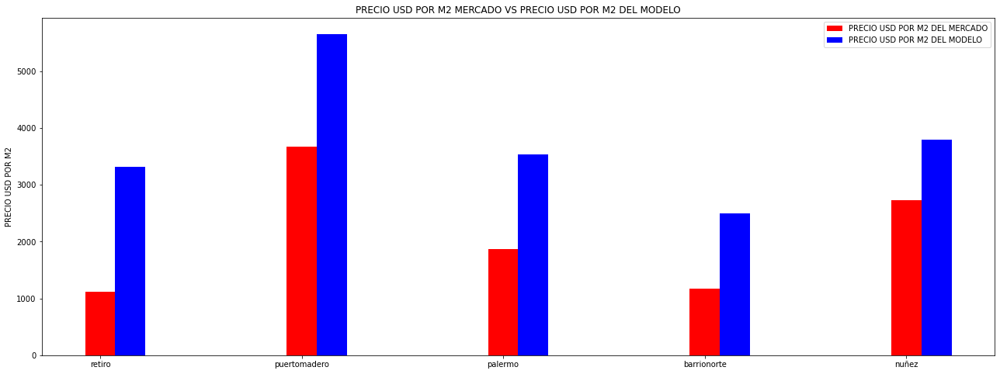

In [492]:
PRECIO_M2=dptos_subvaluados_OPORTUNIDAD_COMPRA.sort_values('RESIDUO', ascending = False)['PRECIO USD POR M2'].head().values
PRECIO_M2_PREDICHO=dptos_subvaluados_OPORTUNIDAD_COMPRA.sort_values('RESIDUO', ascending = False)['PRECIO USD POR M2 PREDICHO'].head().values
BARRIOS = dptos_subvaluados_OPORTUNIDAD_COMPRA.sort_values('RESIDUO', ascending = False)['PLACE NAME'].head().values

ind = np.arange(5) # crea la lista con numeros entre 0 y 4
width = 0.15 # ancho de las barras

fig = plt.figure(figsize=(22,8)); ax = plt.axes()
ax.bar(ind+ 0.00, PRECIO_M2, width, color='r') # barra roja. 
ax.bar(ind+ 0.15, PRECIO_M2_PREDICHO, width, color='b') # barra azul 

ax.set_ylabel('PRECIO USD POR M2'); ax.set_title('PRECIO USD POR M2 MERCADO VS PRECIO USD POR M2 DEL MODELO')
ax.set_xticks(ind); ax.set_xticklabels(BARRIOS)
ax.legend(labels=['PRECIO USD POR M2 DEL MERCADO', 'PRECIO USD POR M2 DEL MODELO'])
plt.show()

In [493]:
GANANCIA = dptos_subvaluados_OPORTUNIDAD_COMPRA.sort_values('RESIDUO', ascending = False)['GANANCIA'].head().values
BARRIOS = dptos_subvaluados_OPORTUNIDAD_COMPRA.sort_values('RESIDUO', ascending = False)['PLACE NAME'].head().values

df_visualizacion = pd.DataFrame({'POTENCIAL GANANCIA':GANANCIA,'BARRIO DEL DEPARTAMENTO':BARRIOS})
px.bar(data_frame=df_visualizacion,x='BARRIO DEL DEPARTAMENTO', y='POTENCIAL GANANCIA', title = 'GANANCIAS POTENCIALES EN DEPARTAMENTOS')

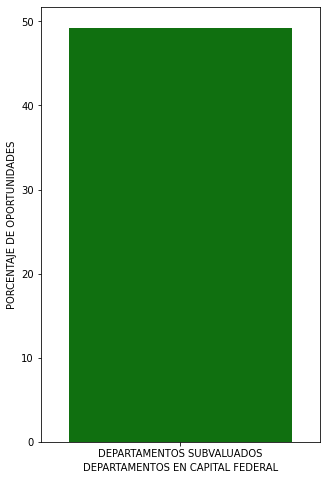

In [494]:
# PORCENTAJE DE DEPARTAMENTOS SOBREVALUADOS Y SUBVALUADOS

porcentaje_de_oportunidades=(data_capital_100_depto['RESIDUO'] > 0).sum()/data_capital_100_depto.shape[0]*100
porcentaje_de_oportunidades

a=pd.DataFrame({'PORCENTAJE DE OPORTUNIDADES':porcentaje_de_oportunidades, 'DEPARTAMENTOS EN CAPITAL FEDERAL':'DEPARTAMENTOS SUBVALUADOS'}, index=np.arange(1))
fig = plt.figure(figsize=(5,8)); ax = plt.axes()

fig=sns.barplot(data=a,x='DEPARTAMENTOS EN CAPITAL FEDERAL' , y='PORCENTAJE DE OPORTUNIDADES', color='g')